# basic progressive fitting (1 distance) and spatial tolerance function fitting (multiple distances)

1. introduce new june data from original paper
   - replicates
2. structure binding correction introduced and smart bounds placed on normalization factor
3. strict check of units
4. apparent KD fitting and RU based fitting to compare with Alan's original biacore results

$A \underset{k_{-1}}{\stackrel{k_1}{\rightleftharpoons}} B$; 

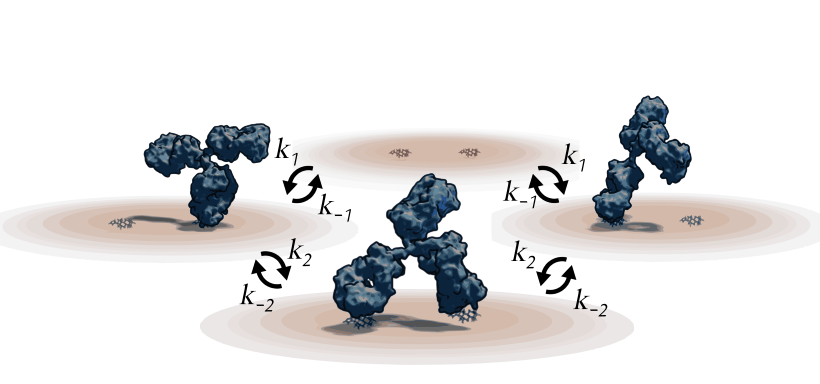

In [40]:
%matplotlib inline
import numpy as np
import fitting_lib_1_3 as mk
import os
import imp
import scipy.optimize as opt
import ipdb
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from scipy import stats
import matplotlib.cm as cm
from IPython.display import display, Markdown
import sympy
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
plt.rcParams.update(new_rc_params)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})



In [41]:
### USER PARAMETERS ###
master_name = "output_rabbit_igg_spatial_tolerance"

mono_data_source = "mono_1"

run_list_biv = np.array([    
    ['iggdig_204nm', 'bivalent_close', 2.04],
    ['iggdig_244nm', 'bivalent_close', 2.44],
    ['iggdig_3nm', 'bivalent_close', 3.6],
    ['iggdig_7nm', 'bivalent_close', 7.2],
    ['iggdig_14nm1', 'bivalent_close', 14.3],
    ['iggdig_14nm2', 'bivalent_close', 14.3],
    ['iggdig_16nm', 'bivalent_close', 16.0],
    ['iggdig_17nm', 'bivalent_close', 17.4],
    ['iggdig_21nm1', 'bivalent_close', 21],
    ['iggdig_21nm2', 'bivalent_close', 21],
    ['iggdig_21nm3', 'bivalent_close', 21],
    ['iggdig_28nm1', 'bivalent_close', 28.6],
    ['iggdig_28nm2', 'bivalent_close', 28.6],
    ['iggdig_42nm1', 'bivalent_close', 43.5],
    ['iggdig_42nm2', 'bivalent_close', 43.5],
    ['iggdig_84nm', 'bivalent_close', 84],
    ['iggdig_99nm', 'bivalent_close', 99],
])
conservative_error = np.max([1.2,1.2,1.2,1.3,1.3,1.4,1.7])
dist_errors = np.array([
    conservative_error,
    conservative_error,
    1.2,
    1.2,
    1.2,
    1.2,
    1.3,
    1.3,
    conservative_error,
    conservative_error,
    conservative_error,
    1.4,
    1.4,
    1.7,
    1.7,
    conservative_error,
    conservative_error
])
bivalent_data_source = run_list_biv[5]

RstrRmax_slope = 0.0212 # RUab/RUstr
RstrRmax_interc = 0 # RU

In [42]:
def apparent_KD(concentration, KD1, KD2):
    K_Dapp = (-1*KD2*(concentration**2-KD1**2))/(2*concentration*KD2 + KD1 + 2*KD1*KD2)
    return K_Dapp

In [43]:
### get R_struct and suggested Rmax for each item ###

In [44]:
def normalize_mono_data(run_name,struct_name):
    scaling_constant = mk.get_Rmax(struct_file_path = 'data_directory/mono_data_dig/'+struct_name+".txt", 
                            RstrRmax_slope=RstrRmax_slope, 
                            RstrRmax_interc=RstrRmax_interc)
    run_data_raw = mk.fetch_data_raw('data_directory/mono_data_dig/' + run_name+".txt")
    ### normalize here now with the Rstruct value Rmax relationship measured preivously
    run_data_mono = run_data_raw /  scaling_constant
    return run_data_mono

## progressive fitting for IgG1 dig - basic case

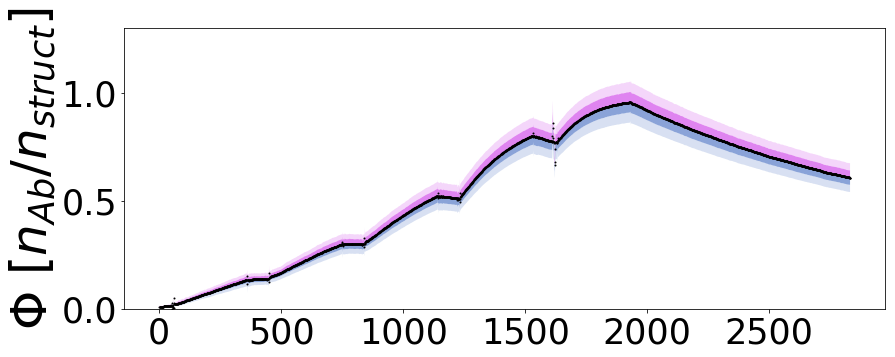

In [102]:
### revisions ####
# investigating parameterization using monovalent run replicates to get confidence intervals for the input data
output_directory = master_name+"/OUTPUT_rawsprplots"  # save spr plots into a raw spr plot directory
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
plt.rc('xtick', labelsize=35) 
plt.rc('ytick', labelsize=35) 
plt.rcParams.update({'font.size': 50})

plt.figure(figsize=(30,30))

plt.subplot(521)
set_of_runs = []
set_of_runs += [normalize_mono_data("mono_1", "mono_struct_1")]
set_of_runs += [normalize_mono_data("mono_2", "mono_struct_2")]
set_of_runs += [normalize_mono_data("pmono_1", "pmono_struct_1")]
set_of_runs += [normalize_mono_data("pmono_2", "pmono_struct_2")]
set_of_runs += [normalize_mono_data("pmono_3", "pmono_struct_3")]
set_of_runs += [normalize_mono_data("pmono_4", "pmono_struct_4")]
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.ylim(0,1.3)



run_length = np.min([len(i) for i in set_of_runs])
average_run = np.zeros(run_length)
lower_68_run = np.zeros(run_length)
upper_68_run = np.zeros(run_length)
lower_95_run = np.zeros(run_length)
upper_95_run = np.zeros(run_length)
N = len(set_of_runs)
t = range(0, len(average_run))
for i in range(0,run_length):
    sum_i = 0
    for run in set_of_runs:
        sum_i += run[i]
    average_run[i] = sum_i/N        
    diff_i = 0
    for run in set_of_runs:
        diff_i += (run[i] - average_run[i])**2
    var_i = diff_i/(N-1)
    stdev_i = (var_i**.5)/N**.5
    
    lower_68_run[i] = average_run[i]-stdev_i
    upper_68_run[i] = average_run[i]+stdev_i
    lower_95_run[i] = average_run[i]-stdev_i*2
    upper_95_run[i] = average_run[i]+stdev_i*2
    
plt.fill_between(t, 0, lower_95_run, facecolor="white", alpha=1)
plt.fill_between(t, lower_95_run, lower_68_run, facecolor="#3d66bf", alpha=.2)
plt.fill_between(t, lower_68_run, average_run, facecolor="#3d66bf", alpha=.6)
plt.fill_between(t, average_run, upper_68_run, facecolor="#cb32e6", alpha=.6)
plt.fill_between(t,  upper_68_run, upper_95_run, facecolor="#cb32e6", alpha=.2)


# for run in set_of_runs:
#     plt.scatter(range(0,len(run)), run, alpha = .33, s = .1, c = "black")
plt.scatter(t, average_run, alpha = 1, s = 1, c = "black")
plt.savefig(output_directory+"/ raw_"+master_name+"_monoplot_multiple_struct_normalized.svg")
plt.show()

### let's save a text file with the upper and lower results
with open(os.getcwd()+"/data_directory/mono_data_dig/OUTPUT_rawsprplots_upper_68.txt", 'w') as f:
    for s in upper_68_run:
        f.write(str(s) + '\n')
with open(os.getcwd()+"/data_directory/mono_data_dig/OUTPUT_rawsprplots_lower_68.txt", 'w') as f:
    for s in lower_68_run:
        f.write(str(s) + '\n')     
with open(os.getcwd()+"/data_directory/mono_data_dig/OUTPUT_rawsprplots_upper_95.txt", 'w') as f:
    for s in upper_95_run:
        f.write(str(s) + '\n')
with open(os.getcwd()+"/data_directory/mono_data_dig/OUTPUT_rawsprplots_lower_95.txt", 'w') as f:
    for s in lower_95_run:
        f.write(str(s) + '\n')             
with open(os.getcwd()+"/data_directory/mono_data_dig/OUTPUT_rawsprplots_mean.txt", 'w') as f:
    for s in average_run:
        f.write(str(s) + '\n')         

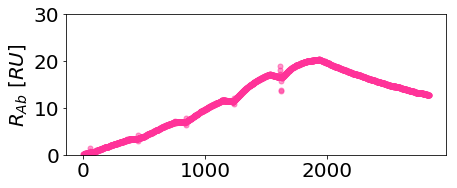

<Figure size 432x288 with 0 Axes>

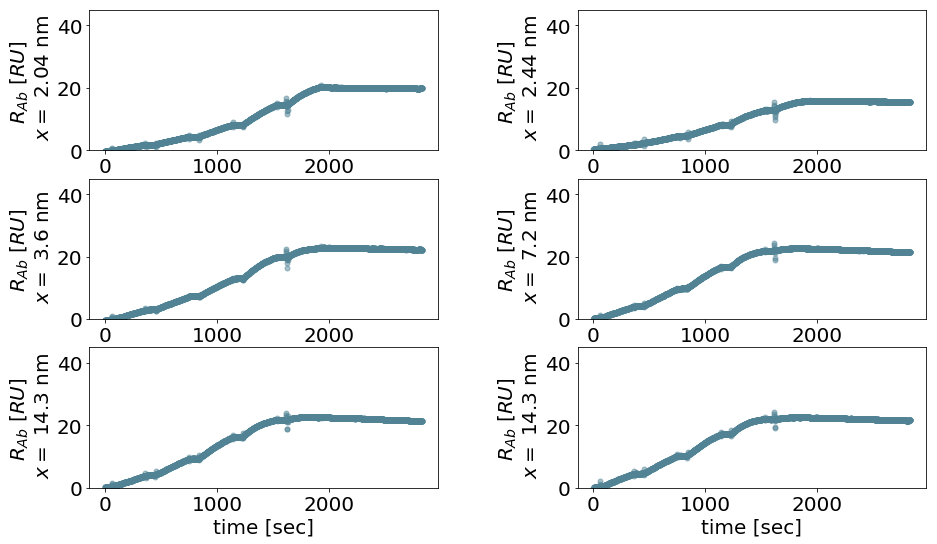

<Figure size 432x288 with 0 Axes>

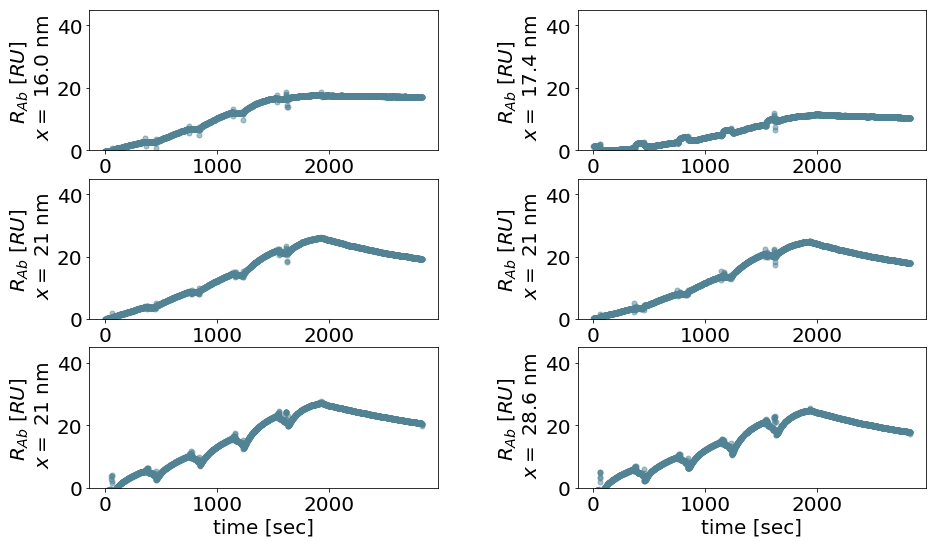

<Figure size 432x288 with 0 Axes>

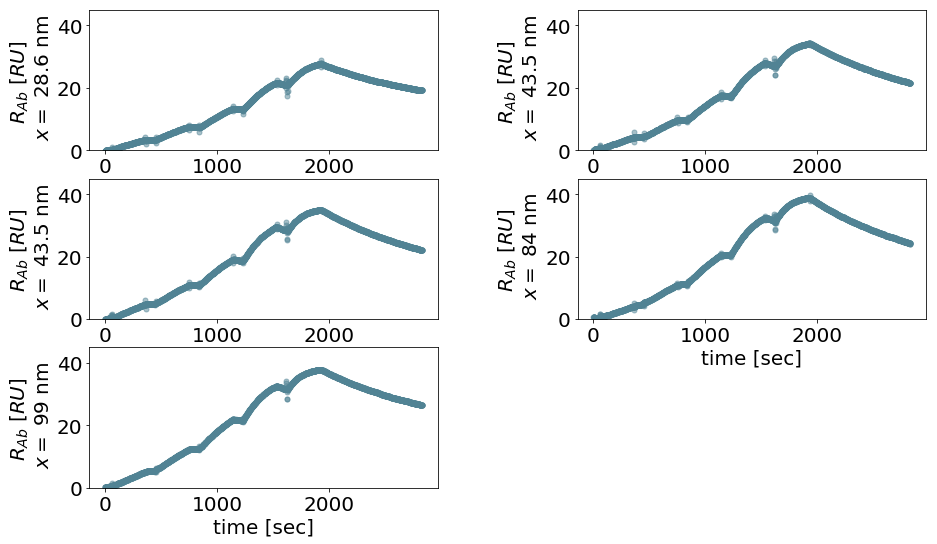

In [46]:
output_directory = master_name+"/OUTPUT_rawsprplots"  # save spr plots into a raw spr plot directory
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20) 
plt.rcParams.update({'font.size': 20})        
        
plt.figure(figsize=(15,15))
mono_run = list(pd.read_csv('data_directory/mono_data_dig/'+mono_data_source+".txt", sep="\t", header=None)[0])
plt.subplot(521)
plt.scatter(range(0, len(mono_run)), mono_run, alpha = 0.5, s = 25, c = "#ff3399")
plt.ylabel("$R_{Ab}$ $[RU]$")
plt.ylim(0,30)
plt.savefig(output_directory+"/ raw_"+master_name+"_monoplot.svg")
plt.show()

plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2

### save plots of the bivalent runs of different distances ###
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(0,6):
    run_data = list(pd.read_csv('data_directory/august_2018_iggdig_data/'+run_list_biv[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("$R_{Ab}$ $[RU]$ \n $x = $ %s"% run_list_biv[i][2] + " nm")
    plt.xlabel("time [sec]")
    plt.ylim(0,45)

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots1.svg")
plt.show()
plt.close()

plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2

### save plots of the bivalent runs of different distances ###
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(6,12):
    run_data = list(pd.read_csv('data_directory/august_2018_iggdig_data/'+run_list_biv[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i-6
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("$R_{Ab}$ $[RU]$ \n $x = $ %s"% run_list_biv[i][2] + " nm")
    plt.xlabel("time [sec]")
    plt.ylim(0,45)

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots2.svg")
plt.show()
plt.close()
plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2
### save plots of the bivalent runs of different distances ###
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(12,len(run_list_biv)):
    run_data = list(pd.read_csv('data_directory/august_2018_iggdig_data/'+run_list_biv[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i-12
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("$R_{Ab}$ $[RU]$ \n $x = $ %s"% run_list_biv[i][2] + " nm")
    plt.xlabel("time [sec]")
    plt.ylim(0,45)

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots2.svg")
plt.show()
plt.close()

### estimating monovalent rates (lower 95% confidence interval bound on input data)

('K_D1_guess = ', 6.229918044362784e-11)


<Figure size 432x288 with 0 Axes>

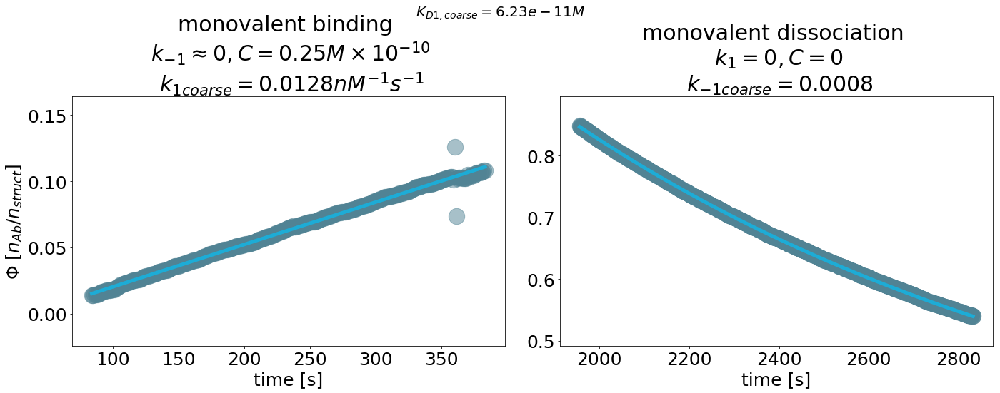

$${\huge K_{D1,coarse}=6.229918044362784e-11M \huge}$$

In [47]:
imp.reload(mk)
output_directory = master_name+"/OUTPUT_monovalent_coarse_fitting"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
if not os.path.exists(master_name+"/pickle_directory"):
            os.makedirs(master_name+"/pickle_directory")
        
time_points = np.array([0, 84, 384, 475, 775, 866, 1166, 1257, 1557, 1656, 1956])
concentrations = np.array([0, 0.025, 0, 0.05, 0, 0.1, 0, .25, 0, .5, 0]) # nM e-9

##########################
run_data_mono = lower_95_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_glower95, k_off_glower95 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guesslower95 = k_off_glower95 / (k_on_glower95*10**9)
print("K_D1_guess = ", KD1_guesslower95)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_glower95,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_glower95),5)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guesslower95, fontsize=20)
plt.savefig(output_directory+"/monovalent_guesslower95.svg")

plt.tight_layout()
plt.show()
plt.close()

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guesslower95)+"M \huge}$$"))




### estimating monovalent rates (lower 68% confidence interval bound on input data)

('K_D1_guess = ', 5.801321207198501e-11)


<Figure size 432x288 with 0 Axes>

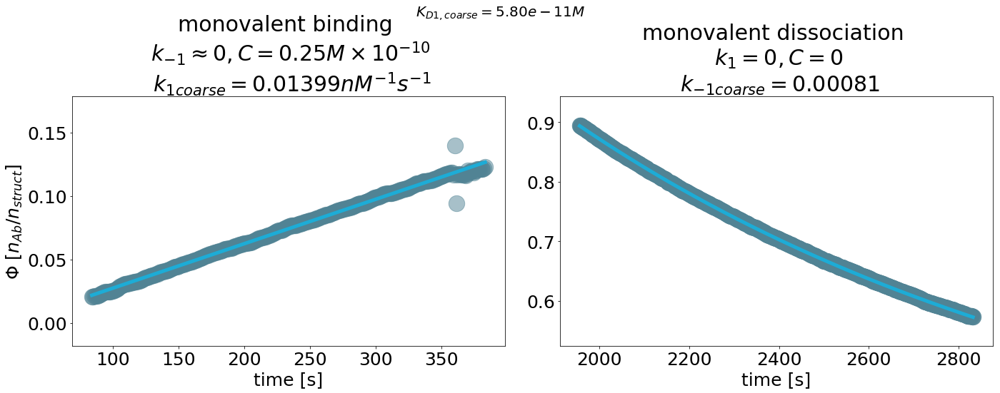

$${\huge K_{D1,coarse}=5.801321207198501e-11M \huge}$$

In [48]:
imp.reload(mk)
output_directory = master_name+"/OUTPUT_monovalent_coarse_fitting"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
if not os.path.exists(master_name+"/pickle_directory"):
            os.makedirs(master_name+"/pickle_directory")
        
time_points = np.array([0, 84, 384, 475, 775, 866, 1166, 1257, 1557, 1656, 1956])
concentrations = np.array([0, 0.025, 0, 0.05, 0, 0.1, 0, .25, 0, .5, 0]) # nM e-9

##########################
run_data_mono = lower_68_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_glower68, k_off_glower68 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guesslower68 = k_off_glower68 / (k_on_glower68*10**9)
print("K_D1_guess = ", KD1_guesslower68)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_glower68,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_glower68),5)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guesslower68, fontsize=20)
plt.savefig(output_directory+"/monovalent_guesslower68.svg")

plt.tight_layout()
plt.show()
plt.close()

# plt.figure(figsize=(20,5))
# plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
# plt.ylim(0,1)

# plt.ylabel("$R_{Ab}$ $[RU]$")
# plt.xlabel("time [s]")
# plt.savefig(output_directory+"/monovalent_spr_curve_lower68.svg")
# plt.show()
# plt.close()

# import pickle as pkl
# pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, run_list_biv,
#           t1, t2, run_data1,run_data2,
#           k_on_glower68, k_off_glower68,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guesslower68          
#          ], open(master_name+'/pickle_directory/guess_on_rateslower68.pickle', 'wb'))

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guesslower68)+"M \huge}$$"))




### estimating monovalent rates (upper 95% confidence interval bound on input data)

('K_D1_guess = ', 4.826268907570158e-11)


<Figure size 432x288 with 0 Axes>

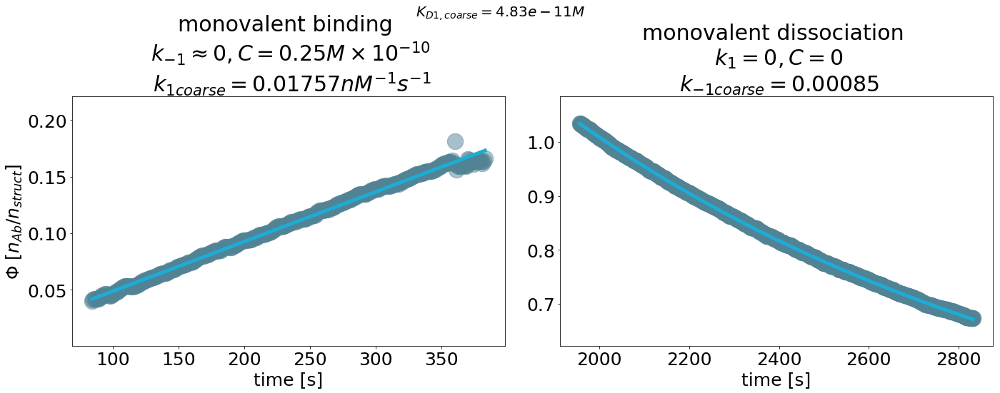

$${\huge K_{D1,coarse}=4.826268907570158e-11M \huge}$$

In [49]:

##########################
run_data_mono = upper_95_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_gupper95, k_off_gupper95 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guessupper95 = k_off_gupper95 / (k_on_gupper95*10**9)
print("K_D1_guess = ", KD1_guessupper95)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_gupper95,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_gupper95),5)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guessupper95, fontsize=20)
plt.savefig(output_directory+"/monovalent_guessupper95.svg")

plt.tight_layout()
plt.show()
plt.close()

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guessupper95)+"M \huge}$$"))

### estimating monovalent rates (upper 68% confidence interval bound on input data)

('K_D1_guess = ', 5.1099725335980834e-11)


<Figure size 432x288 with 0 Axes>

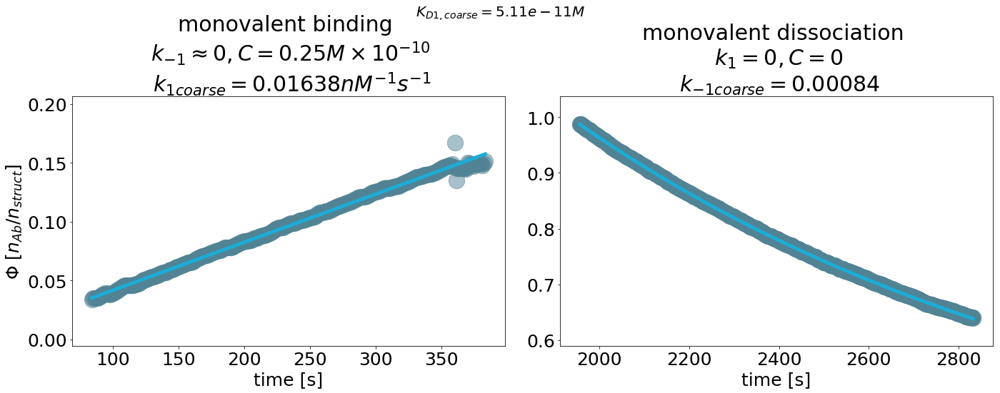

$${\huge K_{D1,coarse}=5.1099725335980834e-11M \huge}$$

In [50]:

##########################
run_data_mono = upper_68_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_gupper68, k_off_gupper68 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guessupper68 = k_off_gupper68 / (k_on_gupper68*10**9)
print("K_D1_guess = ", KD1_guessupper68)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_gupper68,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_gupper68),5)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guessupper68, fontsize=20)
plt.savefig(output_directory+"/monovalent_guessupper68.svg")

plt.tight_layout()
plt.show()
plt.close()

# plt.figure(figsize=(20,5))
# plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
# plt.ylim(0,1)

# plt.ylabel("$R_{Ab}$ $[RU]$")
# plt.xlabel("time [s]")
# plt.savefig(output_directory+"/monovalent_spr_curve_.svg")
# plt.show()
# plt.close()

# import pickle as pkl
# pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, run_list_biv,
#           t1, t2, run_data1,run_data2,
#           k_on_gupper68, k_off_gupper68,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guessupper68          
#          ], open(master_name+'/pickle_directory/guess_on_rates.pickle', 'wb'))

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guessupper68)+"M \huge}$$"))

### estimating monovalent rates (mean confidence interval on input data)

('K_D1_guess = ', 5.4320209938113543e-11)


<Figure size 432x288 with 0 Axes>

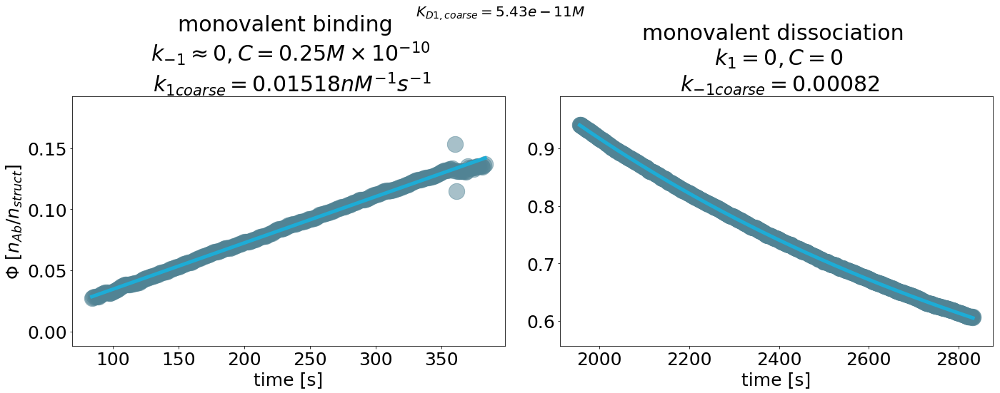

$${\huge K_{D1,coarse}=5.4320209938113543e-11M \huge}$$

In [51]:

##########################
run_data_mono = average_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_gmean, k_off_gmean = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guessmean = k_off_gmean / (k_on_gmean*10**9)
print("K_D1_guess = ", KD1_guessmean)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_gmean,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_gmean),5)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guessmean, fontsize=20)
plt.savefig(output_directory+"/monovalent_guessmean.svg")

plt.tight_layout()
plt.show()
plt.close()

# plt.figure(figsize=(20,5))
# plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
# plt.ylim(0,1)

# plt.ylabel("$R_{Ab}$ $[RU]$")
# plt.xlabel("time [s]")
# plt.savefig(output_directory+"/monovalent_spr_curve_.svg")
# plt.show()
# plt.close()

# import pickle as pkl
# pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, run_list_biv,
#           t1, t2, run_data1,run_data2,
#           k_on_gmean, k_off_gmean,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guessmean          
#          ], open(master_name+'/pickle_directory/guess_on_rates.pickle', 'wb'))

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guessmean)+"M \huge}$$"))

In [52]:
# import pickle as pkl
# scaling_constant, time_points,  concentrations, \
# run_data_mono,run_list_biv, t1, t2, run_data1,run_data2,k_on_g, \
# k_off_g,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guess = \
#     pkl.load(open(master_name+'/pickle_directory/guess_on_rates.pickle', 'rb'))

## monovalent fine fit - simulated annealing mean run



('(fit_annealing) variable parameter: ', array([1.51824140e-02, 8.24711913e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.81865917, -3.08369773,  0.        ]))
basinhopping step 0: f 13.171
basinhopping step 1: f 13.171 trial_f 13.171 accepted 1  lowest_f 13.171
('OUTPUT_rawsprplots_mean', [-1.7147498171633986, -3.2776220595042727, -2.753981408173086e-07])


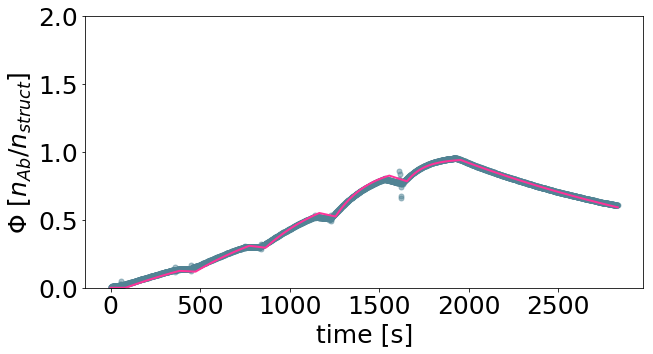

[1.92863562e-02 5.27688878e-04 9.99999366e-01]


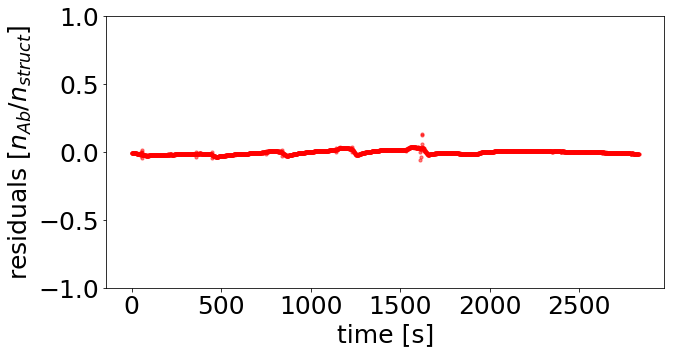

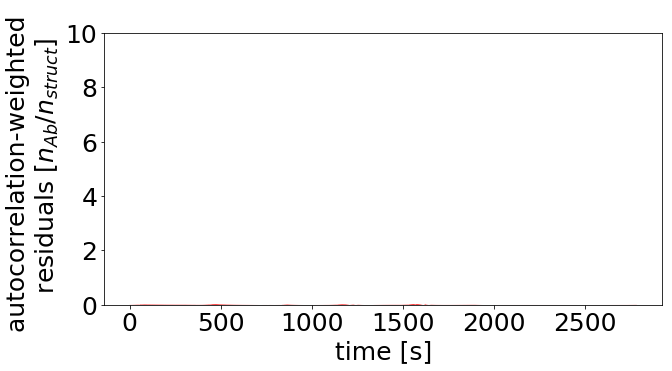

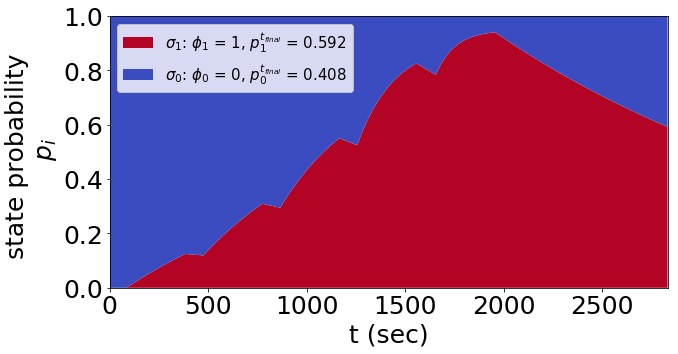

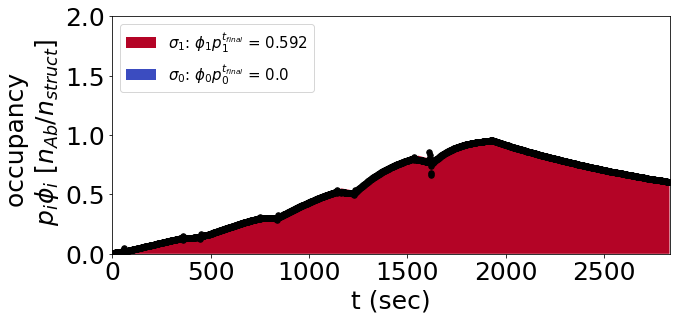

[array([-1.71474982e+00, -3.27762206e+00, -2.75398141e-07])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=2.7360734865529026e-11M \huge}$$

('kon, koff:', 19286356.170950588, 0.0005276888777155386)


In [53]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_mean"
output_dir = master_name+"/output_monovalent_fine_fitting_mean"
k_on_g, k_off_g = k_on_gmean, k_off_gmean
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mono_data_dig/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mono_data_dig/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on, k_off, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1 = k_off /(k_on*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1)+"M \huge}$$"))
print("kon, koff:",k_on*10**9, k_off)

## mono fine upper95 run

('(fit_annealing) variable parameter: ', array([1.75690298e-02, 8.47928624e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.75525222, -3.0716407 ,  0.        ]))
basinhopping step 0: f 21.6226
basinhopping step 1: f 21.6226 trial_f 21.6226 accepted 1  lowest_f 21.6226
('OUTPUT_rawsprplots_upper_95', [-1.6929896289538704, -3.2885722839445326, 0.037106823102265915])


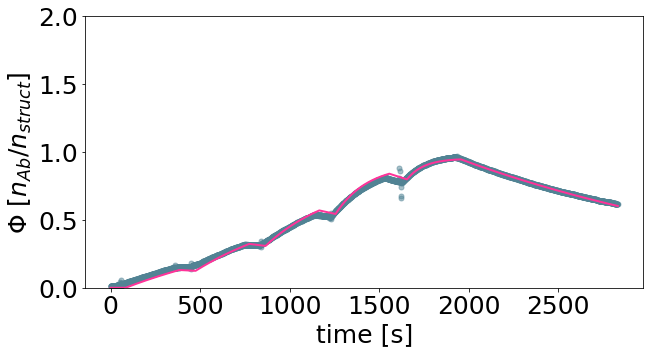

[2.02773114e-02 5.14550158e-04 1.08919797e+00]


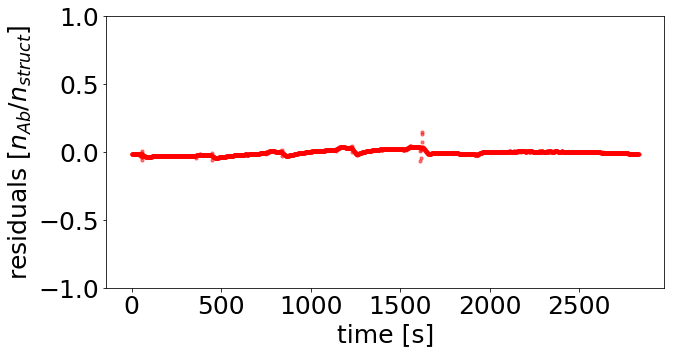

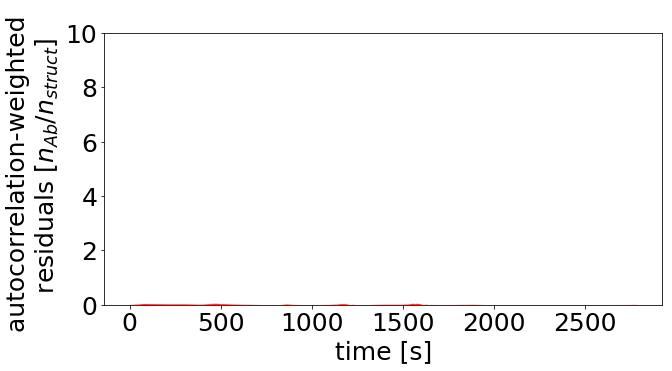

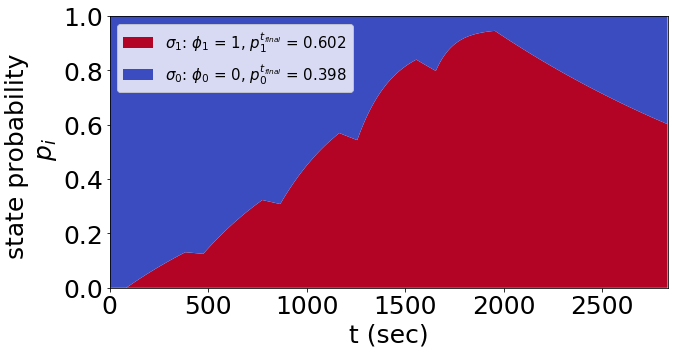

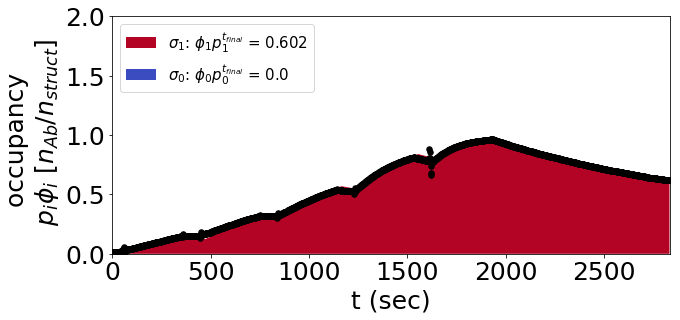

[array([-1.69298963, -3.28857228,  0.03710682])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=2.5375659900650716e-11M \huge}$$

('kon, koff:', 20277311.416012056, 0.0005145501581923041)


In [54]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_upper_95"
output_dir = master_name+"/output_monovalent_fine_fitting_upper95"
k_on_g, k_off_g = k_on_gupper95, k_off_gupper95
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mono_data_dig/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mono_data_dig/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on, k_off, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1 = k_off /(k_on*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1)+"M \huge}$$"))
print("kon, koff:",k_on*10**9, k_off)

## mono fine upper68 run

('(fit_annealing) variable parameter: ', array([1.63757219e-02, 8.36794891e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.78579955, -3.07738098,  0.        ]))
basinhopping step 0: f 17.1705
basinhopping step 1: f 17.1705 trial_f 17.1705 accepted 1  lowest_f 17.1705
('OUTPUT_rawsprplots_upper_68', [-1.703400972843045, -3.283335760612994, 0.01891975937775016])


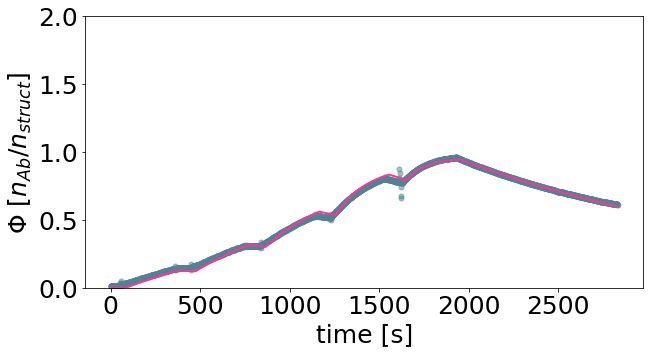

[1.97969838e-02 5.20791922e-04 1.04452721e+00]


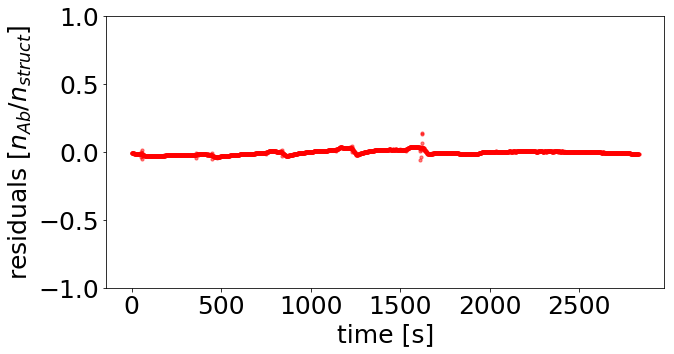

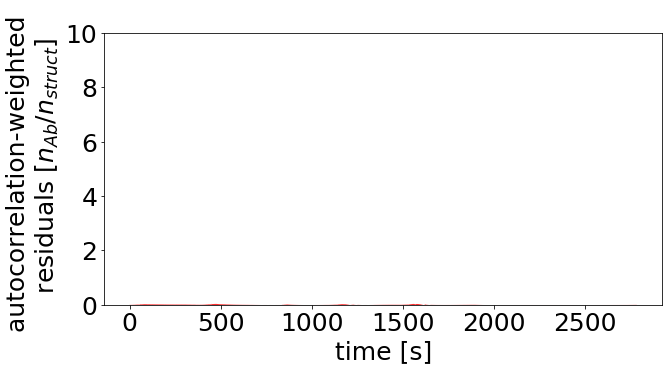

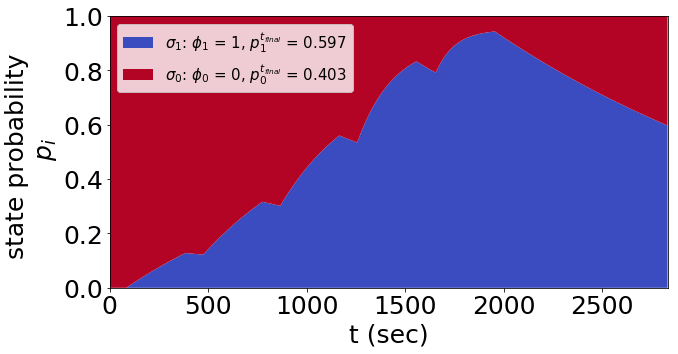

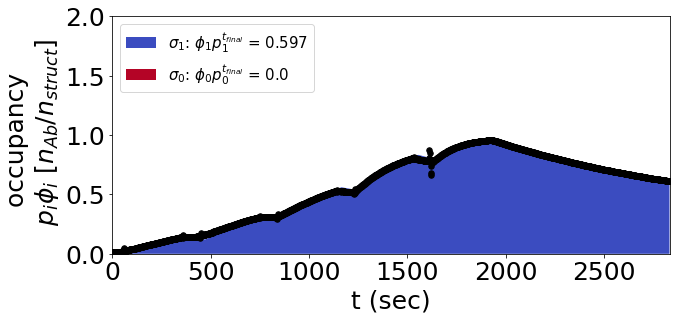

[array([-1.70340097, -3.28333576,  0.01891976])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=2.6306629739341567e-11M \huge}$$

('kon, koff:', 19796983.77543057, 0.0005207919221360043)


In [55]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_upper_68"
output_dir = master_name+"/output_monovalent_fine_fitting_upper68"
k_on_g, k_off_g = k_on_gupper68, k_off_gupper68
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mono_data_dig/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mono_data_dig/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on, k_off, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1 = k_off /(k_on*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1)+"M \huge}$$"))
print("kon, koff:",k_on*10**9, k_off)

## mono fine lower 95 run

('(fit_annealing) variable parameter: ', array([1.27957981e-02, 7.97167733e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.89293262, -3.09845029,  0.        ]))
basinhopping step 0: f 7.54059
basinhopping step 1: f 7.54059 trial_f 7.54059 accepted 1  lowest_f 7.54059
found new global minimum on step 1 with function value 7.54059
('OUTPUT_rawsprplots_lower_95', [-1.7403254676589235, -3.2644029131640466, -0.040324229676800584])


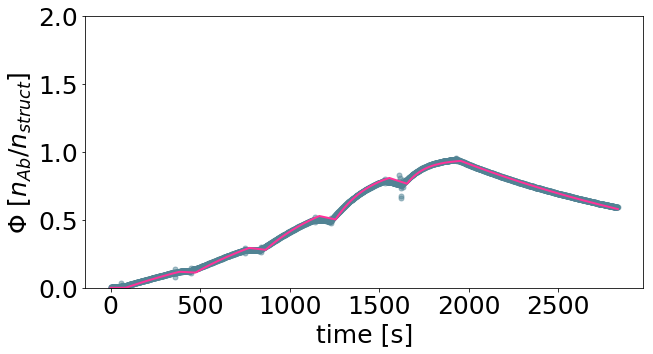

[1.81833765e-02 5.43997729e-04 9.11330217e-01]


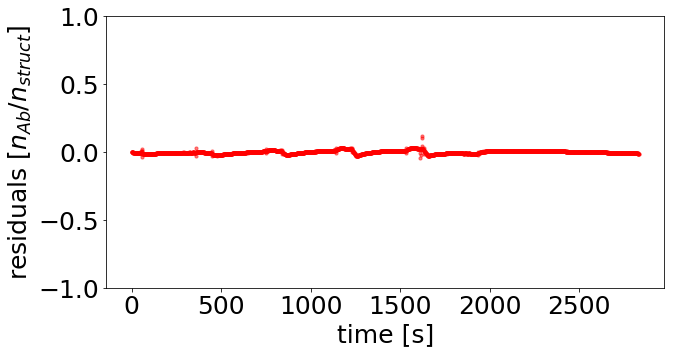

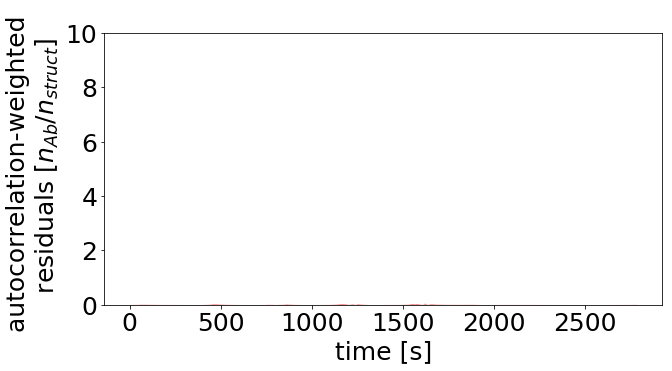

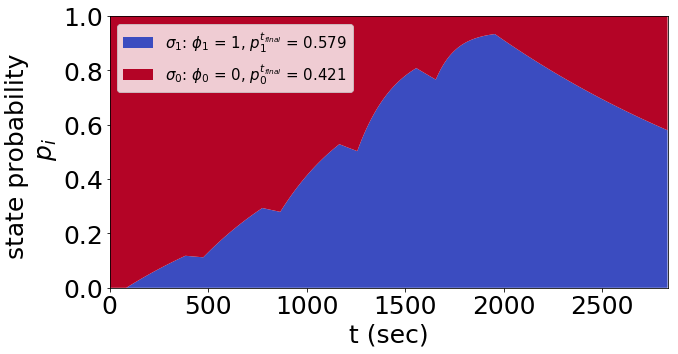

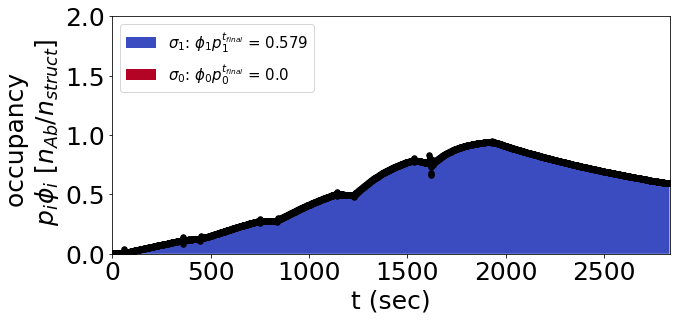

[array([-1.74032547, -3.26440291, -0.04032423])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=2.991731088992796e-11M \huge}$$

('kon, koff:', 18183376.54756445, 0.0005439977292021105)


In [56]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_lower_95"
output_dir = master_name+"/output_monovalent_fine_fitting_lower95"
k_on_g, k_off_g = k_on_glower95, k_off_glower95
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mono_data_dig/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mono_data_dig/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on, k_off, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1 = k_off /(k_on*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1)+"M \huge}$$"))
print("kon, koff:",k_on*10**9, k_off)

## mono fine lower 68 run

('(fit_annealing) variable parameter: ', array([1.39891060e-02, 8.11552974e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.85421004, -3.09068313,  0.        ]))
basinhopping step 0: f 9.85282
basinhopping step 1: f 9.85282 trial_f 9.85282 accepted 1  lowest_f 9.85282
found new global minimum on step 1 with function value 9.85282
('OUTPUT_rawsprplots_lower_68', [-1.7265274156076085, -3.2716267516771564, -0.019880880421281475])


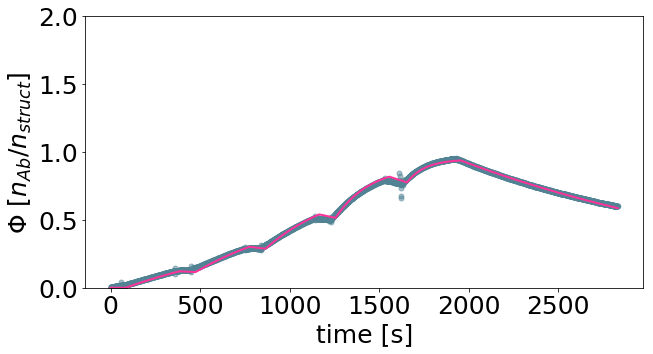

[1.87703592e-02 5.35023981e-04 9.55254560e-01]


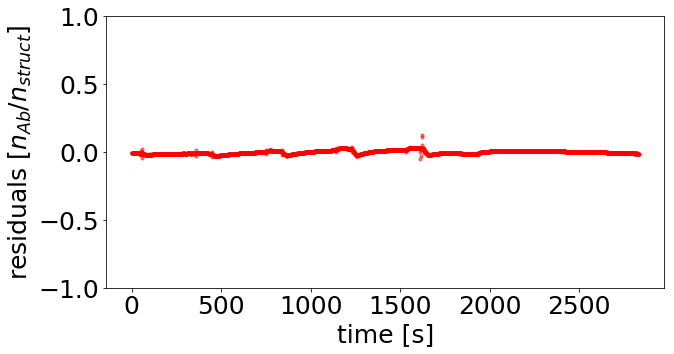

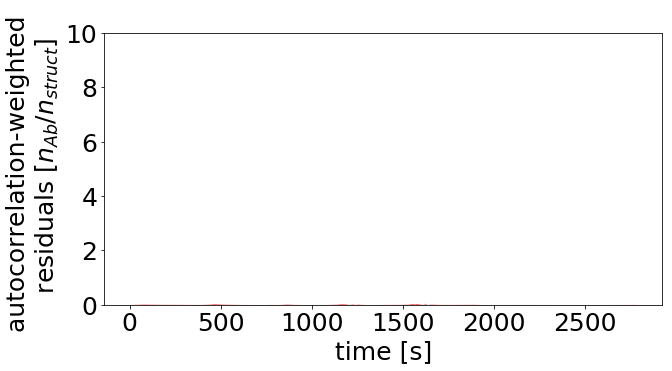

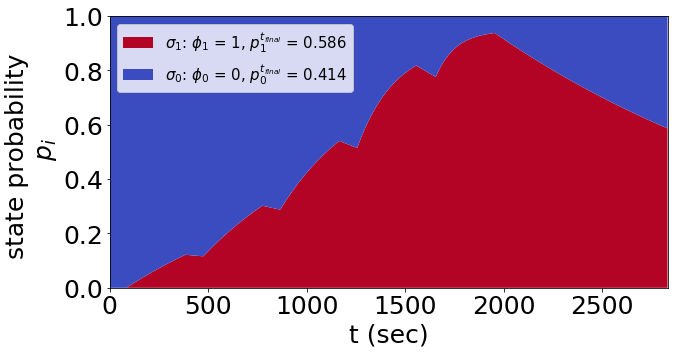

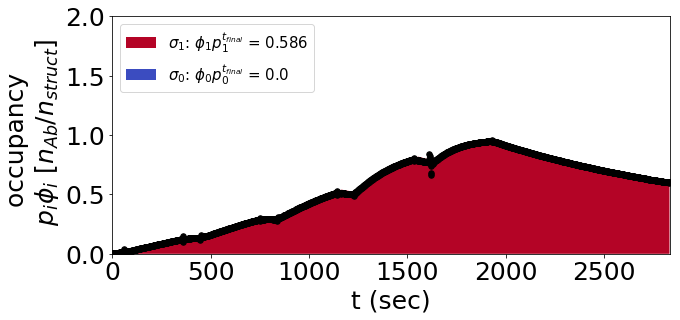

[array([-1.72652742, -3.27162675, -0.01988088])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=2.850366229373065e-11M \huge}$$

('kon, koff:', 18770359.234210774, 0.0005350239807439526)


In [57]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_lower_68"
output_dir = master_name+"/output_monovalent_fine_fitting_lower68"
k_on_g, k_off_g = k_on_glower68, k_off_glower68
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mono_data_dig/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mono_data_dig/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on, k_off, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1 = k_off /(k_on*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1)+"M \huge}$$"))
print("kon, koff:",k_on*10**9, k_off)

In [58]:
# import pickle as pkl
# xopt_compilation, \
#           k_on, k_off, norm1,origami_1,KD1 = \
#     pkl.load(open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'rb'))

[0.00142102 0.00084685 0.03916   ]

## bivalent fit - average KD1 bound

(0.001689336284608581, 0.000600366057061402, 17.904803732090443)

('(fit_annealing) variable parameter: ', array([ 1.        ,  1.        , 18.35676074]), 'log10 variable parameter: ', array([0.        , 0.        , 1.26379605]))
basinhopping step 0: f 10.6333
basinhopping step 1: f 8.77458 trial_f 8.77458 accepted 1  lowest_f 8.77458
found new global minimum on step 1 with function value 8.77458
('iggdig_14nm2', [-1.5471351586462445, -3.87443671712836, 1.338941606829469])


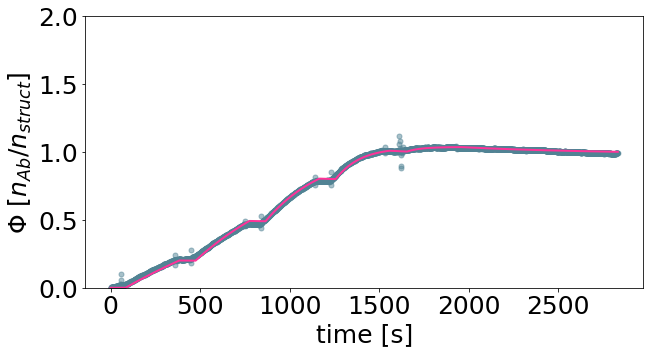

[2.83703596e-02 1.33525214e-04 2.18243645e+01]


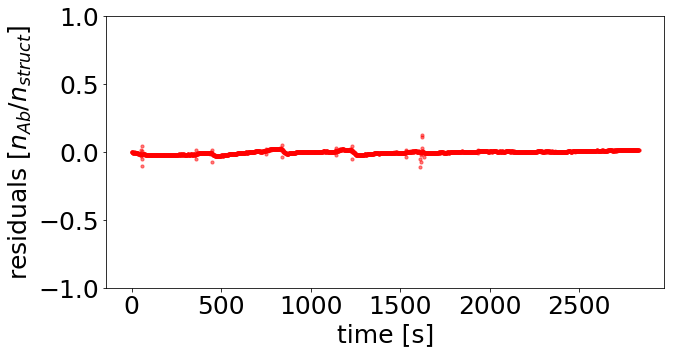

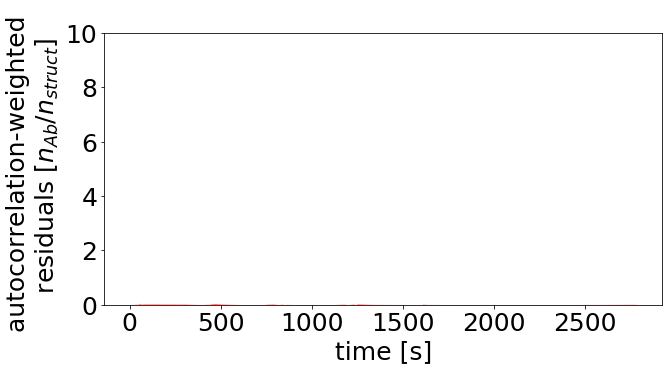

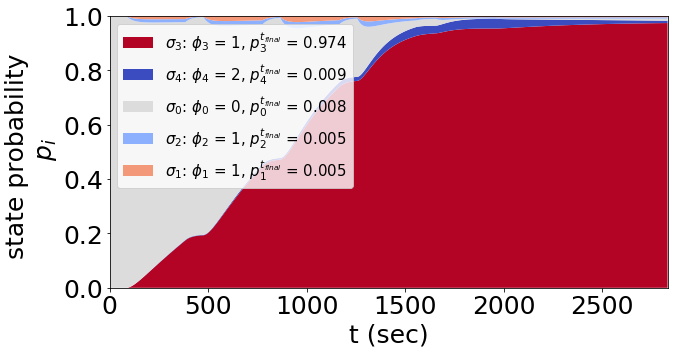

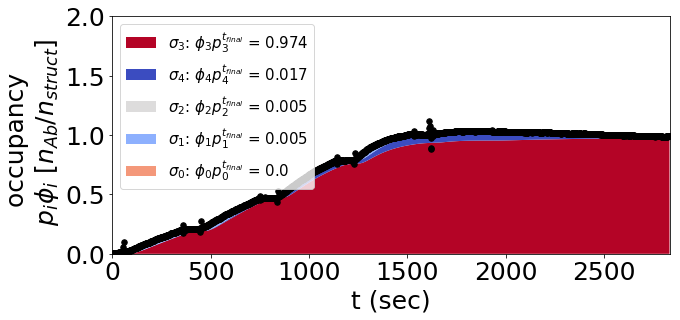

[array([-1.54713516, -3.87443672,  1.33894161])]


$${\large K_{D2}=0.004706504101783698\large}$$

$${\large K_{Dapp} = -9.964028828064854e-13\large}$$

<Figure size 360x144 with 0 Axes>

In [59]:
imp.reload(mk)

output_dir = master_name+"/output_bivalent_fine_fitting_mean"
k_on_g, k_off_g = k_on_gmean, k_off_gmean
origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv_3param", 
    mono_rates = np.array([k_on_g, k_off_g]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None,
    output_dir = output_dir,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' ,
    k_monobiv = 1,
    k_bivmono = 1,)
# origami_2.set_bounds(((-9,9),(np.log10(17),np.log10(20))))
origami_2.set_bounds(((-6,2),(-6,2),(np.log10(17),np.log10(20))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
# KD_biv, norm_2 = xopt_pow[0][0], xopt_pow[0][1]
# logKD_biv, lognorm_2 =xopt_compilation_2[0][0], xopt_compilation_2[0][1]
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

# pkl.dump([xopt_compilation_2, 
#           origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv     , lognorm_2  
#          ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))

Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))

plt.figure(figsize=(5,2))
plt.suptitle("${K_{D2,fine}=%.2e M}$"%KD_biv, fontsize=34)
plt.savefig(output_dir+"/KD2_value_fine.svg")
plt.show()
plt.close()



## bivalent fit - upper68 KD1 bound

('(fit_annealing) variable parameter: ', array([ 1.        ,  1.        , 18.35676074]), 'log10 variable parameter: ', array([0.        , 0.        , 1.26379605]))
basinhopping step 0: f 10.0104
basinhopping step 1: f 10.0123 trial_f 10.0123 accepted 1  lowest_f 10.0104
('iggdig_14nm2', [-1.9340441368122627, -4.315578369785878, 1.3287419615801177])


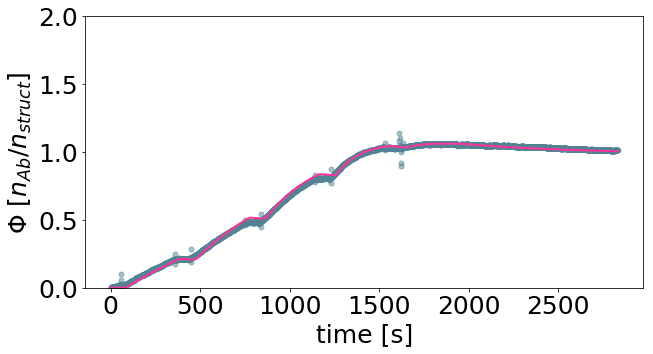

[1.16400773e-02 4.83528002e-05 2.13177793e+01]


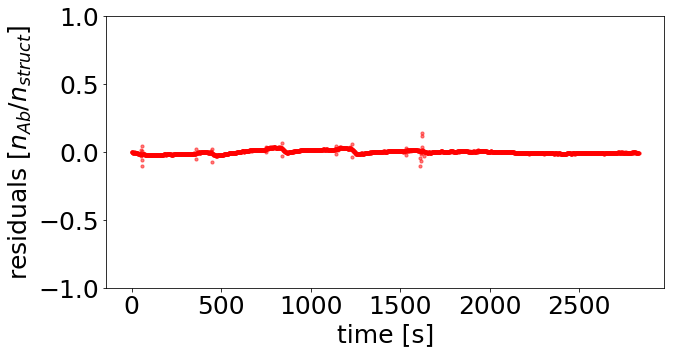

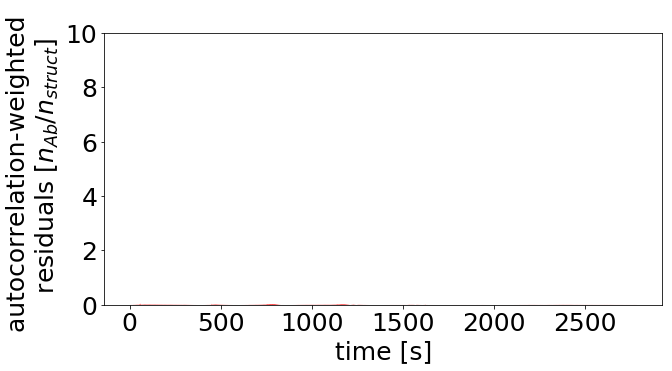

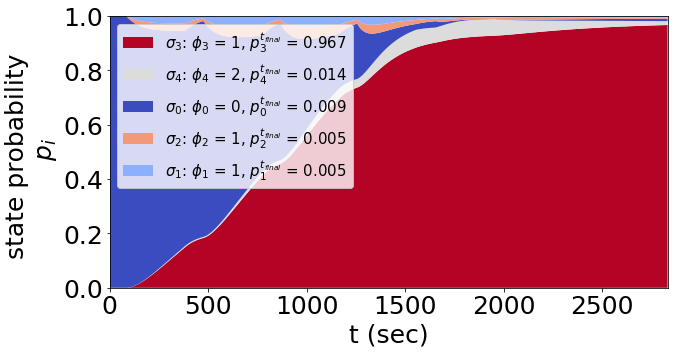

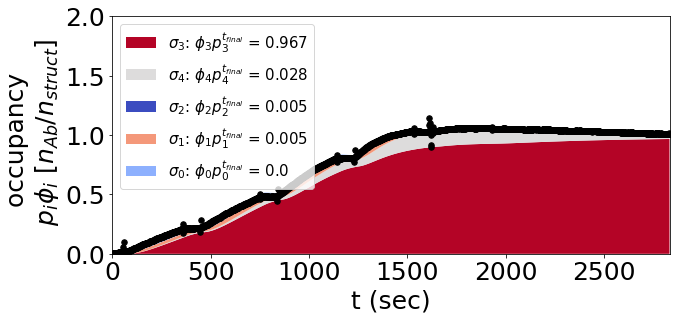

[array([-1.93404414, -4.31557837,  1.32874196])]


$${\large K_{D2}=0.004153993063773575\large}$$

$${\large K_{Dapp} = -8.831488487375099e-13\large}$$

<Figure size 360x144 with 0 Axes>

In [60]:
imp.reload(mk)
output_dir = master_name+"/output_bivalent_fine_fitting_upper68"
k_on_g, k_off_g = k_on_gupper68, k_off_gupper68
origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv_3param", 
    mono_rates = np.array([k_on_g, k_off_g]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None,
    output_dir = output_dir,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' ,
    k_monobiv = 1,
    k_bivmono = 1,)
# origami_2.set_bounds(((-9,9),(np.log10(17),np.log10(20))))
origami_2.set_bounds(((-6,2),(-6,2),(np.log10(17),np.log10(20))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
# KD_biv, norm_2 = xopt_pow[0][0], xopt_pow[0][1]
# logKD_biv, lognorm_2 =xopt_compilation_2[0][0], xopt_compilation_2[0][1]
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

# pkl.dump([xopt_compilation_2, 
#           origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv     , lognorm_2  
#          ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))

Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D2,fine}=%.2e M}$"%KD_biv, fontsize=34)
plt.savefig(output_dir+"/KD2_value_fine.svg")
plt.show()
plt.close()

## bivalent fit - lower68 KD1

('(fit_annealing) variable parameter: ', array([ 1.        ,  1.        , 18.35676074]), 'log10 variable parameter: ', array([0.        , 0.        , 1.26379605]))
basinhopping step 0: f 10.026
basinhopping step 1: f 10.026 trial_f 10.026 accepted 1  lowest_f 10.026
('iggdig_14nm2', [-1.9266107377371815, -4.260029814926894, 1.3281825655107766])


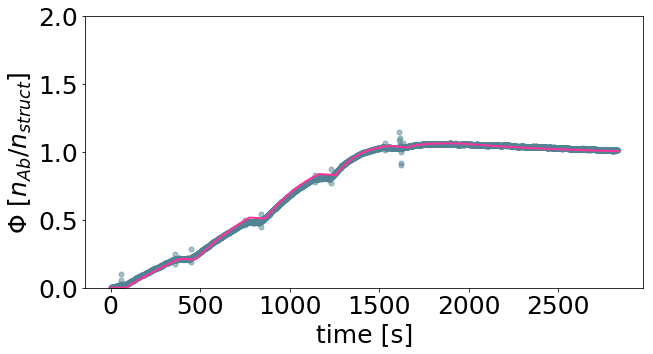

[1.18410240e-02 5.49503148e-05 2.12903385e+01]


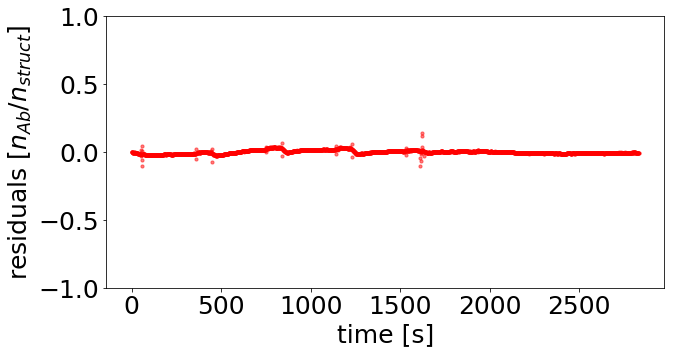

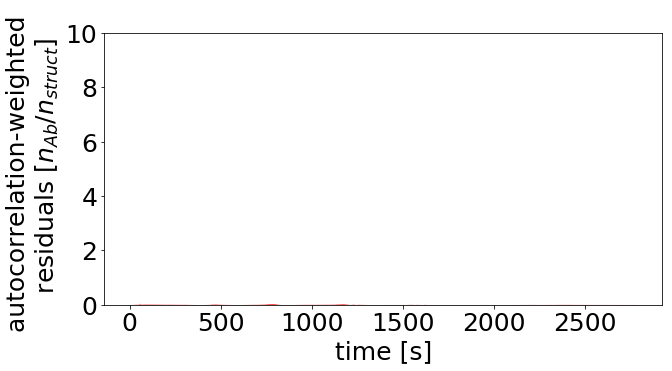

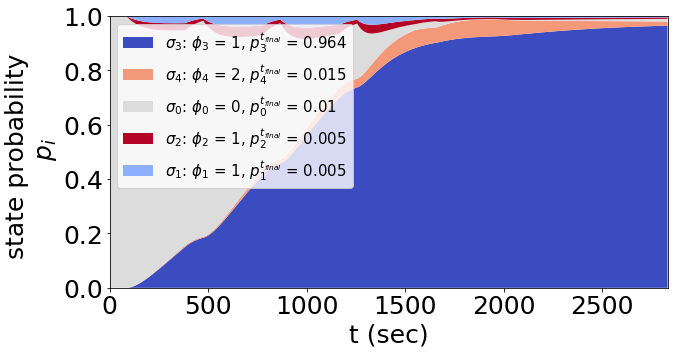

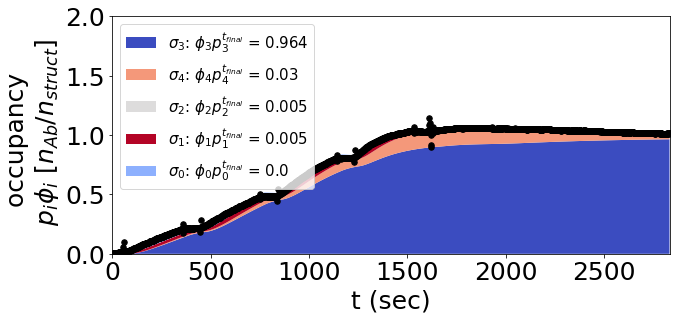

[array([-1.92661074, -4.26002981,  1.32818257])]


$${\large K_{D2}=0.004640672523464646\large}$$

$${\large K_{Dapp} = -9.829587370139223e-13\large}$$

<Figure size 360x144 with 0 Axes>

In [61]:
imp.reload(mk)

output_dir = master_name+"/output_bivalent_fine_fitting_lower68"
k_on_g, k_off_g = k_on_gupper68, k_off_glower68
origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv_3param", 
    mono_rates = np.array([k_on_g, k_off_g]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None,
    output_dir = output_dir,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' ,
    k_monobiv = 1,
    k_bivmono = 1,)
# origami_2.set_bounds(((-9,9),(np.log10(17),np.log10(20))))
origami_2.set_bounds(((-12,2),(-12,2),(np.log10(17),np.log10(20)))) #origami_2.set_bounds(((-6,2),(-6,2),(np.log10(17),np.log10(20))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
# KD_biv, norm_2 = xopt_pow[0][0], xopt_pow[0][1]
# logKD_biv, lognorm_2 =xopt_compilation_2[0][0], xopt_compilation_2[0][1]
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

# pkl.dump([xopt_compilation_2, 
#           origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv     , lognorm_2  
#          ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))

Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D2,fine}=%.2e M}$"%KD_biv, fontsize=34)
plt.savefig(output_dir+"/KD2_value_fine.svg")
plt.show()
plt.close()


In [62]:
# # import pickle as pkl
# xopt_compilation_2, origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv, lognorm_2 = \
#     pkl.load(open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'rb'))

# Alpha function fitting - with K_D - based on mean KD1

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.53022425e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.18475508]))
basinhopping step 0: f 1978.73
basinhopping step 1: f 1978.73 trial_f 1978.73 accepted 1  lowest_f 1978.73
('iggdig_204nm', [-1.211967846056884, 1.2174771104481301])


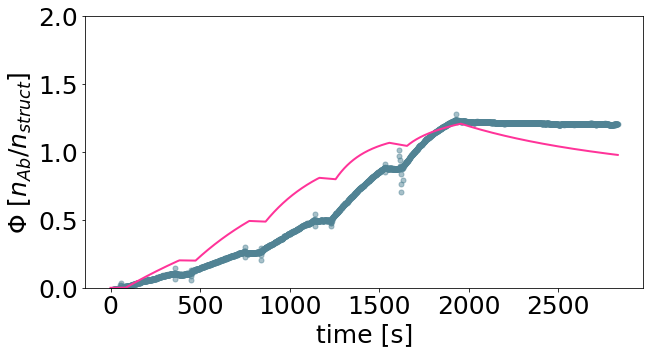

[ 0.06138074 16.49974037]


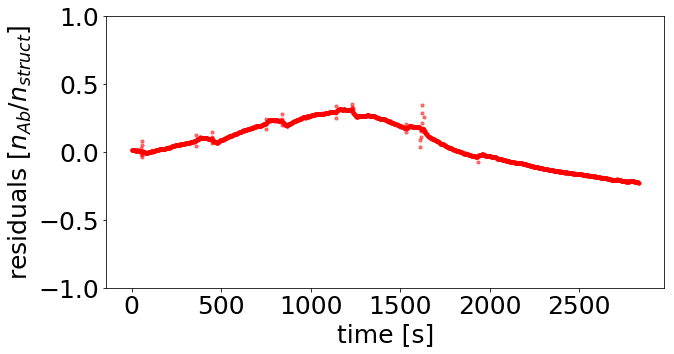

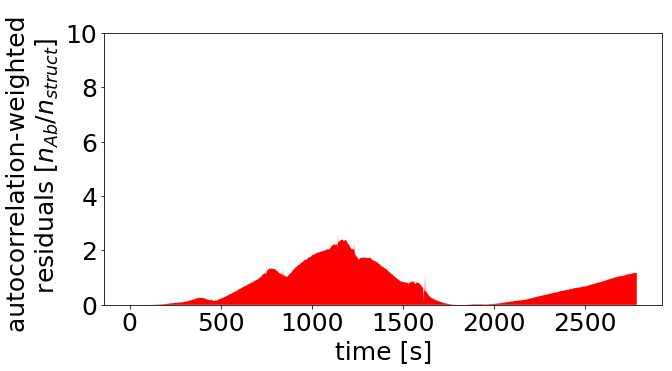

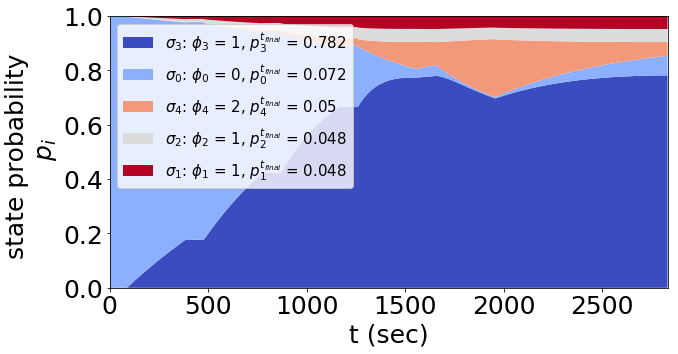

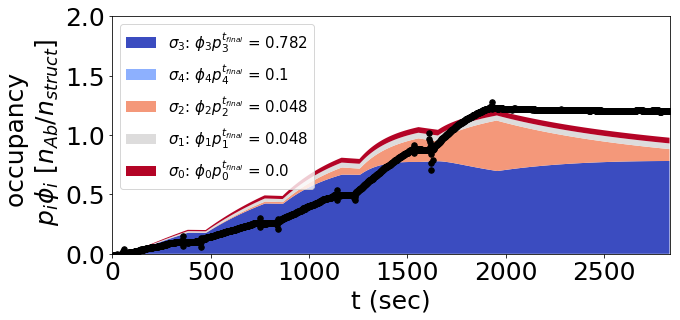

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.18763247e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.07468206]))
basinhopping step 0: f 777.031
basinhopping step 1: f 777.031 trial_f 777.031 accepted 1  lowest_f 777.031
found new global minimum on step 1 with function value 777.031
('iggdig_244nm', [-1.2336681759687713, 1.1287004434705656])


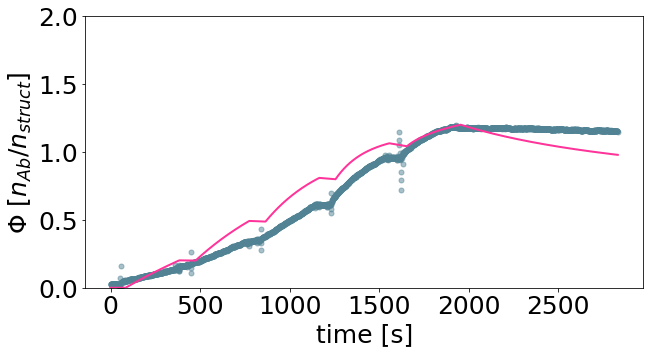

[ 0.05838911 13.44932361]


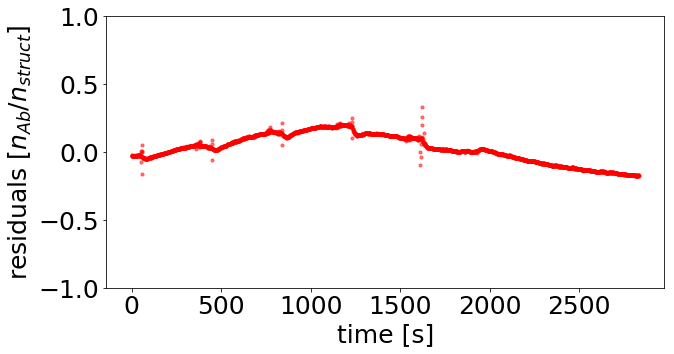

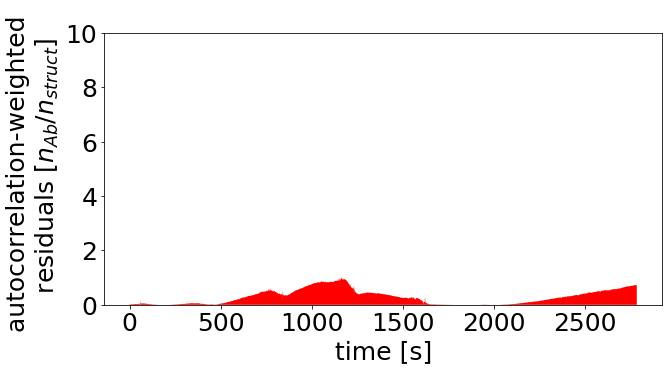

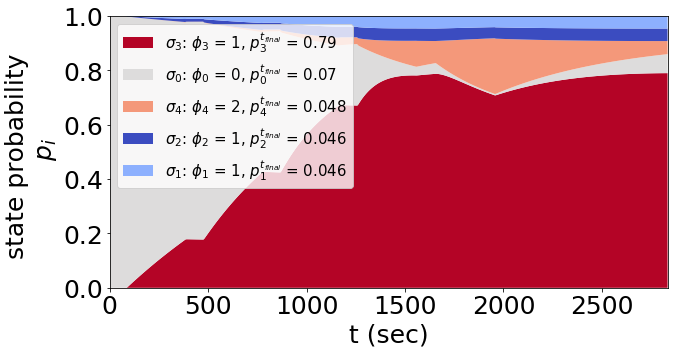

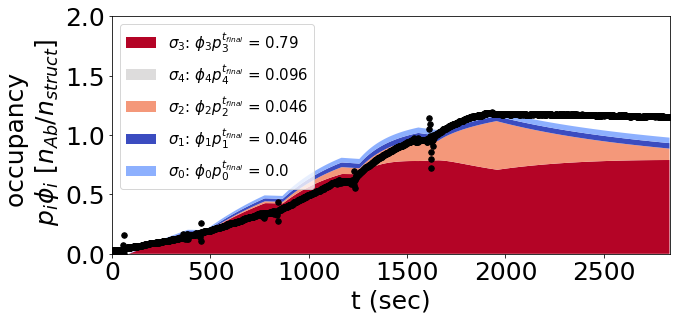

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.62600644e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.21112226]))
basinhopping step 0: f 471.472
basinhopping step 1: f 471.472 trial_f 471.472 accepted 1  lowest_f 471.472
found new global minimum on step 1 with function value 471.472
('iggdig_3nm', [-1.2531500051207836, 1.2951481552061994])


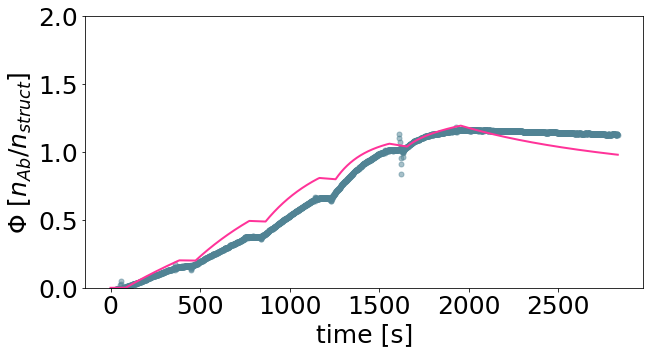

[ 0.05582773 19.73095723]


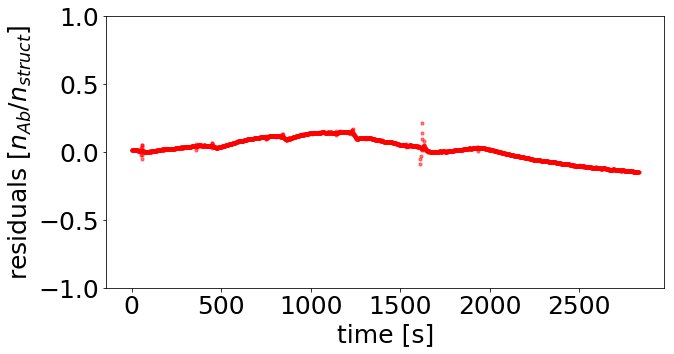

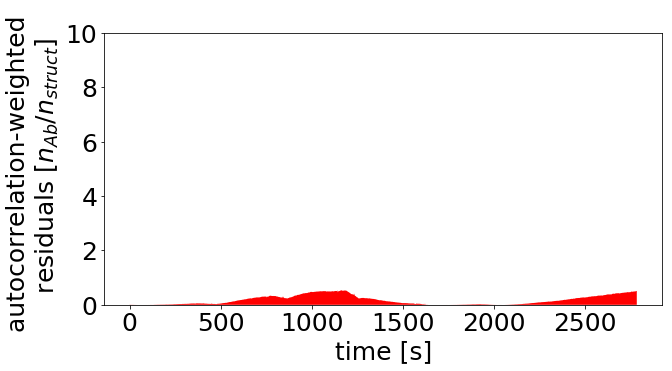

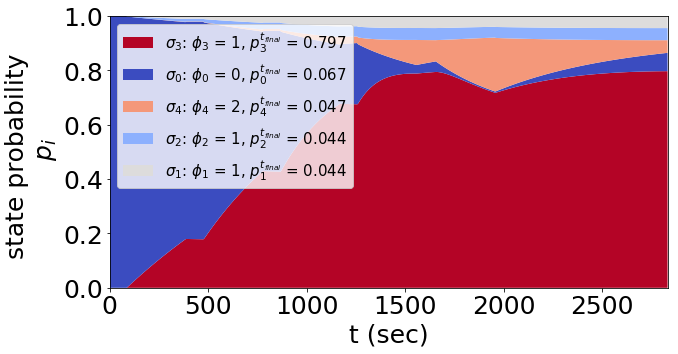

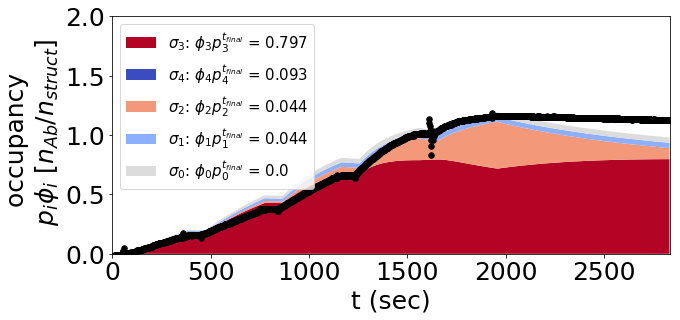

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.84588619e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26620492]))
basinhopping step 0: f 14.45
basinhopping step 1: f 14.45 trial_f 14.45 accepted 1  lowest_f 14.45
found new global minimum on step 1 with function value 14.45
('iggdig_7nm', [-1.787223747783342, 1.3330899171221549])


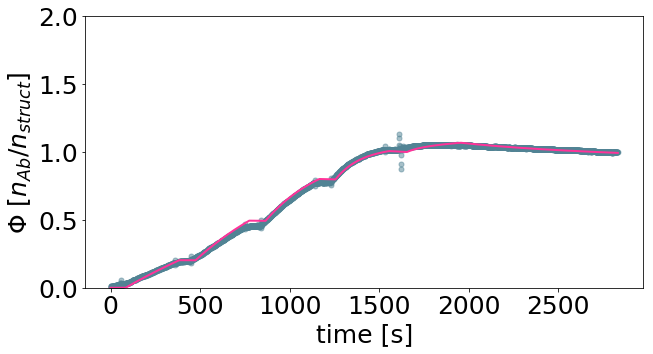

[1.63221082e-02 2.15322750e+01]


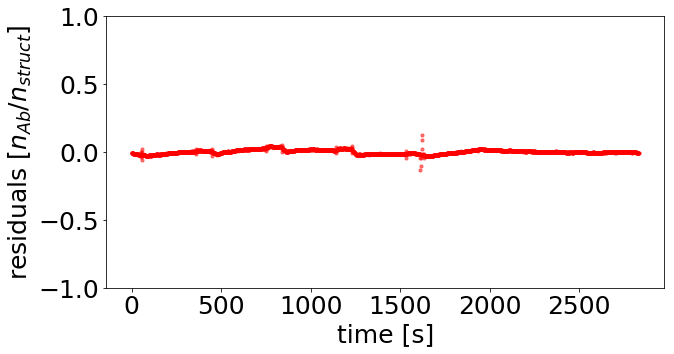

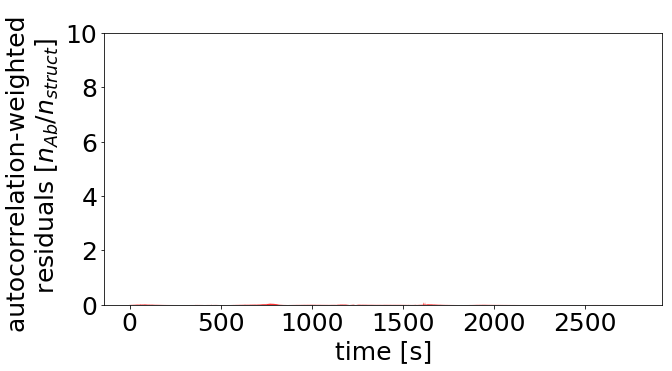

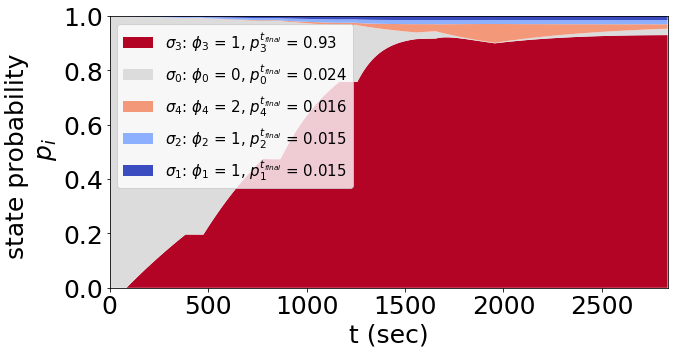

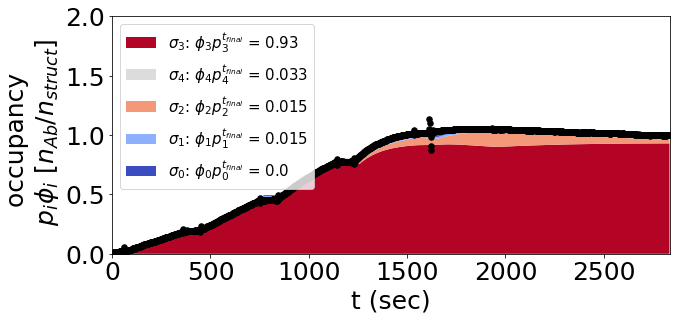

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.86106285e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26976104]))
basinhopping step 0: f 25.2922
basinhopping step 1: f 25.2922 trial_f 25.2922 accepted 1  lowest_f 25.2922
('iggdig_14nm1', [-1.666492332603128, 1.326892730871982])


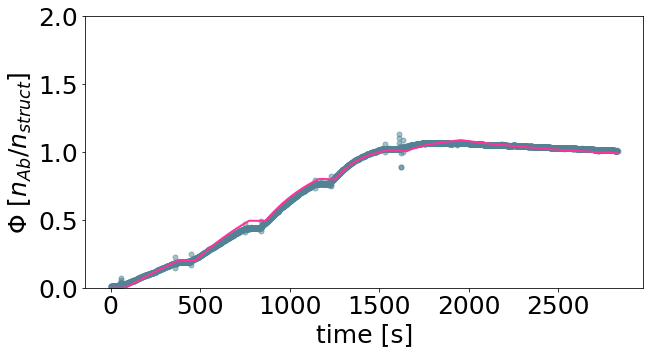

[ 0.021553   21.22720093]


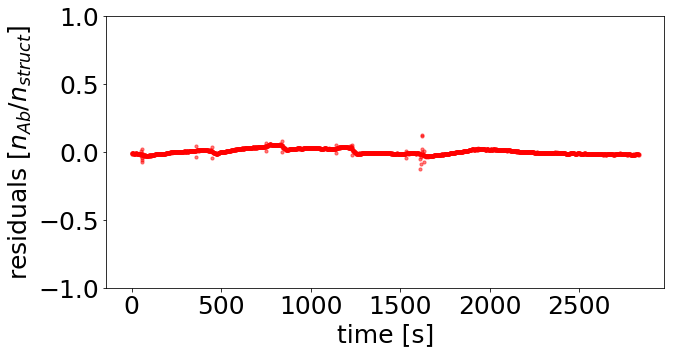

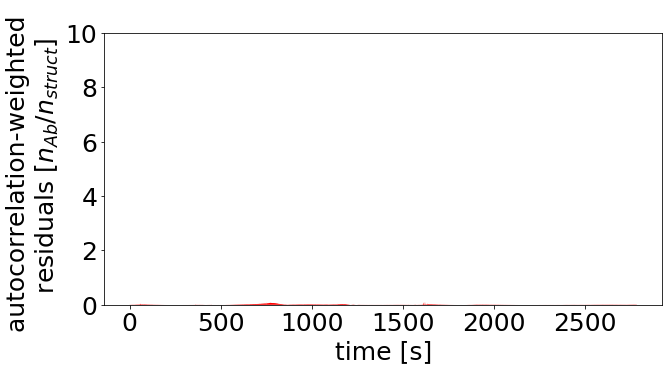

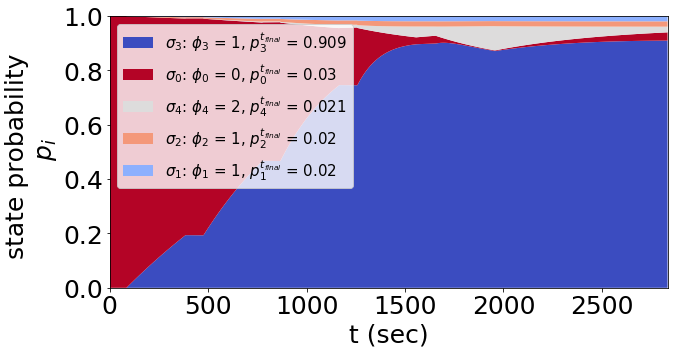

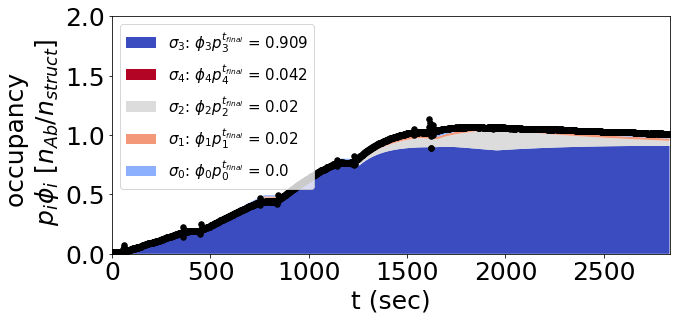

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83567607e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26379605]))
basinhopping step 0: f 10.6203
basinhopping step 1: f 10.6203 trial_f 10.6203 accepted 1  lowest_f 10.6203
('iggdig_14nm2', [-2.0974268955157447, 1.3412693456984601])


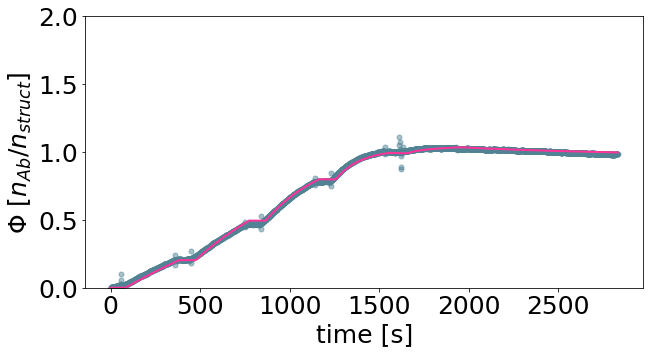

[7.99048434e-03 2.19416532e+01]


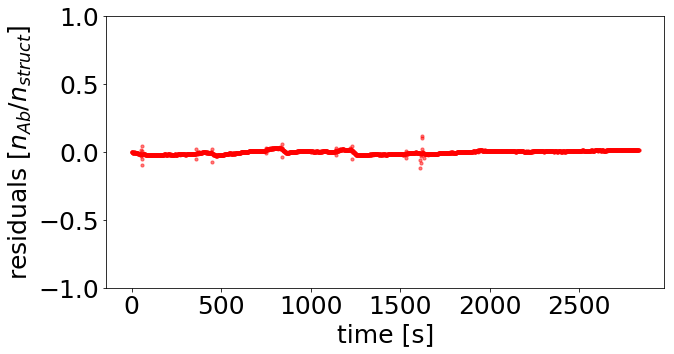

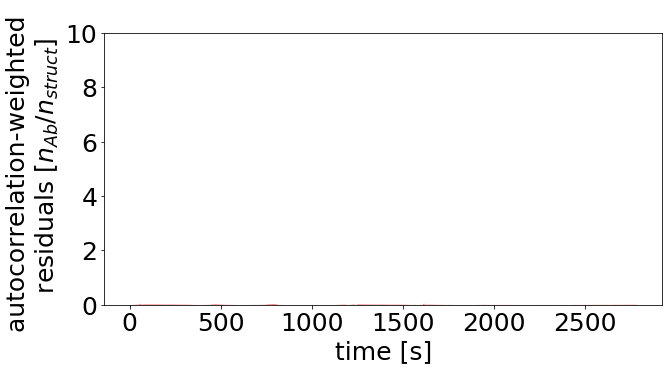

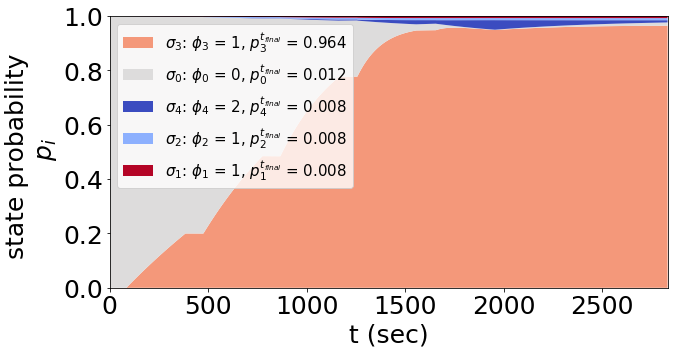

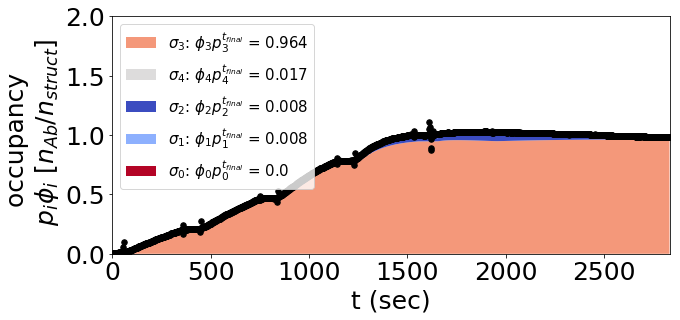

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.33492475e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12545679]))
basinhopping step 0: f 68.5555
basinhopping step 1: f 68.5555 trial_f 68.5555 accepted 1  lowest_f 68.5555
('iggdig_16nm', [-1.5897429139603838, 1.2143615750715018])


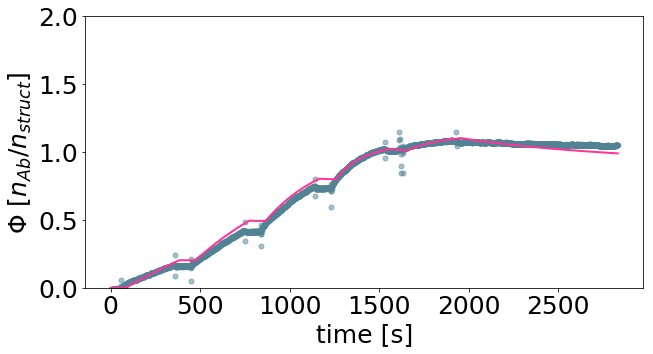

[ 0.02571918 16.38179833]


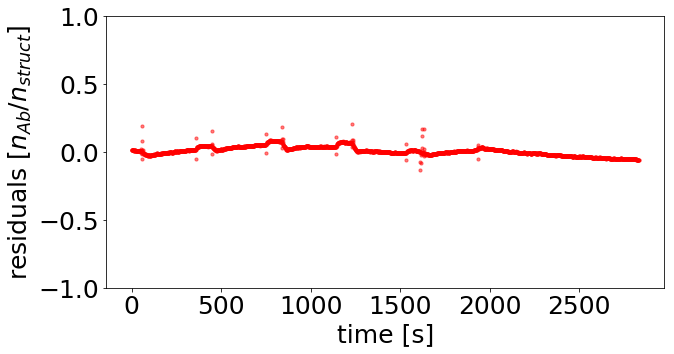

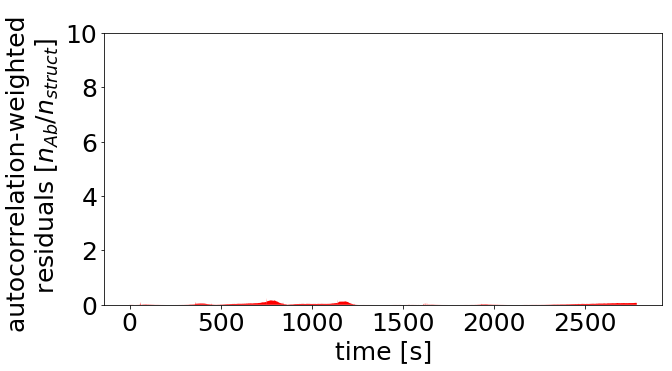

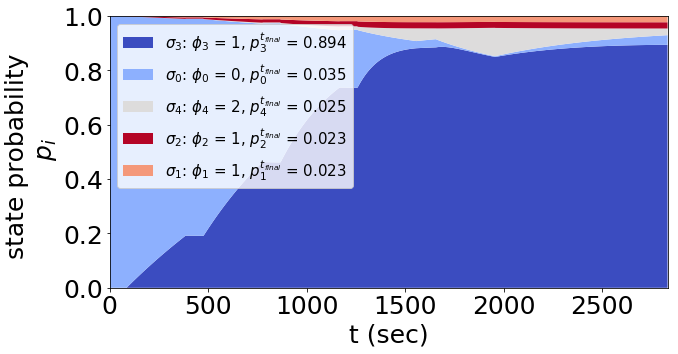

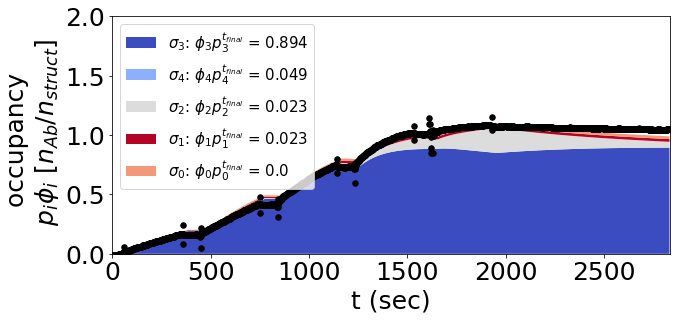

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.16488361e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.06628253]))
basinhopping step 0: f 1079.66
basinhopping step 1: f 1079.66 trial_f 1079.66 accepted 1  lowest_f 1079.66
('iggdig_17nm', [-1.081789708461925, 0.9625330473495644])


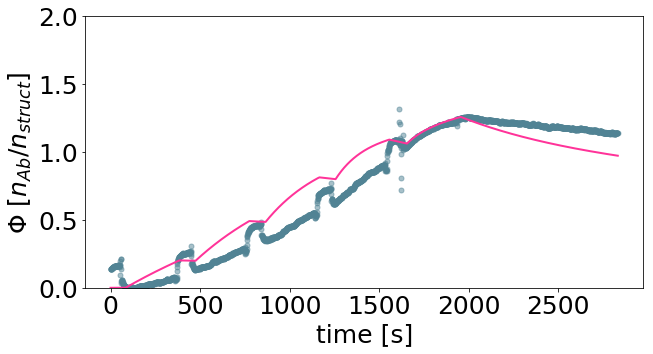

[0.08283432 9.17345738]


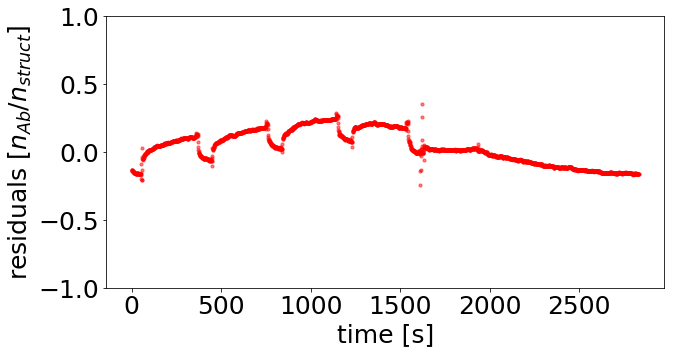

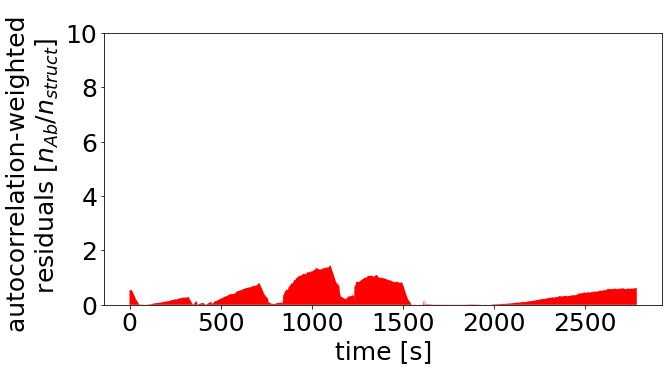

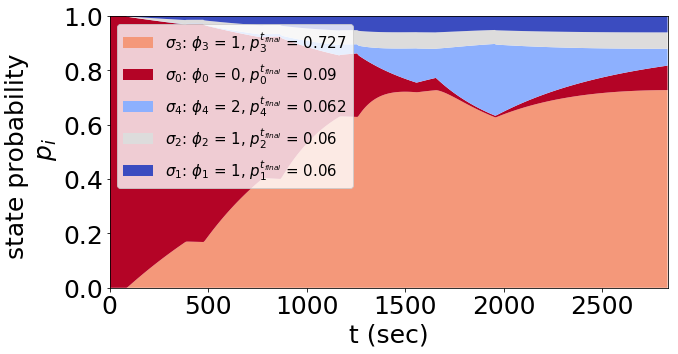

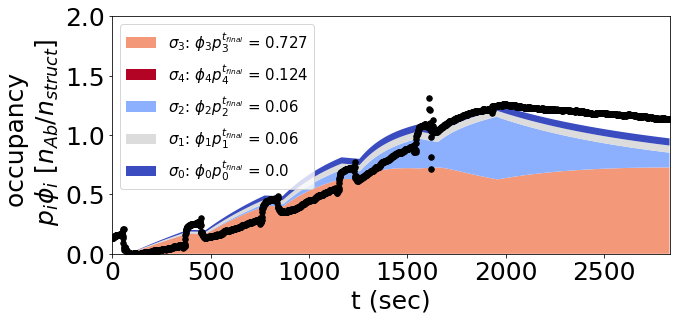

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.14104180e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.05730155]))
basinhopping step 0: f 48.8972
basinhopping step 1: f 48.8972 trial_f 48.8972 accepted 1  lowest_f 48.8972
found new global minimum on step 1 with function value 48.8972
('iggdig_21nm1', [-0.835943586789476, 1.2865899196367894])


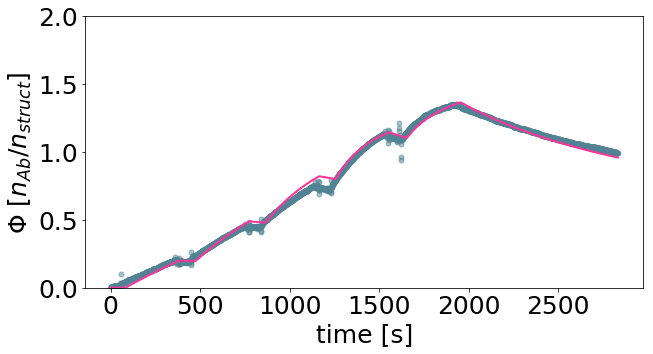

[ 0.14590038 19.3459437 ]


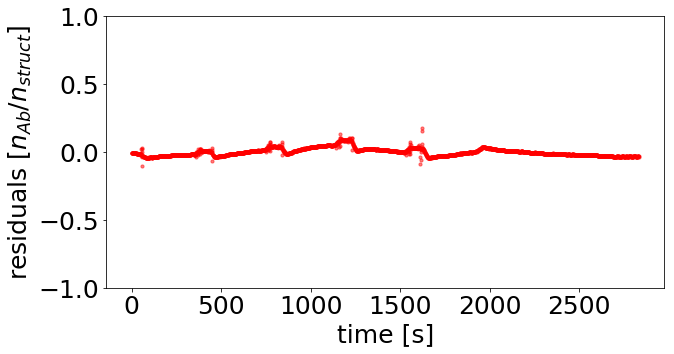

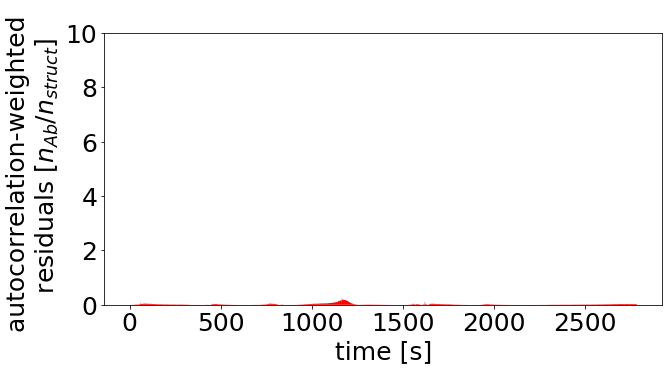

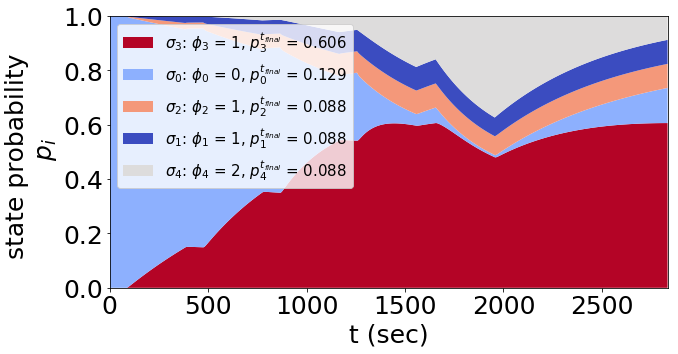

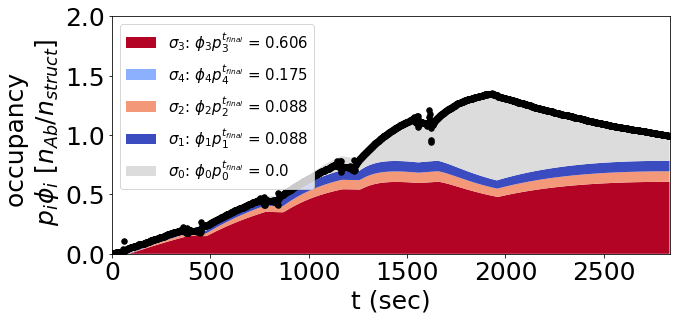

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.09660684e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04005095]))
basinhopping step 0: f 45.7421
basinhopping step 1: f 45.7421 trial_f 45.7421 accepted 1  lowest_f 45.7421
found new global minimum on step 1 with function value 45.7421
('iggdig_21nm2', [-0.8030364285195153, 1.2614752302013719])


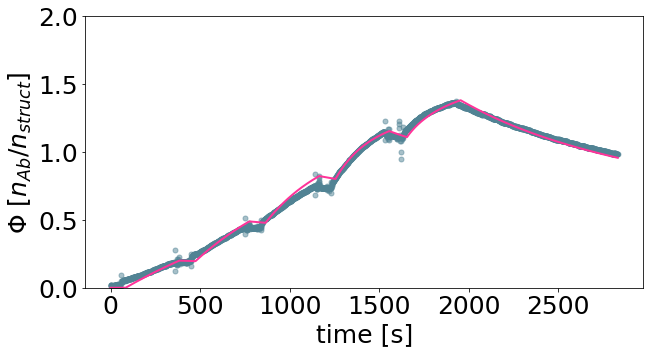

[ 0.15738508 18.25892607]


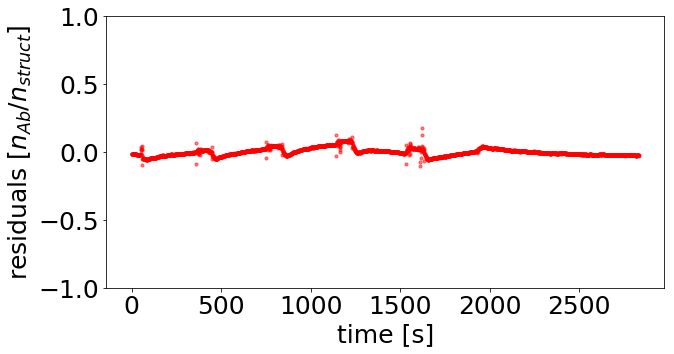

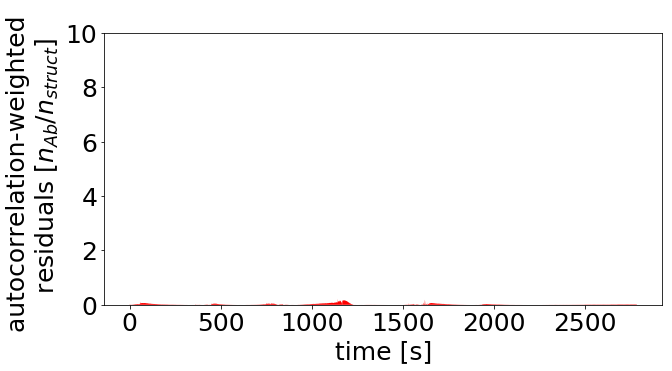

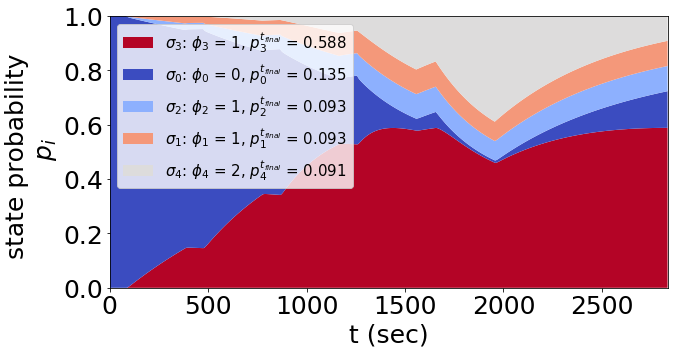

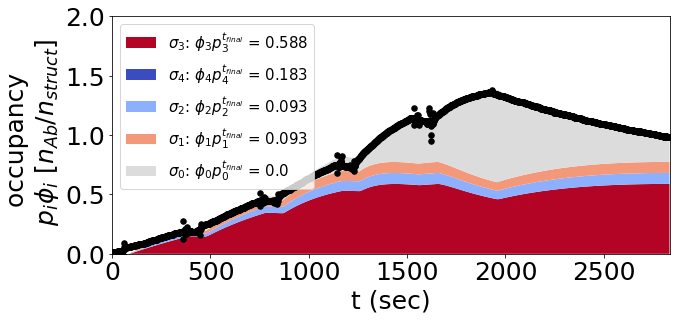

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.11305896e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04651817]))
basinhopping step 0: f 123.266
basinhopping step 1: f 123.266 trial_f 123.266 accepted 1  lowest_f 123.266
('iggdig_21nm3', [-0.9332980523072999, 1.3132296630071292])


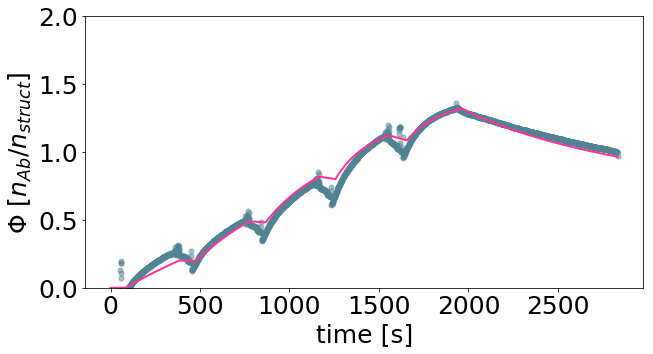

[ 0.11660091 20.56978077]


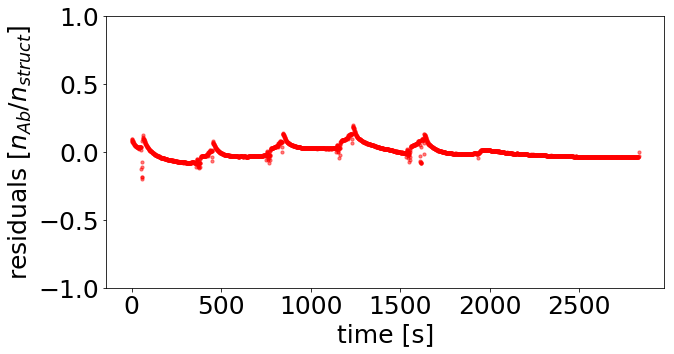

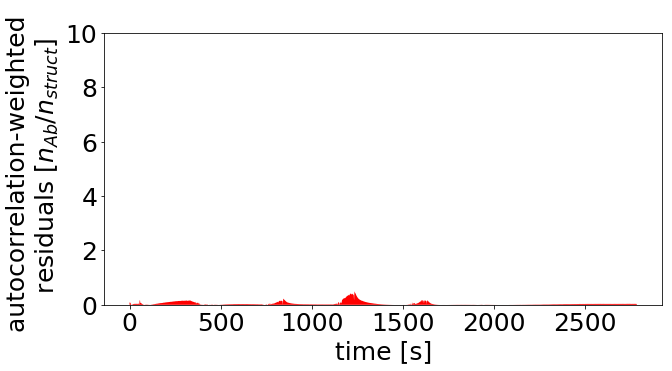

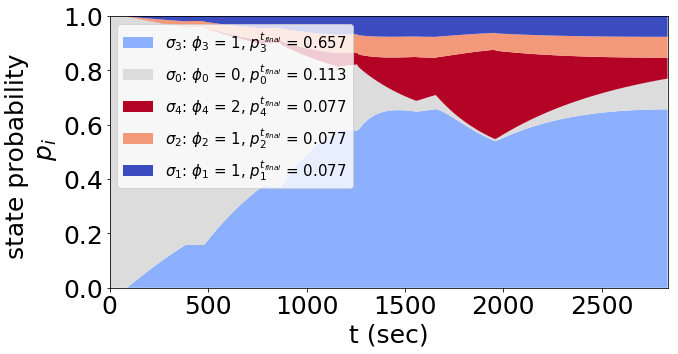

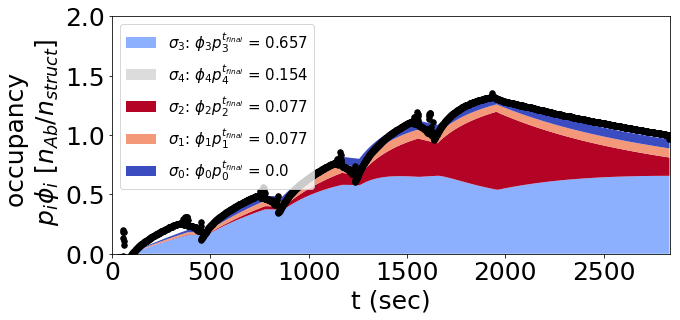

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.08656295e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.03605489]))
basinhopping step 0: f 181.695
basinhopping step 1: f 181.695 trial_f 181.695 accepted 1  lowest_f 181.695
found new global minimum on step 1 with function value 181.695
('iggdig_28nm1', [-0.8998249690963878, 1.2660656861278403])


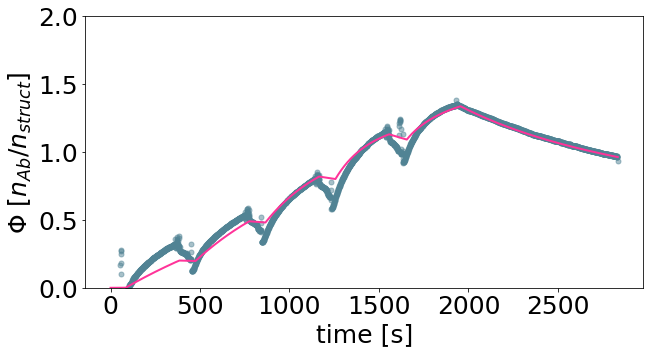

[ 0.12594329 18.45294495]


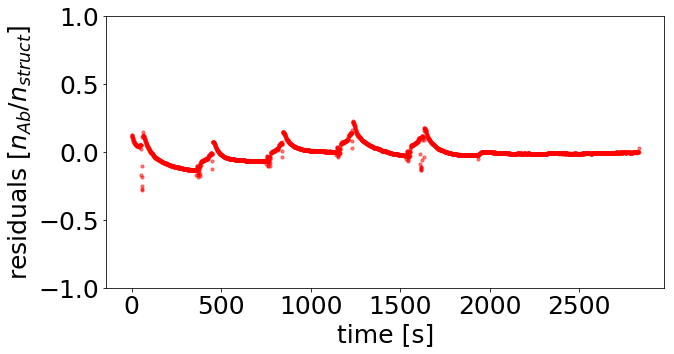

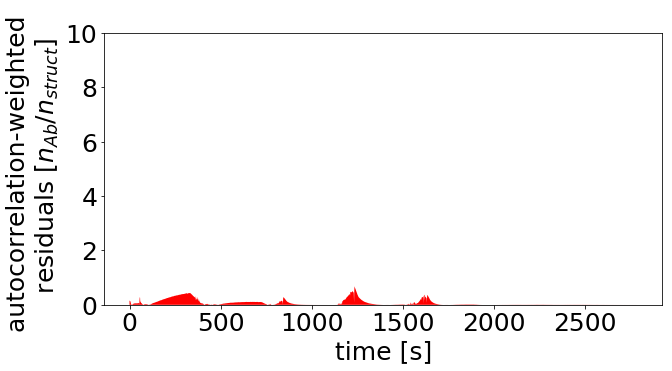

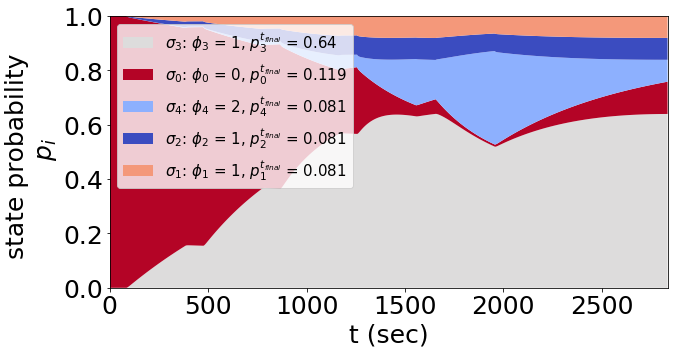

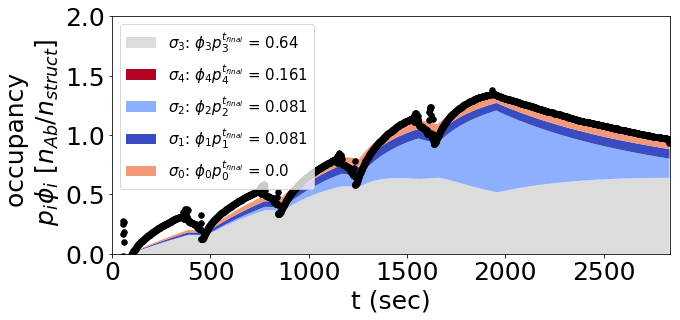

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.32182032e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12117243]))
basinhopping step 0: f 194.921
basinhopping step 1: f 194.921 trial_f 194.921 accepted 1  lowest_f 194.921
('iggdig_28nm2', [-0.5410321186543086, 1.268712693359989])


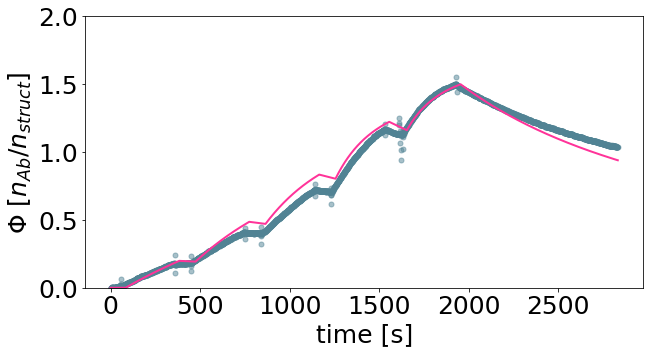

[ 0.28771856 18.56575835]


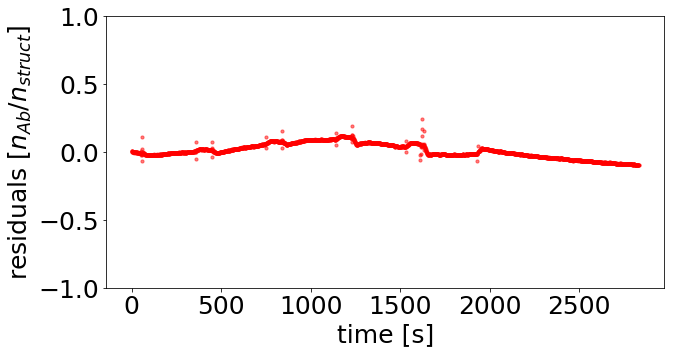

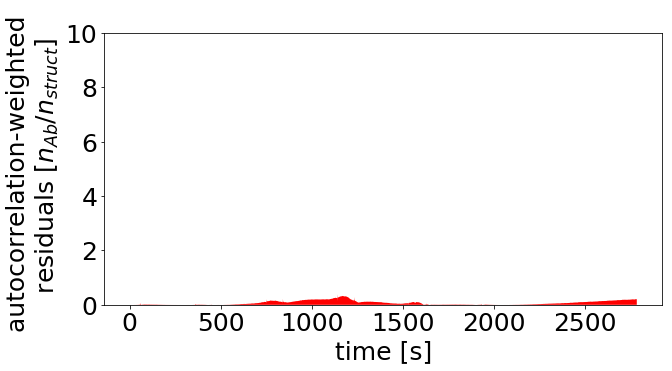

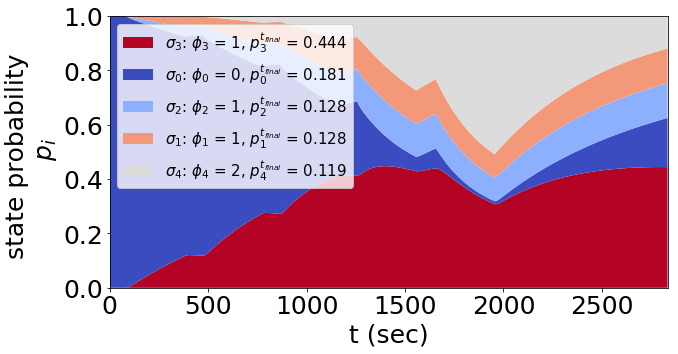

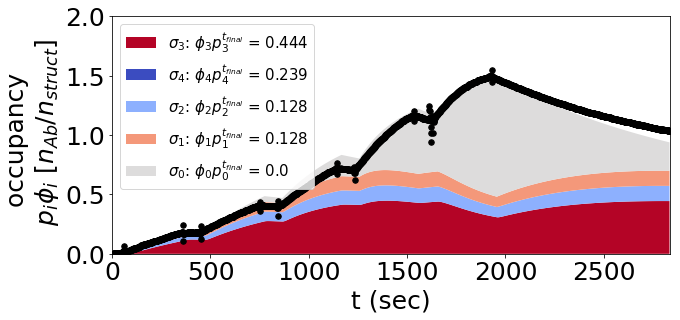

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83584091e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26383504]))
basinhopping step 0: f 37.9195
basinhopping step 1: f 37.9195 trial_f 37.9195 accepted 1  lowest_f 37.9195
found new global minimum on step 1 with function value 37.9195
('iggdig_42nm1', [-0.4090289097149069, 1.351233952310434])


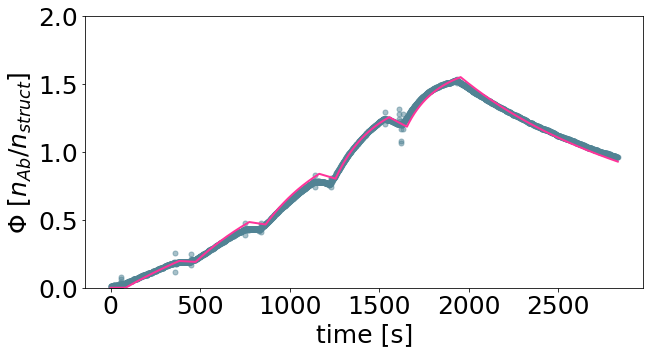

[ 0.38991603 22.45091018]


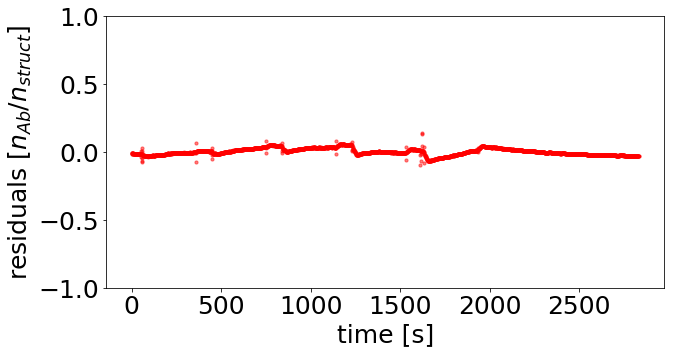

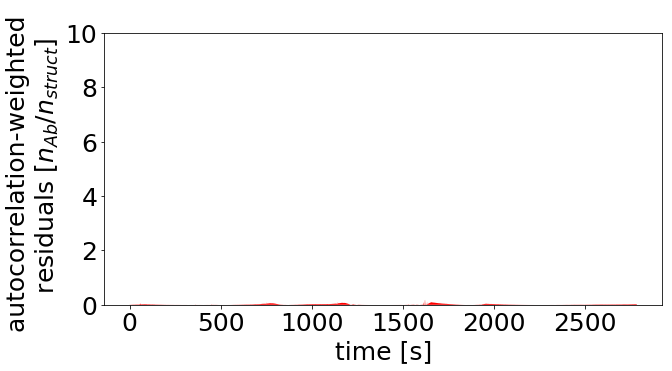

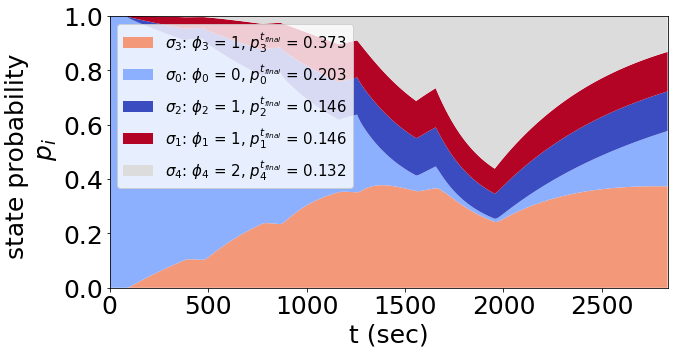

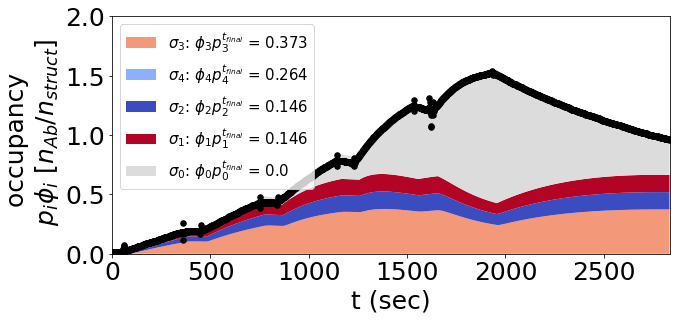

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.81904494e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.25984343]))
basinhopping step 0: f 39.9103
basinhopping step 1: f 39.9103 trial_f 39.9103 accepted 1  lowest_f 39.9103
found new global minimum on step 1 with function value 39.9103
('iggdig_42nm2', [-0.5207491164718309, 1.3744556295861843])


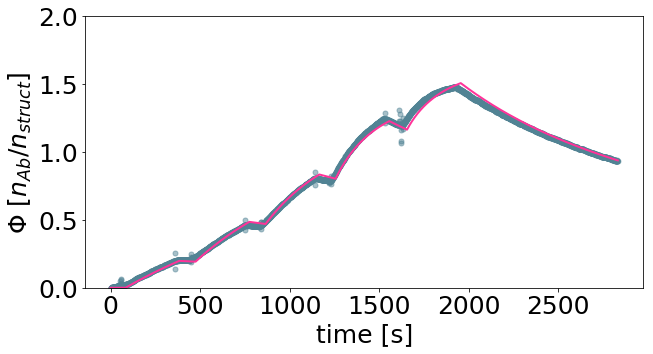

[ 0.30147471 23.68403148]


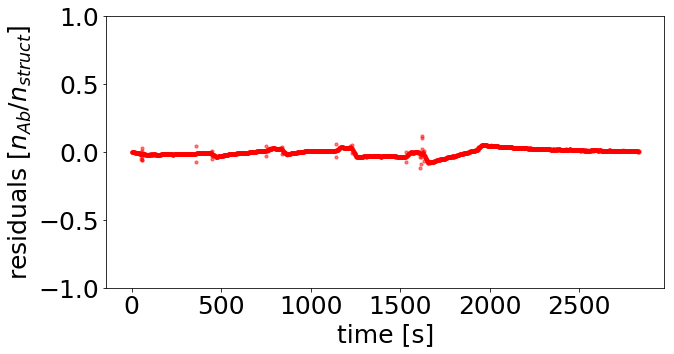

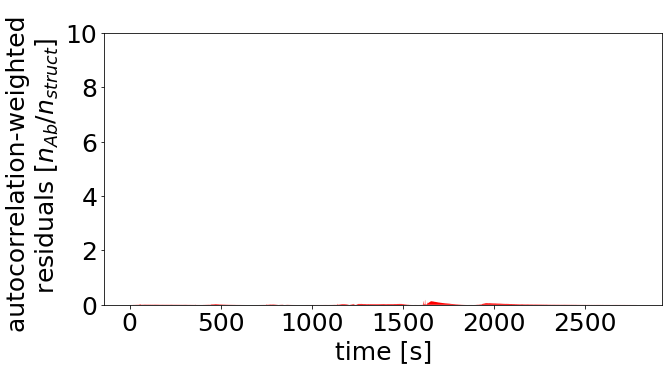

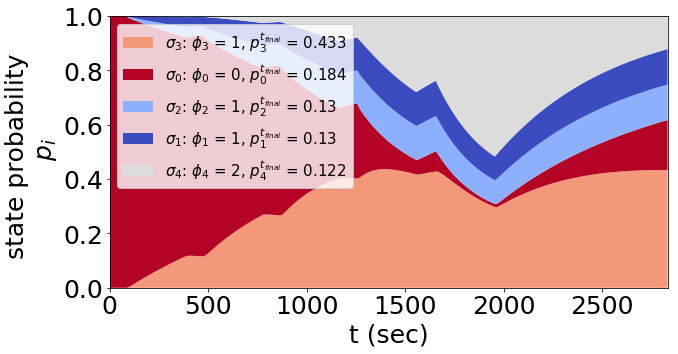

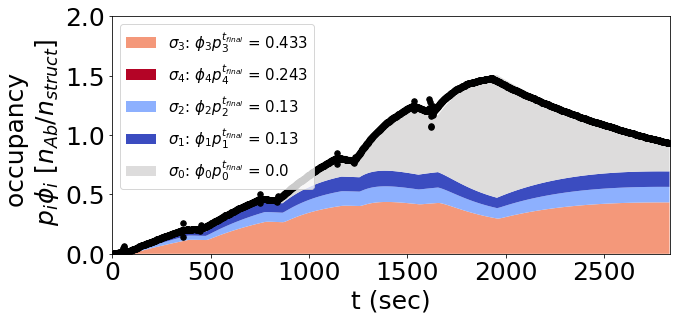

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.73861273e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.24020285]))
basinhopping step 0: f 56.4754
basinhopping step 1: f 56.4754 trial_f 56.4754 accepted 1  lowest_f 56.4754
('iggdig_84nm', [-0.4004941260161494, 1.4088382829442838])


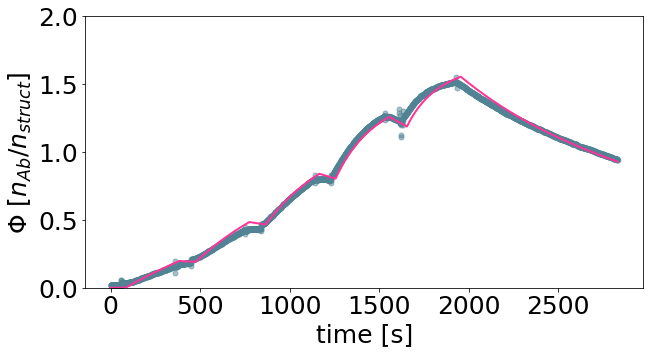

[ 0.39765447 25.63529284]


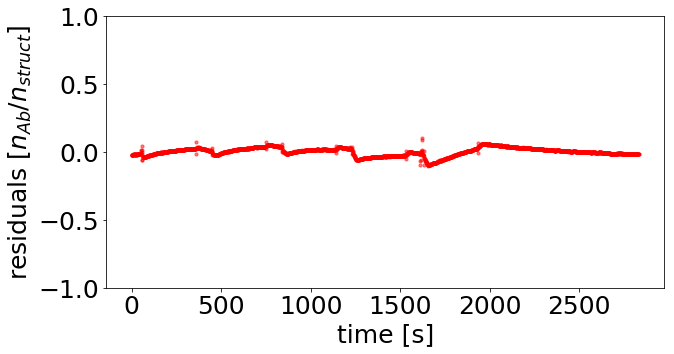

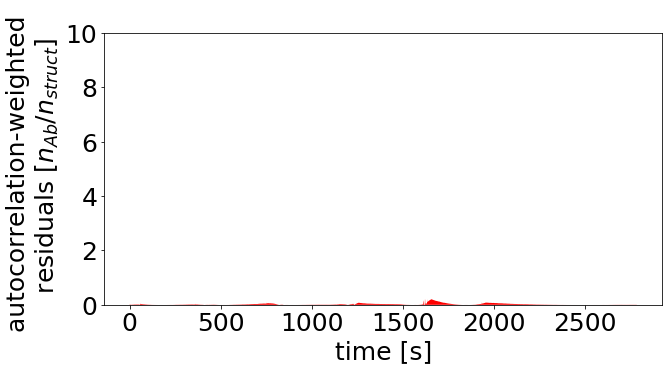

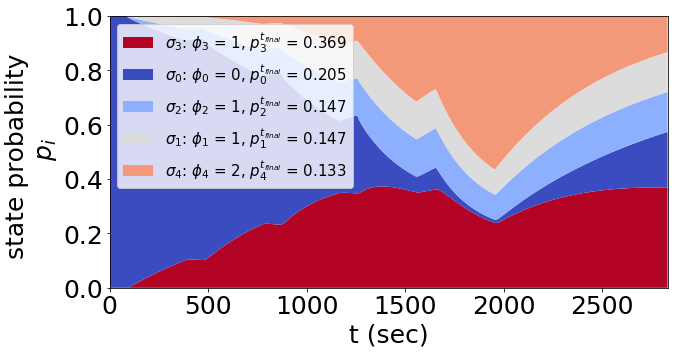

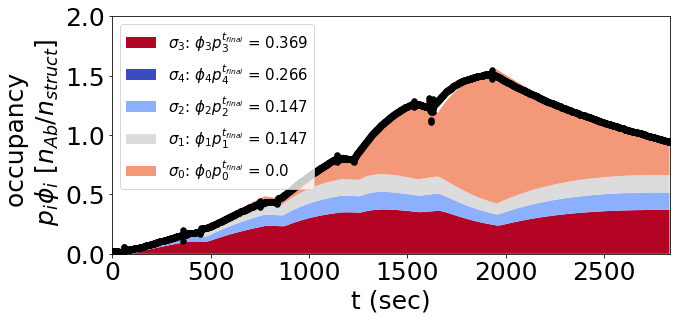

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.91564101e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.28231412]))
basinhopping step 0: f 33.3397
basinhopping step 1: f 33.3397 trial_f 33.3397 accepted 1  lowest_f 33.3397
('iggdig_99nm', [-0.7621254312939578, 1.4410305305726998])


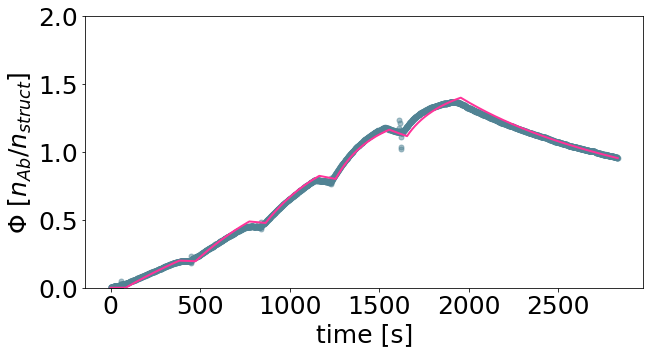

[ 0.17293168 27.6077193 ]


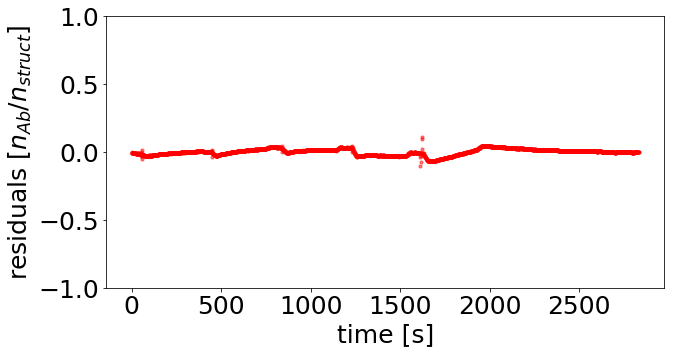

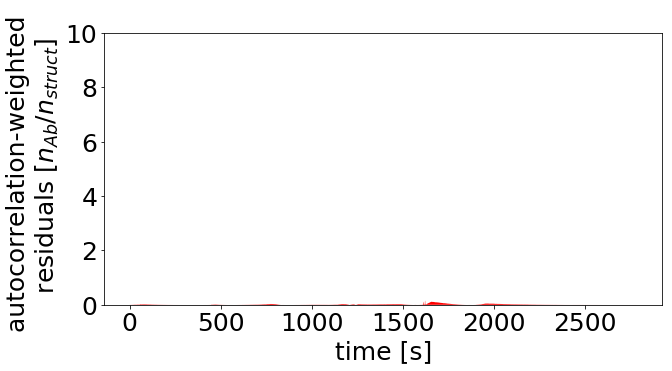

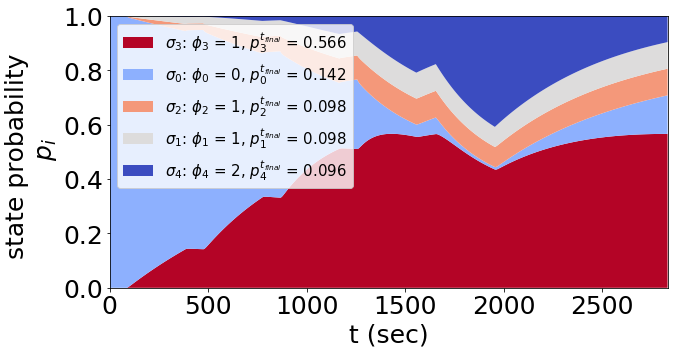

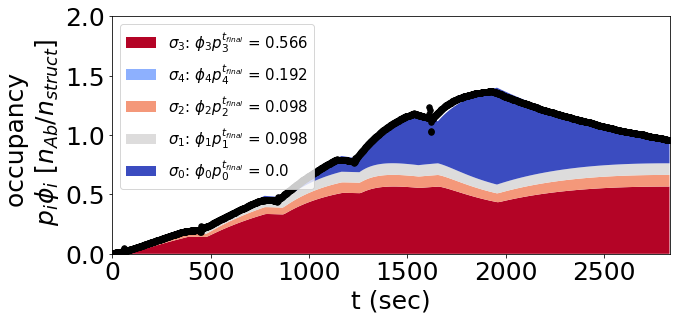

[array([-1.21196785,  1.21747711]), array([-1.23366818,  1.12870044]), array([-1.25315001,  1.29514816]), array([-1.78722375,  1.33308992]), array([-1.66649233,  1.32689273]), array([-2.0974269 ,  1.34126935]), array([-1.58974291,  1.21436158]), array([-1.08178971,  0.96253305]), array([-0.83594359,  1.28658992]), array([-0.80303643,  1.26147523]), array([-0.93329805,  1.31322966]), array([-0.89982497,  1.26606569]), array([-0.54103212,  1.26871269]), array([-0.40902891,  1.35123395]), array([-0.52074912,  1.37445563]), array([-0.40049413,  1.40883828]), array([-0.76212543,  1.44103053])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-1.21196785,  1.21747711]), array([-1.23366818,  1.12870044]), array([-1.25315001,  1.29514816]), array([-1.78722375,  1.33308992]), array([-1.66649233,  1.32689273]), array([-2.0974269 ,  1.34126935]), array([-1.58974291,  1.21436158]), array([-1.08178971,  0.96253305]), array([-0.83594359,  1.28658992]), array([-0.80303643,  1.26147523]),

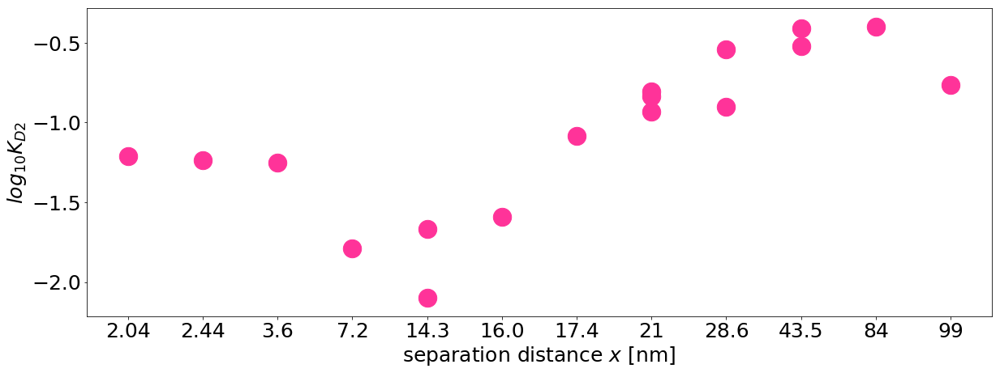

In [63]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_mean"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_gmean, k_off_gmean]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_mean = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_mean)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_mean).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_mean,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

In [64]:
# import pickle as pkl

# origami_alpha,  xopt_compilation_2, output_directory = \
#     pkl.load(open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'rb'))

# Alpha function fitting - with K_D - based on upper 95 KD1

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.53022425e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.18475508]))
basinhopping step 0: f 2585.4
basinhopping step 1: f 2585.4 trial_f 2585.4 accepted 1  lowest_f 2585.4
found new global minimum on step 1 with function value 2585.4
('iggdig_204nm', [-1.2521296255684768, 1.2099450844037396])


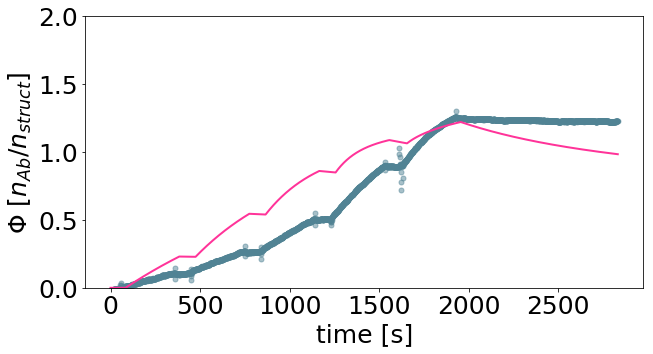

[ 0.05595906 16.21605036]


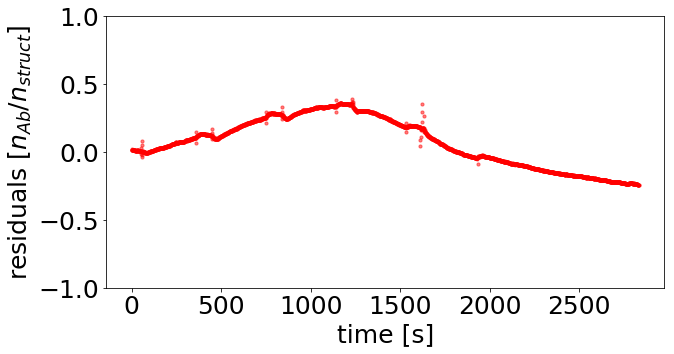

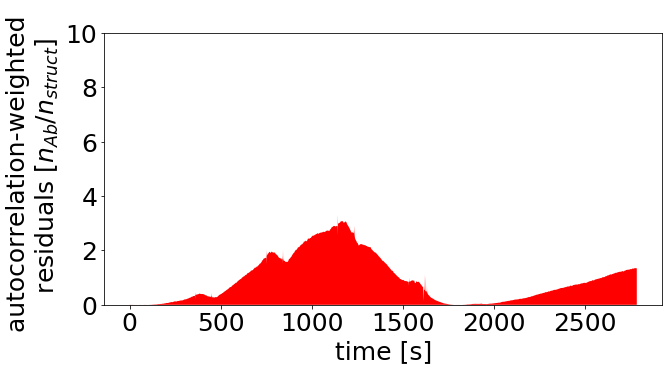

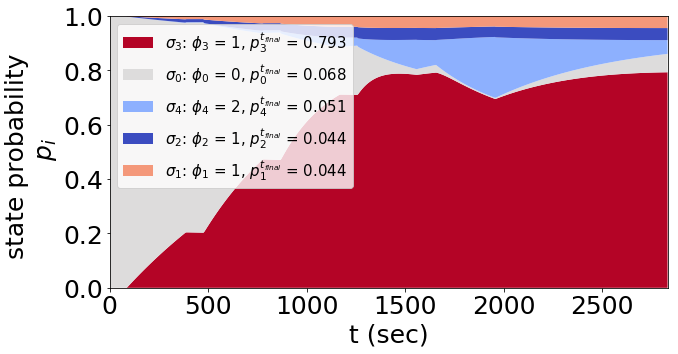

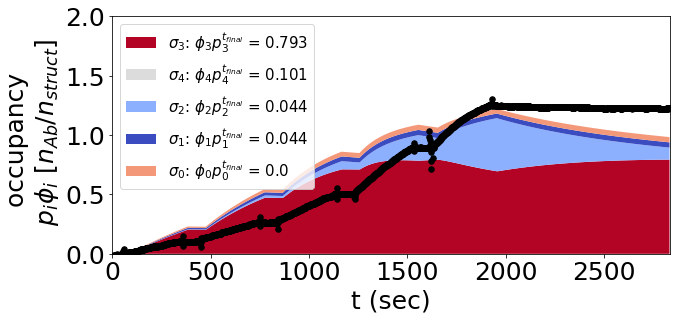

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.18763247e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.07468206]))
basinhopping step 0: f 1142.78
basinhopping step 1: f 1142.78 trial_f 1142.78 accepted 1  lowest_f 1142.78
('iggdig_244nm', [-1.214761525136907, 1.1167806841164793])


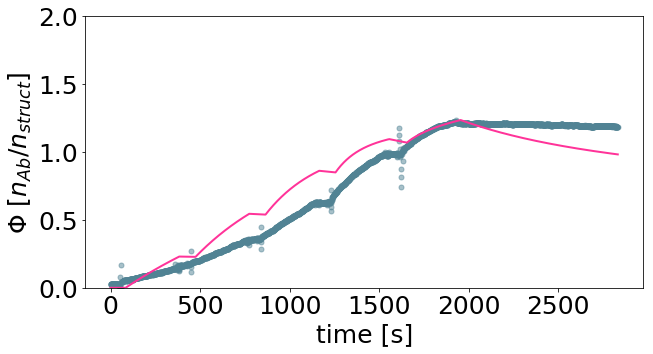

[ 0.06098717 13.08520962]


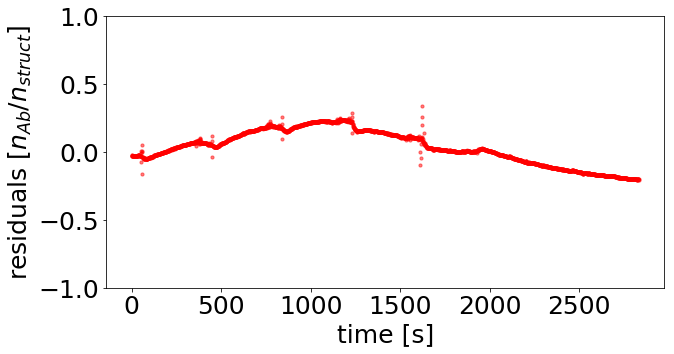

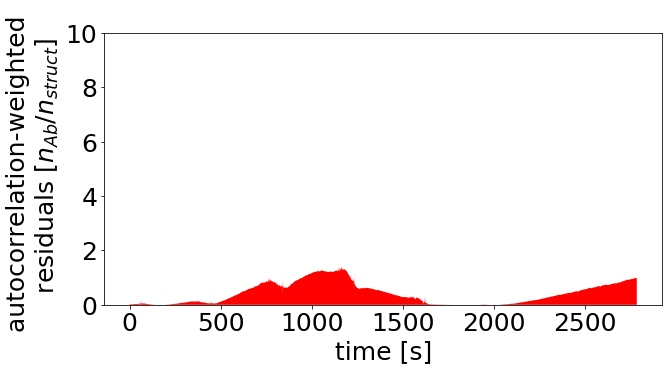

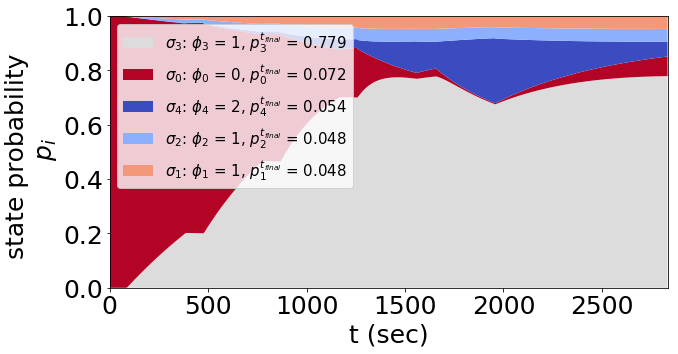

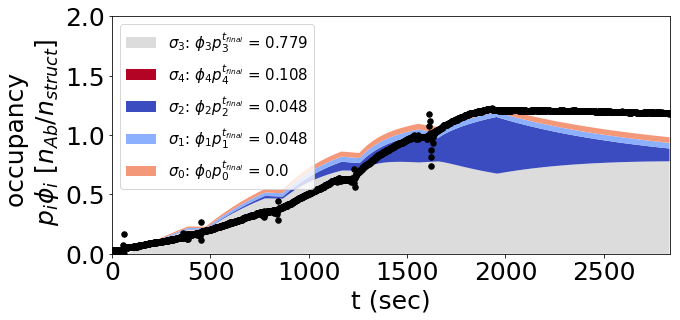

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.62600644e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.21112226]))
basinhopping step 0: f 764.61
basinhopping step 1: f 764.61 trial_f 764.61 accepted 1  lowest_f 764.61
('iggdig_3nm', [-1.2100520664882872, 1.2816487642140495])


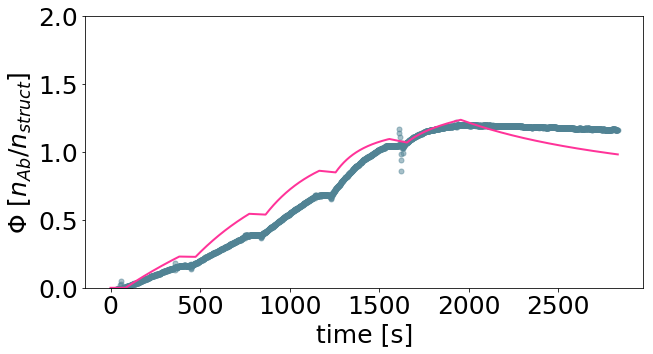

[ 0.06165211 19.12708396]


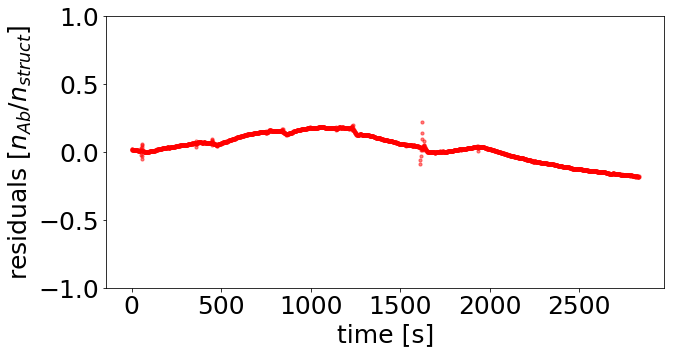

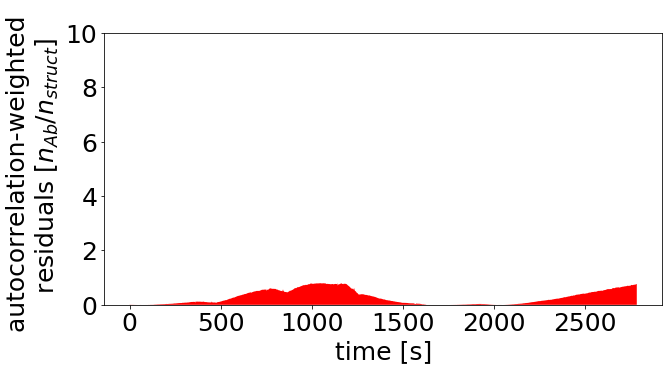

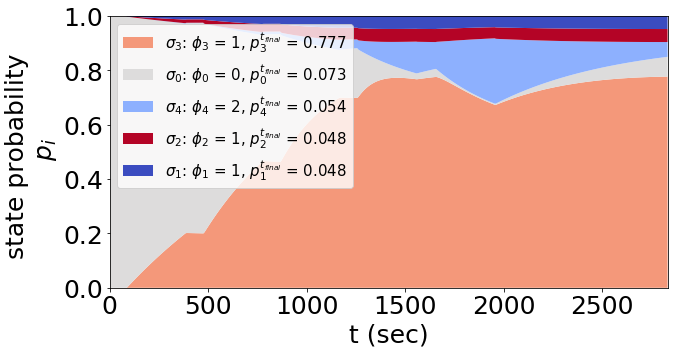

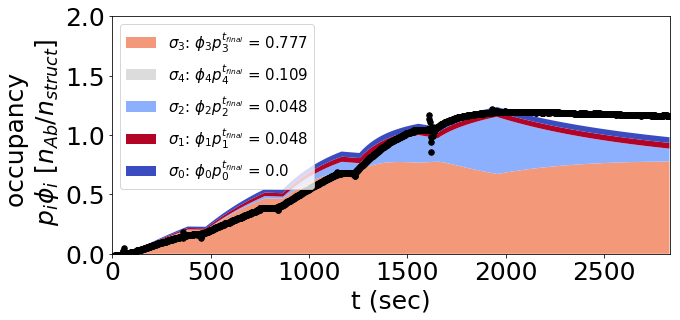

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.84588619e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26620492]))
basinhopping step 0: f 64.2226
basinhopping step 1: f 64.2226 trial_f 64.2226 accepted 1  lowest_f 64.2226
('iggdig_7nm', [-1.5507323691025319, 1.3165590758747672])


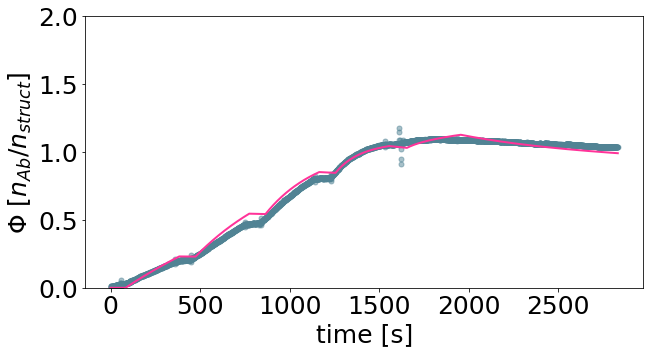

[ 0.02813634 20.72807999]


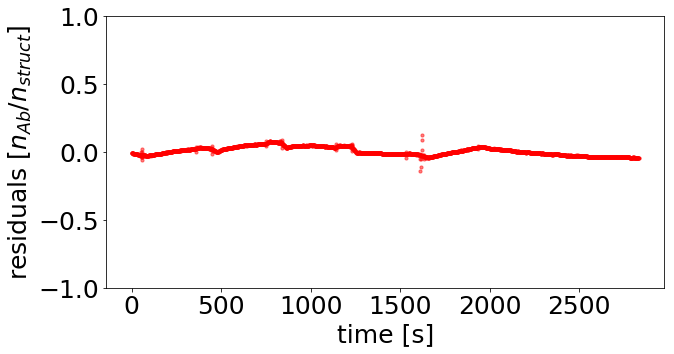

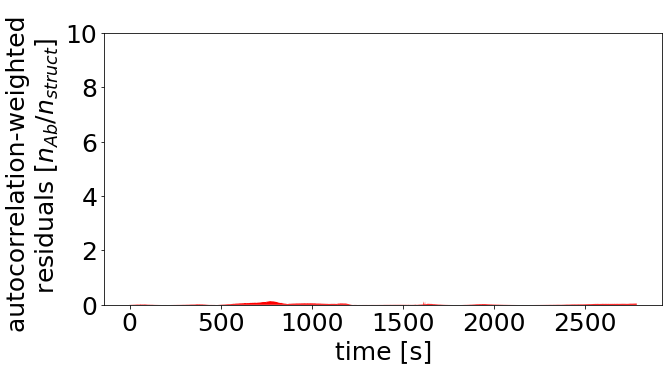

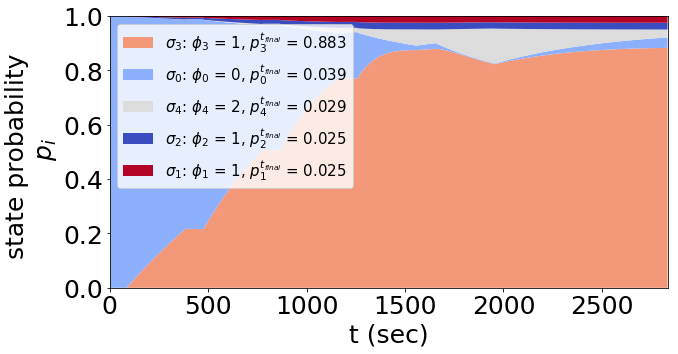

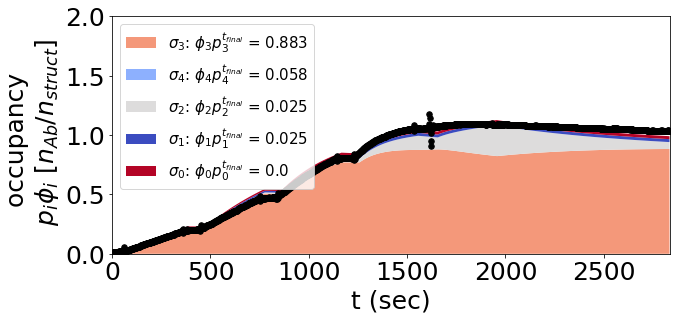

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.86106285e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26976104]))
basinhopping step 0: f 97.546
basinhopping step 1: f 97.546 trial_f 97.546 accepted 1  lowest_f 97.546
found new global minimum on step 1 with function value 97.546
('iggdig_14nm1', [-1.473112236295053, 1.3100848778046983])


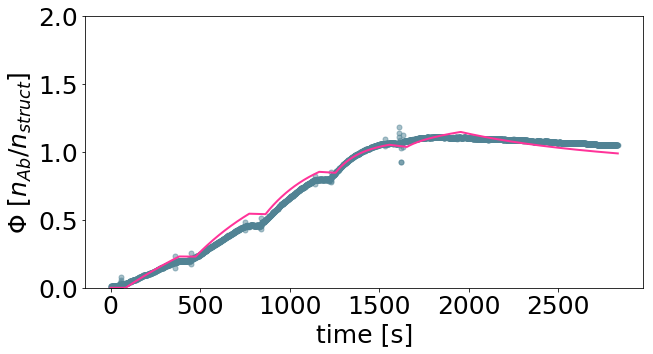

[ 0.03364246 20.42137018]


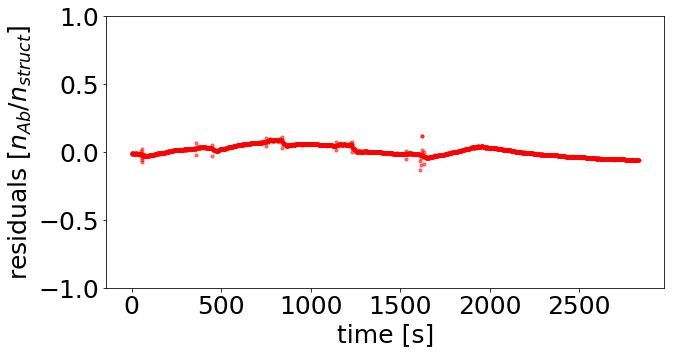

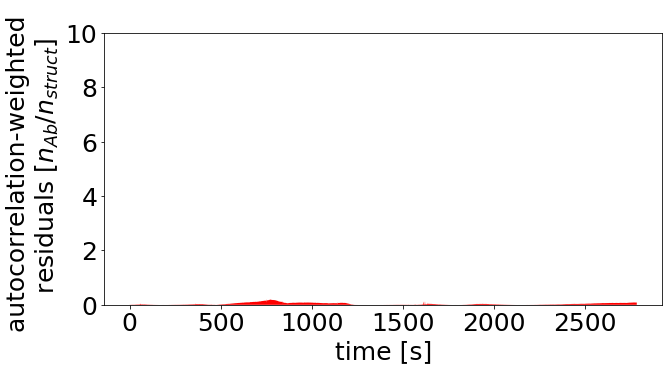

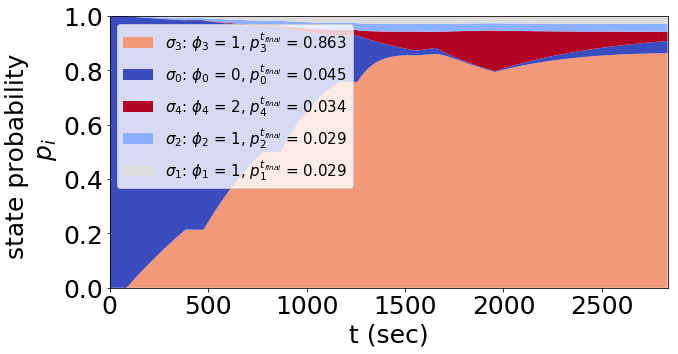

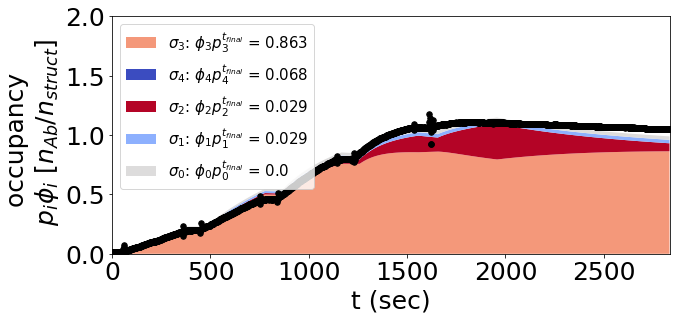

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83567607e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26379605]))
basinhopping step 0: f 32.7295
basinhopping step 1: f 32.7295 trial_f 32.7295 accepted 1  lowest_f 32.7295
('iggdig_14nm2', [-1.7062217401122777, 1.3248494233867378])


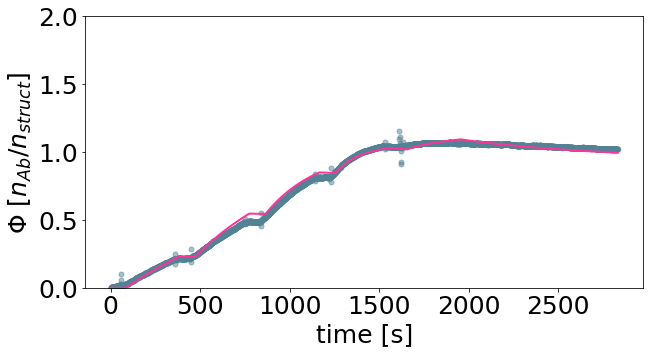

[1.96688179e-02 2.11275639e+01]


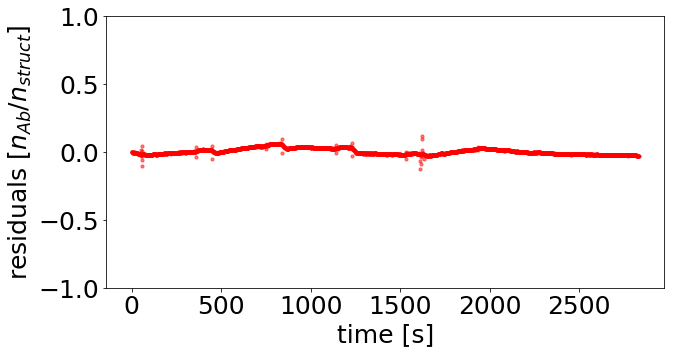

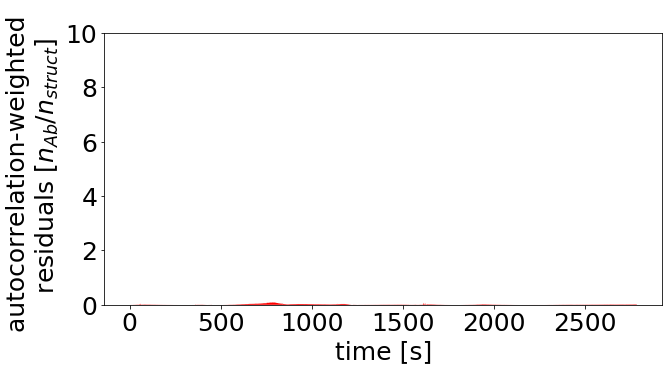

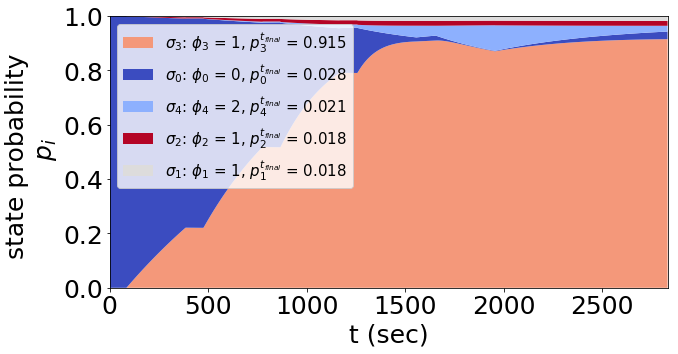

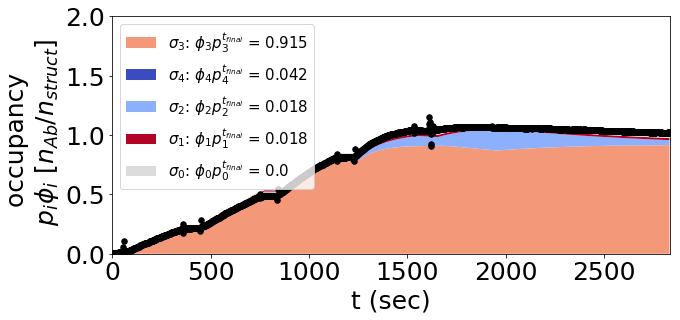

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.33492475e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12545679]))
basinhopping step 0: f 187.277
basinhopping step 1: f 187.277 trial_f 187.277 accepted 1  lowest_f 187.277
found new global minimum on step 1 with function value 187.277
('iggdig_16nm', [-1.4340127367217763, 1.1982807910049487])


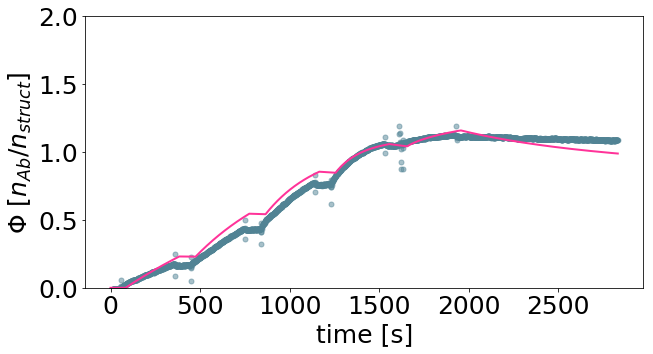

[ 0.03681182 15.78631596]


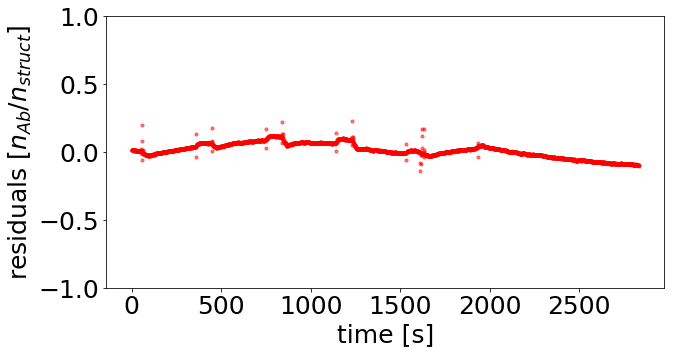

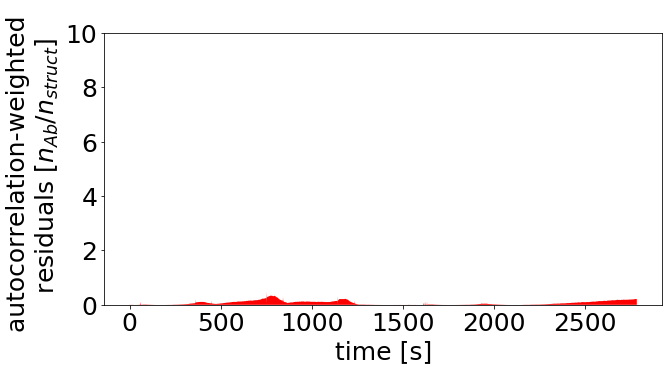

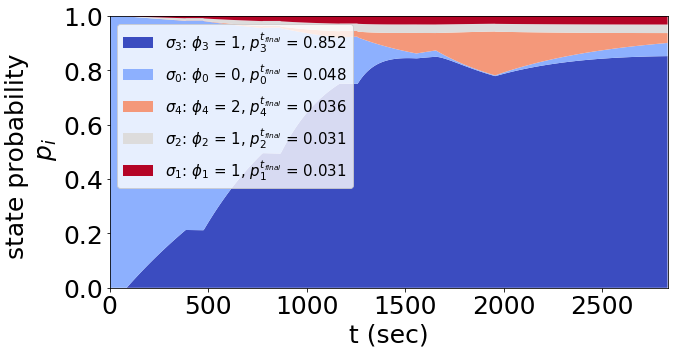

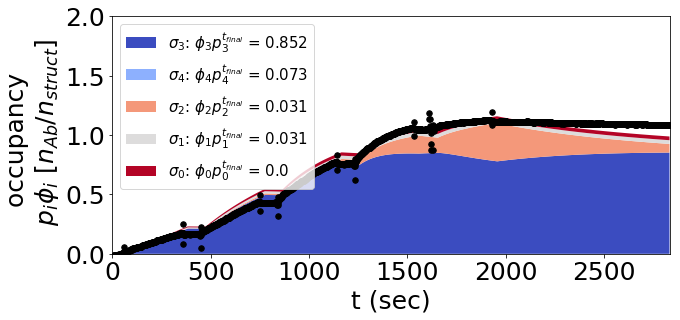

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.16488361e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.06628253]))
basinhopping step 0: f 1513.11
basinhopping step 1: f 1513.11 trial_f 1513.11 accepted 1  lowest_f 1513.11
('iggdig_17nm', [-1.0952528558802956, 0.95193590466587])


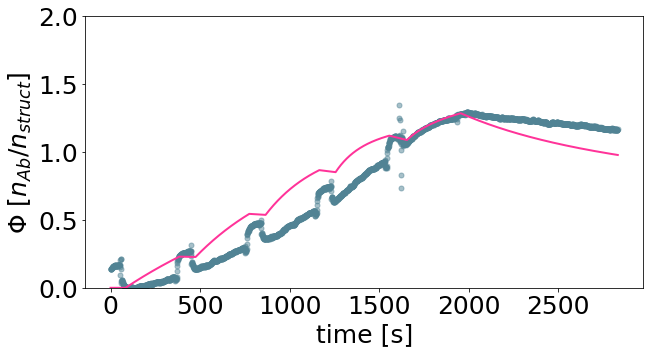

[0.08030584 8.95232633]


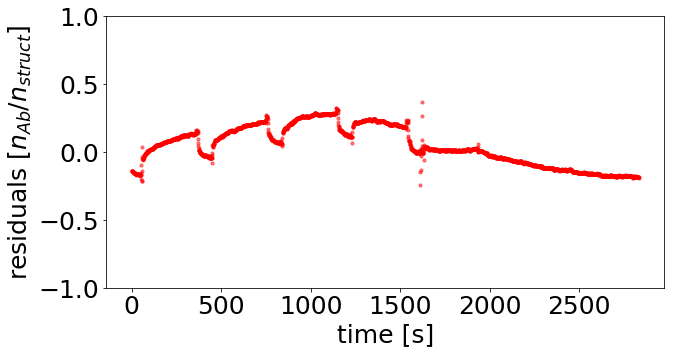

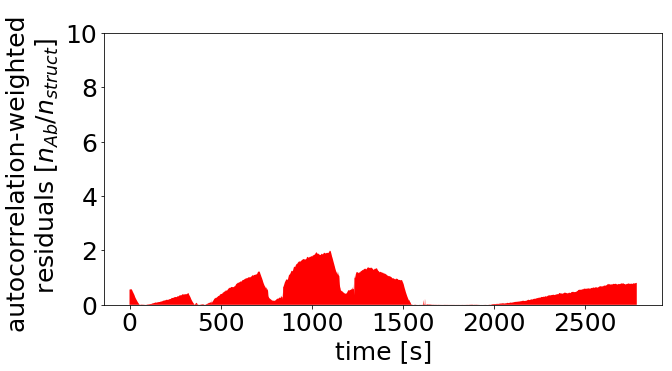

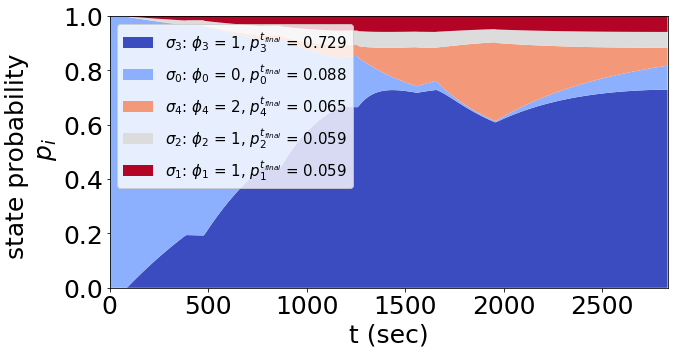

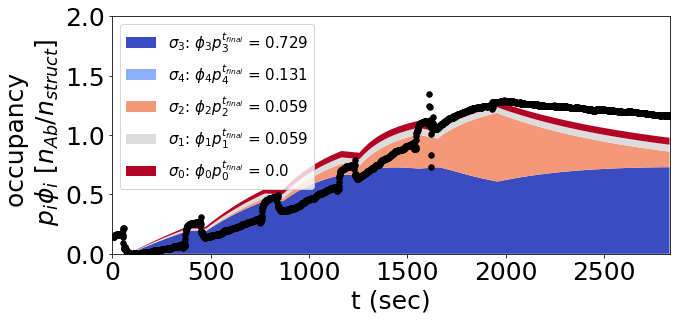

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.14104180e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.05730155]))
basinhopping step 0: f 127.516
basinhopping step 1: f 127.516 trial_f 127.516 accepted 1  lowest_f 127.516
('iggdig_21nm1', [-0.7907685101655848, 1.2684914393089495])


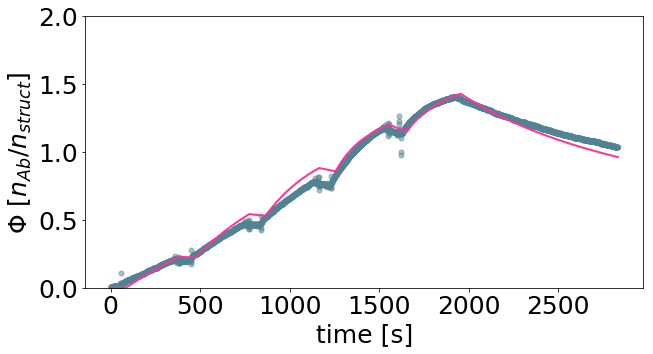

[ 0.16189427 18.55630231]


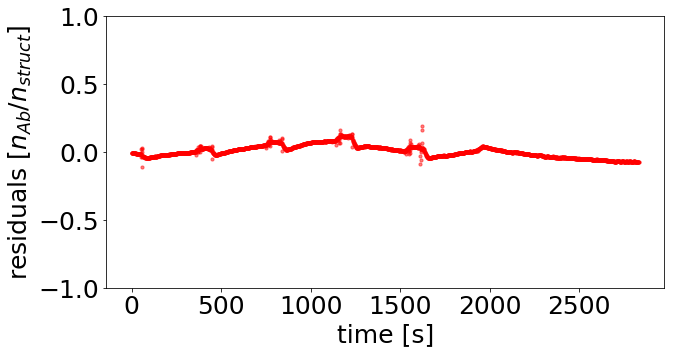

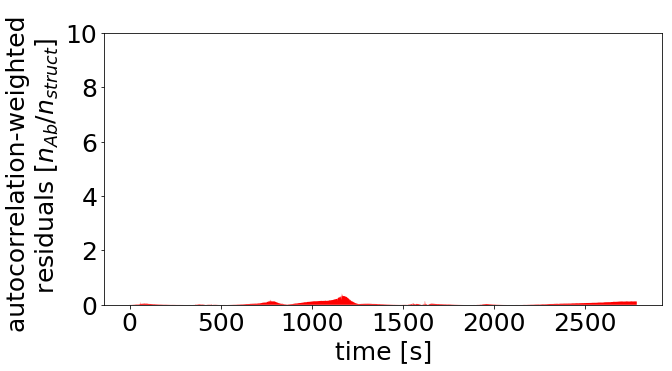

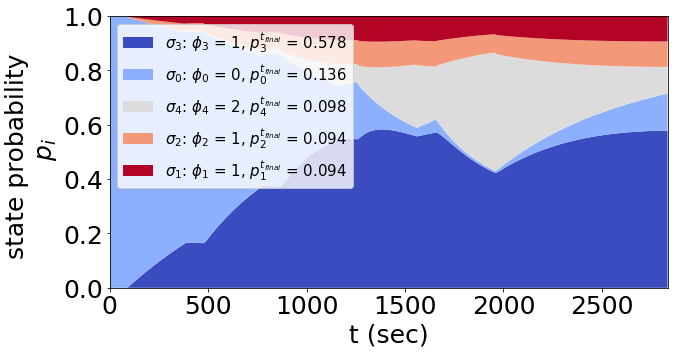

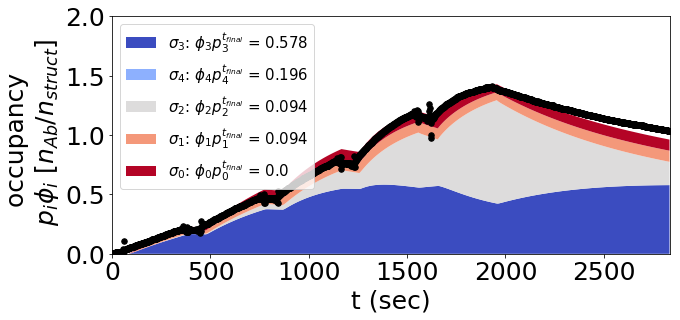

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.09660684e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04005095]))
basinhopping step 0: f 115.277
basinhopping step 1: f 115.277 trial_f 115.277 accepted 1  lowest_f 115.277
found new global minimum on step 1 with function value 115.277
('iggdig_21nm2', [-0.7505038180796256, 1.2425601817686829])


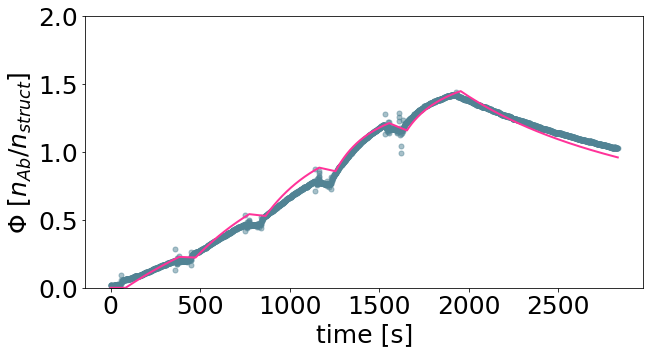

[ 0.17762177 17.48075483]


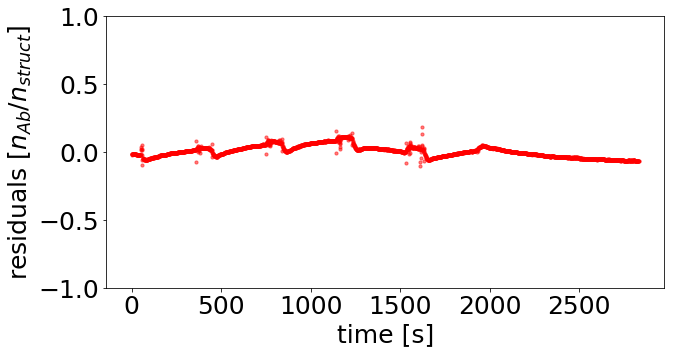

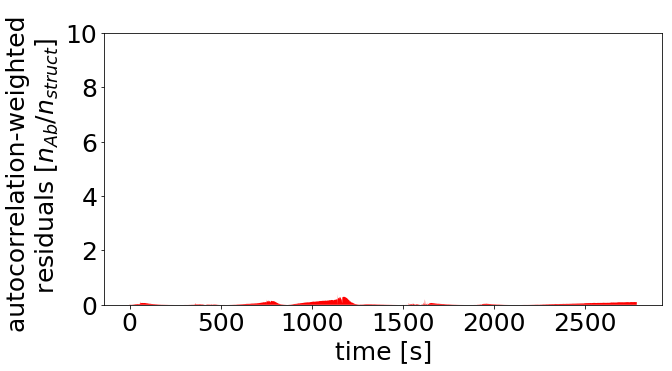

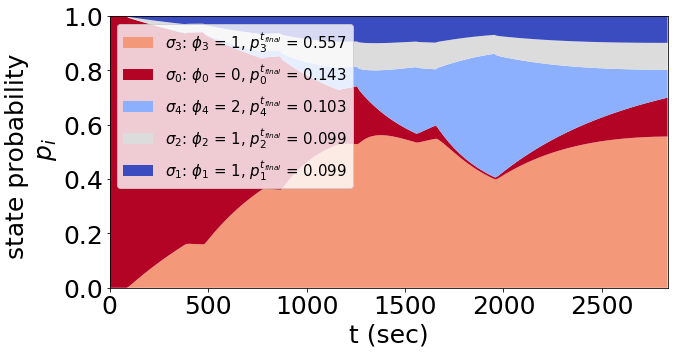

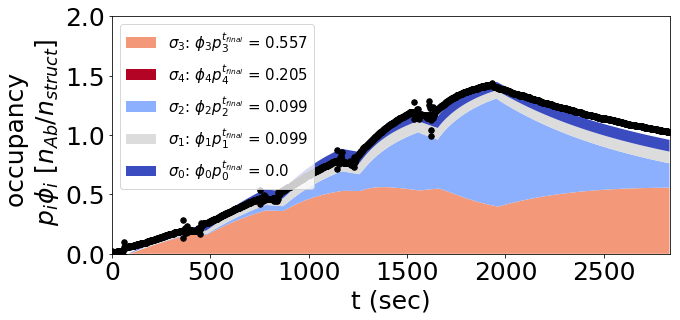

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.11305896e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04651817]))
basinhopping step 0: f 211.413
basinhopping step 1: f 211.413 trial_f 211.413 accepted 1  lowest_f 211.413
found new global minimum on step 1 with function value 211.413
('iggdig_21nm3', [-0.8914968058742277, 1.296281230674333])


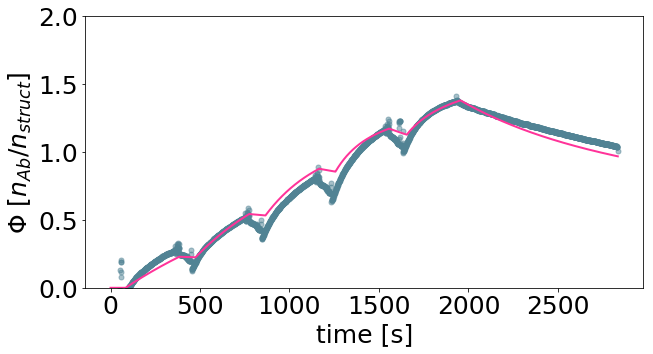

[ 0.12838172 19.78250256]


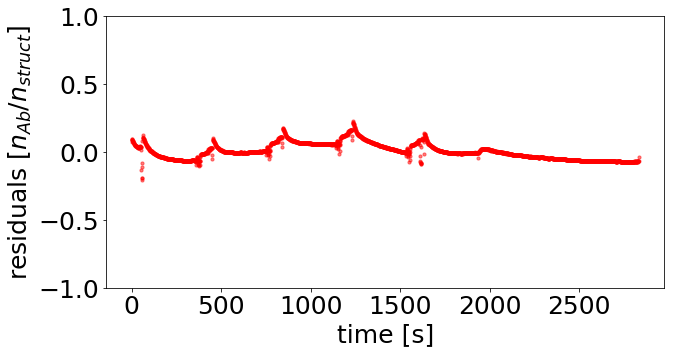

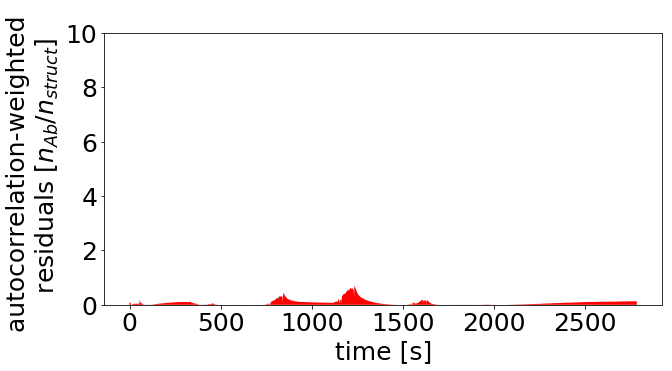

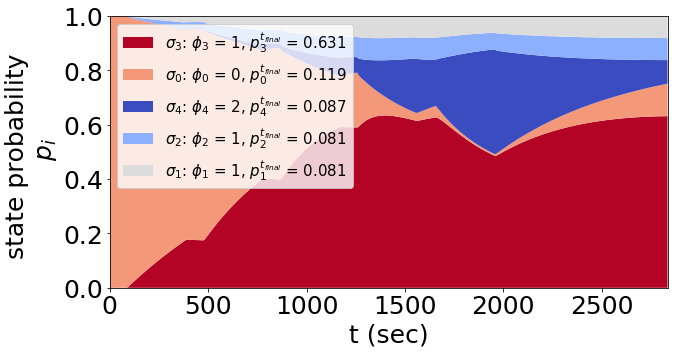

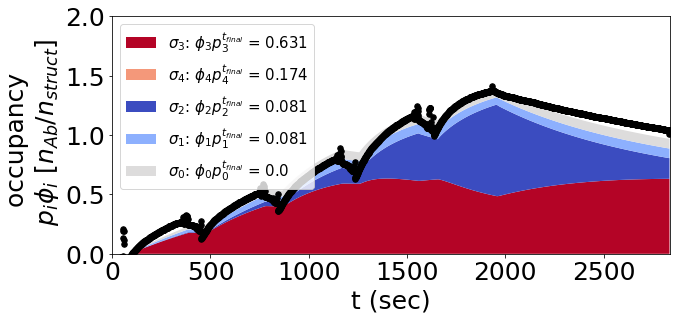

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.08656295e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.03605489]))
basinhopping step 0: f 226.604
basinhopping step 1: f 226.604 trial_f 226.604 accepted 1  lowest_f 226.604
found new global minimum on step 1 with function value 226.604
('iggdig_28nm1', [-0.8567401676648698, 1.2484593284076146])


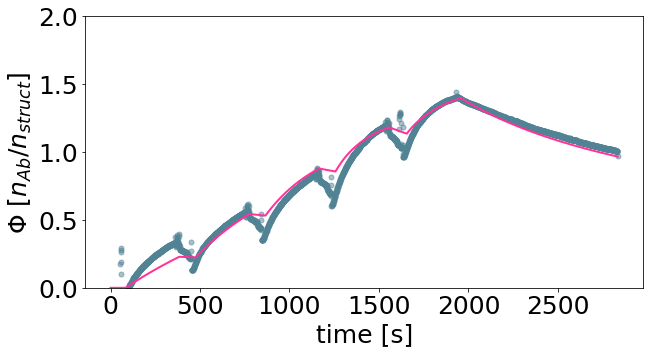

[ 0.13907845 17.71982092]


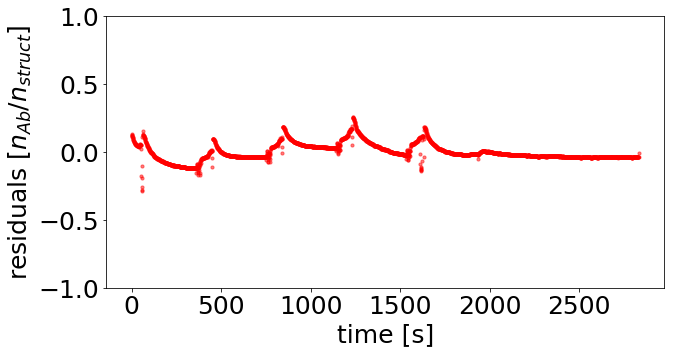

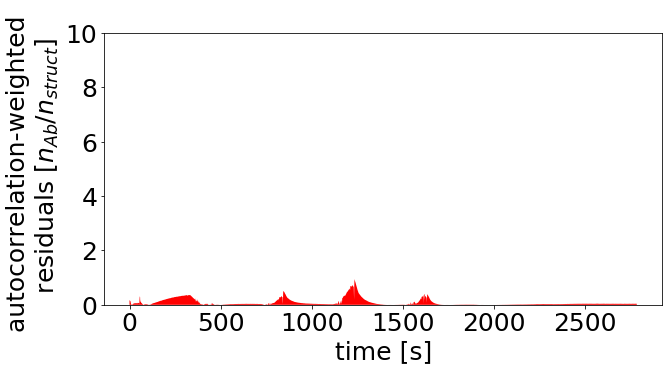

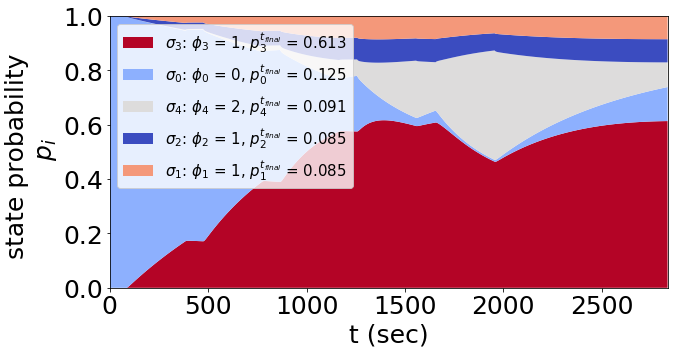

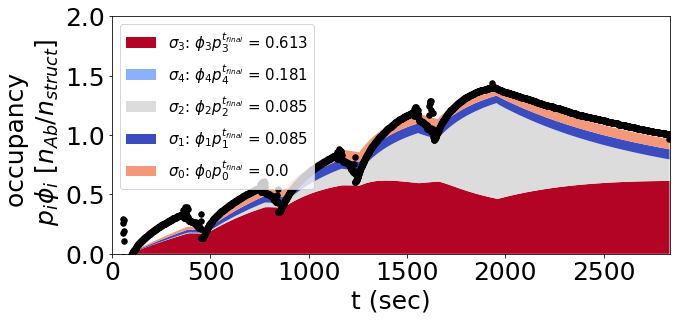

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.32182032e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12117243]))
basinhopping step 0: f 407.566
basinhopping step 1: f 407.566 trial_f 407.566 accepted 1  lowest_f 407.566
found new global minimum on step 1 with function value 407.566
('iggdig_28nm2', [-0.5560607187950851, 1.2543799096405746])


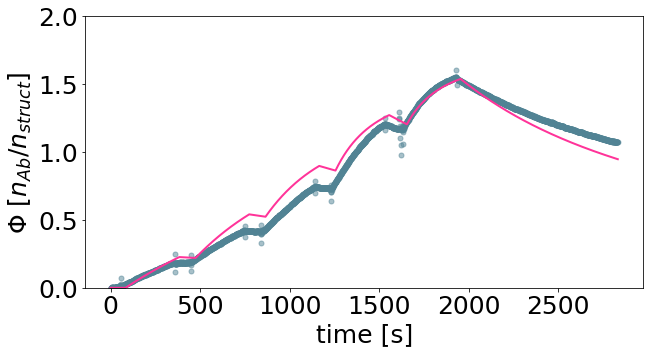

[ 0.27793247 17.96304301]


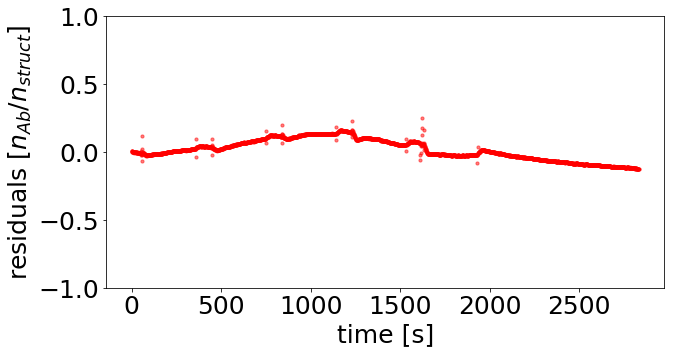

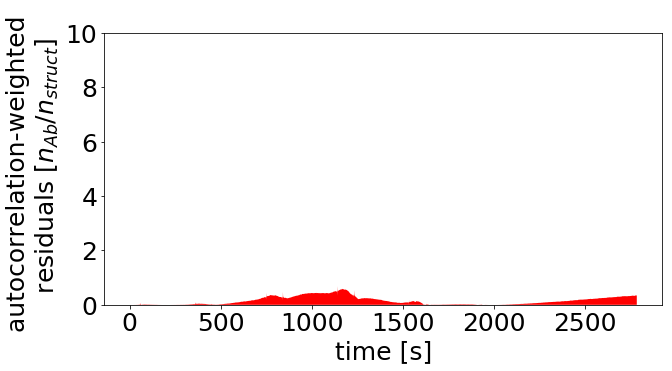

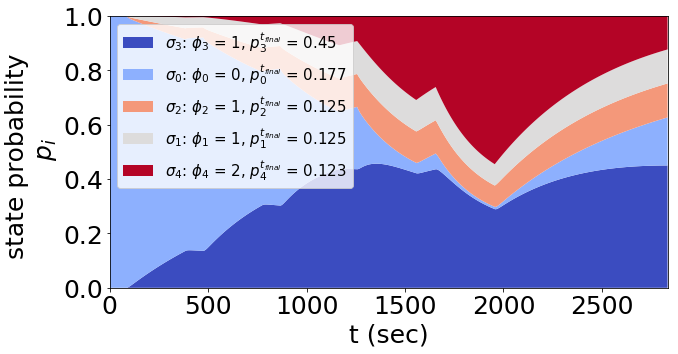

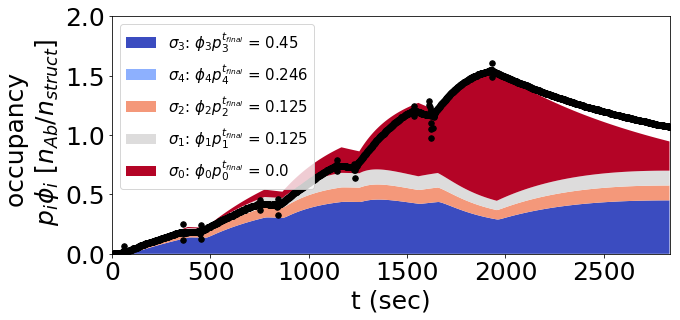

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83584091e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26383504]))
basinhopping step 0: f 121.249
basinhopping step 1: f 121.249 trial_f 121.249 accepted 1  lowest_f 121.249
found new global minimum on step 1 with function value 121.249
('iggdig_42nm1', [-0.37621355836468073, 1.333202617357517])


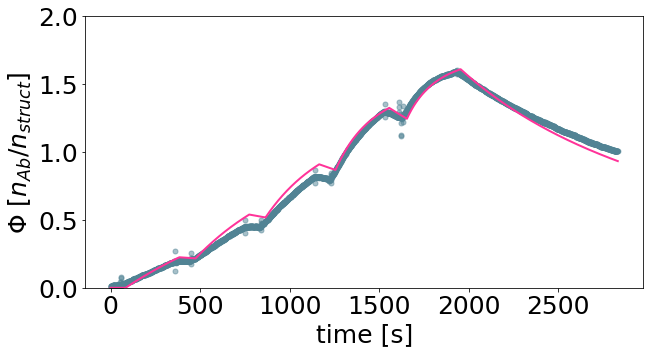

[ 0.42051979 21.53786336]


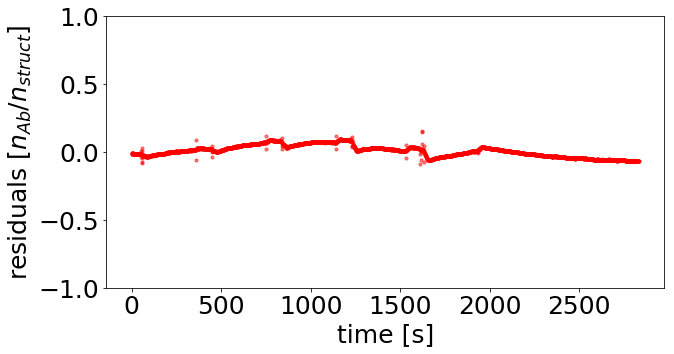

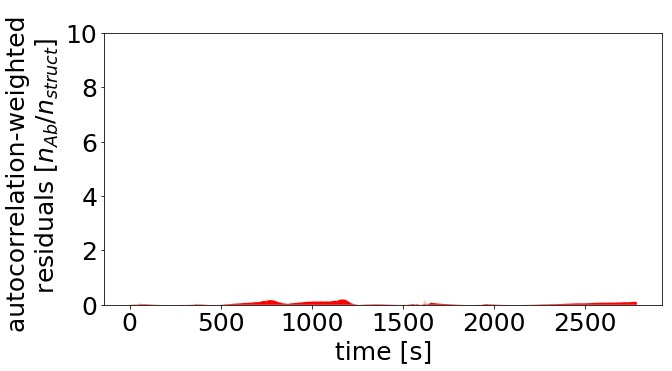

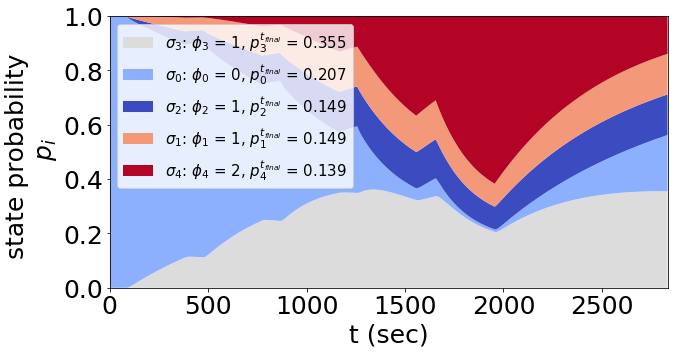

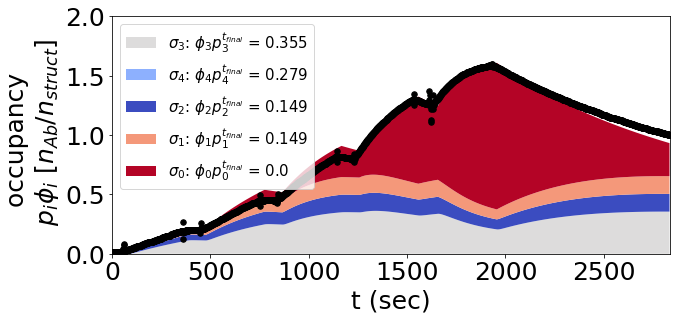

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.81904494e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.25984343]))
basinhopping step 0: f 49.262
basinhopping step 1: f 49.262 trial_f 49.262 accepted 1  lowest_f 49.262
found new global minimum on step 1 with function value 49.262
('iggdig_42nm2', [-0.4489532899867728, 1.353512370738912])


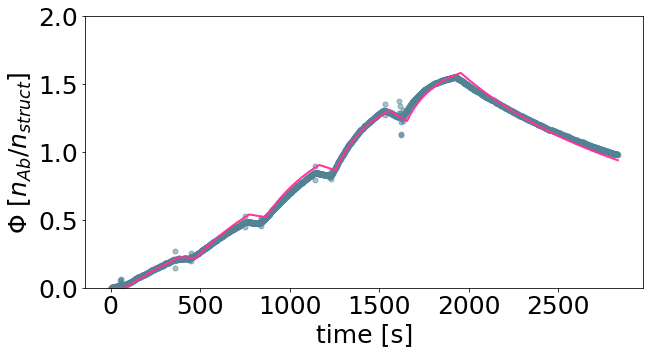

[ 0.35566957 22.56900282]


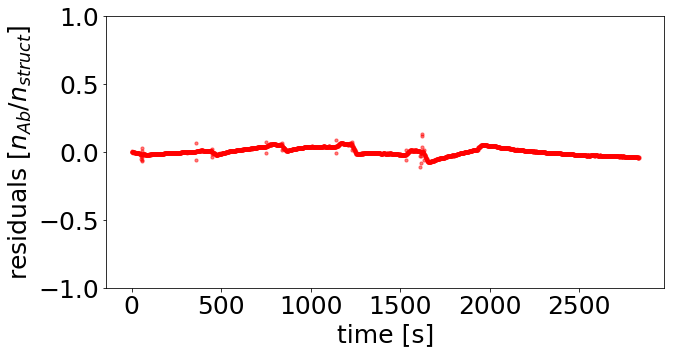

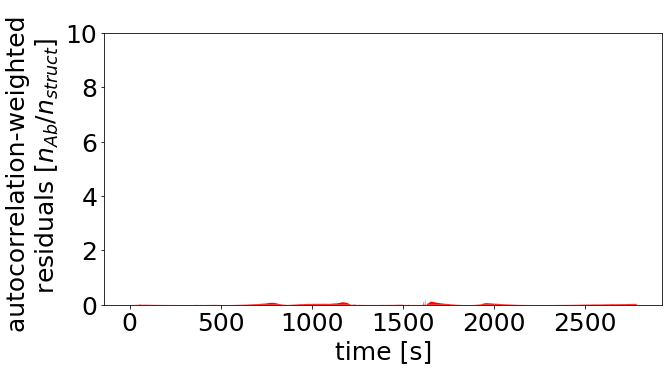

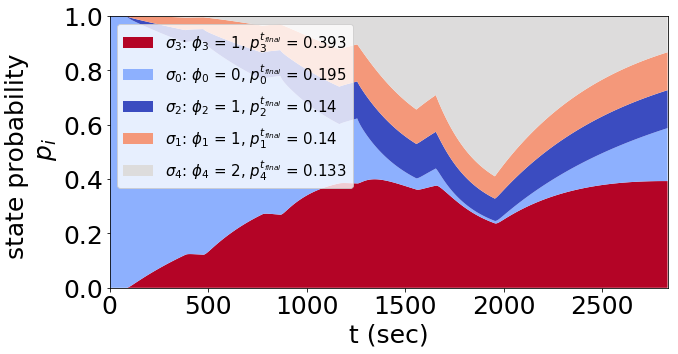

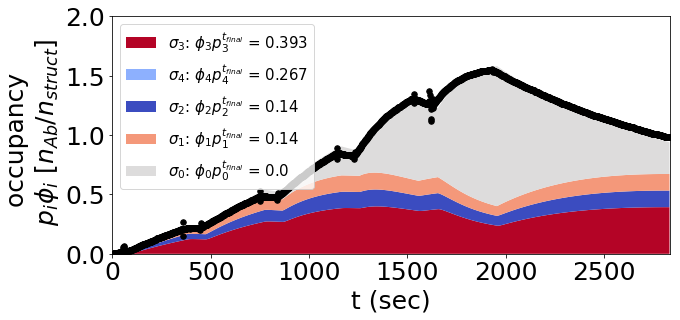

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.73861273e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.24020285]))
basinhopping step 0: f 99.9985
basinhopping step 1: f 99.9985 trial_f 99.9985 accepted 1  lowest_f 99.9985
found new global minimum on step 1 with function value 99.9985
('iggdig_84nm', [-0.3380595740222752, 1.3890276880551435])


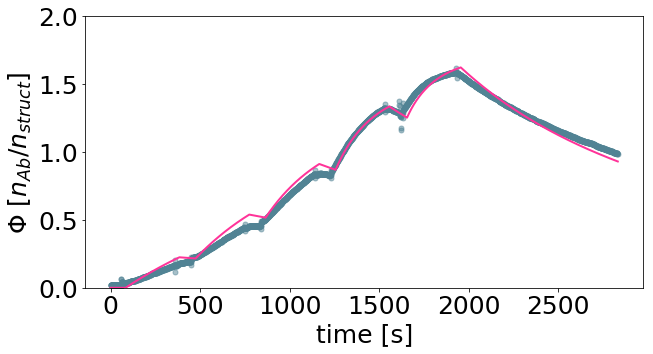

[ 0.45913503 24.49219385]


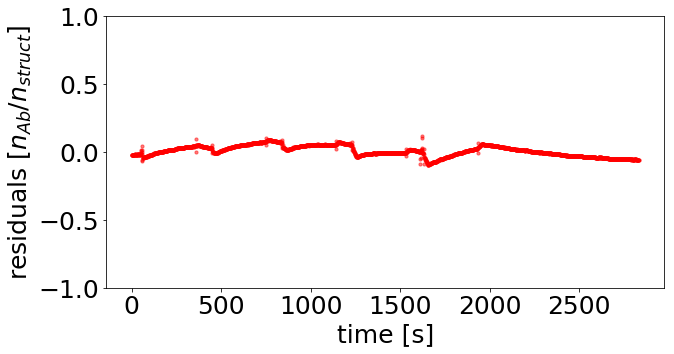

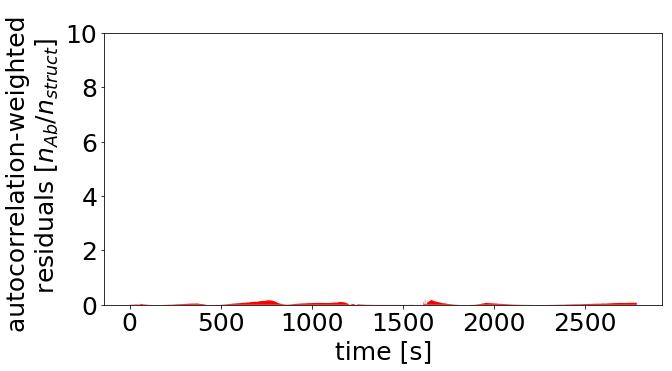

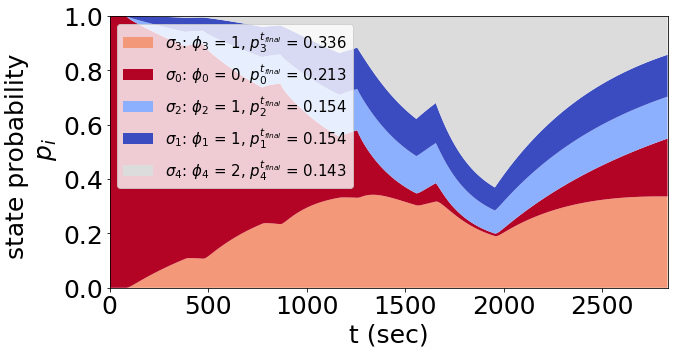

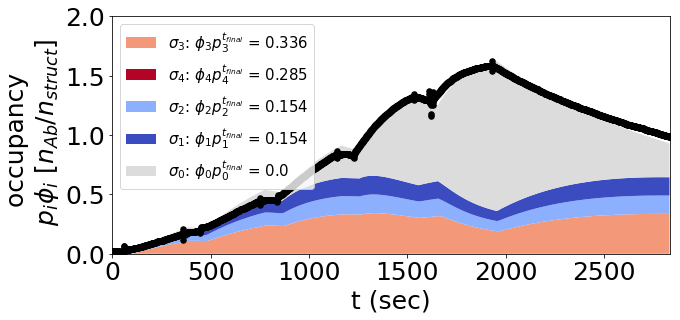

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.91564101e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.28231412]))
basinhopping step 0: f 66.3219
basinhopping step 1: f 66.3219 trial_f 66.3219 accepted 1  lowest_f 66.3219
found new global minimum on step 1 with function value 66.3219
('iggdig_99nm', [-0.692361127796525, 1.4205261357322219])


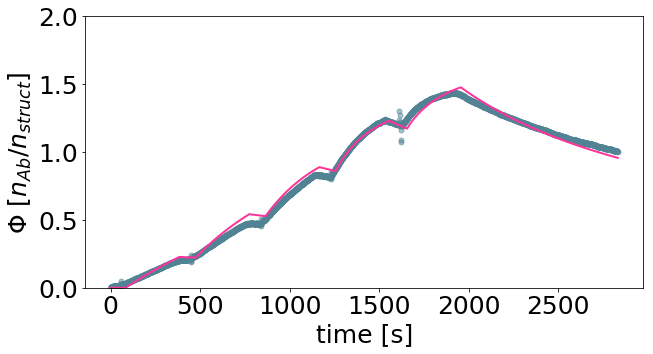

[ 0.20306678 26.3345642 ]


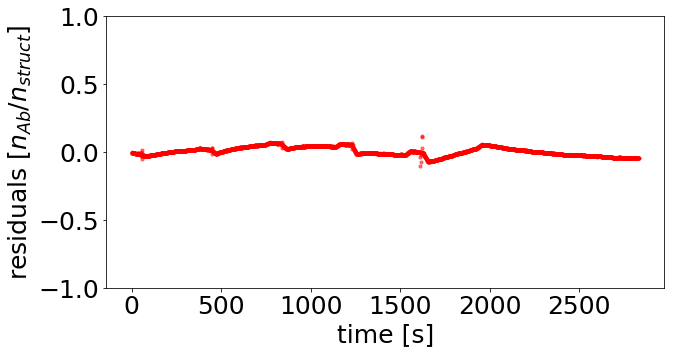

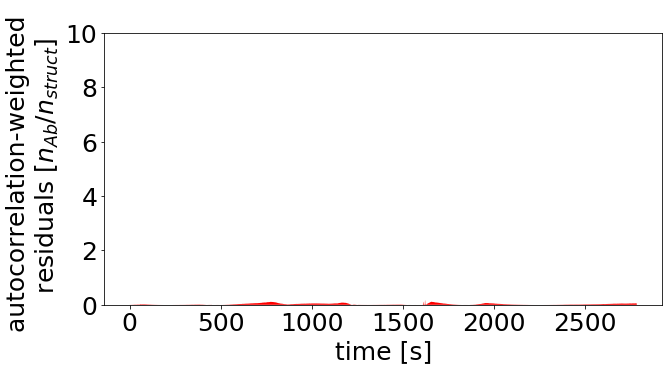

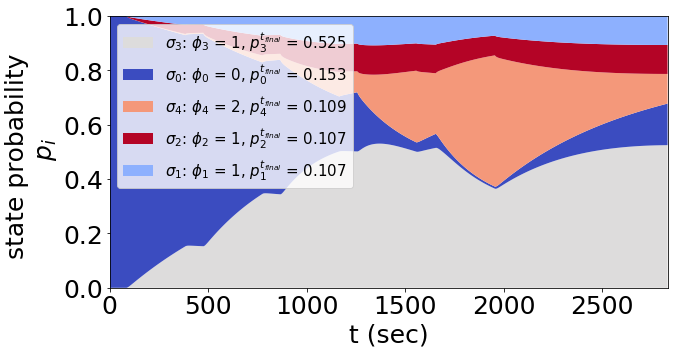

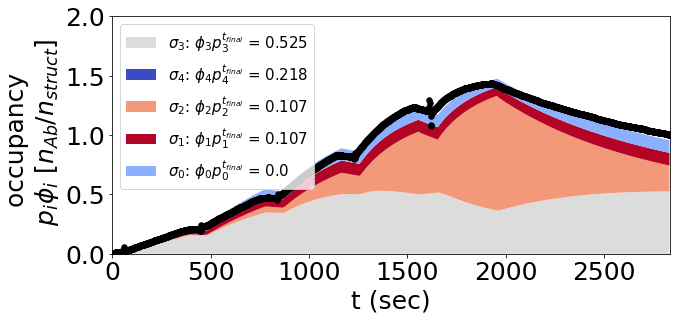

[array([-1.25212963,  1.20994508]), array([-1.21476153,  1.11678068]), array([-1.21005207,  1.28164876]), array([-1.55073237,  1.31655908]), array([-1.47311224,  1.31008488]), array([-1.70622174,  1.32484942]), array([-1.43401274,  1.19828079]), array([-1.09525286,  0.9519359 ]), array([-0.79076851,  1.26849144]), array([-0.75050382,  1.24256018]), array([-0.89149681,  1.29628123]), array([-0.85674017,  1.24845933]), array([-0.55606072,  1.25437991]), array([-0.37621356,  1.33320262]), array([-0.44895329,  1.35351237]), array([-0.33805957,  1.38902769]), array([-0.69236113,  1.42052614])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-1.25212963,  1.20994508]), array([-1.21476153,  1.11678068]), array([-1.21005207,  1.28164876]), array([-1.55073237,  1.31655908]), array([-1.47311224,  1.31008488]), array([-1.70622174,  1.32484942]), array([-1.43401274,  1.19828079]), array([-1.09525286,  0.9519359 ]), array([-0.79076851,  1.26849144]), array([-0.75050382,  1.24256018]),

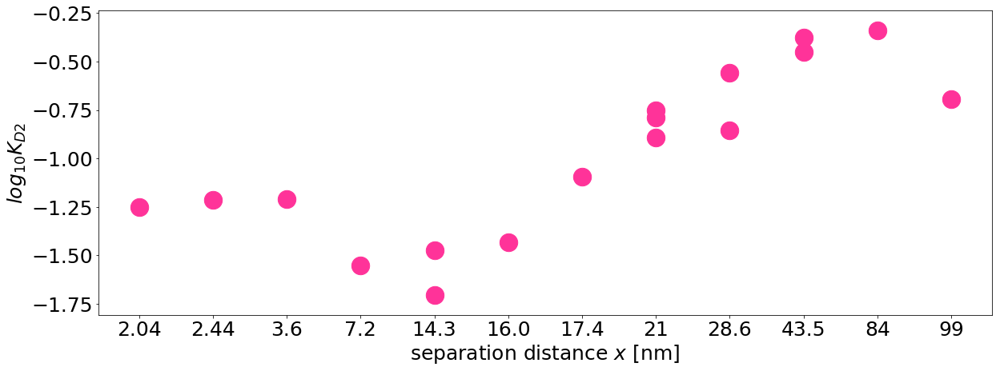

In [65]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_upper95"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_gupper95, k_off_gupper95]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_upper95 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_upper95)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_upper95).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_upper95,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

# Alpha function fitting - with K_D - based on upper68 KD1

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.53022425e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.18475508]))
basinhopping step 0: f 2283.39
basinhopping step 1: f 2283.39 trial_f 2283.39 accepted 1  lowest_f 2283.39
('iggdig_204nm', [-1.2309536902808766, 1.2133443066314544])


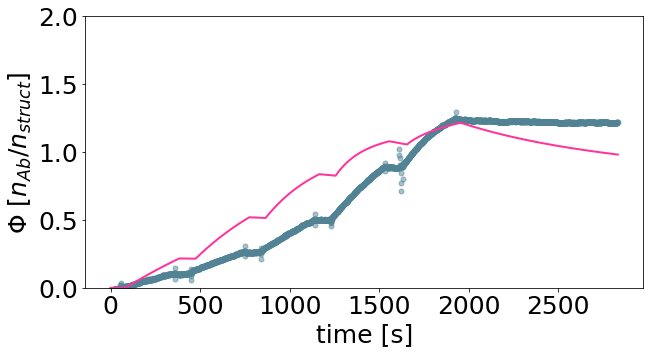

[ 0.0587552  16.34347137]


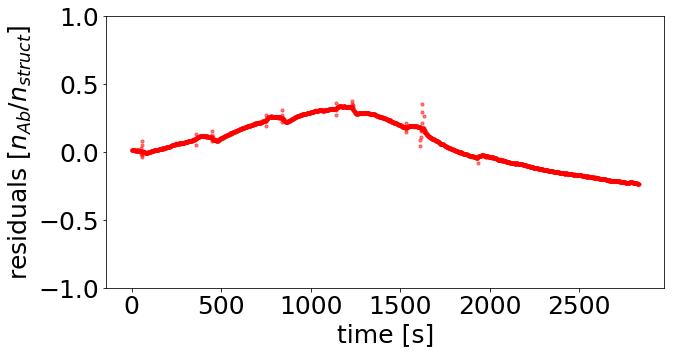

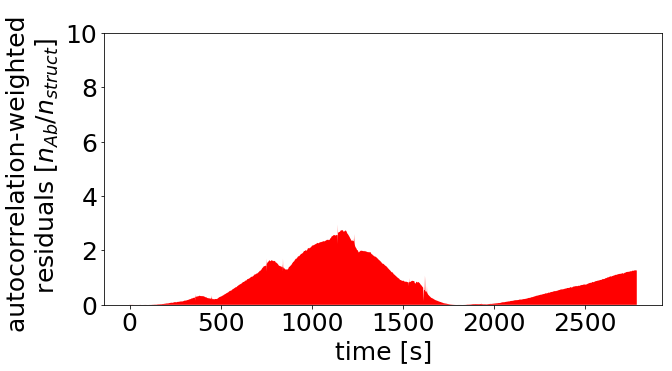

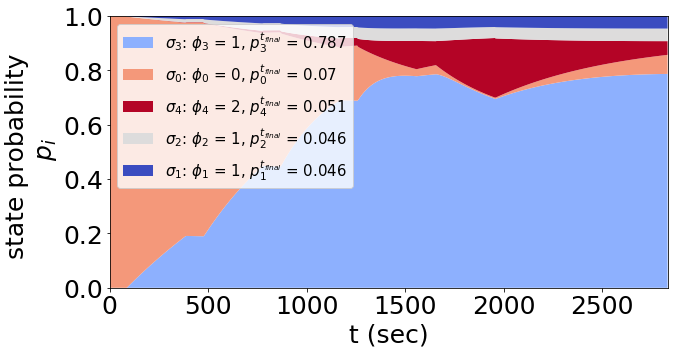

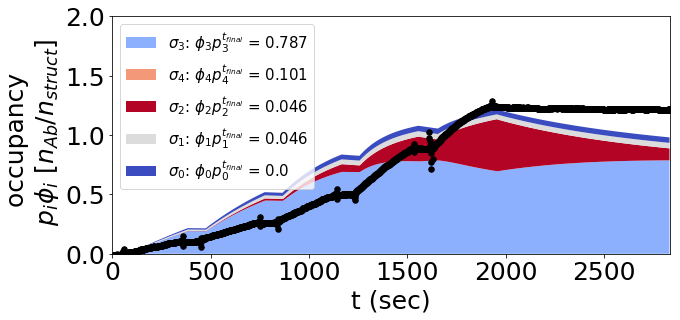

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.18763247e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.07468206]))
basinhopping step 0: f 957.079
basinhopping step 1: f 957.079 trial_f 957.079 accepted 1  lowest_f 957.079
('iggdig_244nm', [-1.220540406199771, 1.1223056861540261])


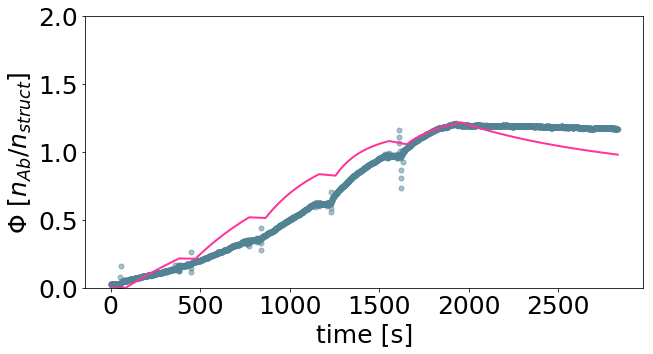

[ 0.06018103 13.25274025]


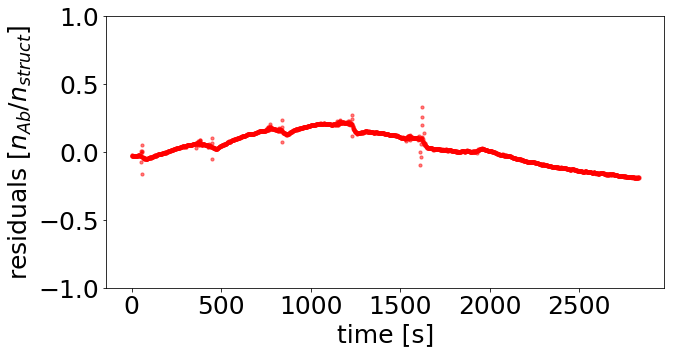

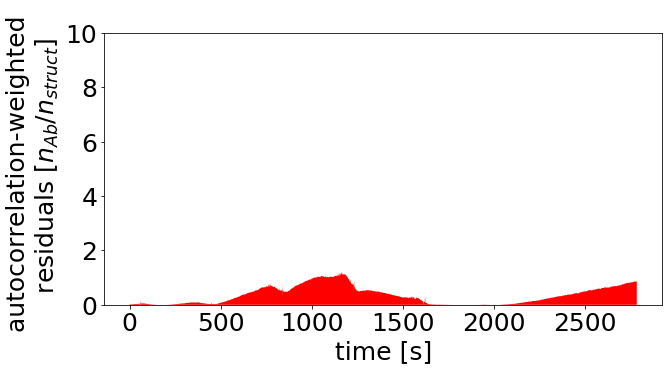

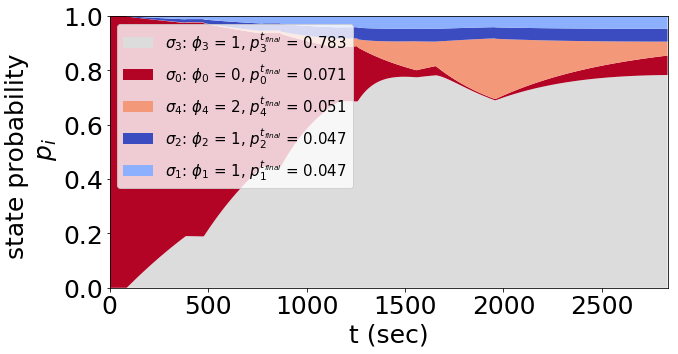

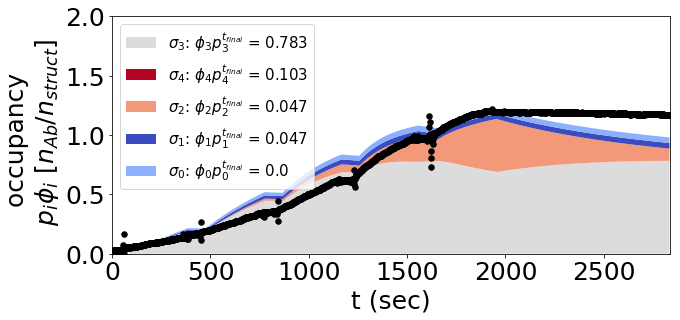

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.62600644e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.21112226]))
basinhopping step 0: f 613.902
basinhopping step 1: f 613.902 trial_f 613.902 accepted 1  lowest_f 613.902
('iggdig_3nm', [-1.2268601218223427, 1.287962837075173])


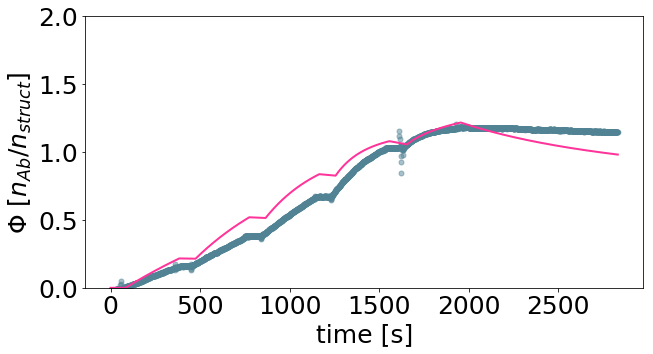

[ 0.05931163 19.40719802]


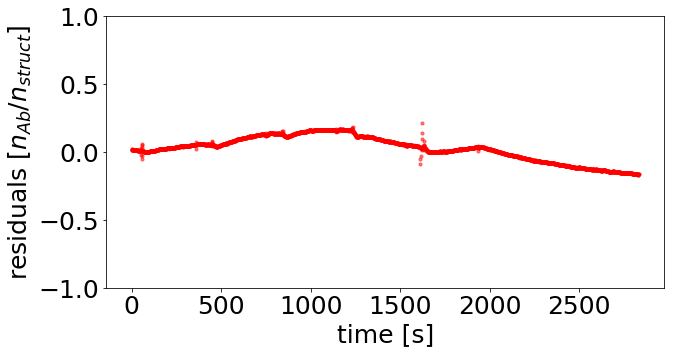

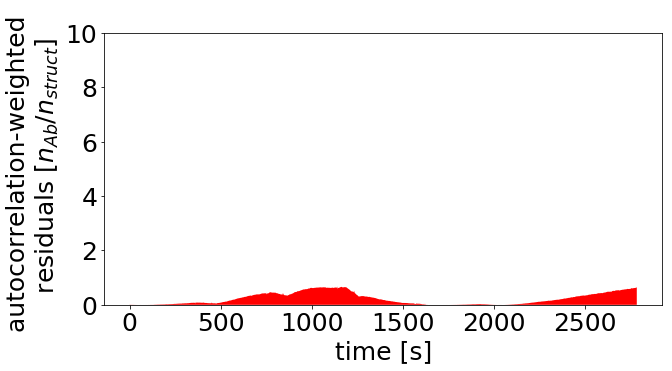

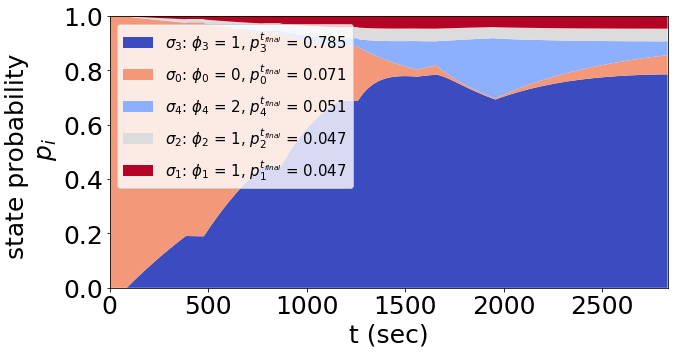

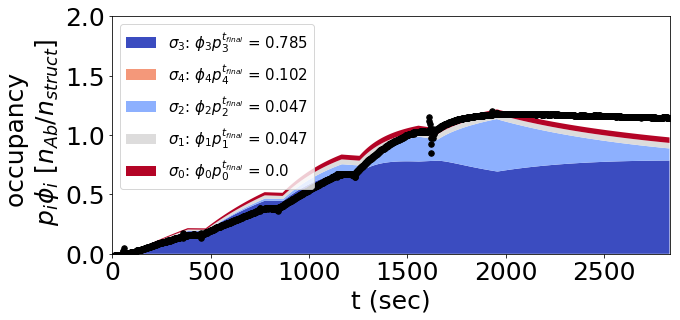

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.84588619e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26620492]))
basinhopping step 0: f 32.8281
basinhopping step 1: f 32.8281 trial_f 32.8281 accepted 1  lowest_f 32.8281
('iggdig_7nm', [-1.6469846715931358, 1.3245951544821228])


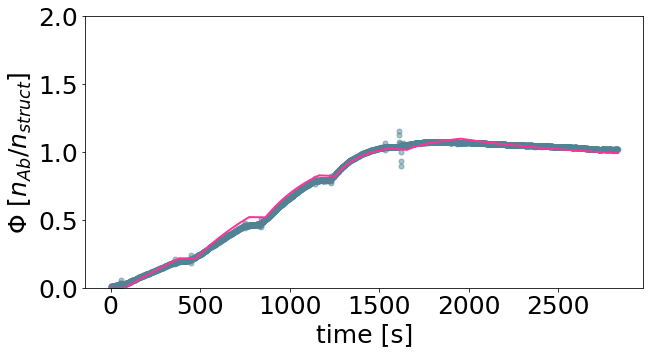

[ 0.02254319 21.11519782]


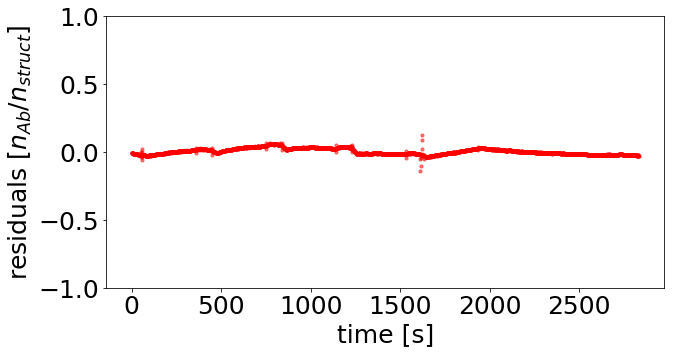

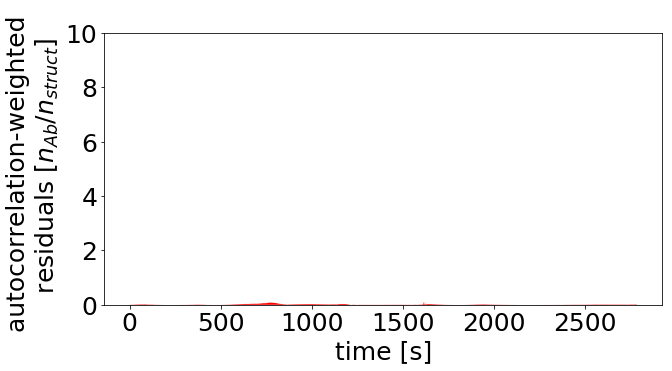

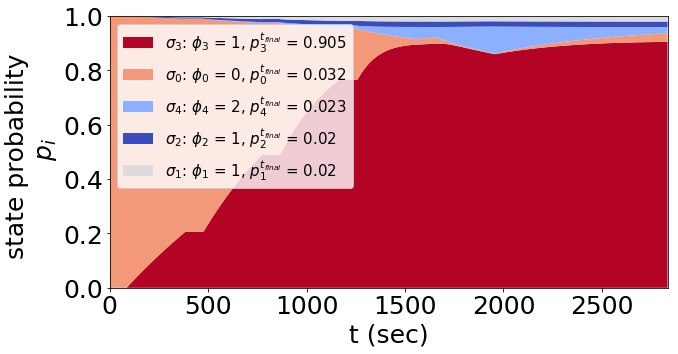

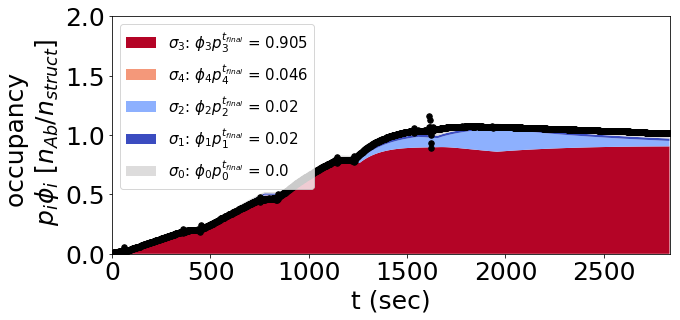

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.86106285e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26976104]))
basinhopping step 0: f 54.9283
basinhopping step 1: f 54.9283 trial_f 54.9283 accepted 1  lowest_f 54.9283
found new global minimum on step 1 with function value 54.9283
('iggdig_14nm1', [-1.5532102970031723, 1.3182463489542442])


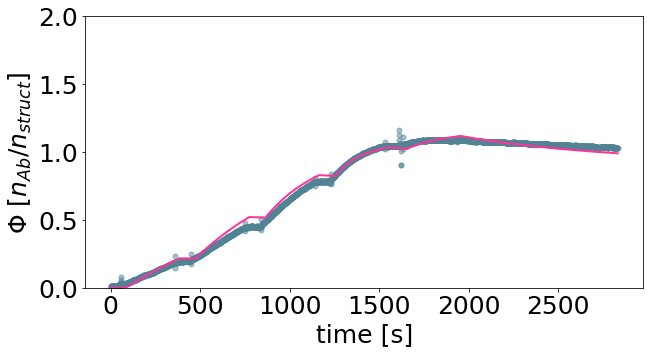

[ 0.02797626 20.80876708]


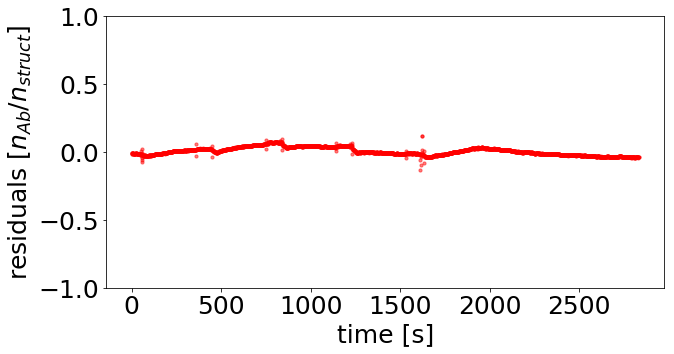

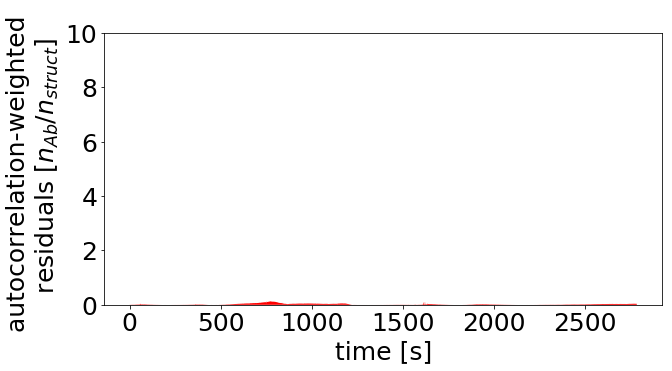

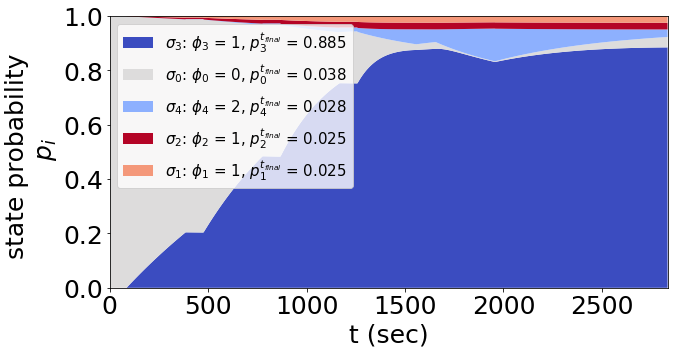

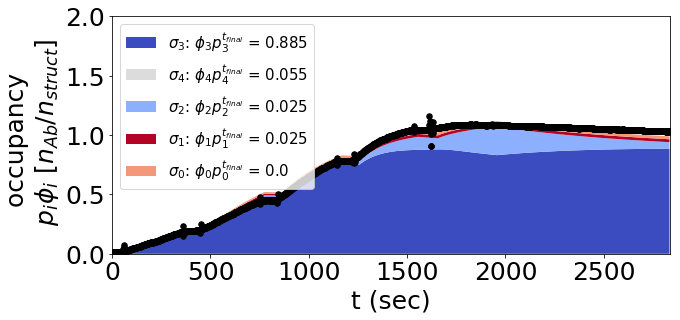

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83567607e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26379605]))
basinhopping step 0: f 15.0358
basinhopping step 1: f 15.0358 trial_f 15.0358 accepted 1  lowest_f 15.0358
found new global minimum on step 1 with function value 15.0358
('iggdig_14nm2', [-1.844880064910096, 1.3326473346803251])


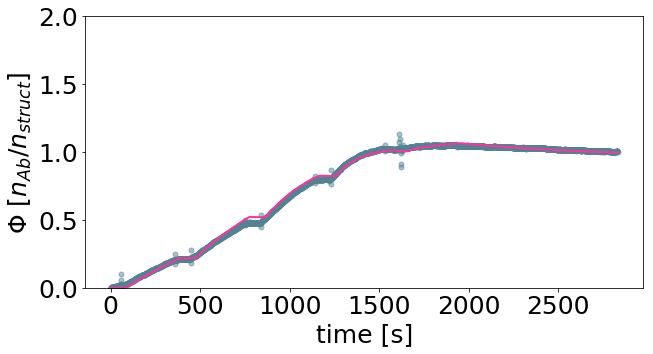

[1.42928862e-02 2.15103430e+01]


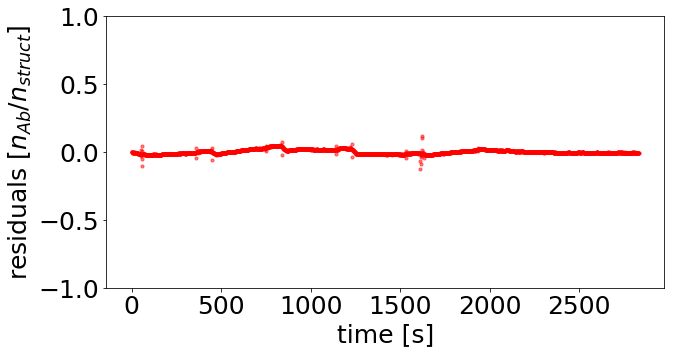

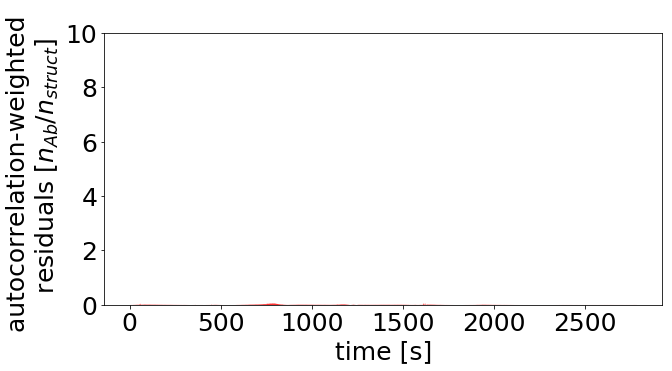

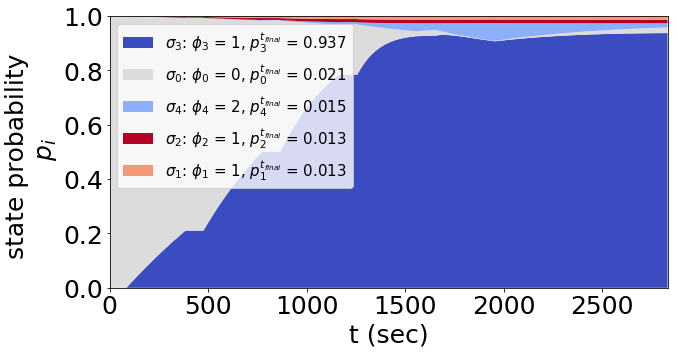

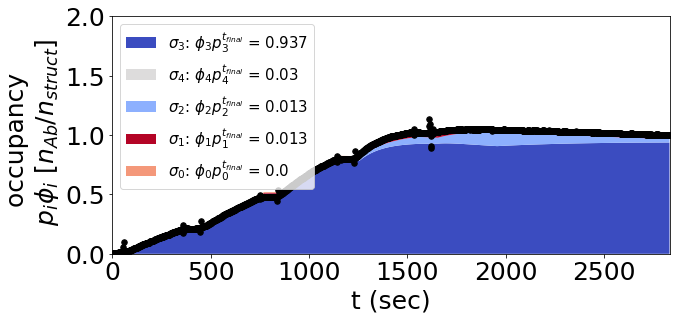

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.33492475e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12545679]))
basinhopping step 0: f 121.932
basinhopping step 1: f 121.932 trial_f 121.932 accepted 1  lowest_f 121.932
('iggdig_16nm', [-1.4989924136836337, 1.2059644259836035])


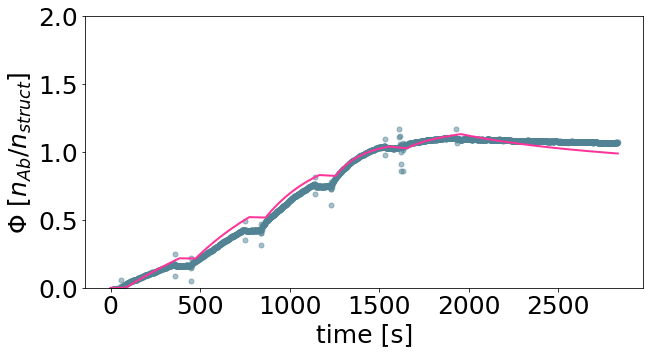

[ 0.03169623 16.0680963 ]


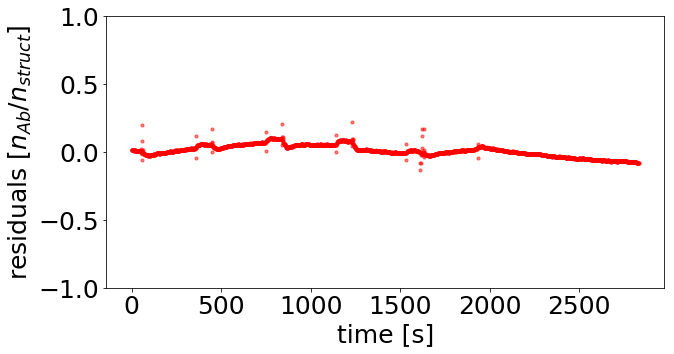

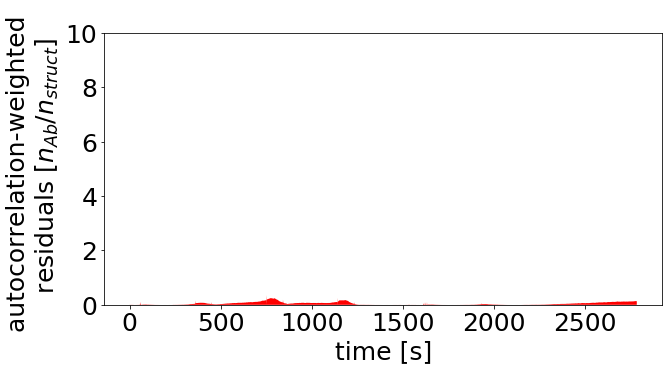

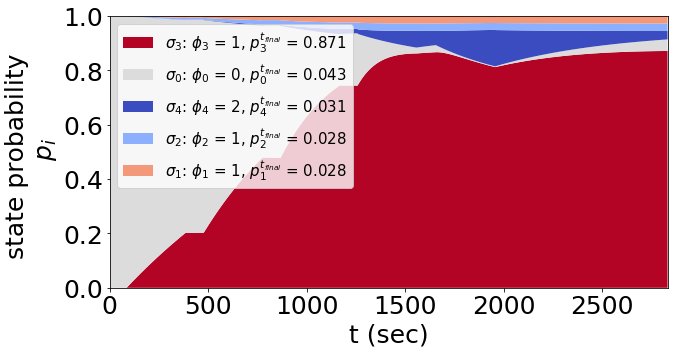

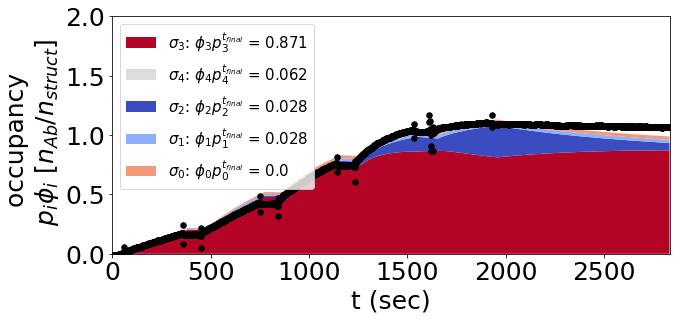

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.16488361e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.06628253]))
basinhopping step 0: f 1294.18
basinhopping step 1: f 1294.18 trial_f 1294.18 accepted 1  lowest_f 1294.18
('iggdig_17nm', [-1.0861802695836071, 0.9567771481159834])


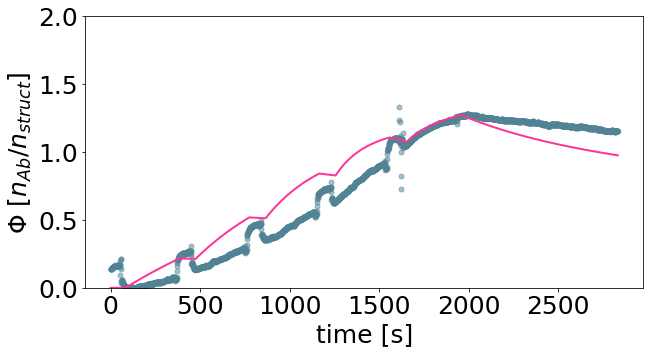

[0.08200111 9.05267957]


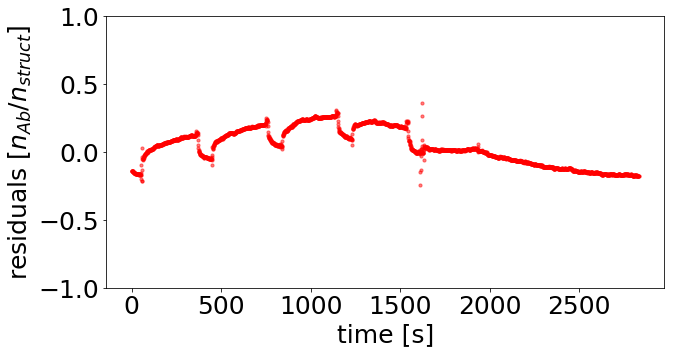

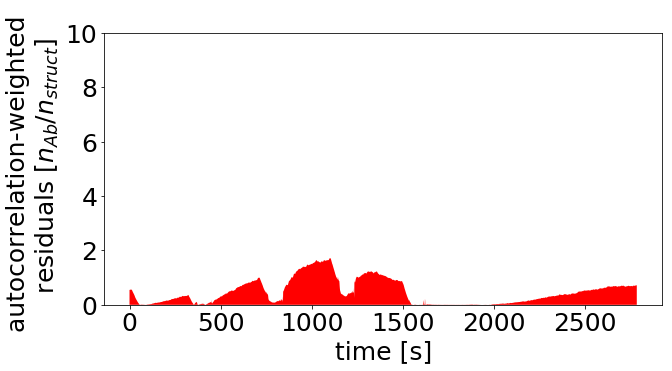

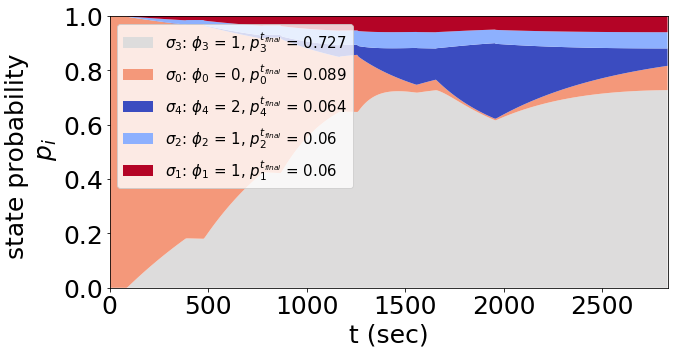

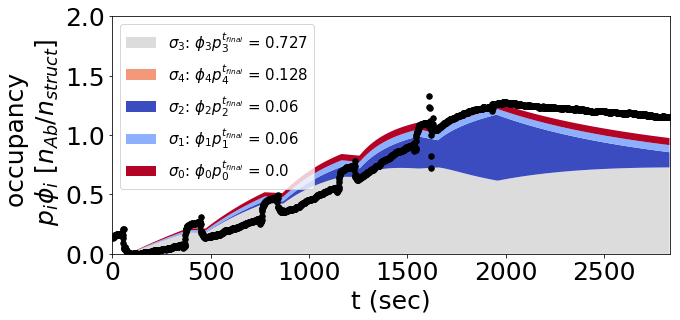

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.14104180e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.05730155]))
basinhopping step 0: f 81.2338
basinhopping step 1: f 81.2338 trial_f 81.2338 accepted 1  lowest_f 81.2338
found new global minimum on step 1 with function value 81.2338
('iggdig_21nm1', [-0.8087390582687781, 1.276858654358509])


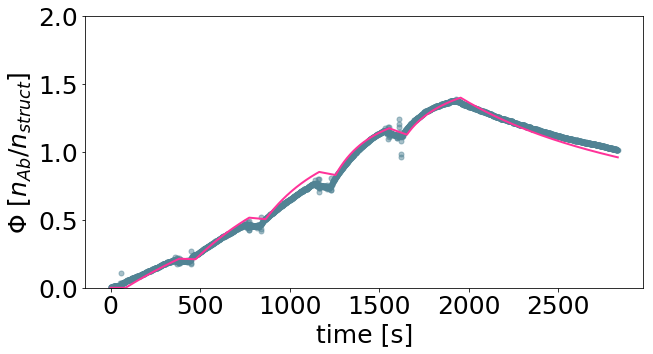

[ 0.155332   18.91727836]


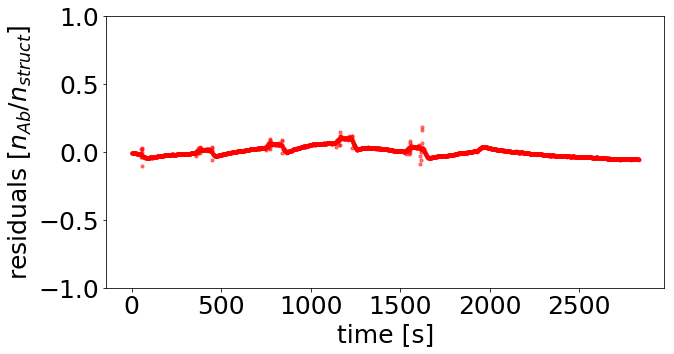

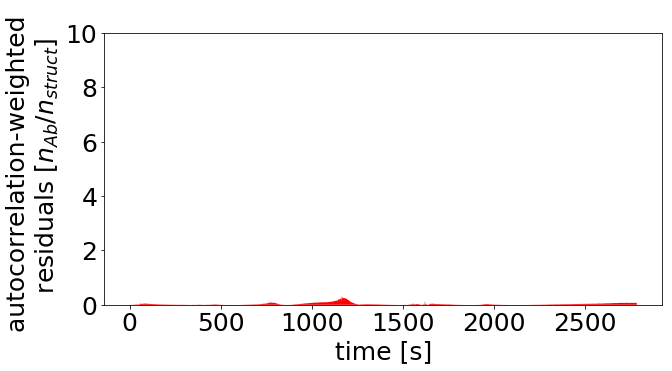

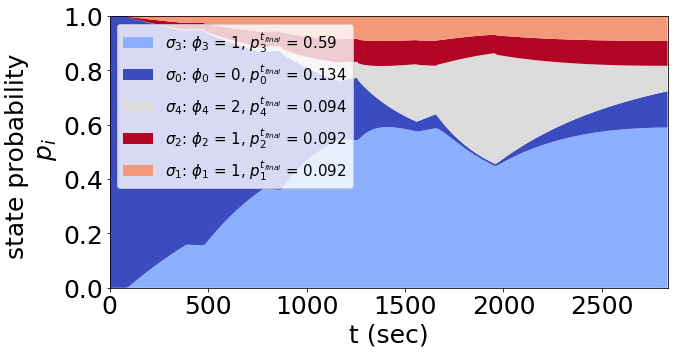

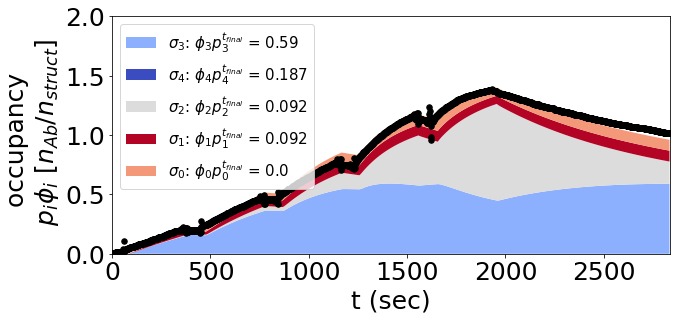

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.09660684e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04005095]))
basinhopping step 0: f 73.2845
basinhopping step 1: f 73.2845 trial_f 73.2845 accepted 1  lowest_f 73.2845
found new global minimum on step 1 with function value 73.2845
('iggdig_21nm2', [-0.7735308187953095, 1.251525014096156])


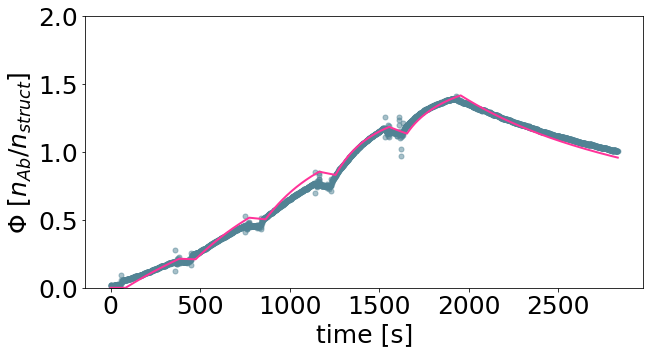

[ 0.16844929 17.8453477 ]


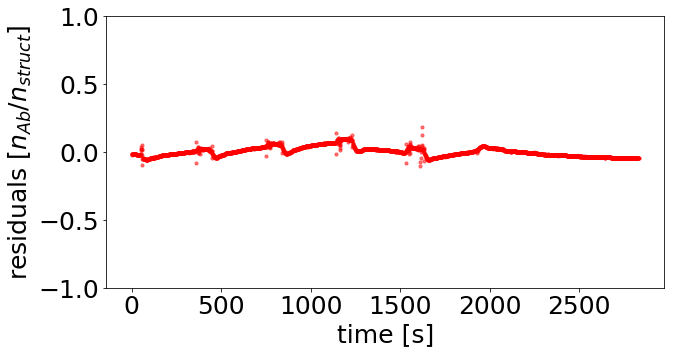

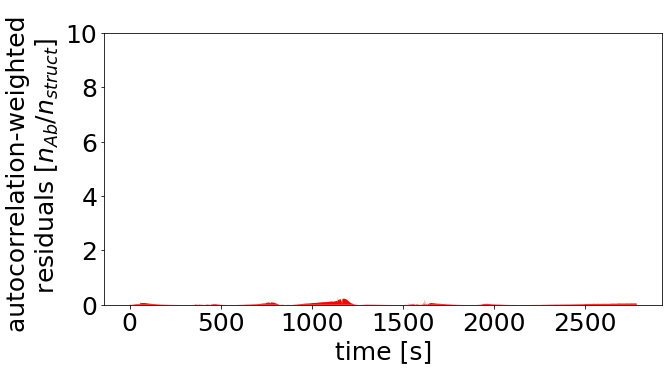

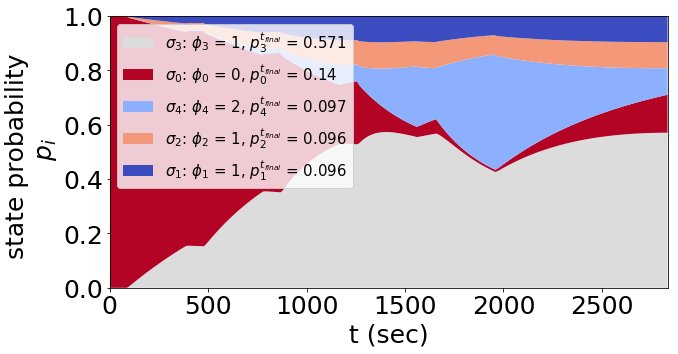

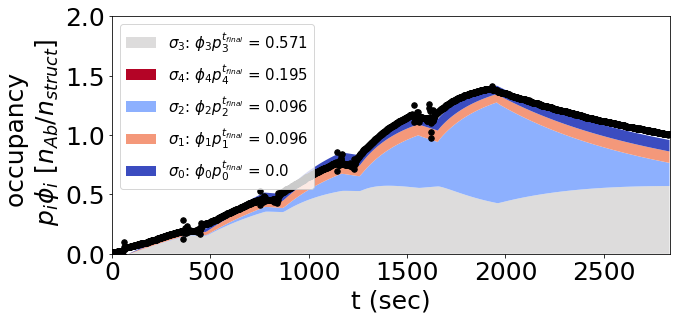

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.11305896e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04651817]))
basinhopping step 0: f 161.351
basinhopping step 1: f 161.351 trial_f 161.351 accepted 1  lowest_f 161.351
('iggdig_21nm3', [-0.9099690543957026, 1.3043713228068505])


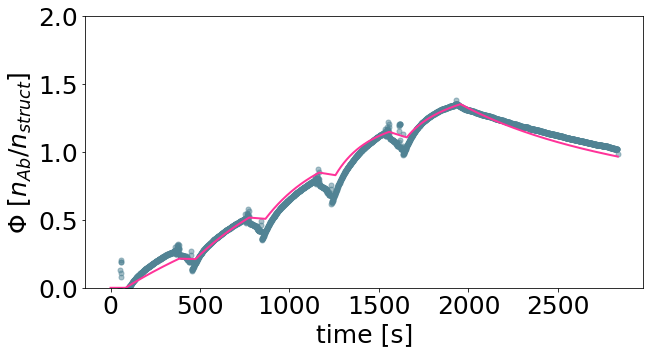

[ 0.12303564 20.15446725]


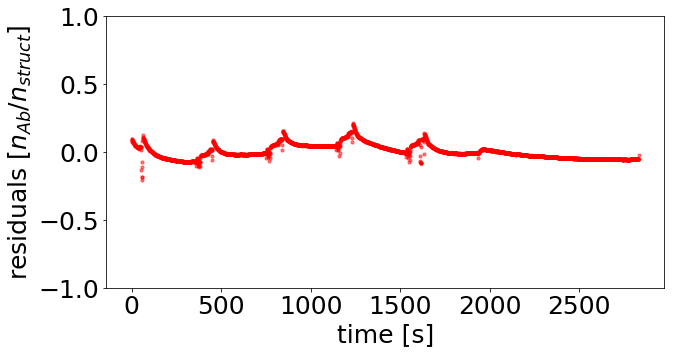

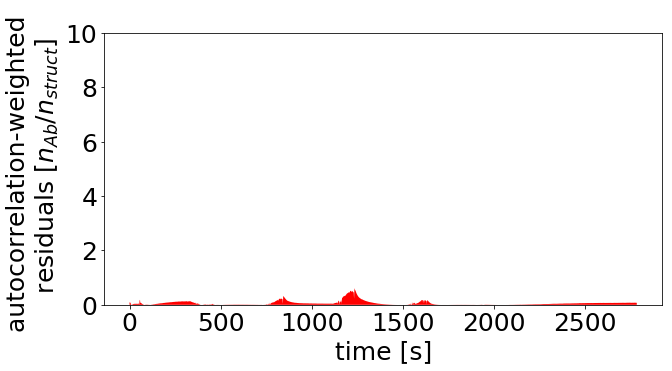

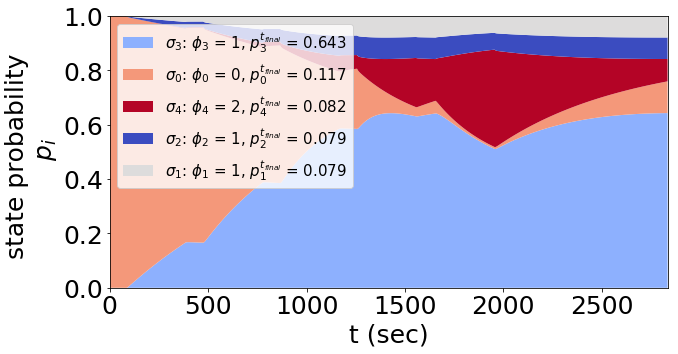

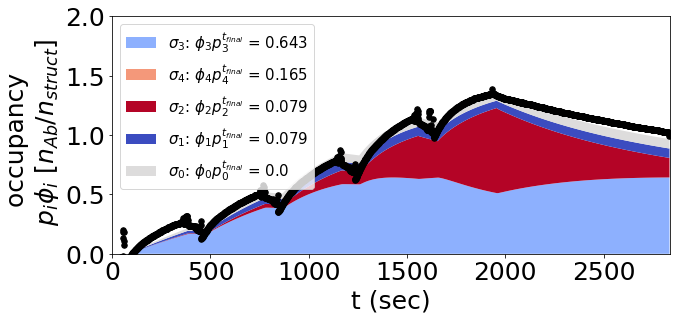

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.08656295e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.03605489]))
basinhopping step 0: f 197.973
basinhopping step 1: f 197.973 trial_f 197.973 accepted 1  lowest_f 197.973
found new global minimum on step 1 with function value 197.973
('iggdig_28nm1', [-0.8743084948775471, 1.2566453645388422])


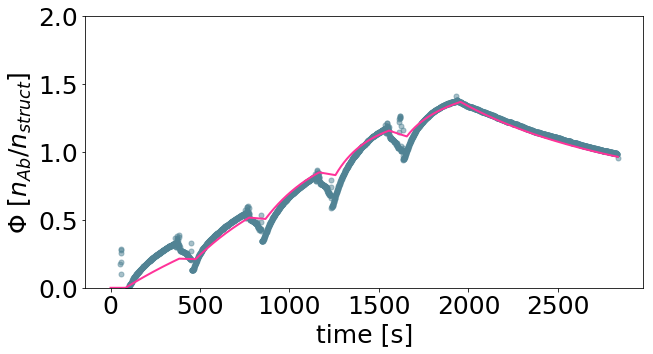

[ 0.13356464 18.05699029]


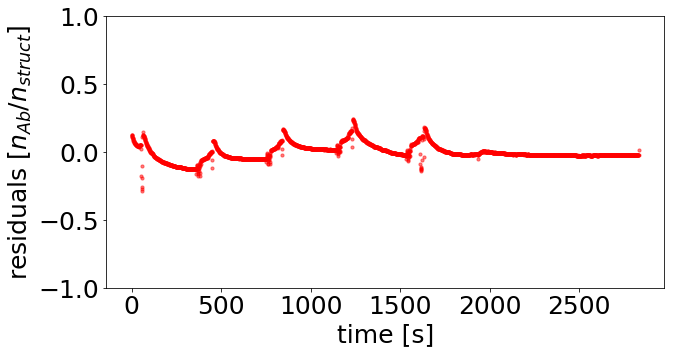

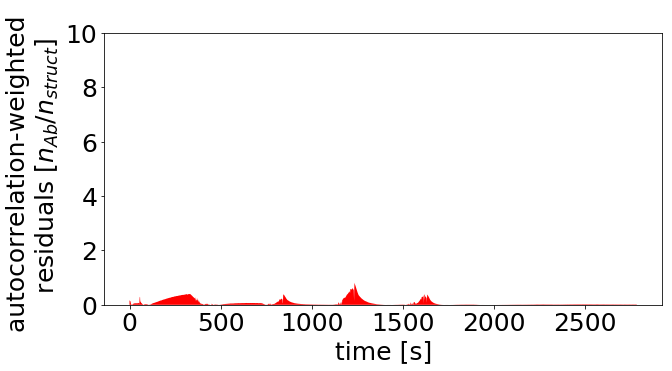

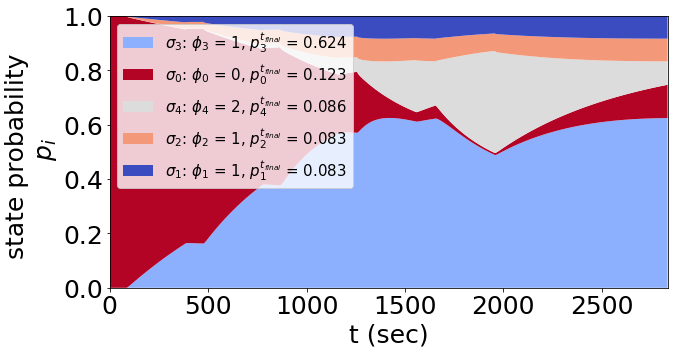

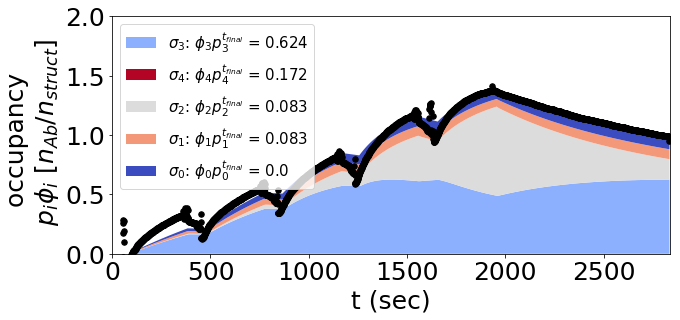

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.32182032e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12117243]))
basinhopping step 0: f 293.09
basinhopping step 1: f 293.09 trial_f 293.09 accepted 1  lowest_f 293.09
('iggdig_28nm2', [-0.5444358567218257, 1.2608384200437337])


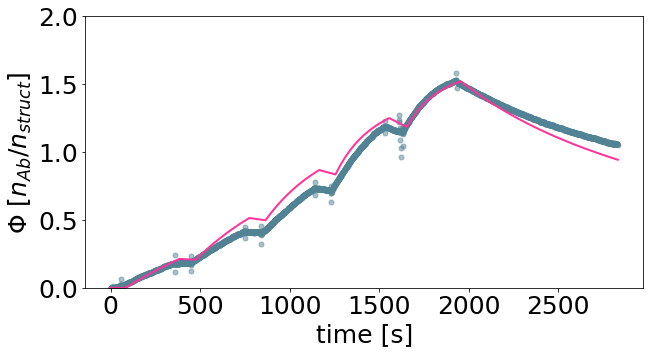

[ 0.28547241 18.23217245]


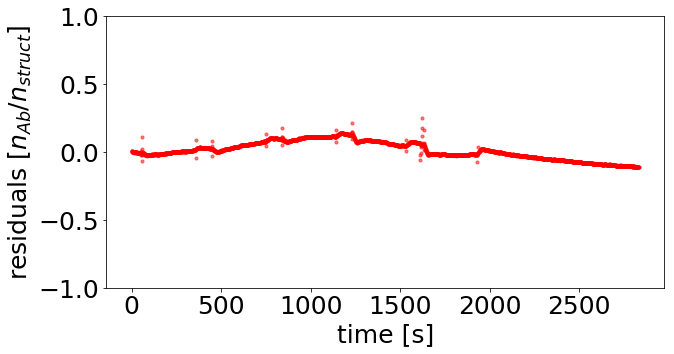

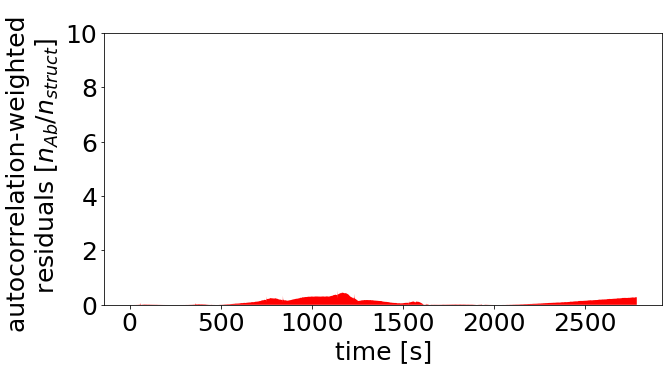

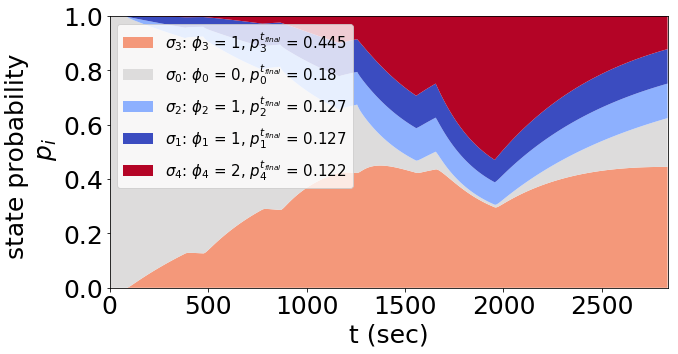

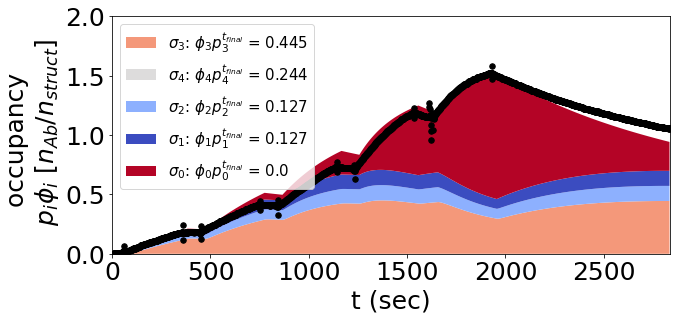

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83584091e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26383504]))
basinhopping step 0: f 69.2024
basinhopping step 1: f 69.2024 trial_f 69.2024 accepted 1  lowest_f 69.2024
('iggdig_42nm1', [-0.38367646022777646, 1.3413720003053304])


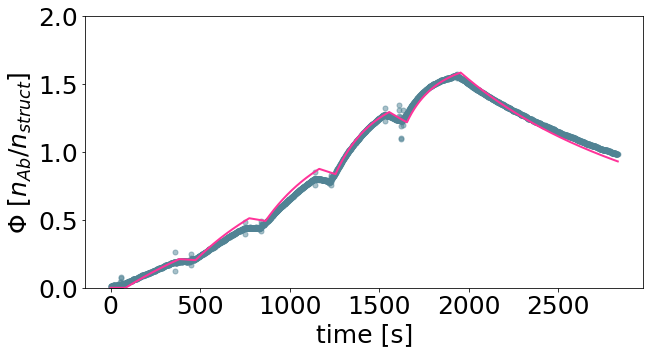

[ 0.41335533 21.94684014]


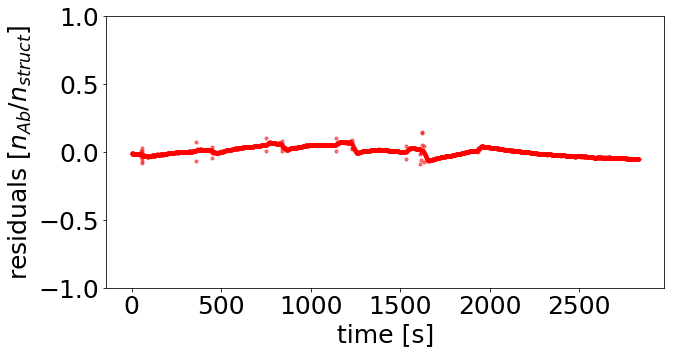

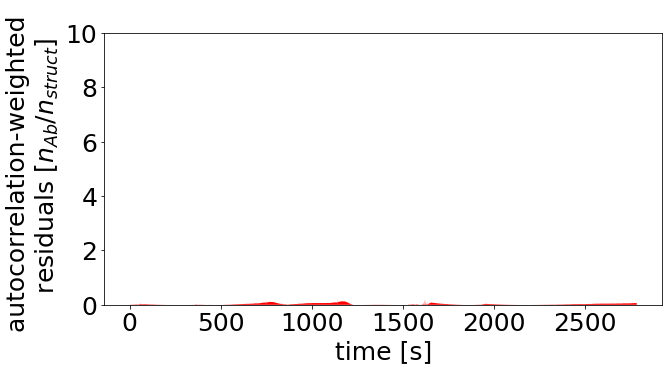

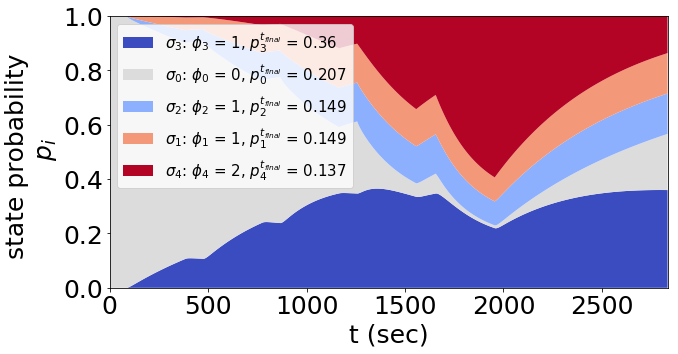

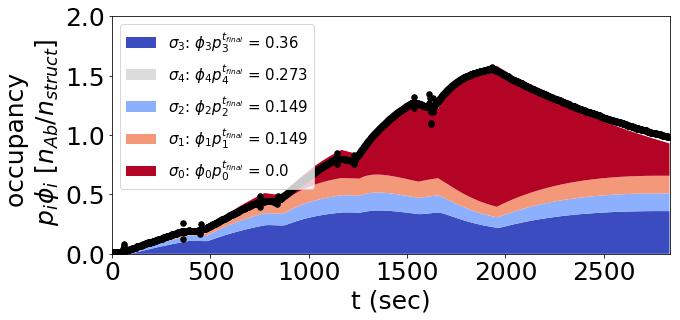

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.81904494e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.25984343]))
basinhopping step 0: f 35.5531
basinhopping step 1: f 35.5531 trial_f 35.5531 accepted 1  lowest_f 35.5531
found new global minimum on step 1 with function value 35.5531
('iggdig_42nm2', [-0.4791391391270382, 1.3631013736530606])


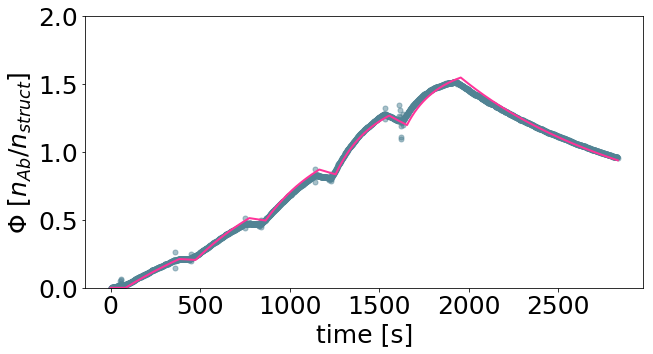

[ 0.33178814 23.07285696]


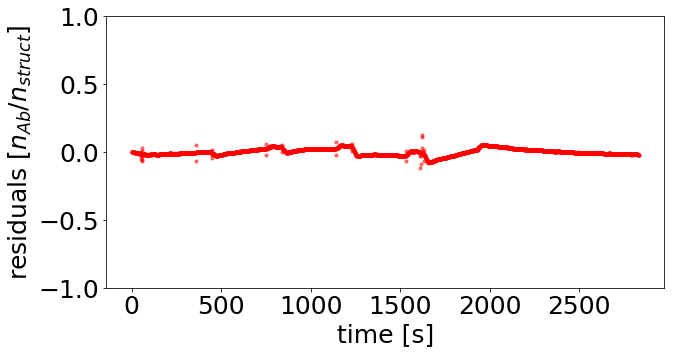

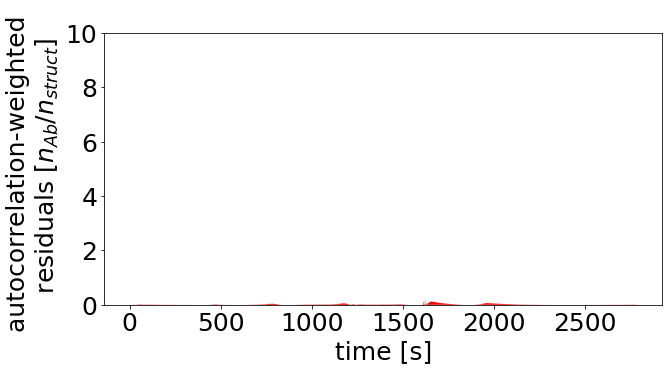

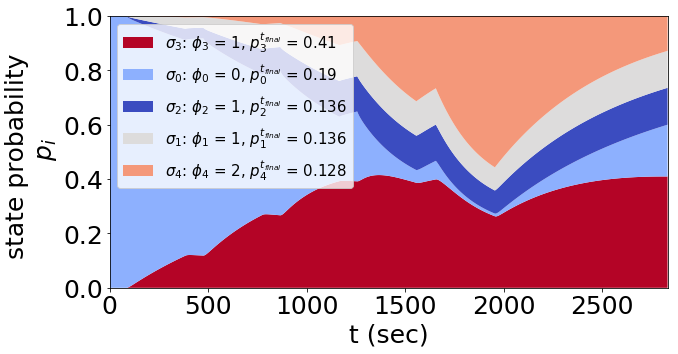

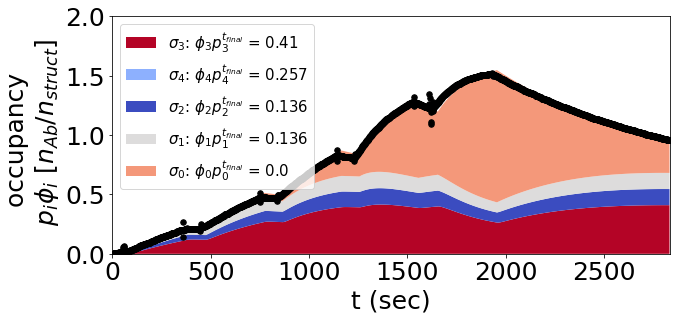

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.73861273e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.24020285]))
basinhopping step 0: f 68.1408
basinhopping step 1: f 68.1408 trial_f 68.1408 accepted 1  lowest_f 68.1408
found new global minimum on step 1 with function value 68.1408
('iggdig_84nm', [-0.3607630819986656, 1.3979230604199469])


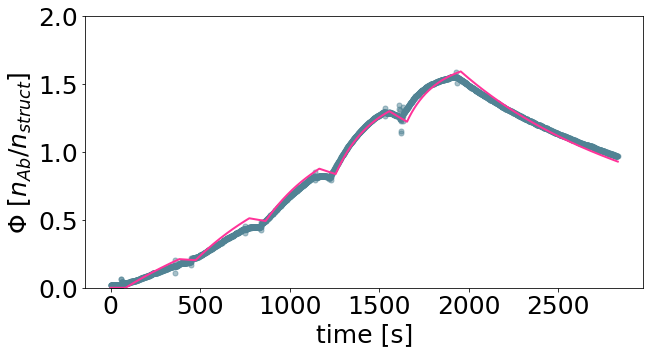

[ 0.43574952 24.9990244 ]


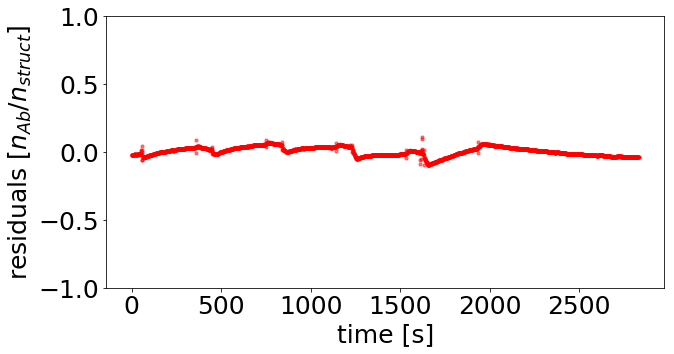

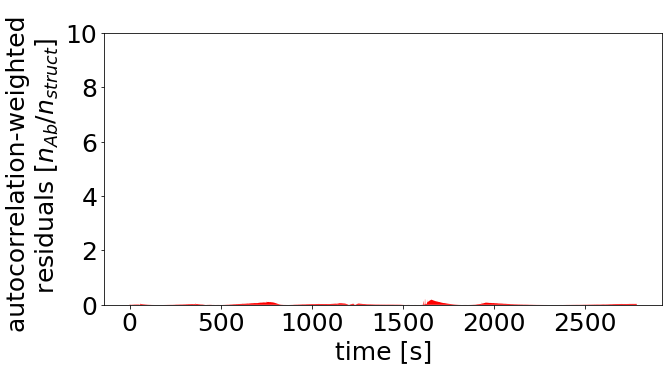

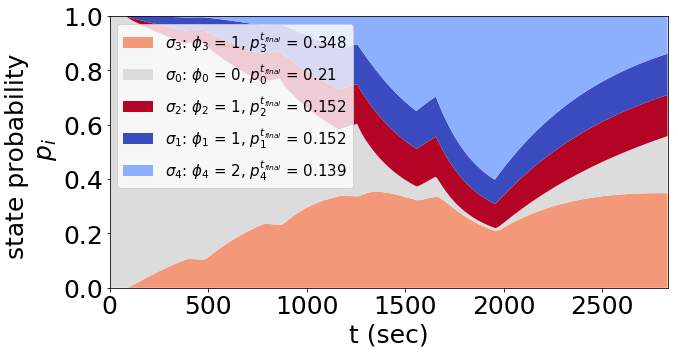

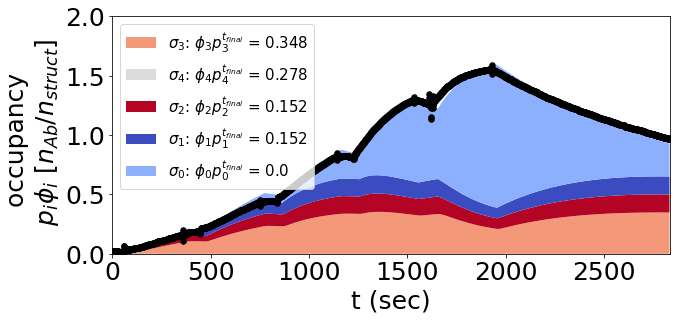

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.91564101e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.28231412]))
basinhopping step 0: f 42.3524
basinhopping step 1: f 42.3524 trial_f 42.3524 accepted 1  lowest_f 42.3524
('iggdig_99nm', [-0.722372996679368, 1.4301394117624457])


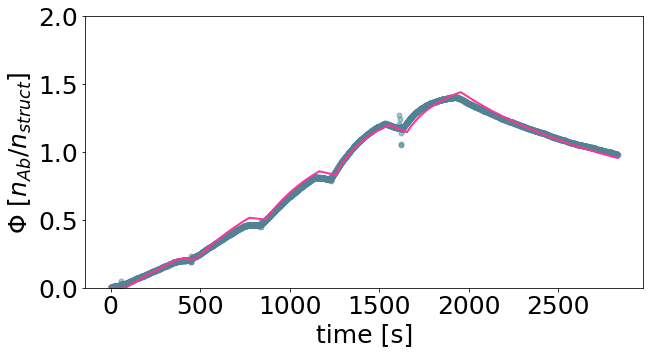

[ 0.18950776 26.92398945]


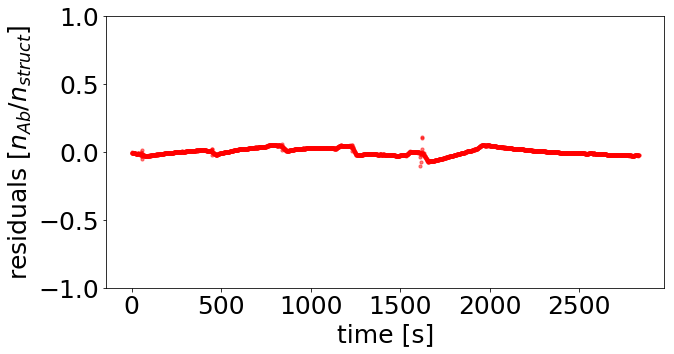

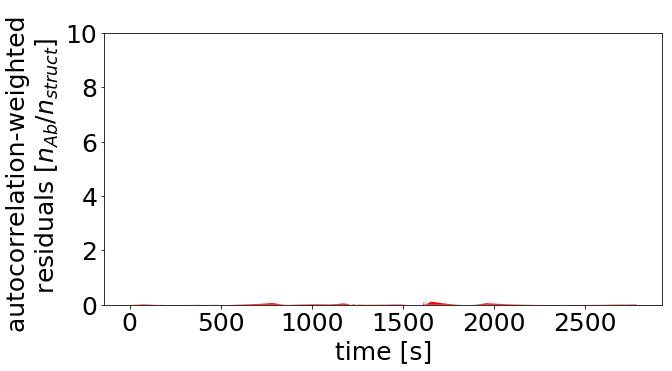

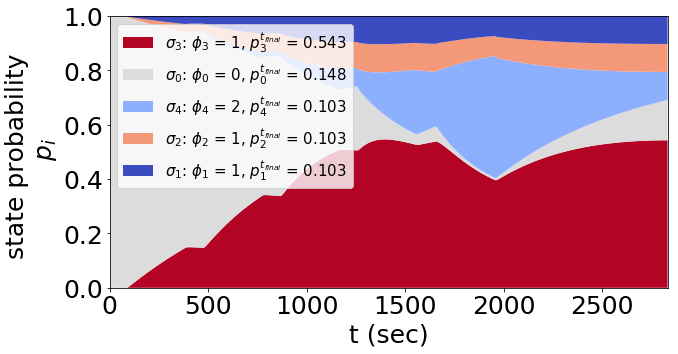

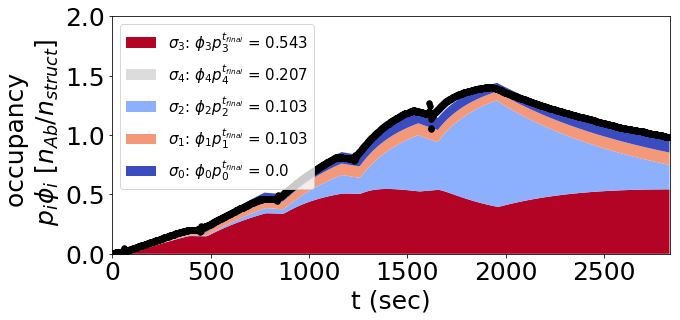

[array([-1.23095369,  1.21334431]), array([-1.22054041,  1.12230569]), array([-1.22686012,  1.28796284]), array([-1.64698467,  1.32459515]), array([-1.5532103 ,  1.31824635]), array([-1.84488006,  1.33264733]), array([-1.49899241,  1.20596443]), array([-1.08618027,  0.95677715]), array([-0.80873906,  1.27685865]), array([-0.77353082,  1.25152501]), array([-0.90996905,  1.30437132]), array([-0.87430849,  1.25664536]), array([-0.54443586,  1.26083842]), array([-0.38367646,  1.341372  ]), array([-0.47913914,  1.36310137]), array([-0.36076308,  1.39792306]), array([-0.722373  ,  1.43013941])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-1.23095369,  1.21334431]), array([-1.22054041,  1.12230569]), array([-1.22686012,  1.28796284]), array([-1.64698467,  1.32459515]), array([-1.5532103 ,  1.31824635]), array([-1.84488006,  1.33264733]), array([-1.49899241,  1.20596443]), array([-1.08618027,  0.95677715]), array([-0.80873906,  1.27685865]), array([-0.77353082,  1.25152501]),

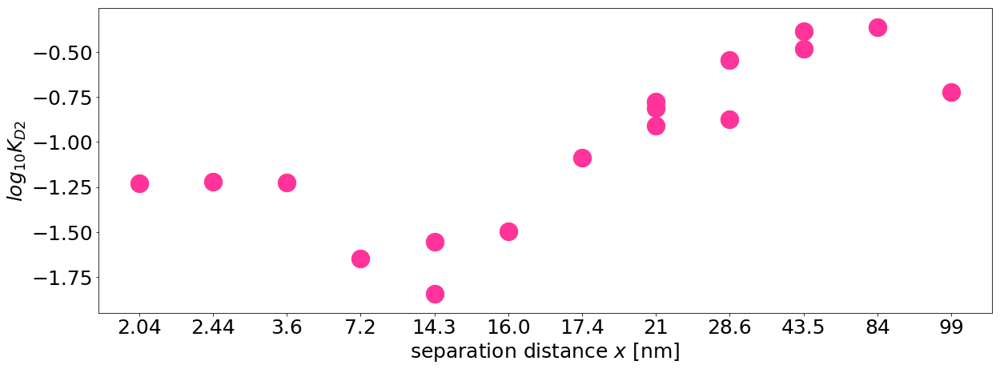

In [66]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_upper68"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_gupper68, k_off_gupper68]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_upper68 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_upper68)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_upper68).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_upper68,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

# Alpha function fitting - with K_D - based on lower 95 KD1

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.53022425e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.18475508]))
basinhopping step 0: f 1371.67
basinhopping step 1: f 1371.67 trial_f 1371.67 accepted 1  lowest_f 1371.67
found new global minimum on step 1 with function value 1371.67
('iggdig_204nm', [-1.1915756345889417, 1.228816054474367])


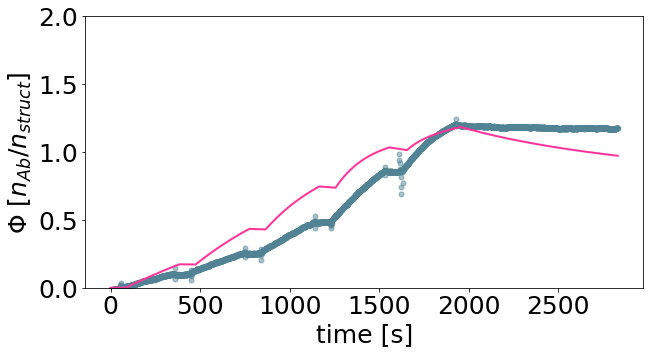

[ 0.0643316  16.93620315]


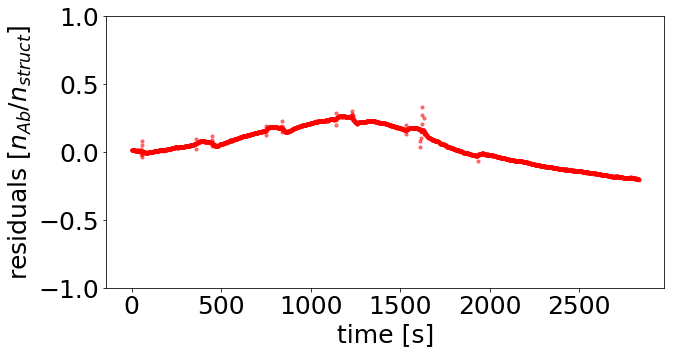

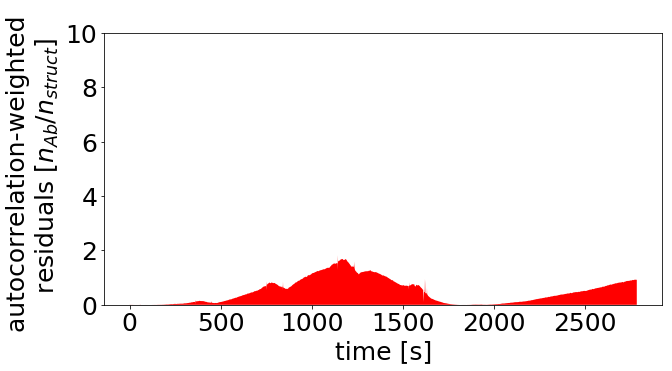

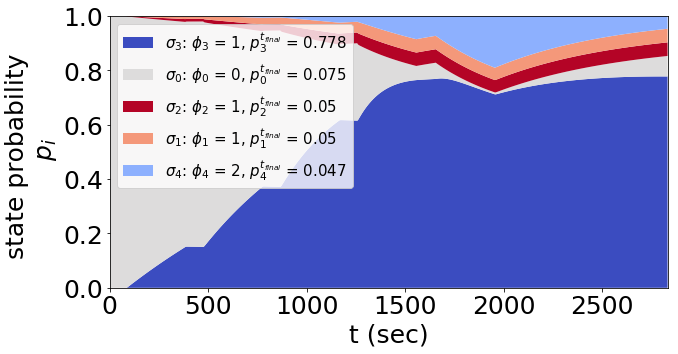

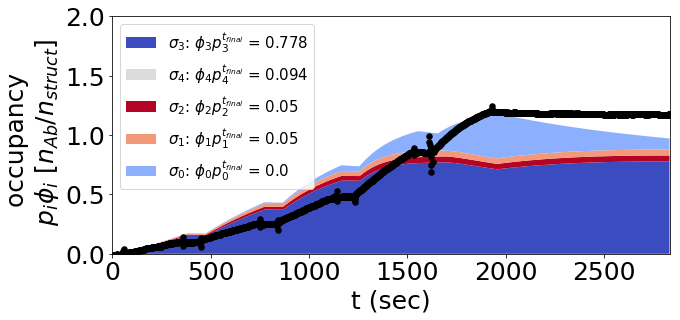

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.18763247e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.07468206]))
basinhopping step 0: f 444.975
basinhopping step 1: f 444.975 trial_f 444.975 accepted 1  lowest_f 444.975
('iggdig_244nm', [-1.292966925635487, 1.1446518256507558])


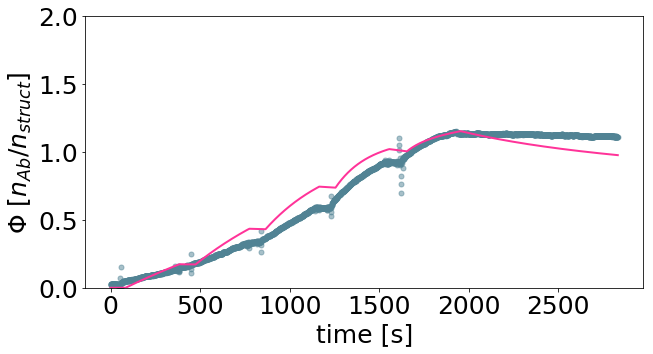

[ 0.05093697 13.9524934 ]


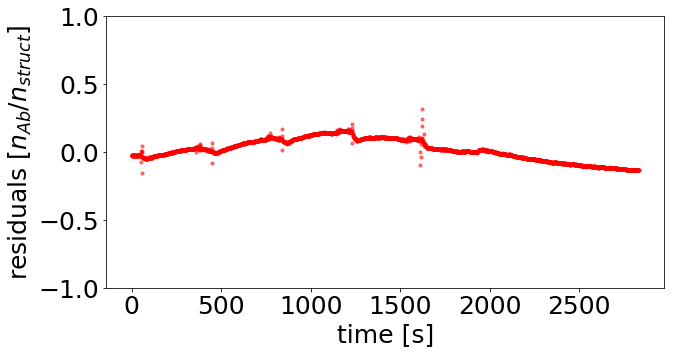

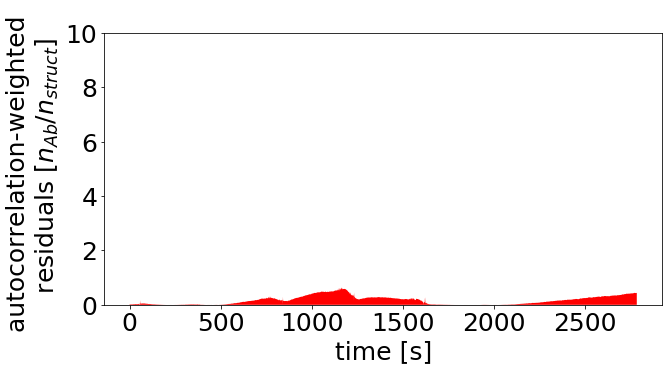

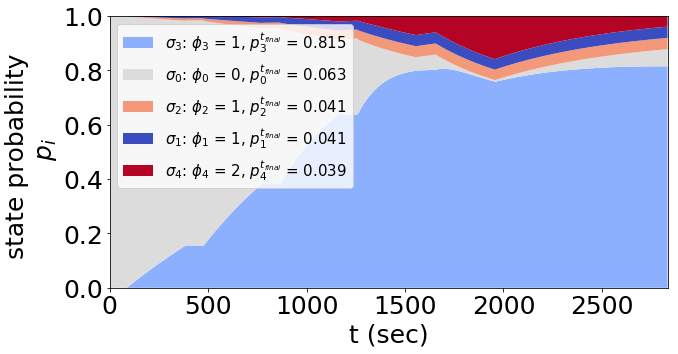

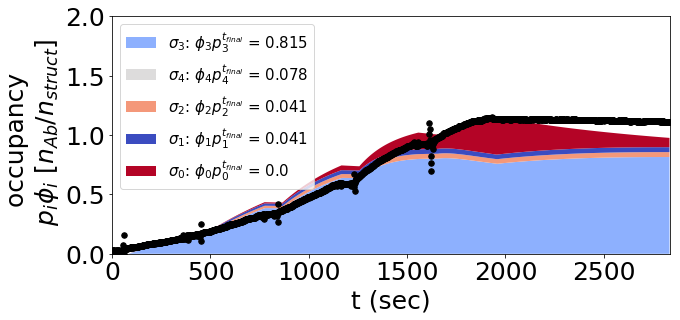

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.62600644e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.21112226]))
basinhopping step 0: f 222.709
basinhopping step 1: f 222.709 trial_f 222.709 accepted 1  lowest_f 222.709
found new global minimum on step 1 with function value 222.709
('iggdig_3nm', [-1.3501467138670962, 1.312643362449734])


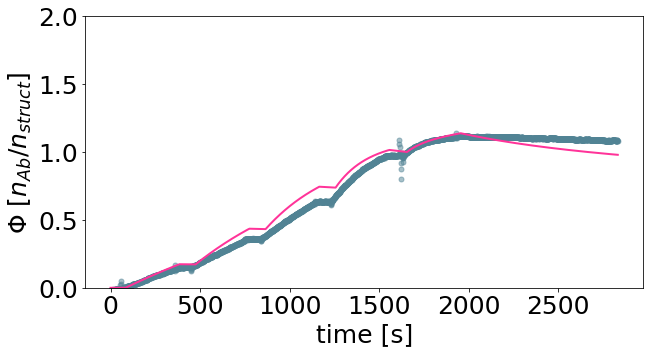

[ 0.04465327 20.54203016]


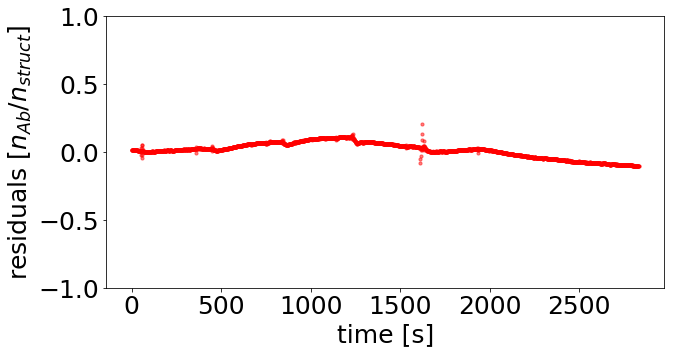

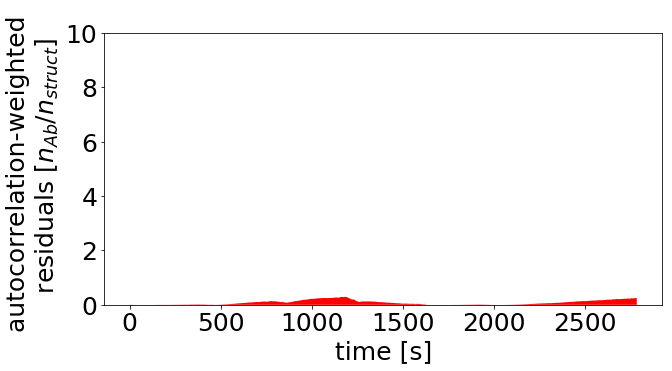

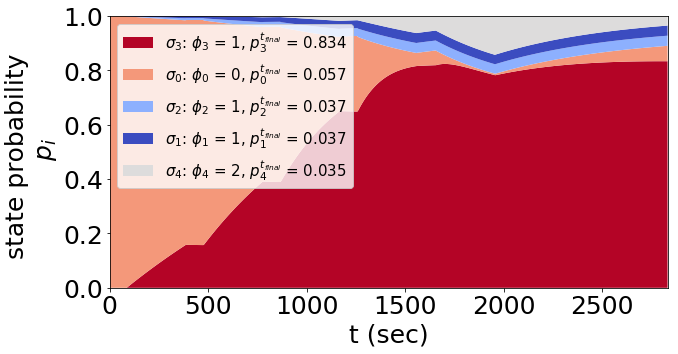

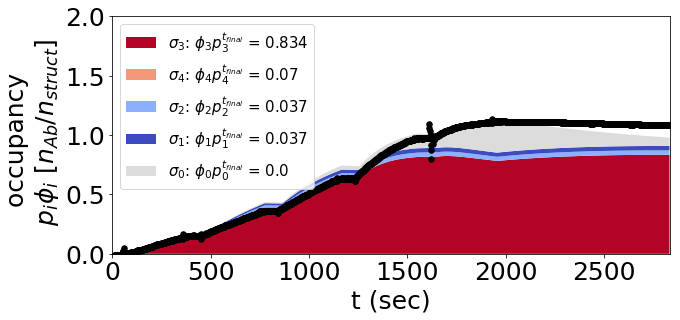

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.84588619e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26620492]))
basinhopping step 0: f 30.3784
basinhopping step 1: f 30.3784 trial_f 30.3784 accepted 1  lowest_f 30.3784
('iggdig_7nm', [-2.3895601891924043, 1.3506957187286002])


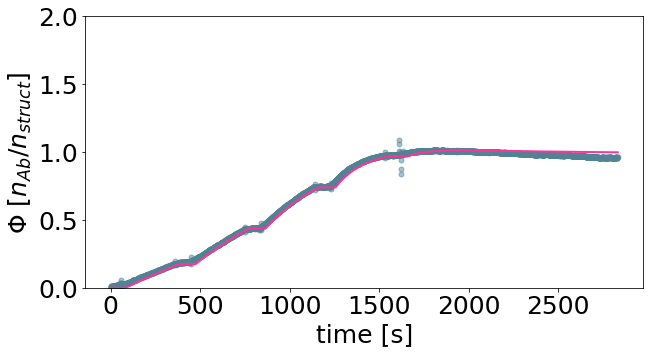

[4.07793042e-03 2.24231034e+01]


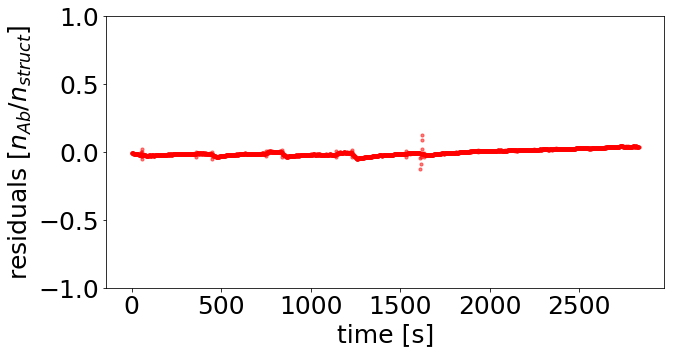

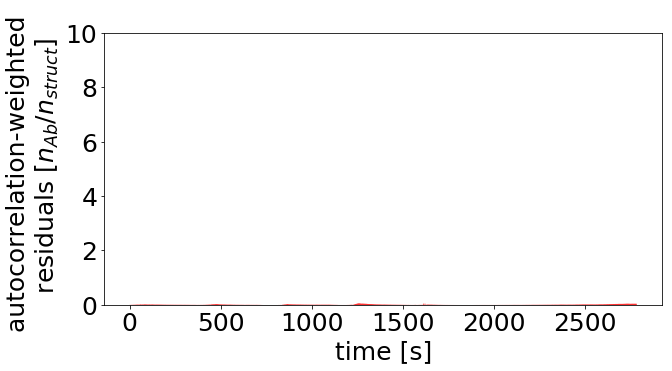

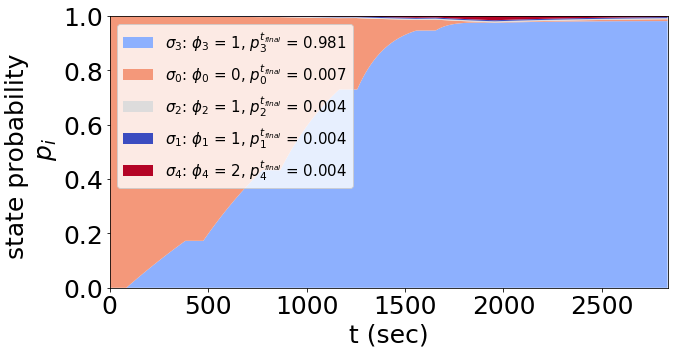

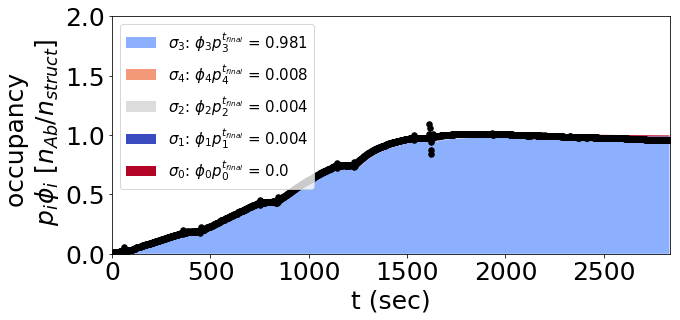

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.86106285e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26976104]))
basinhopping step 0: f 16.8562
basinhopping step 1: f 16.8562 trial_f 16.8562 accepted 1  lowest_f 16.8562
('iggdig_14nm1', [-2.1809133616692082, 1.345909711823275])


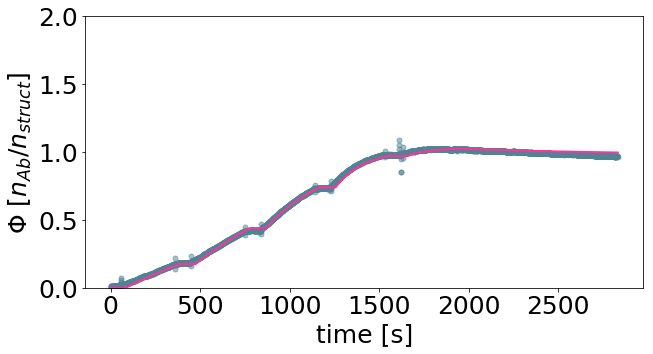

[6.59305408e-03 2.21773531e+01]


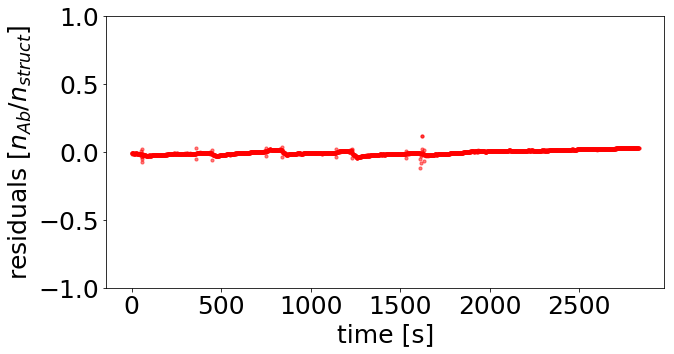

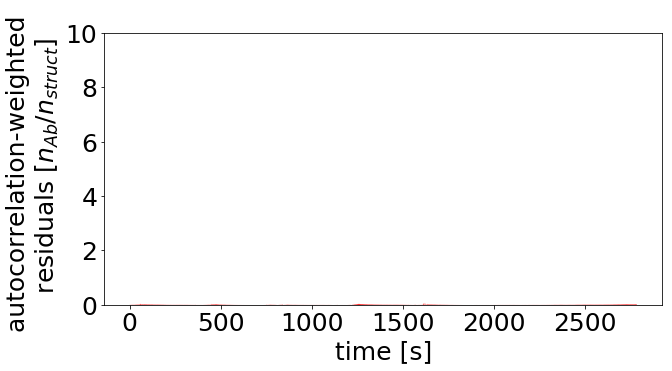

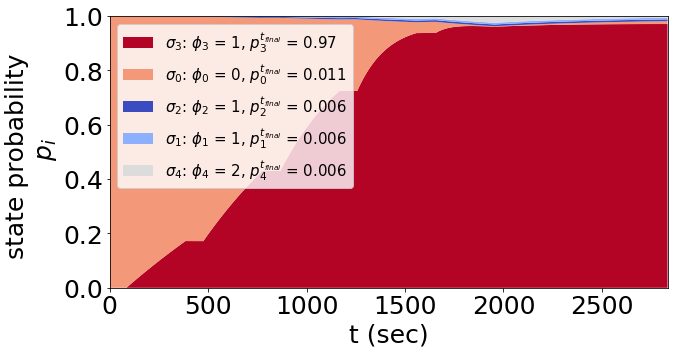

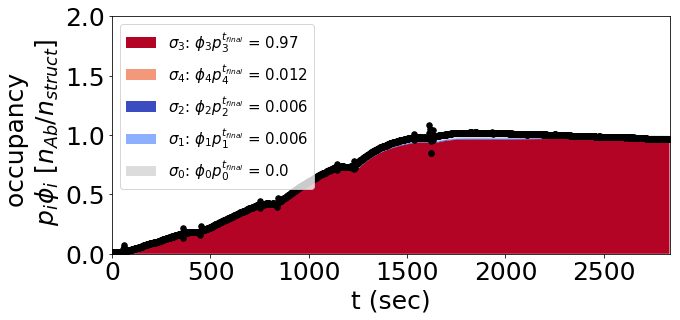

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83567607e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26379605]))
basinhopping step 0: f 62.7872
basinhopping step 1: f 62.7872 trial_f 62.7872 accepted 1  lowest_f 62.7872
found new global minimum on step 1 with function value 62.7872
('iggdig_14nm2', [-2.4284160213567834, 1.3541839368851425])


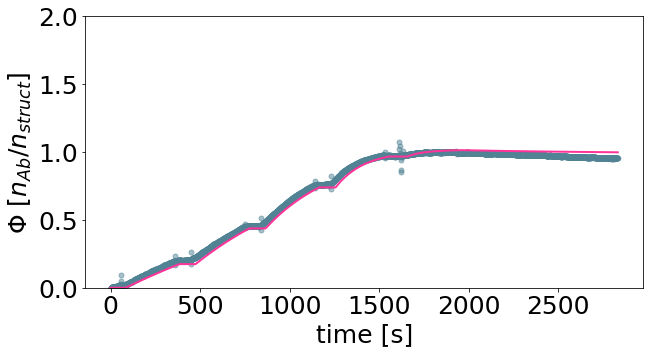

[3.72892783e-03 2.26039291e+01]


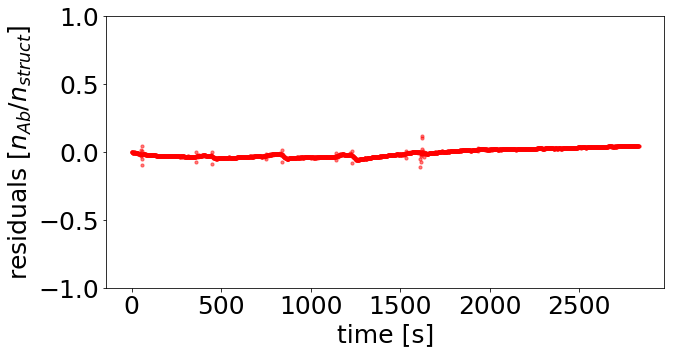

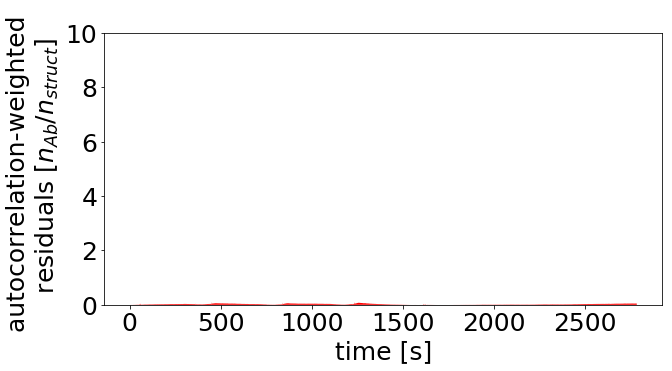

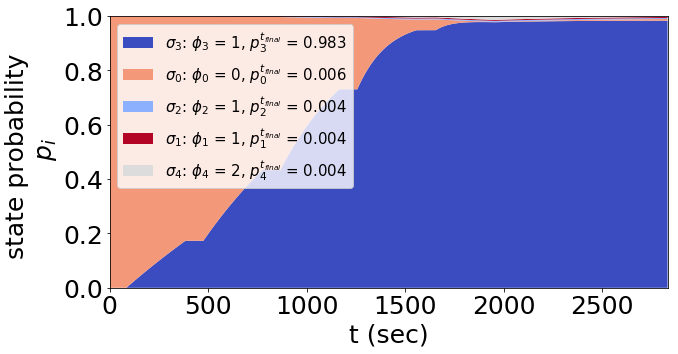

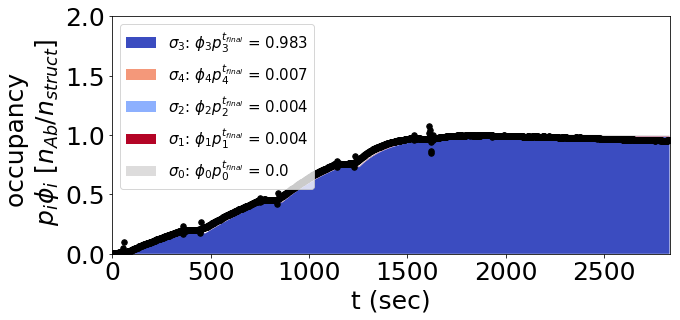

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.33492475e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12545679]))
basinhopping step 0: f 11.1254
basinhopping step 1: f 11.1254 trial_f 11.1254 accepted 1  lowest_f 11.1254
found new global minimum on step 1 with function value 11.1254
('iggdig_16nm', [-1.9915021484080702, 1.234031316987863])


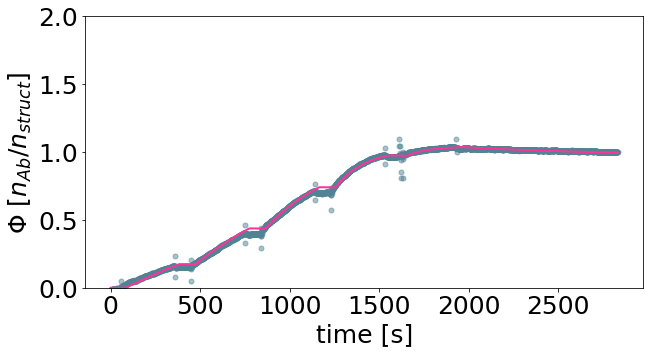

[1.01975972e-02 1.71408091e+01]


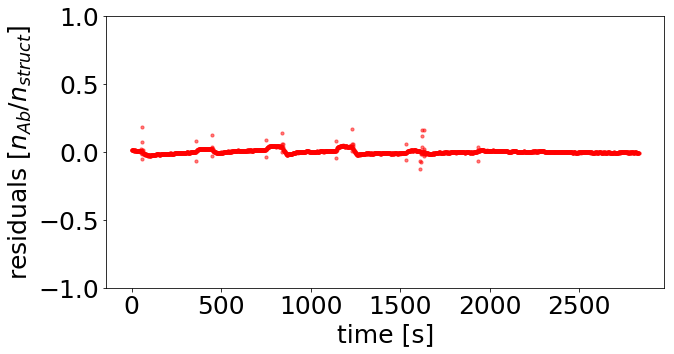

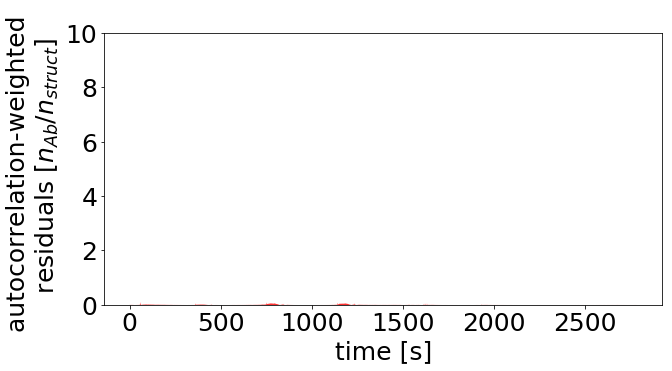

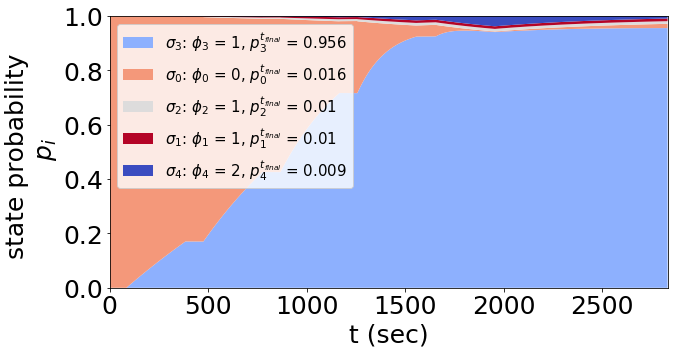

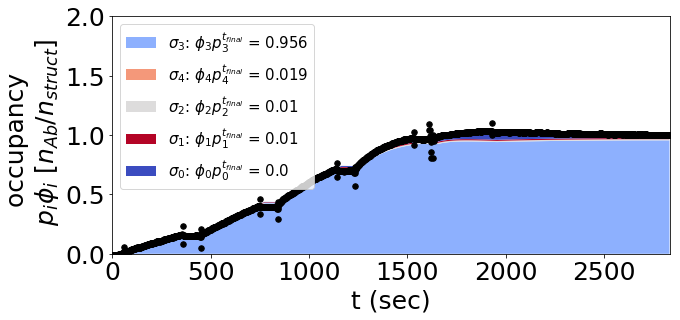

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.16488361e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.06628253]))
basinhopping step 0: f 677.872
basinhopping step 1: f 677.872 trial_f 677.872 accepted 1  lowest_f 677.872
('iggdig_17nm', [-1.1045810546367705, 0.978310397779484])


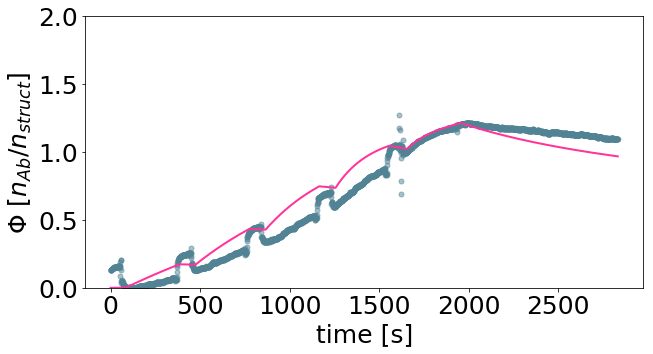

[0.07859935 9.5128445 ]


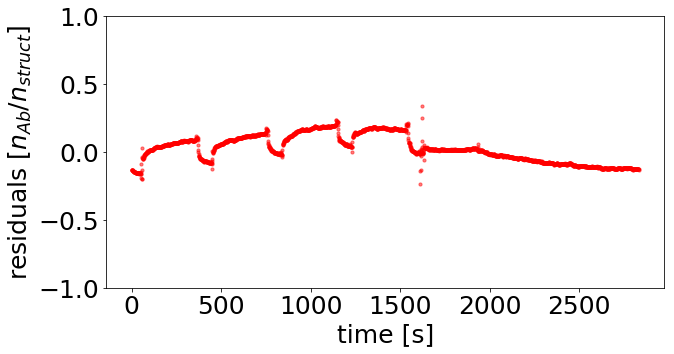

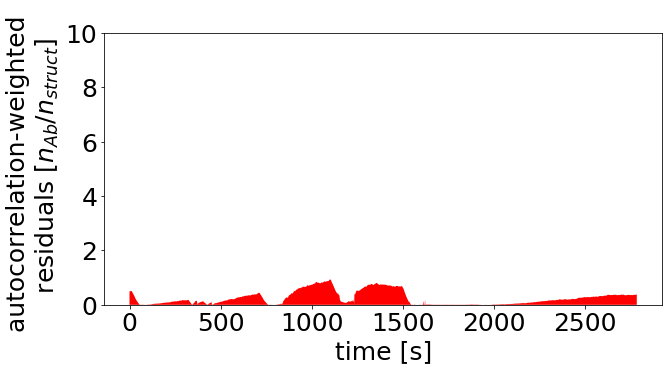

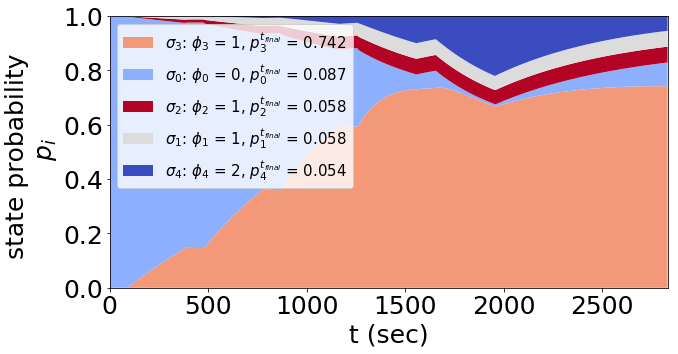

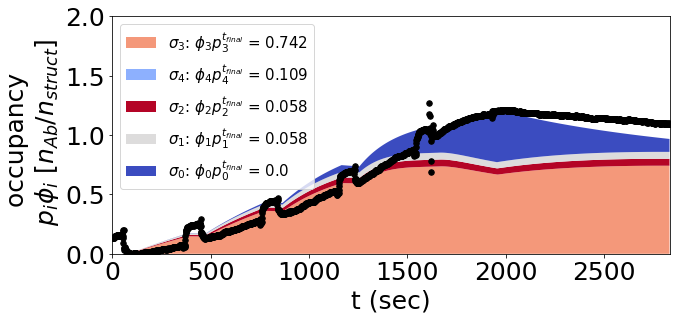

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.14104180e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.05730155]))
basinhopping step 0: f 35.6809
basinhopping step 1: f 35.6809 trial_f 35.6809 accepted 1  lowest_f 35.6809
found new global minimum on step 1 with function value 35.6809
('iggdig_21nm1', [-0.9176183474192515, 1.3095238515642436])


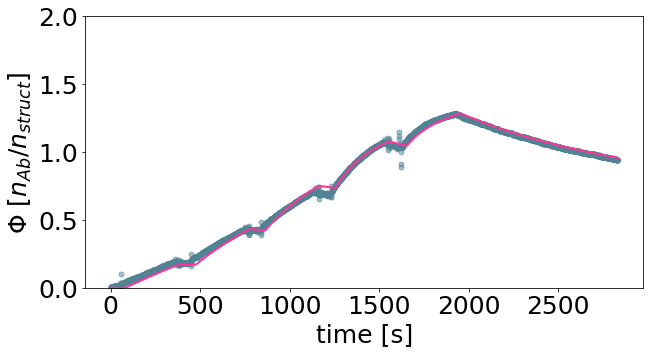

[ 0.12088757 20.39500666]


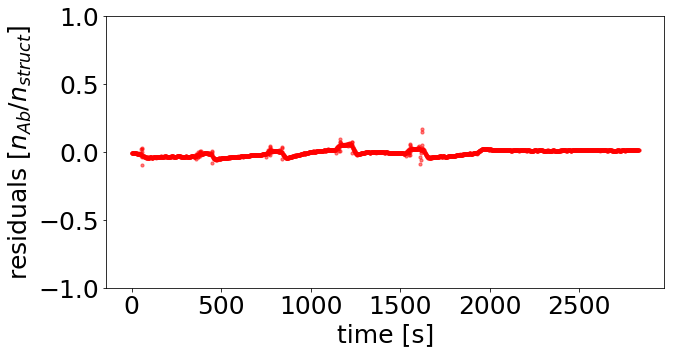

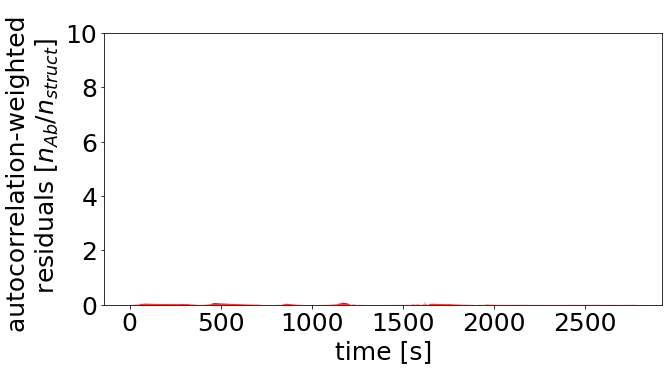

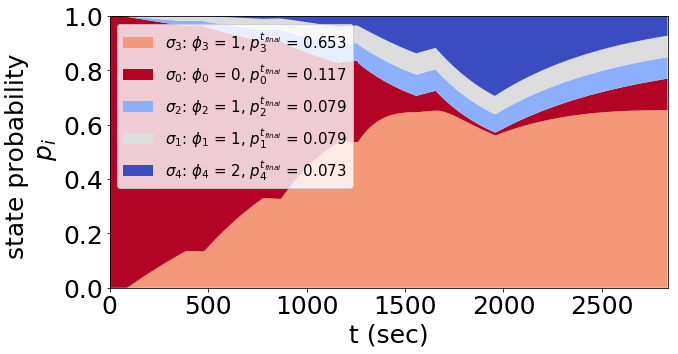

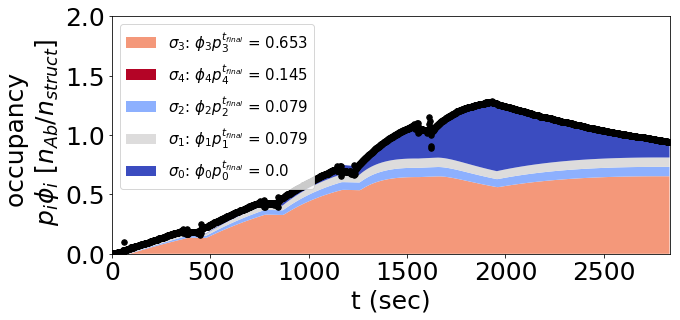

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.09660684e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04005095]))
basinhopping step 0: f 42.4354
basinhopping step 1: f 42.4354 trial_f 42.4354 accepted 1  lowest_f 42.4354
('iggdig_21nm2', [-0.8841549237457289, 1.2845339575466297])


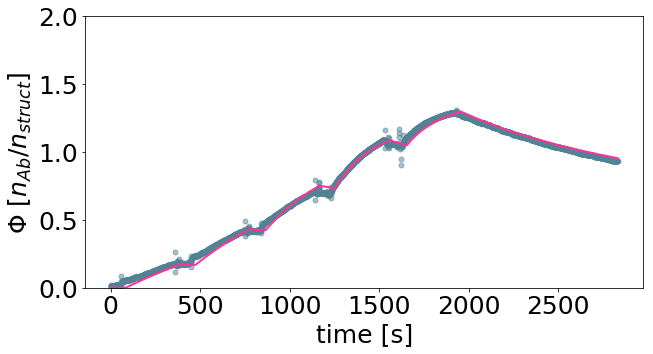

[ 0.1305705  19.25457591]


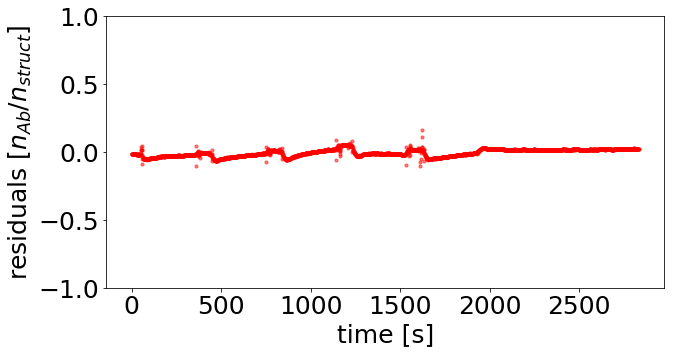

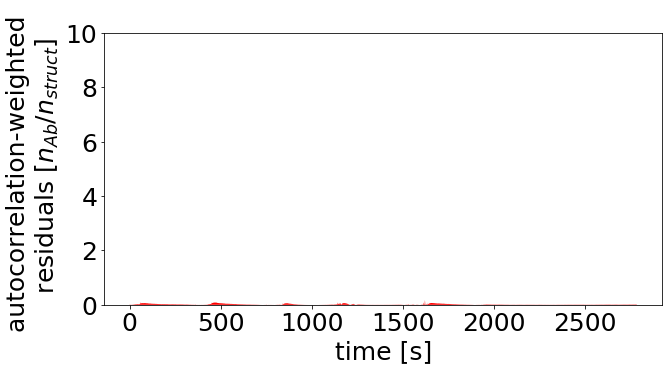

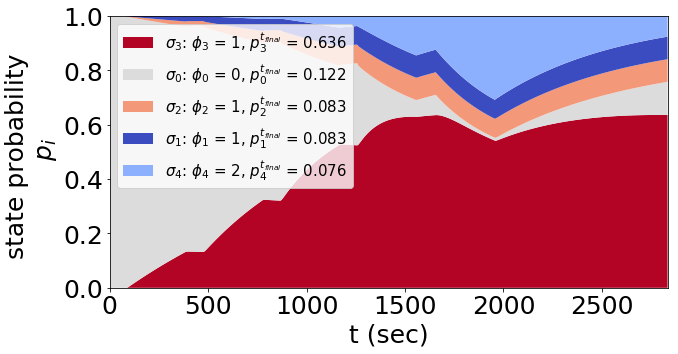

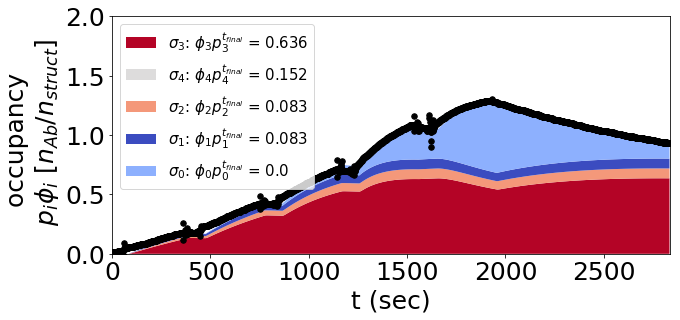

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.11305896e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04651817]))
basinhopping step 0: f 92.9426
basinhopping step 1: f 92.9426 trial_f 92.9426 accepted 1  lowest_f 92.9426
found new global minimum on step 1 with function value 92.9426
('iggdig_21nm3', [-1.012281833118545, 1.334864468013106])


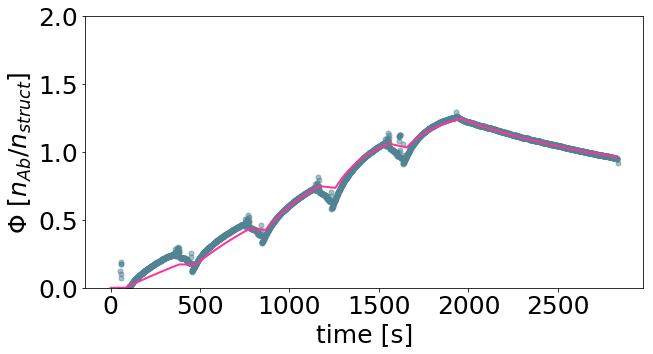

[ 0.09721162 21.62043701]


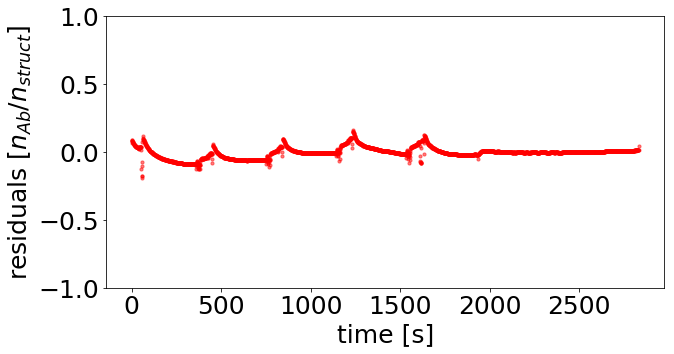

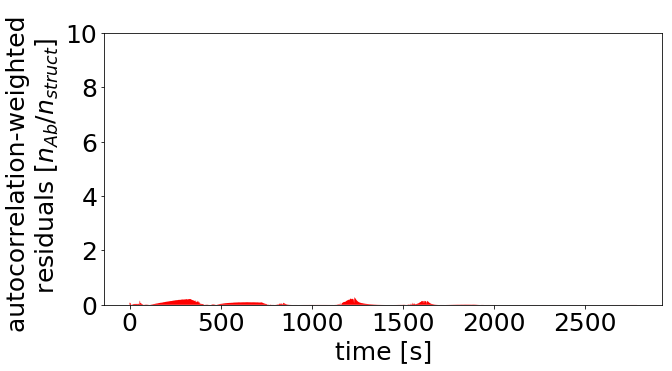

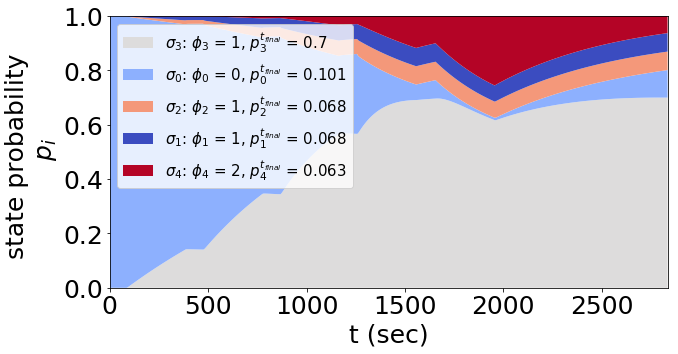

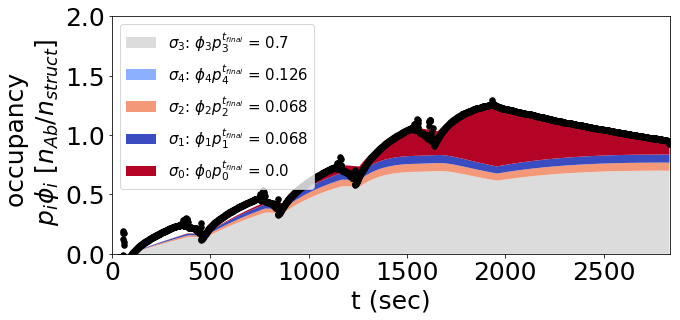

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.08656295e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.03605489]))
basinhopping step 0: f 197.254
basinhopping step 1: f 197.254 trial_f 197.254 accepted 1  lowest_f 197.254
found new global minimum on step 1 with function value 197.254
('iggdig_28nm1', [-0.9753881088813503, 1.2881534224215598])


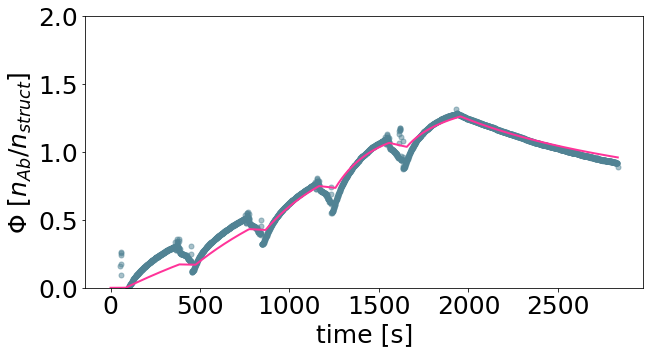

[ 0.10583075 19.41571652]


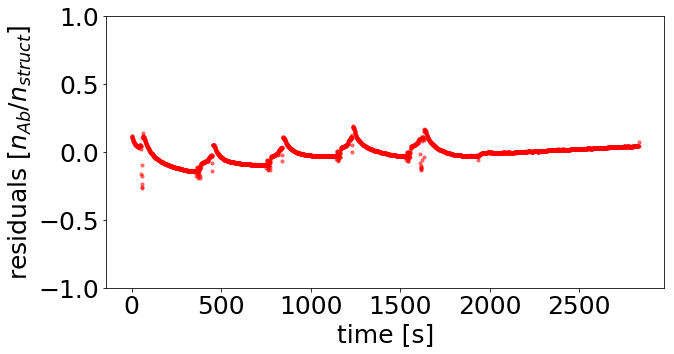

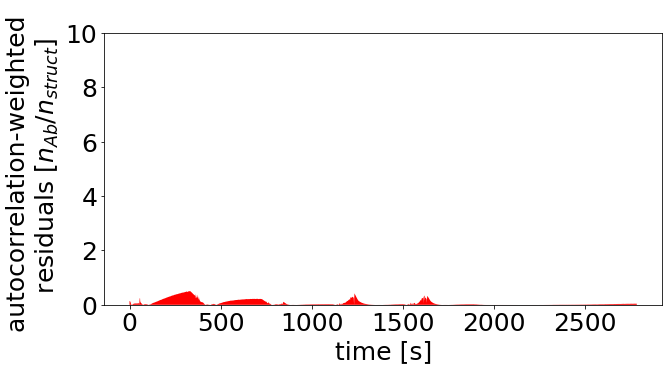

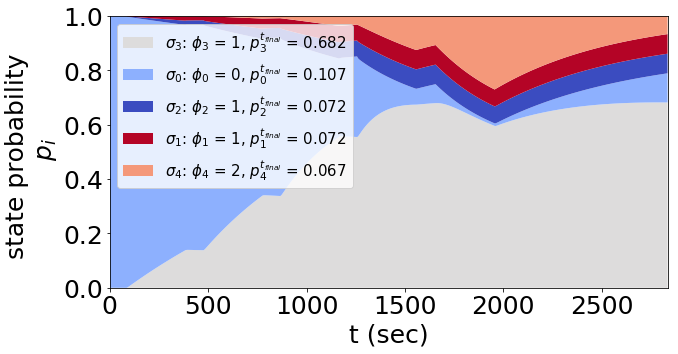

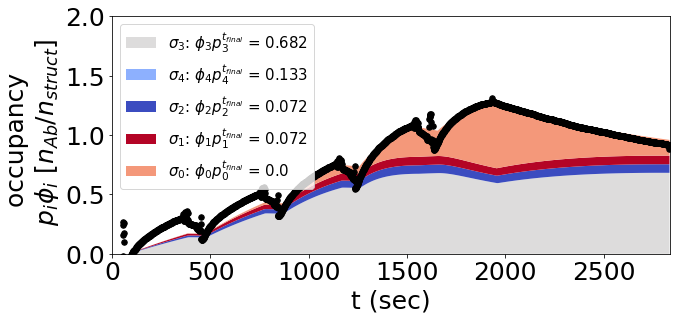

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.32182032e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12117243]))
basinhopping step 0: f 59.0668
basinhopping step 1: f 59.0668 trial_f 59.0668 accepted 1  lowest_f 59.0668
('iggdig_28nm2', [-0.5684994947953255, 1.2895670415654388])


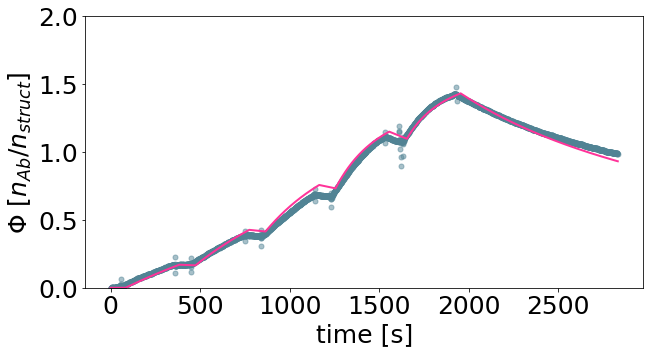

[ 0.27008503 19.47901722]


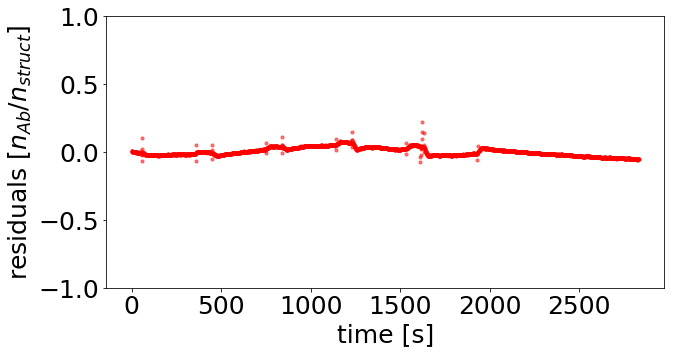

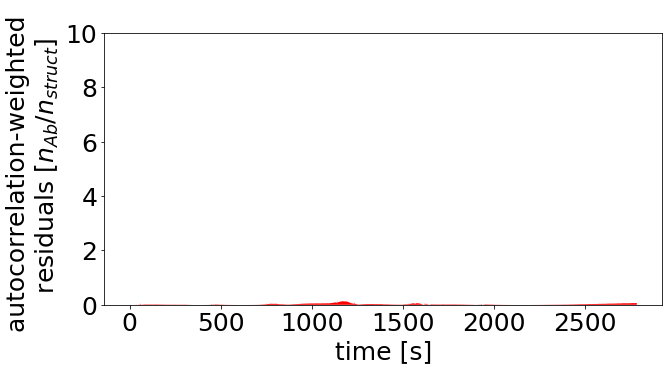

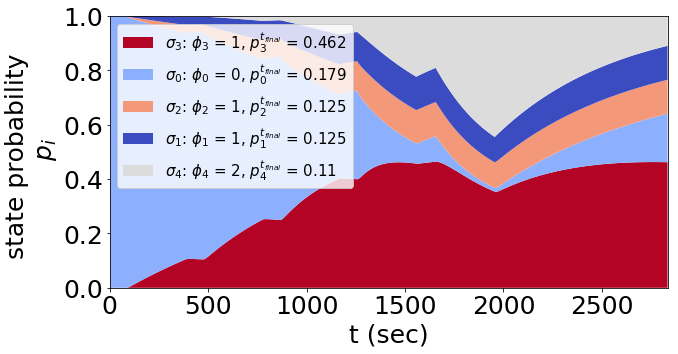

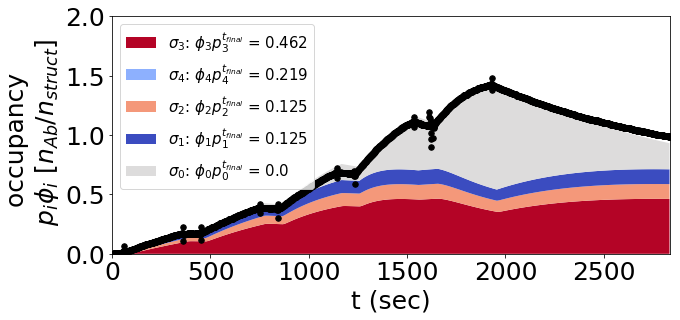

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83584091e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26383504]))
basinhopping step 0: f 41.349
basinhopping step 1: f 41.349 trial_f 41.349 accepted 1  lowest_f 41.349
found new global minimum on step 1 with function value 41.349
('iggdig_42nm1', [-0.4961644680172577, 1.3766732387872727])


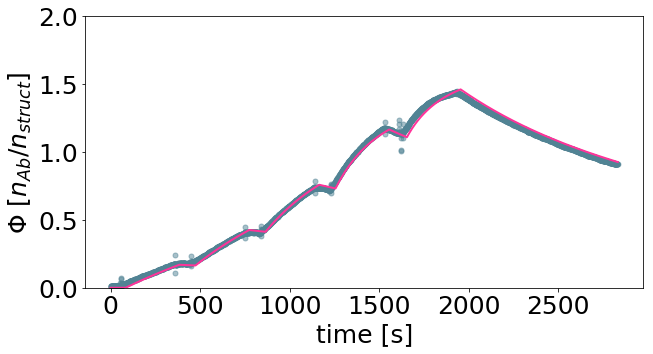

[ 0.31903294 23.80527697]


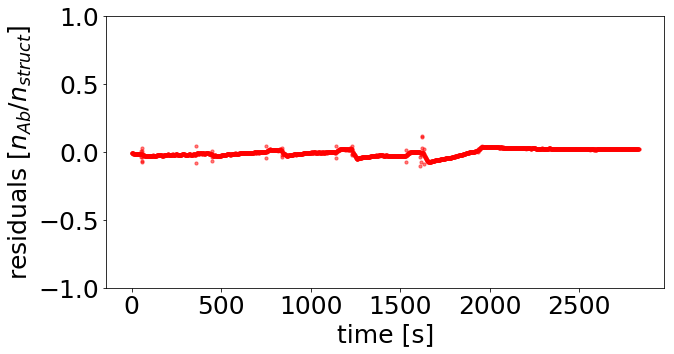

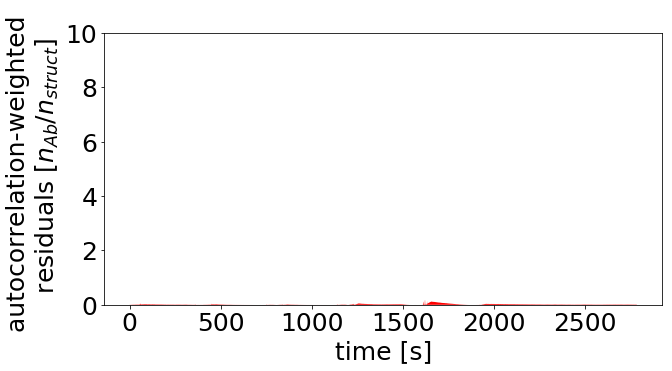

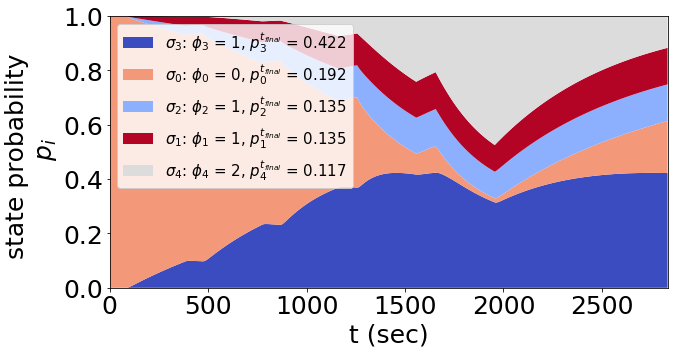

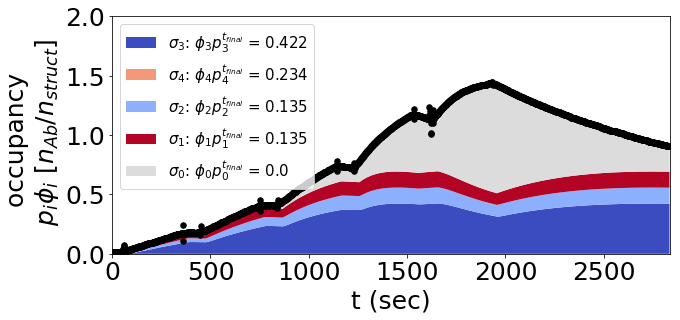

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.81904494e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.25984343]))
basinhopping step 0: f 105.004
basinhopping step 1: f 105.004 trial_f 105.004 accepted 1  lowest_f 105.004
found new global minimum on step 1 with function value 105.004
('iggdig_42nm2', [-0.6300048699369688, 1.401443979635901])


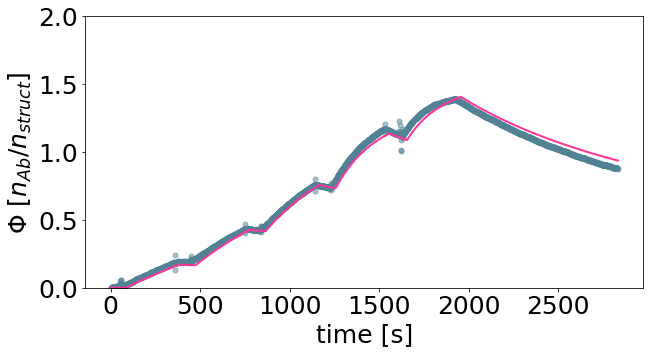

[ 0.23442025 25.20252067]


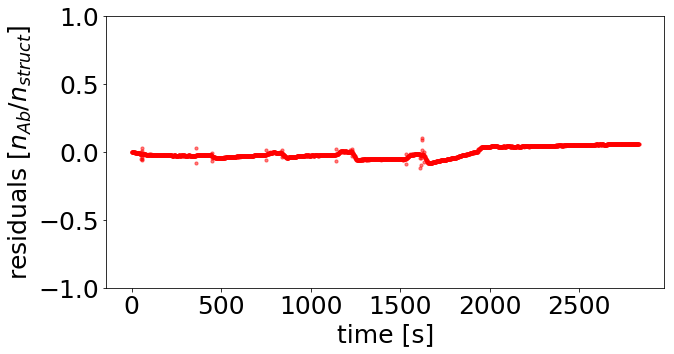

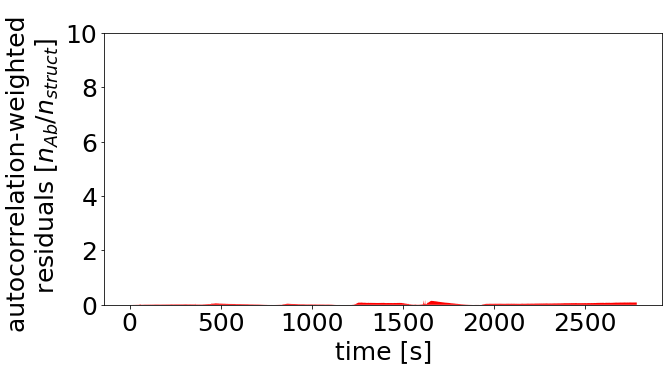

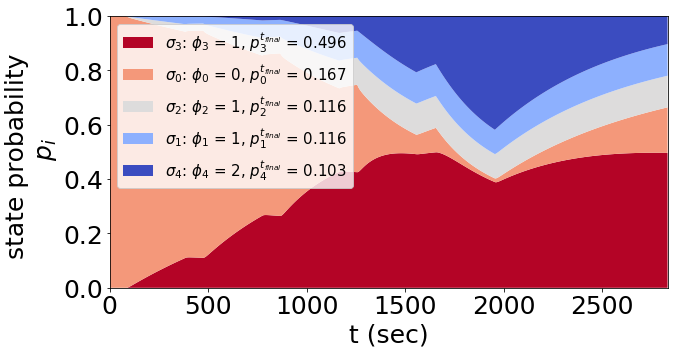

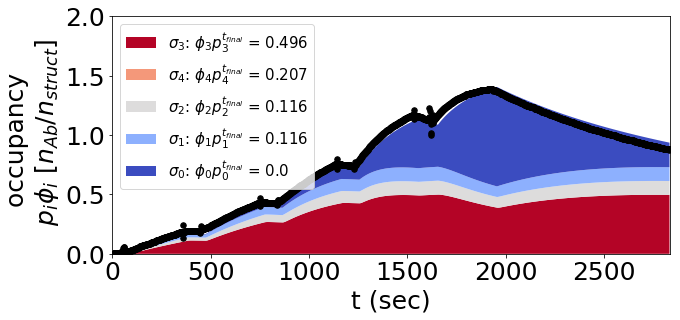

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.73861273e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.24020285]))
basinhopping step 0: f 95.9375
basinhopping step 1: f 95.9375 trial_f 95.9375 accepted 1  lowest_f 95.9375
found new global minimum on step 1 with function value 95.9375
('iggdig_84nm', [-0.5242583496138759, 1.4367945763710495])


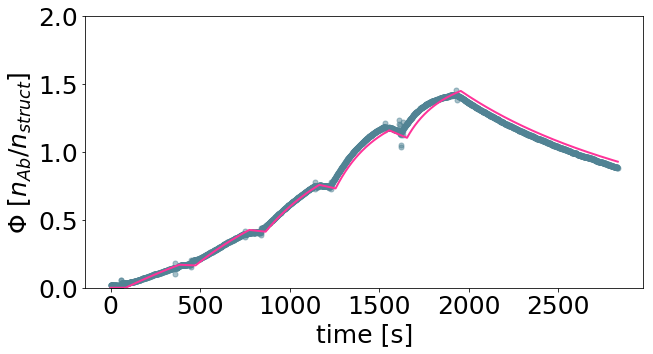

[ 0.29904852 27.33975235]


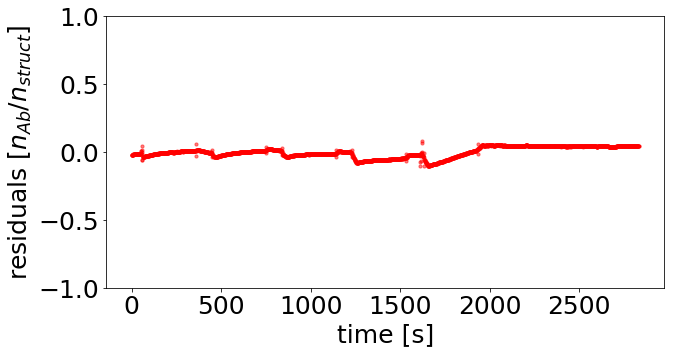

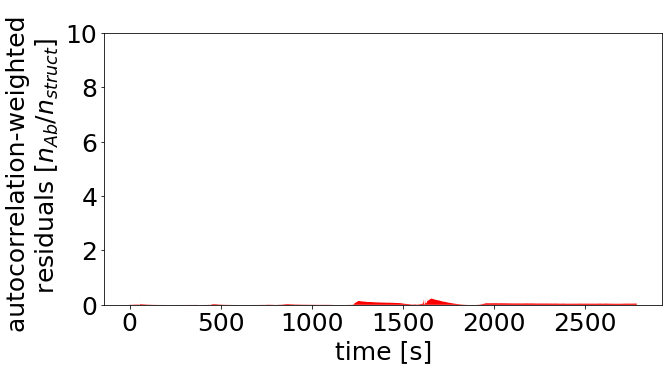

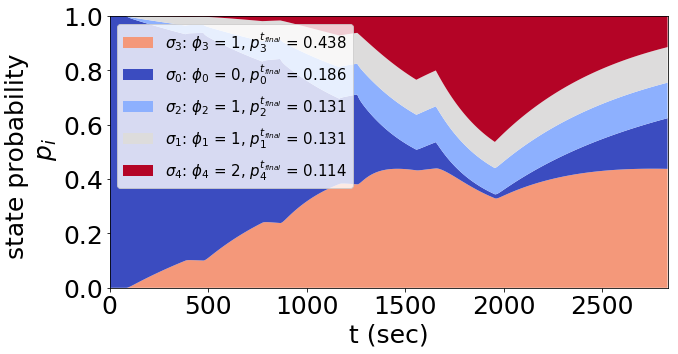

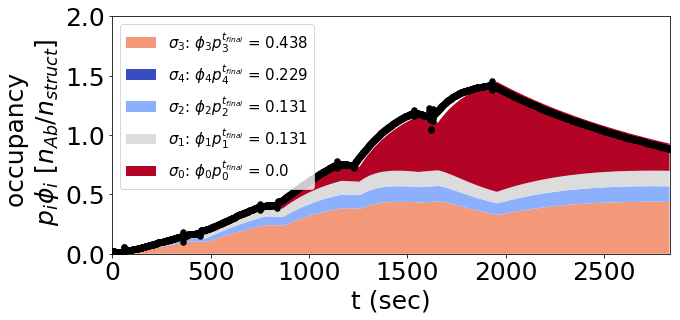

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.91564101e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.28231412]))
basinhopping step 0: f 68.6174
basinhopping step 1: f 68.6174 trial_f 68.6174 accepted 1  lowest_f 68.6174
found new global minimum on step 1 with function value 68.6174
('iggdig_99nm', [-0.8568903943968785, 1.4655067750443567])


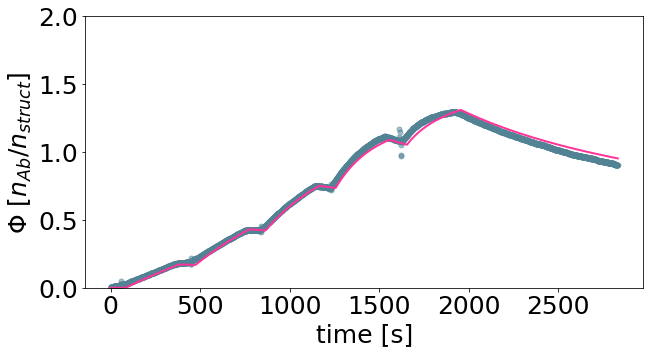

[ 0.13903035 29.20833325]


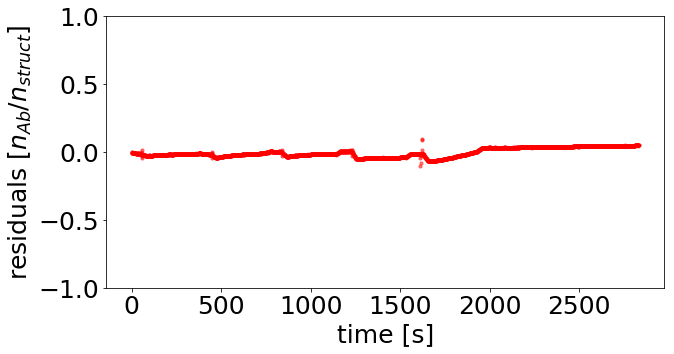

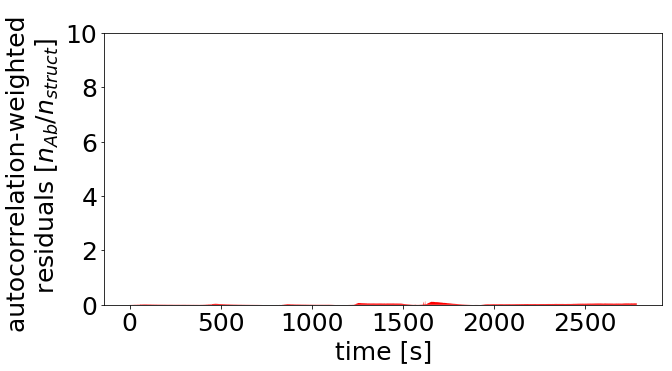

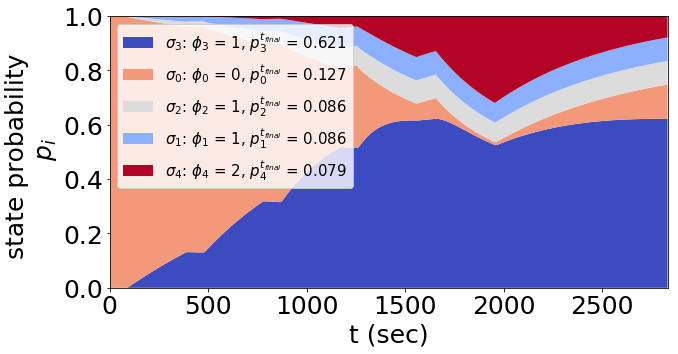

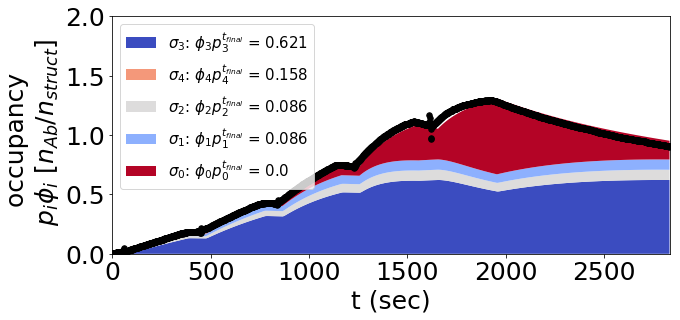

[array([-1.19157563,  1.22881605]), array([-1.29296693,  1.14465183]), array([-1.35014671,  1.31264336]), array([-2.38956019,  1.35069572]), array([-2.18091336,  1.34590971]), array([-2.42841602,  1.35418394]), array([-1.99150215,  1.23403132]), array([-1.10458105,  0.9783104 ]), array([-0.91761835,  1.30952385]), array([-0.88415492,  1.28453396]), array([-1.01228183,  1.33486447]), array([-0.97538811,  1.28815342]), array([-0.56849949,  1.28956704]), array([-0.49616447,  1.37667324]), array([-0.63000487,  1.40144398]), array([-0.52425835,  1.43679458]), array([-0.85689039,  1.46550678])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-1.19157563,  1.22881605]), array([-1.29296693,  1.14465183]), array([-1.35014671,  1.31264336]), array([-2.38956019,  1.35069572]), array([-2.18091336,  1.34590971]), array([-2.42841602,  1.35418394]), array([-1.99150215,  1.23403132]), array([-1.10458105,  0.9783104 ]), array([-0.91761835,  1.30952385]), array([-0.88415492,  1.28453396]),

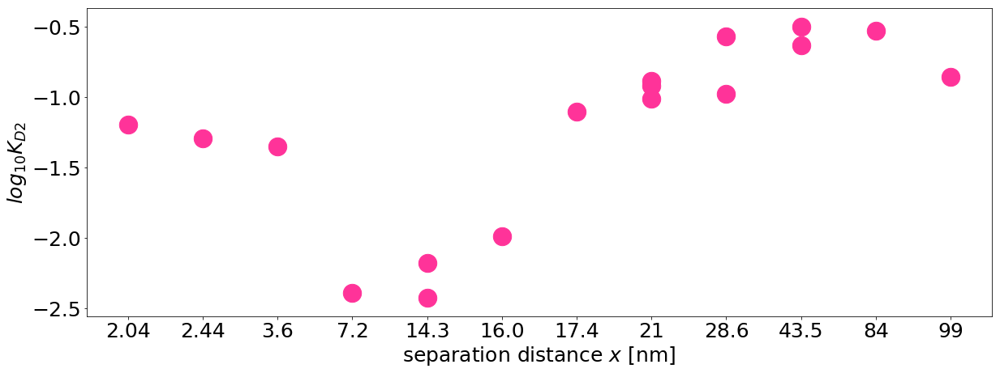

In [67]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_lower95"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_glower95, k_off_glower95]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_lower95 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_lower95)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_lower95).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_lower95,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

# Alpha function fitting - with K_D - based on lower68 KD1

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.53022425e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.18475508]))
basinhopping step 0: f 1673.75
basinhopping step 1: f 1673.75 trial_f 1673.75 accepted 1  lowest_f 1673.75
('iggdig_204nm', [-1.1983679715006976, 1.2225616713943137])


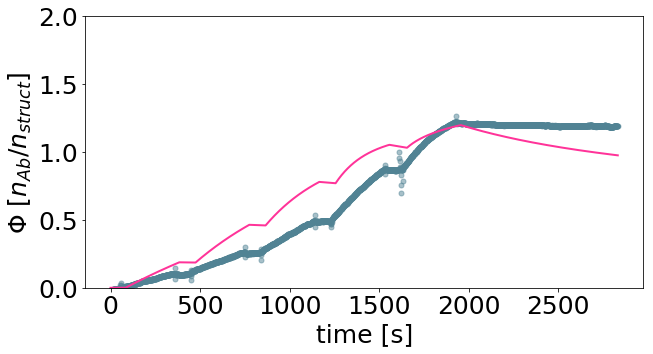

[ 0.06333329 16.69404852]


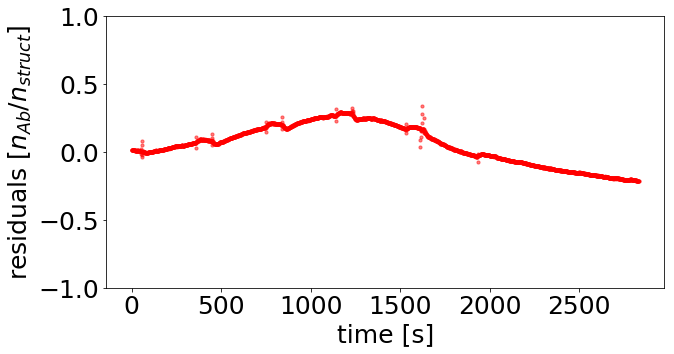

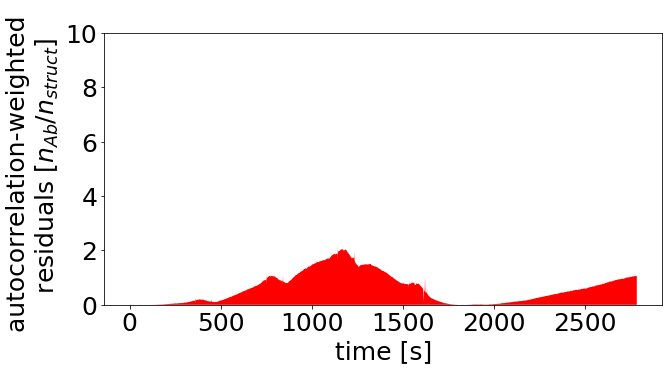

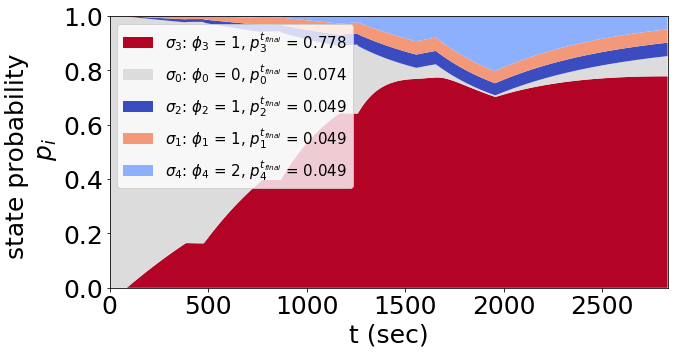

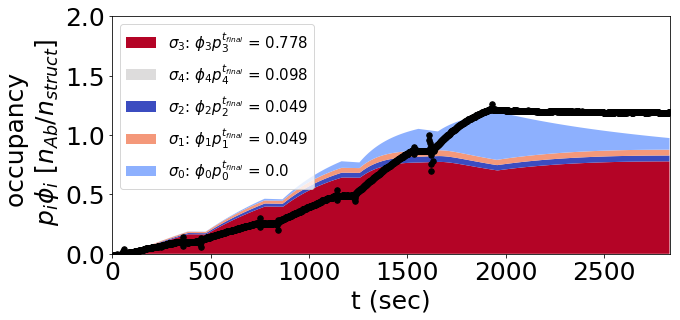

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.18763247e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.07468206]))
basinhopping step 0: f 605.188
basinhopping step 1: f 605.188 trial_f 605.188 accepted 1  lowest_f 605.188
('iggdig_244nm', [-1.2569946932679625, 1.136095399734492])


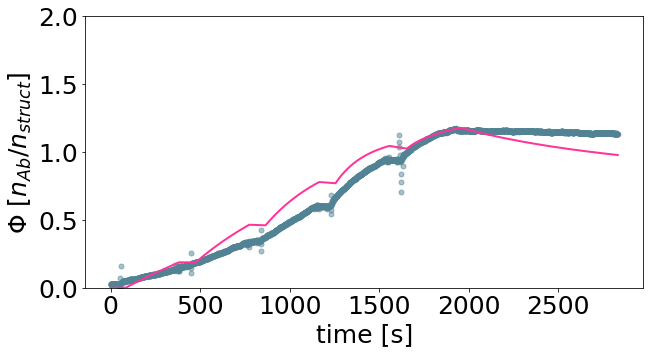

[ 0.05533569 13.68029302]


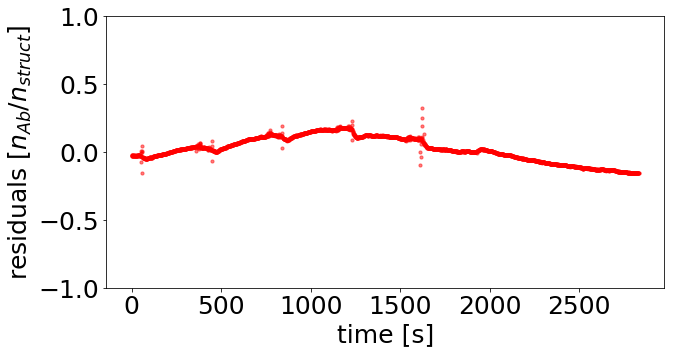

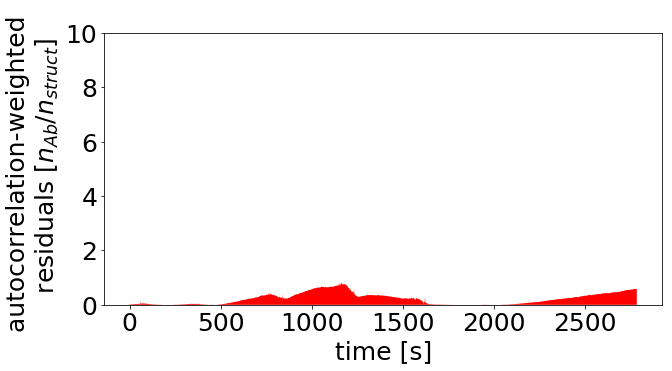

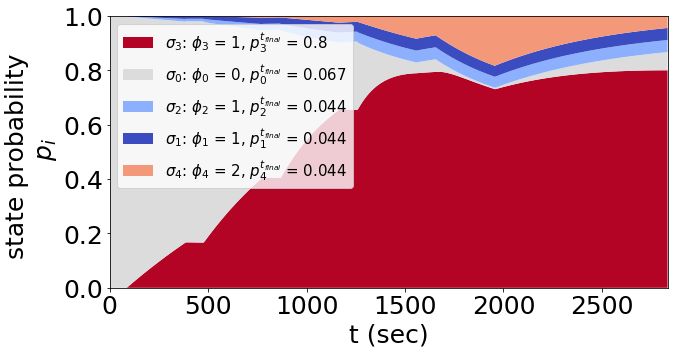

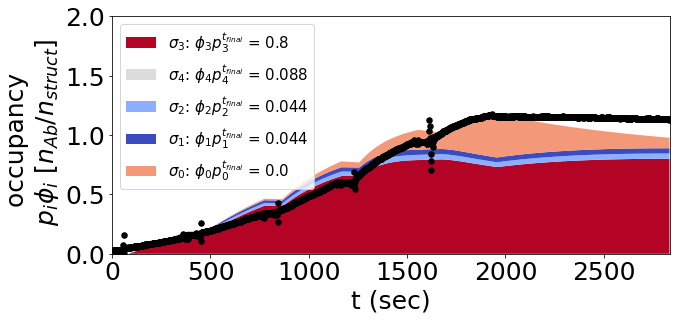

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.62600644e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.21112226]))
basinhopping step 0: f 339.948
basinhopping step 1: f 339.948 trial_f 339.948 accepted 1  lowest_f 339.948
found new global minimum on step 1 with function value 339.948
('iggdig_3nm', [-1.2921990895037083, 1.3033409600350436])


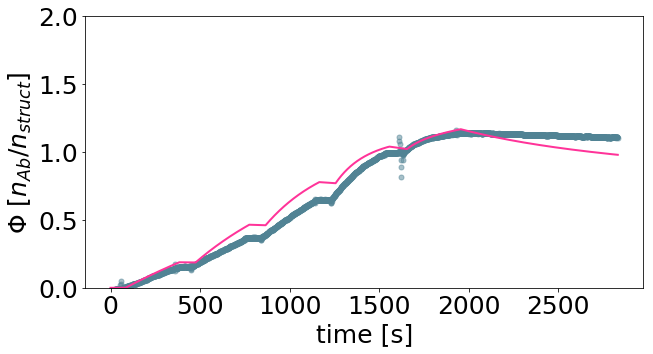

[ 0.0510271 20.1067075]


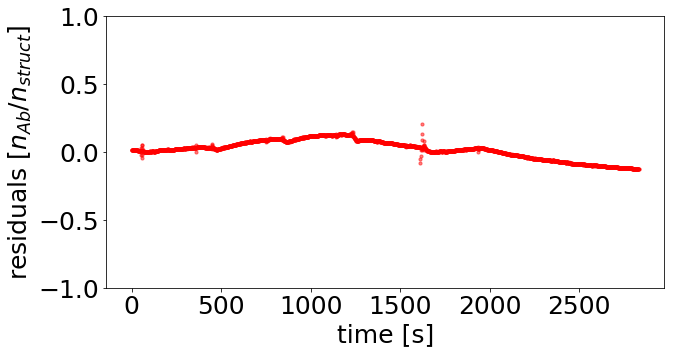

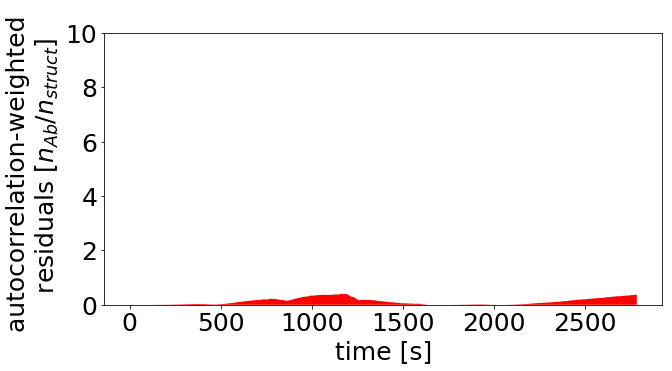

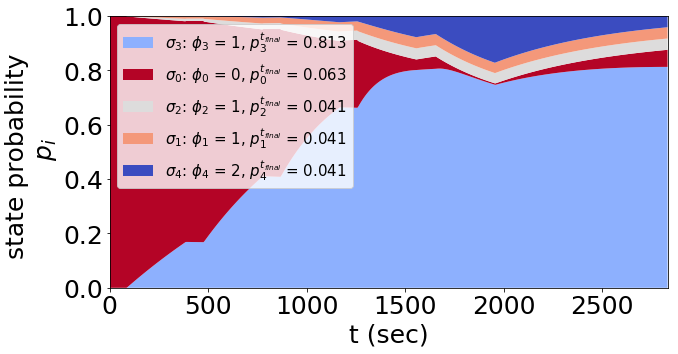

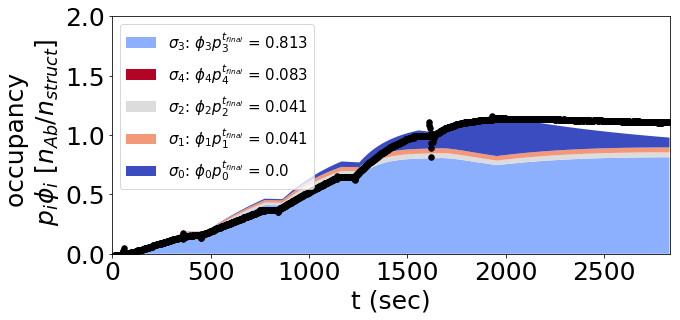

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.84588619e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26620492]))
basinhopping step 0: f 12.2759
basinhopping step 1: f 12.2759 trial_f 12.2759 accepted 1  lowest_f 12.2759
found new global minimum on step 1 with function value 12.2759
('iggdig_7nm', [-2.0382689945943984, 1.3424040417789012])


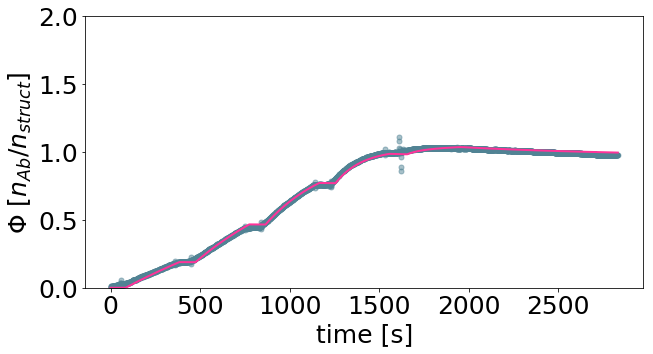

[9.15653174e-03 2.19990558e+01]


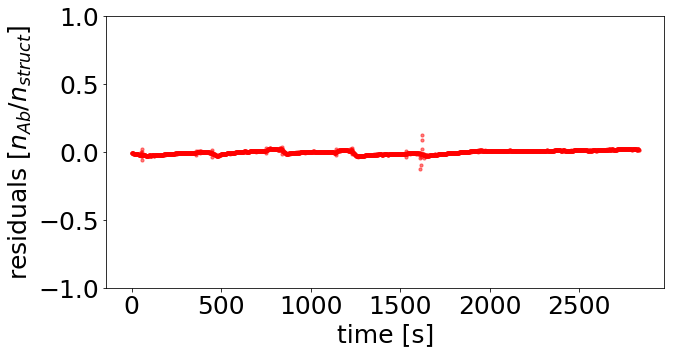

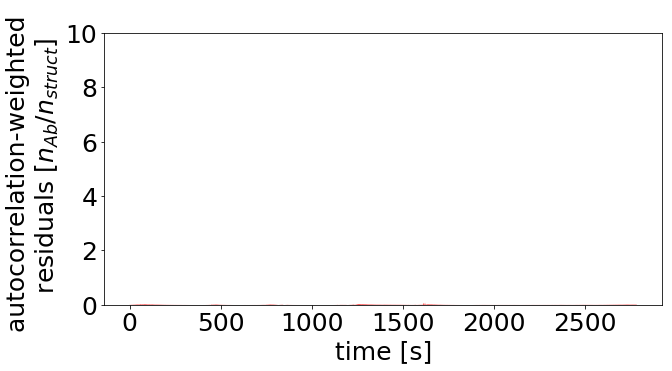

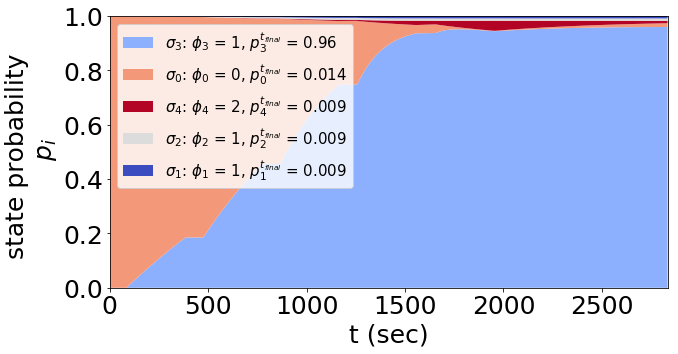

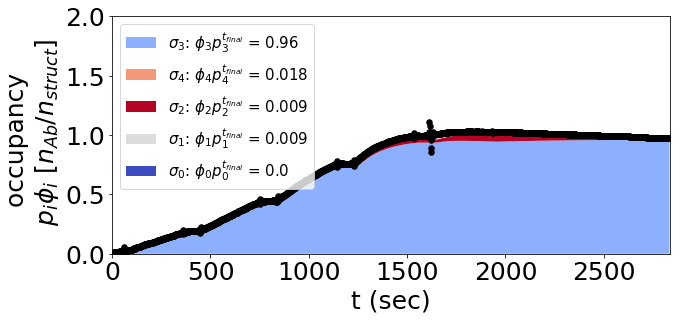

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.86106285e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26976104]))
basinhopping step 0: f 11.2153
basinhopping step 1: f 11.2153 trial_f 11.2153 accepted 1  lowest_f 11.2153
found new global minimum on step 1 with function value 11.2153
('iggdig_14nm1', [-1.8393676352174304, 1.3361335347711754])


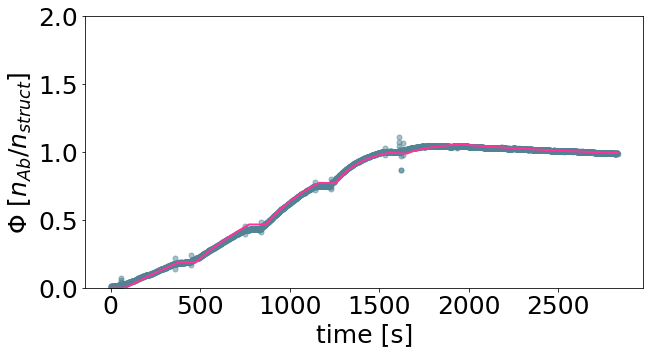

[1.44754597e-02 2.16837072e+01]


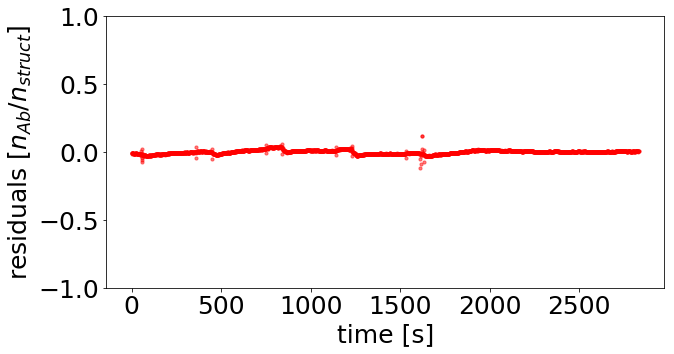

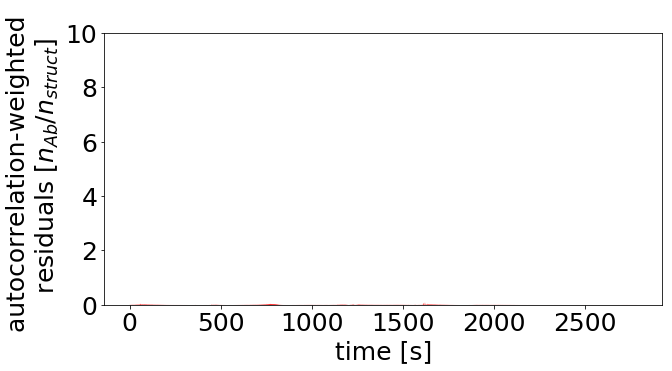

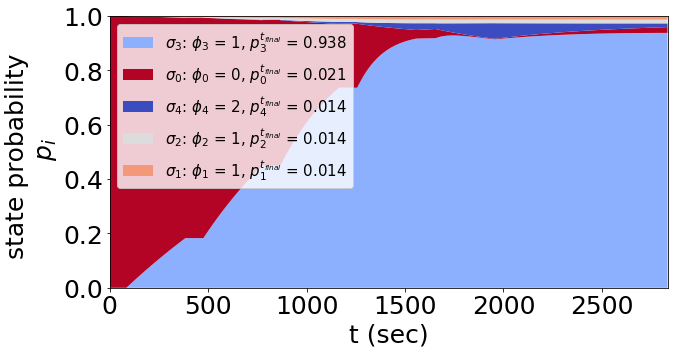

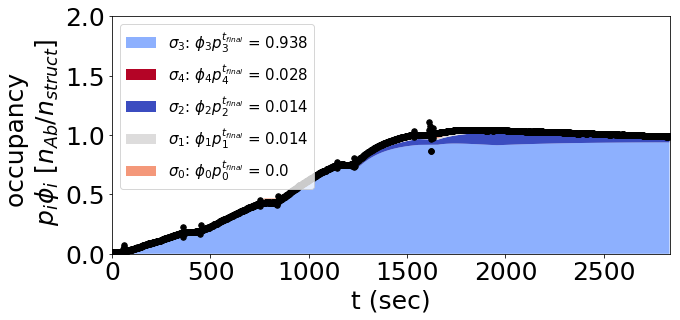

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83567607e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26379605]))
basinhopping step 0: f 23.4195
basinhopping step 1: f 23.4195 trial_f 23.4195 accepted 1  lowest_f 23.4195
('iggdig_14nm2', [-2.403760893433562, 1.348495308019489])


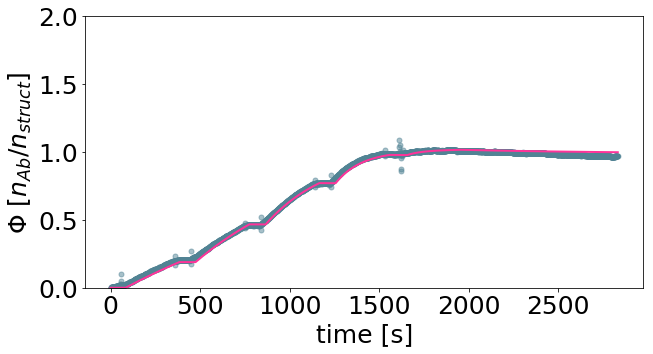

[3.94674536e-03 2.23097810e+01]


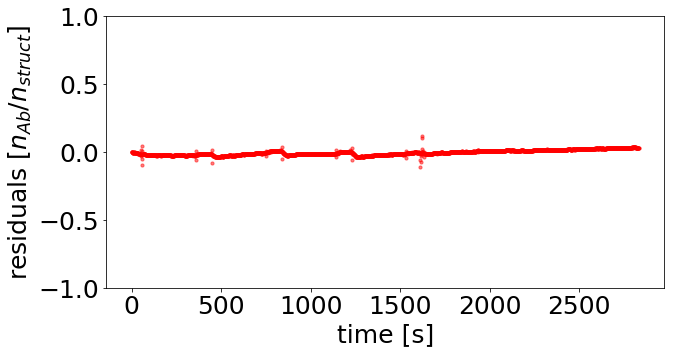

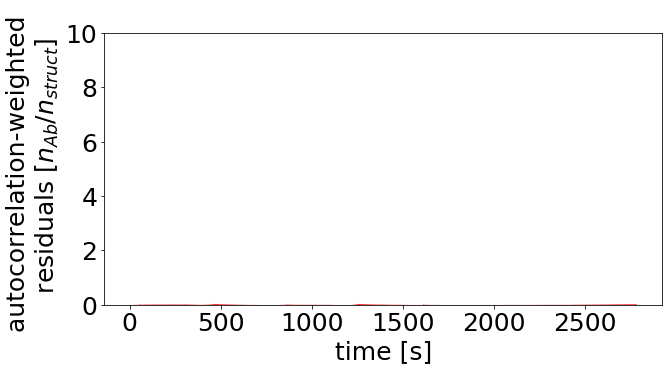

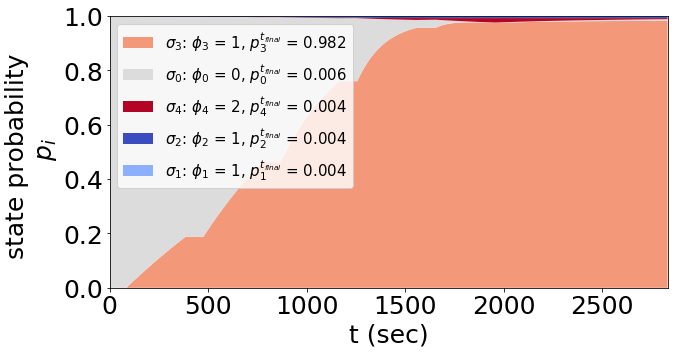

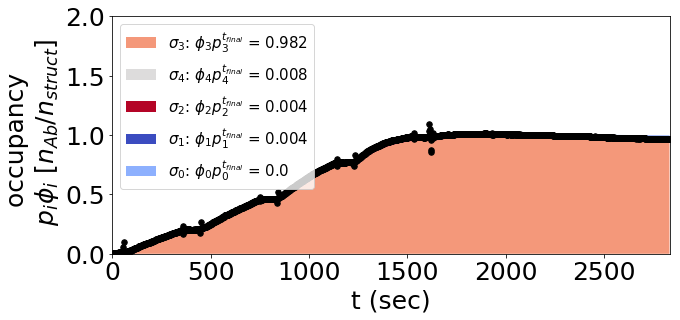

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.33492475e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12545679]))
basinhopping step 0: f 30.0762
basinhopping step 1: f 30.0762 trial_f 30.0762 accepted 1  lowest_f 30.0762
found new global minimum on step 1 with function value 30.0762
('iggdig_16nm', [-1.7343427158165117, 1.2238469111167176])


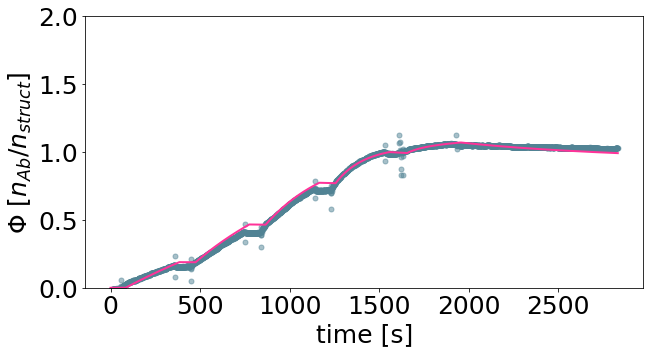

[ 0.0184356  16.74352562]


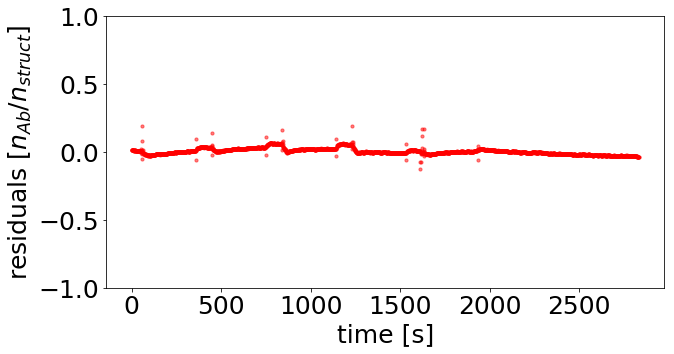

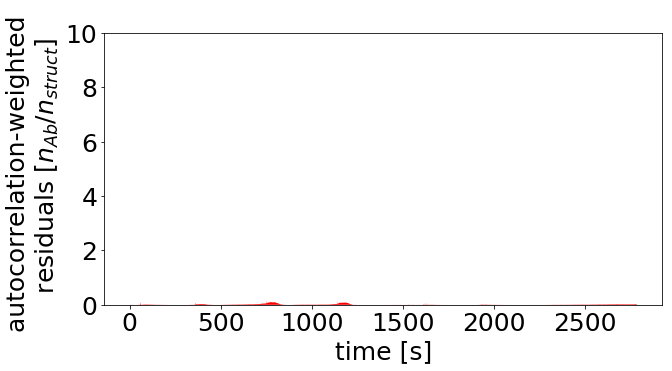

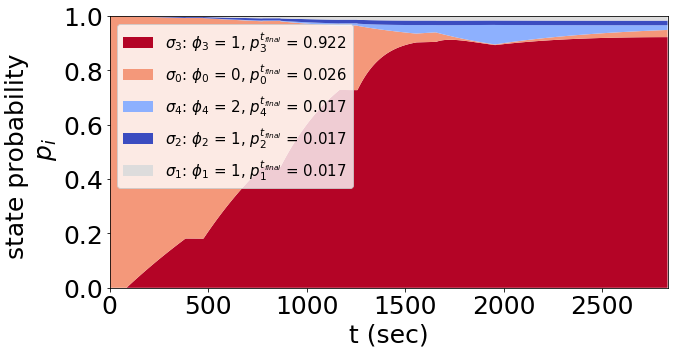

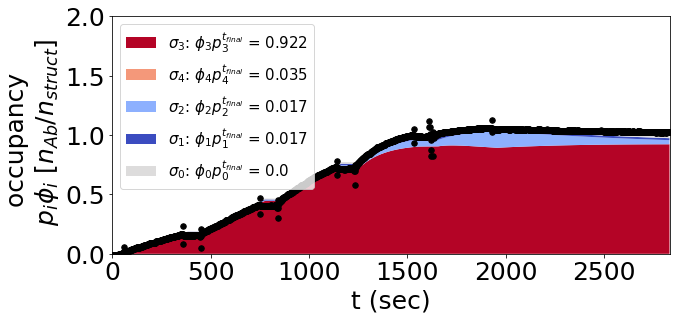

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.16488361e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.06628253]))
basinhopping step 0: f 872.467
basinhopping step 1: f 872.467 trial_f 872.467 accepted 1  lowest_f 872.467
('iggdig_17nm', [-1.0851420134854455, 0.9695279885678756])


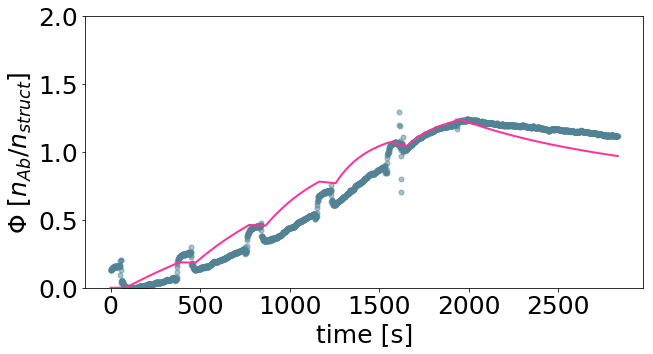

[0.08219738 9.32240548]


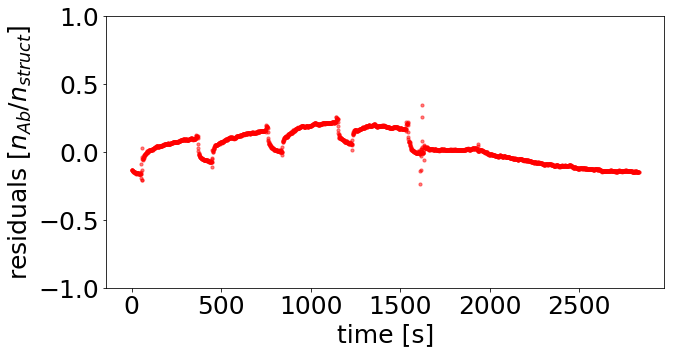

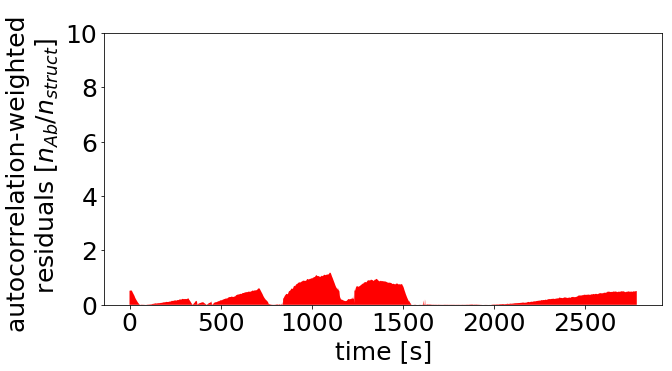

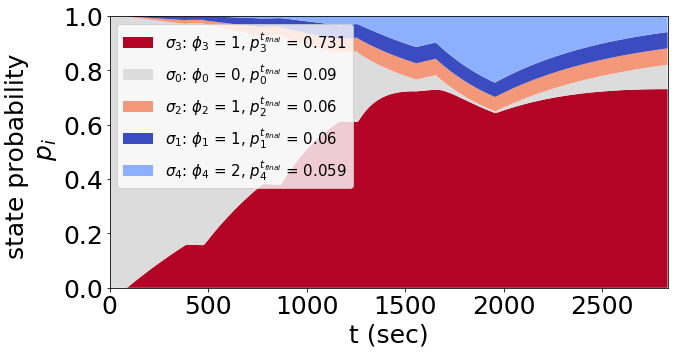

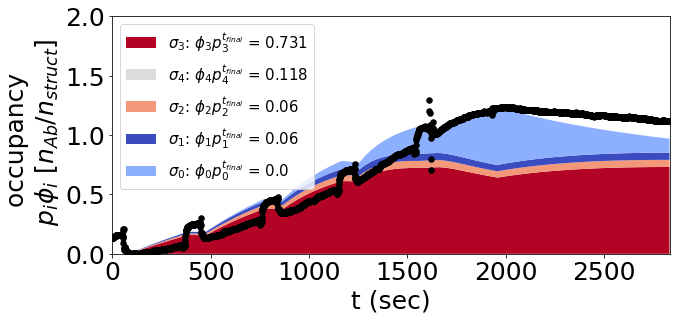

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.14104180e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.05730155]))
basinhopping step 0: f 32.8301
basinhopping step 1: f 32.8301 trial_f 32.8301 accepted 1  lowest_f 32.8301
found new global minimum on step 1 with function value 32.8301
('iggdig_21nm1', [-0.8723010829808021, 1.2975450502908348])


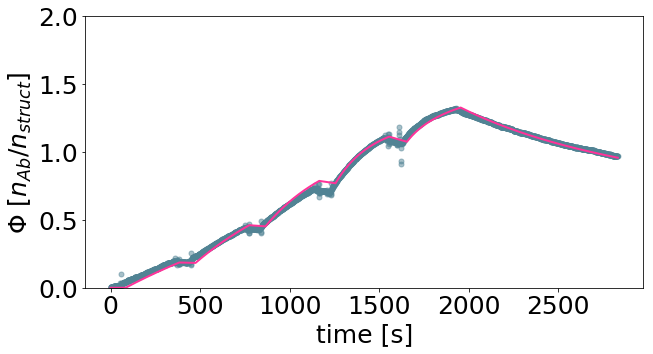

[ 0.13418344 19.84015452]


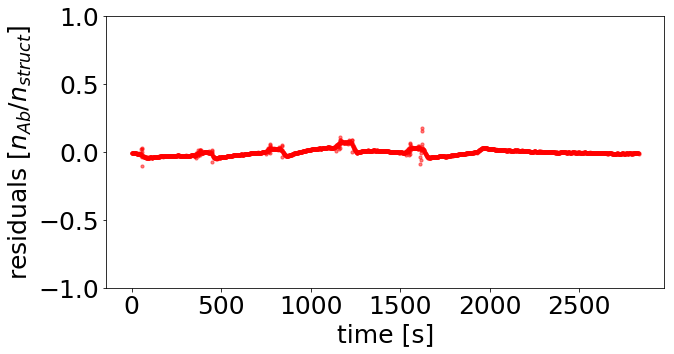

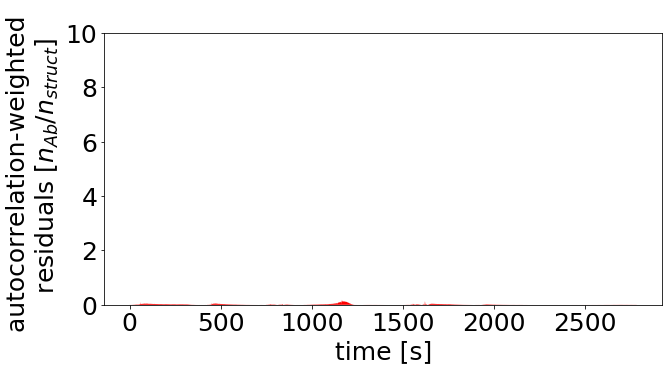

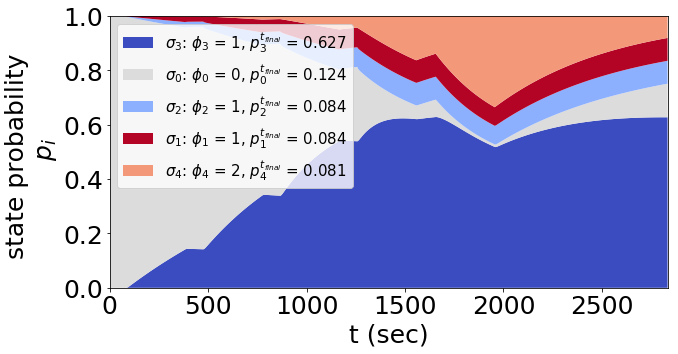

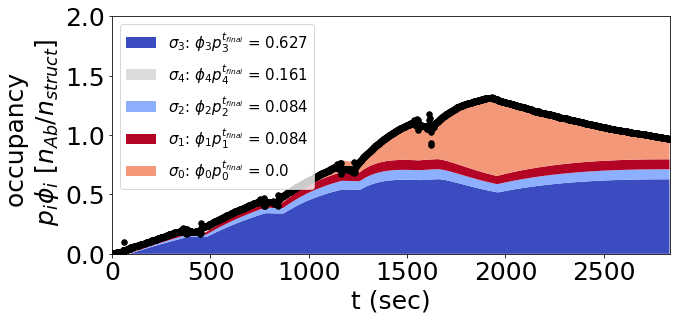

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.09660684e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04005095]))
basinhopping step 0: f 34.6278
basinhopping step 1: f 34.6278 trial_f 34.6278 accepted 1  lowest_f 34.6278
('iggdig_21nm2', [-0.8382056643530102, 1.2723923144885259])


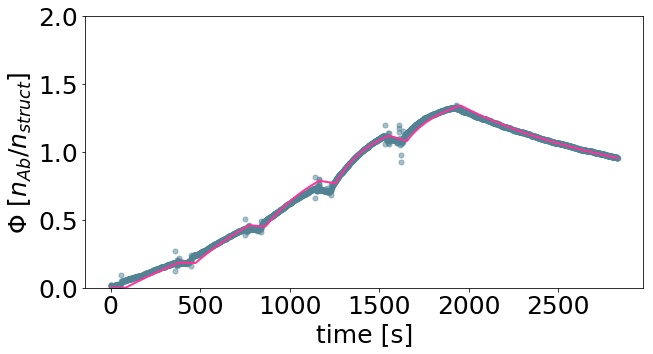

[ 0.14514241 18.72372761]


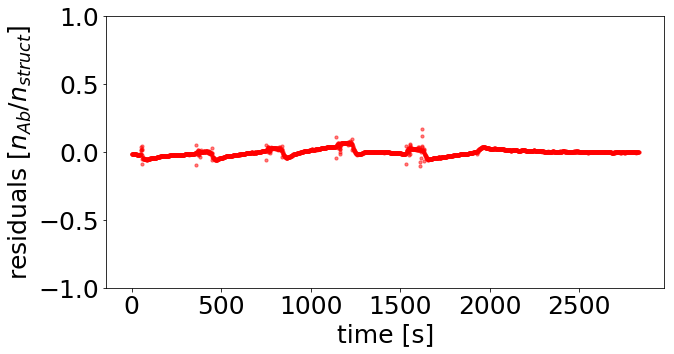

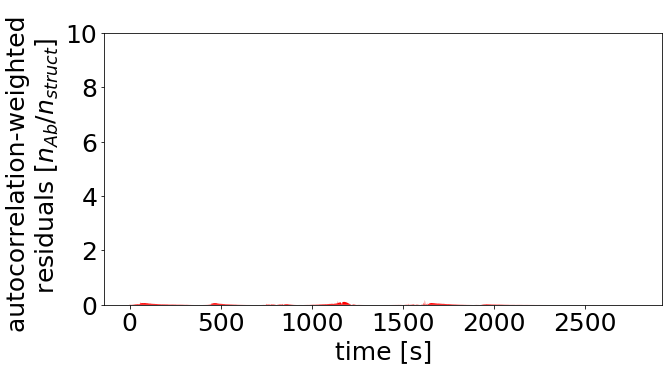

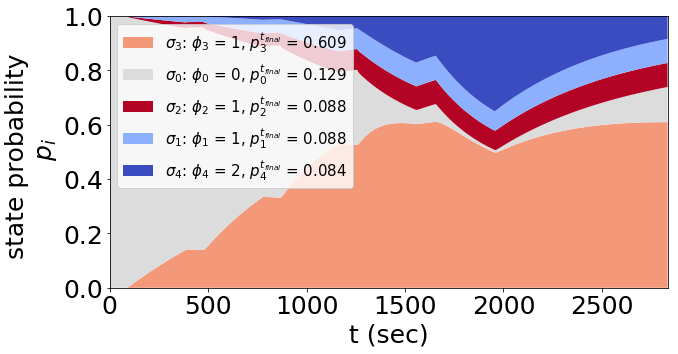

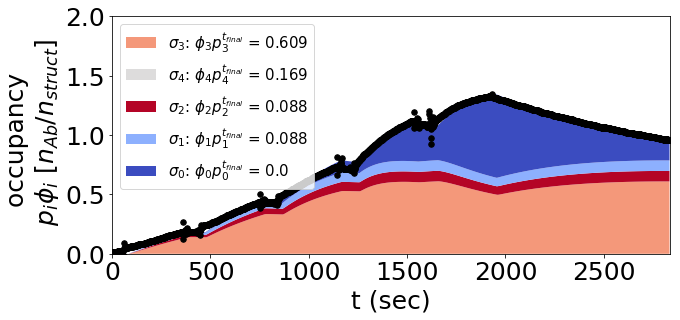

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.11305896e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.04651817]))
basinhopping step 0: f 99.3924
basinhopping step 1: f 99.3924 trial_f 99.3924 accepted 1  lowest_f 99.3924
('iggdig_21nm3', [-0.9652826097775337, 1.3231818103336679])


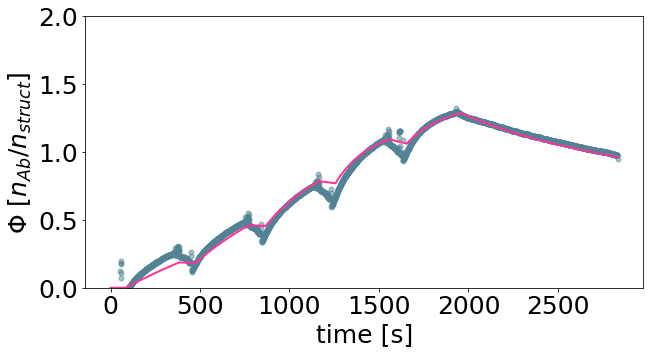

[ 0.10832218 21.04659337]


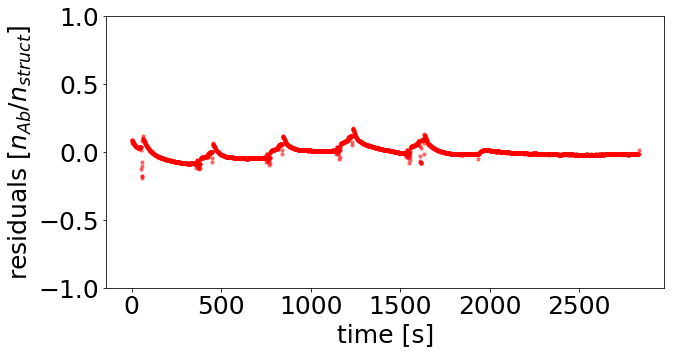

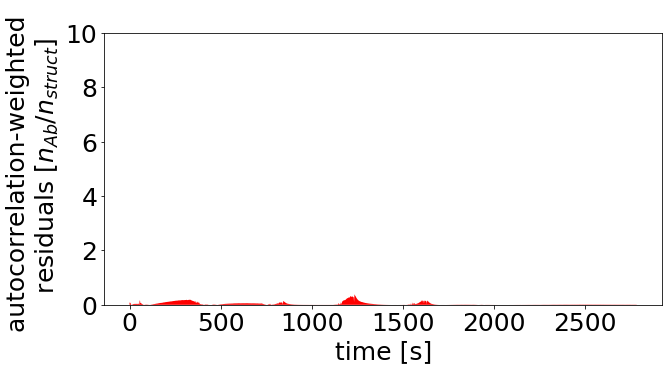

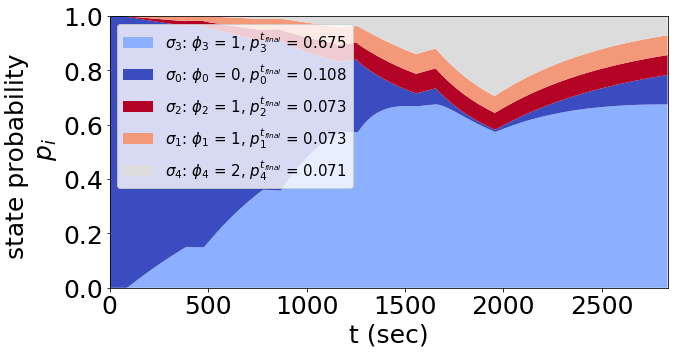

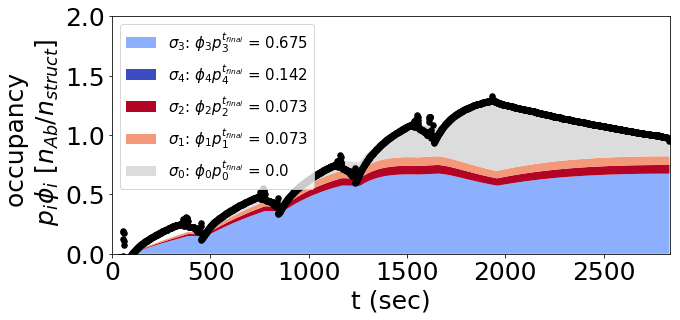

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.08656295e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.03605489]))
basinhopping step 0: f 180.705
basinhopping step 1: f 180.705 trial_f 180.705 accepted 1  lowest_f 180.705
('iggdig_28nm1', [-0.9346008031303995, 1.2767579398186073])


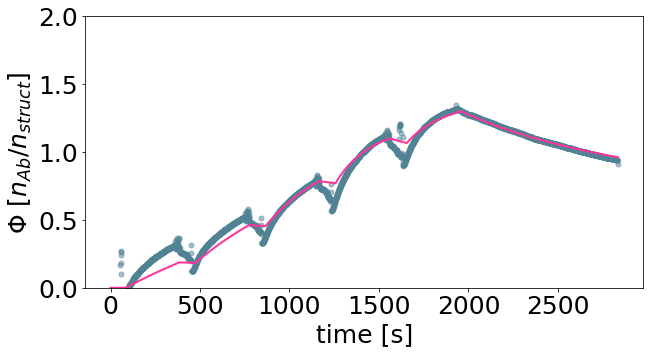

[ 0.11625167 18.91289188]


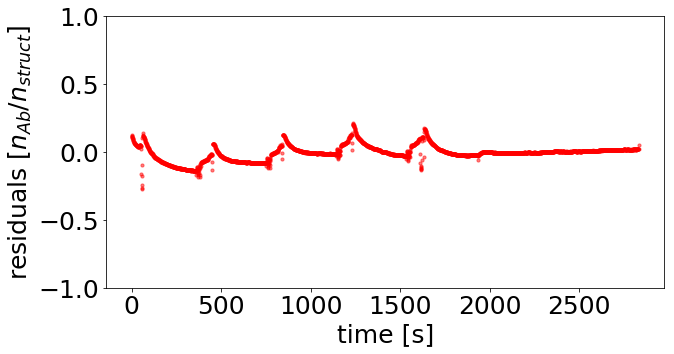

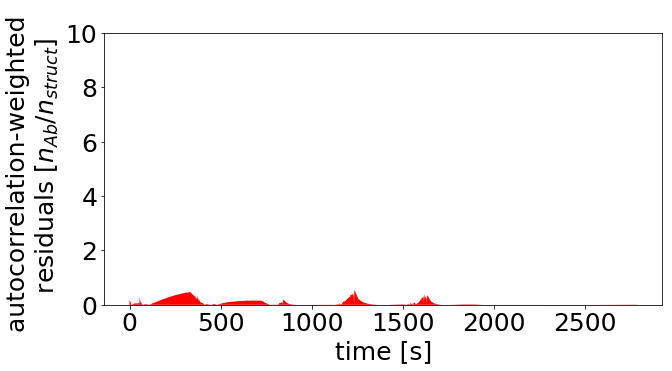

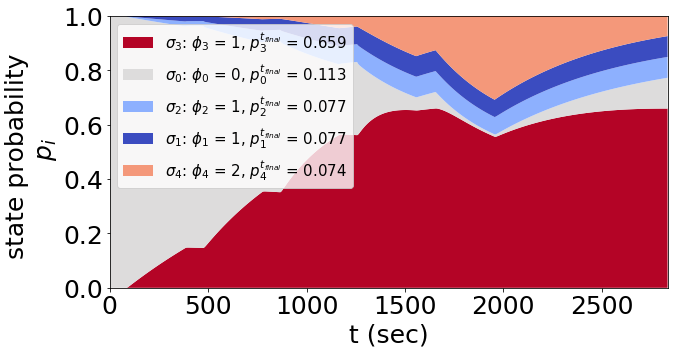

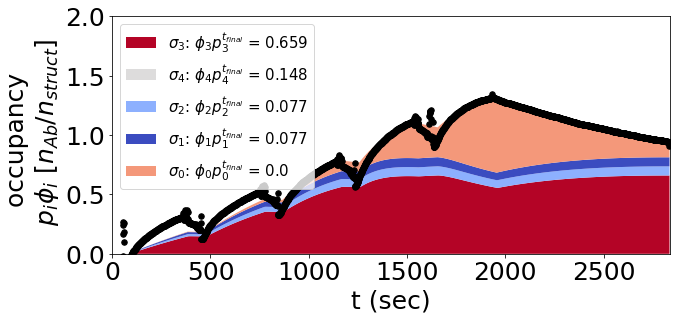

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.32182032e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.12117243]))
basinhopping step 0: f 115.903
basinhopping step 1: f 115.903 trial_f 115.903 accepted 1  lowest_f 115.903
('iggdig_28nm2', [-0.5477971015519875, 1.2781377224861812])


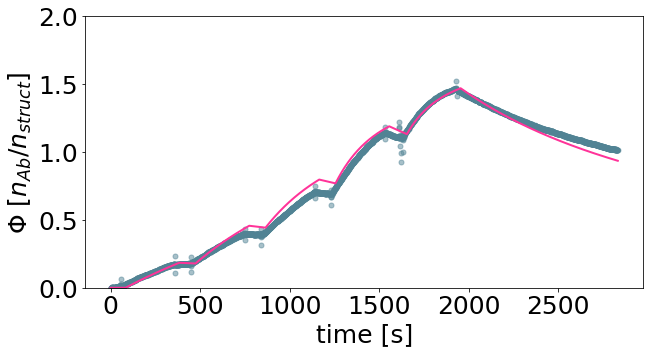

[ 0.28327151 18.97307496]


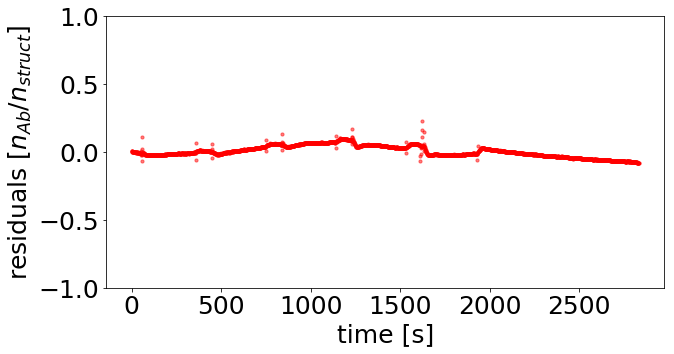

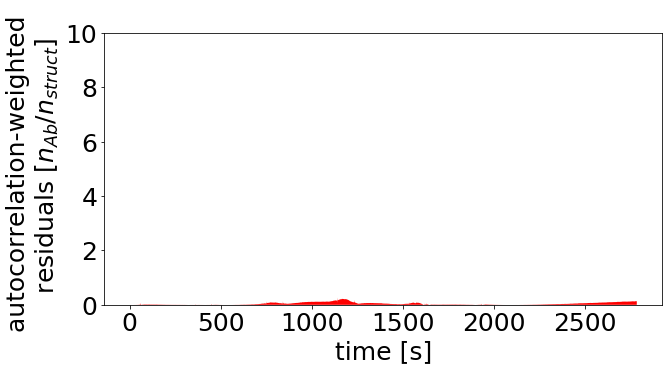

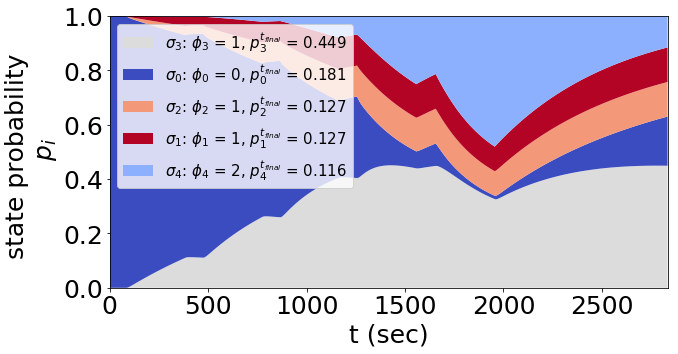

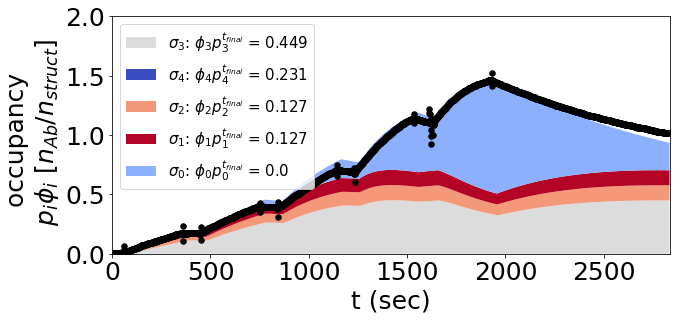

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.83584091e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.26383504]))
basinhopping step 0: f 28.1006
basinhopping step 1: f 28.1006 trial_f 28.1006 accepted 1  lowest_f 28.1006
('iggdig_42nm1', [-0.44866191809401357, 1.363058072404363])


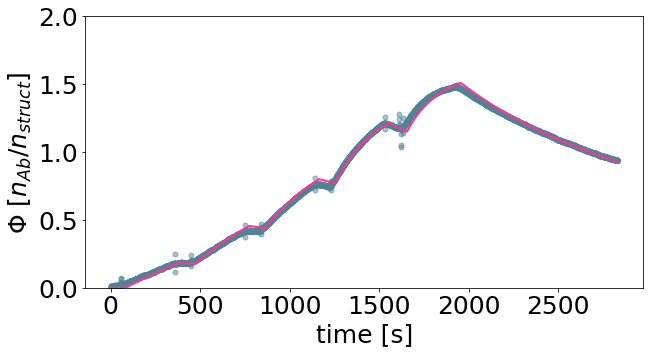

[ 0.35590827 23.0705566 ]


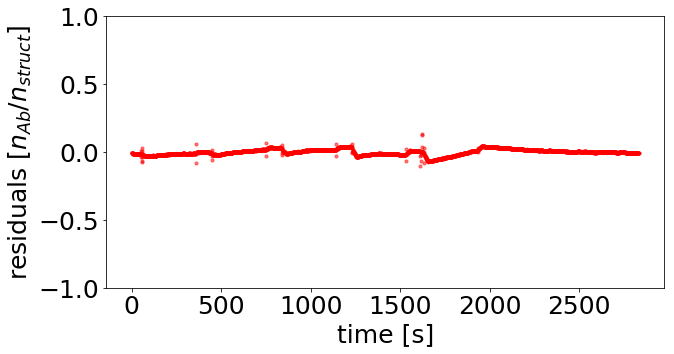

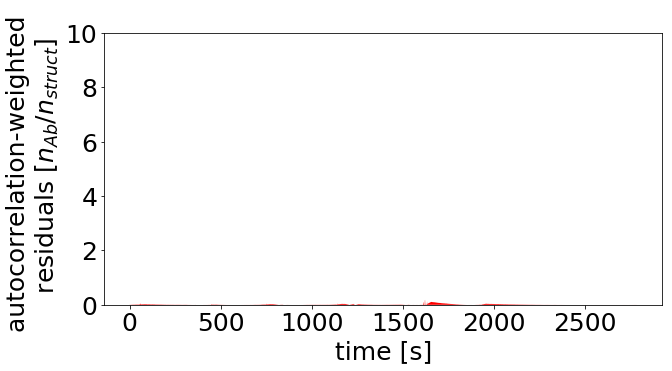

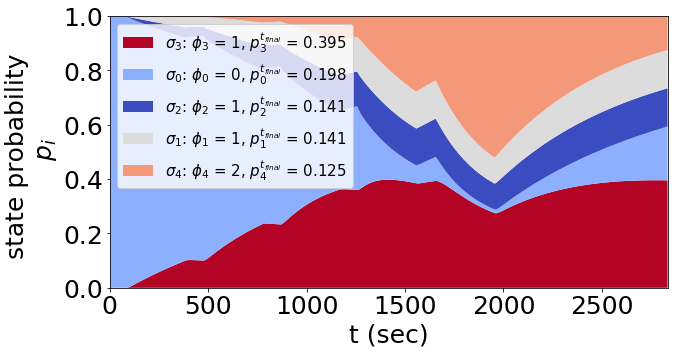

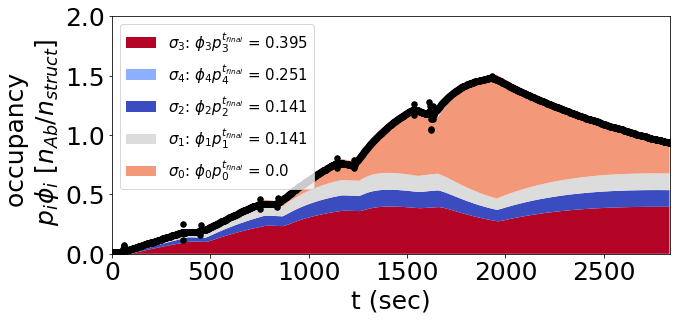

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.81904494e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.25984343]))
basinhopping step 0: f 62.734
basinhopping step 1: f 62.734 trial_f 62.734 accepted 1  lowest_f 62.734
found new global minimum on step 1 with function value 62.734
('iggdig_42nm2', [-0.5719313447751568, 1.387187226286344])


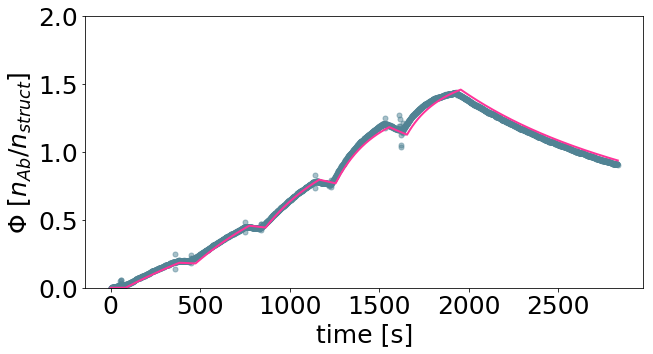

[ 0.26795919 24.38861996]


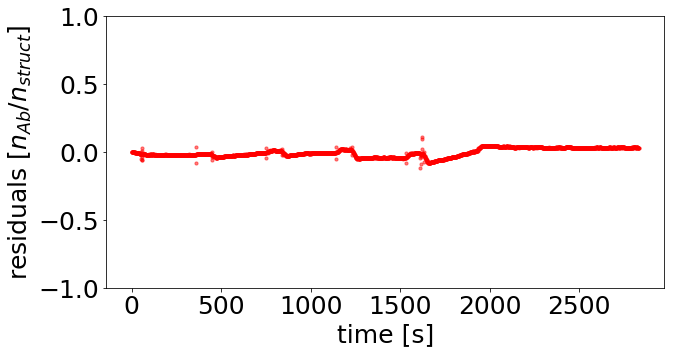

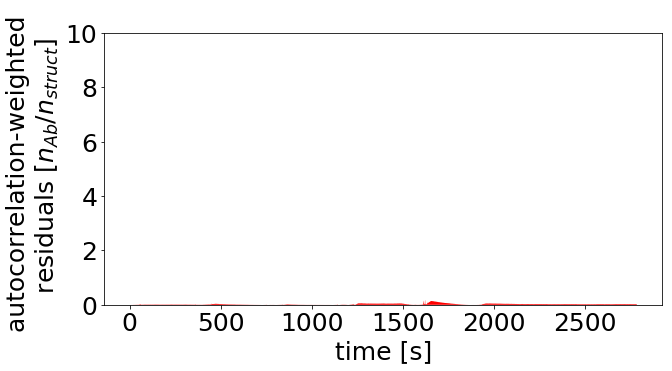

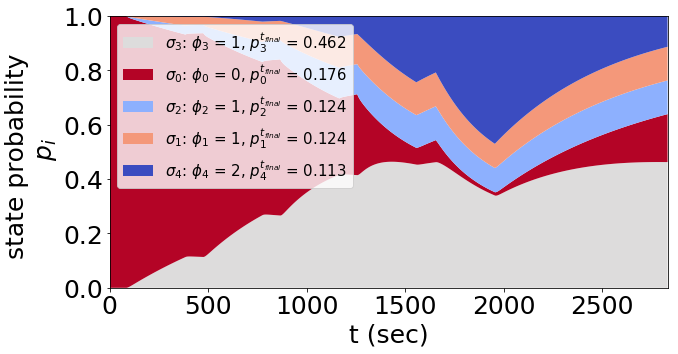

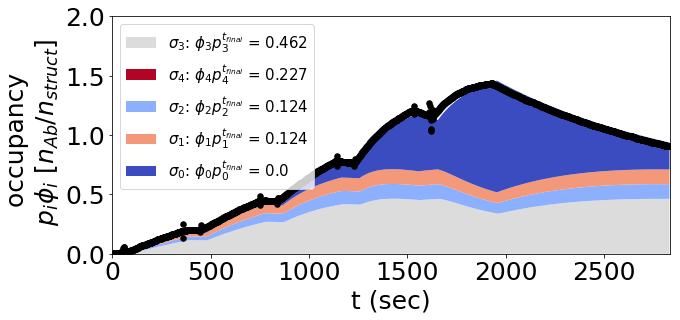

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.73861273e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.24020285]))
basinhopping step 0: f 65.4777
basinhopping step 1: f 65.4777 trial_f 65.4777 accepted 1  lowest_f 65.4777
found new global minimum on step 1 with function value 65.4777
('iggdig_84nm', [-0.4540311036537232, 1.4216422102267914])


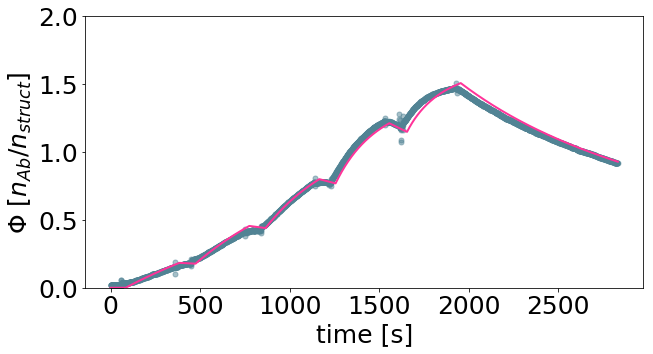

[ 0.35153526 26.40232728]


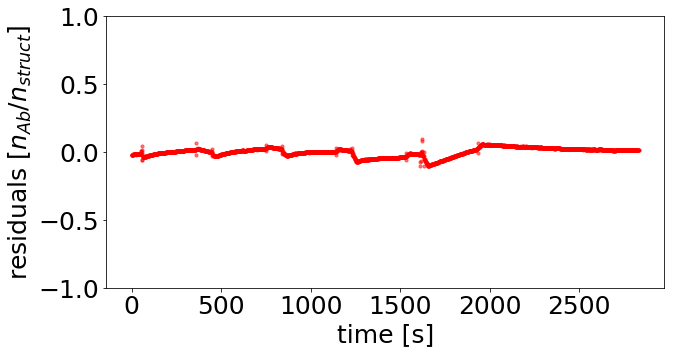

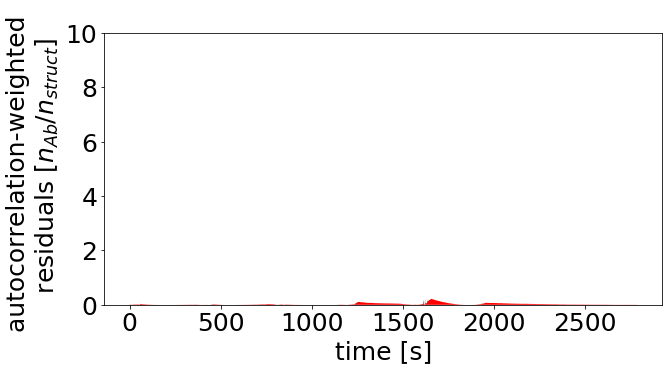

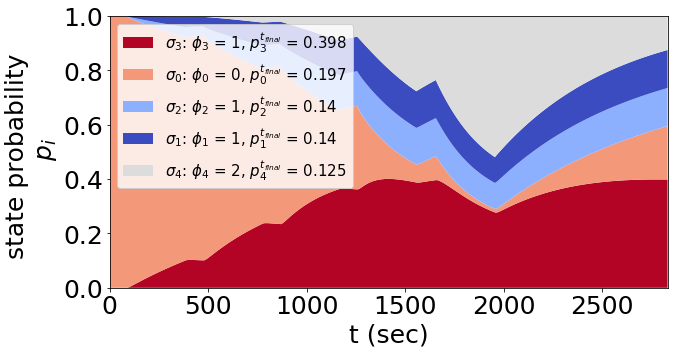

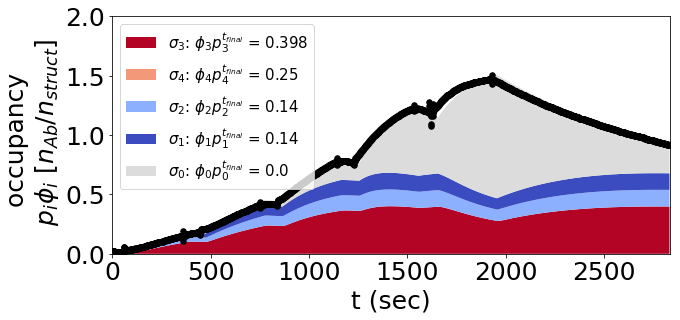

('(fit_annealing) variable parameter: ', array([4.64067252e-03, 1.91564101e+01]), 'log10 variable parameter: ', array([-2.33341908,  1.28231412]))
basinhopping step 0: f 41.4628
basinhopping step 1: f 41.4628 trial_f 41.4628 accepted 1  lowest_f 41.4628
('iggdig_99nm', [-0.8095273083154066, 1.4530636667031376])


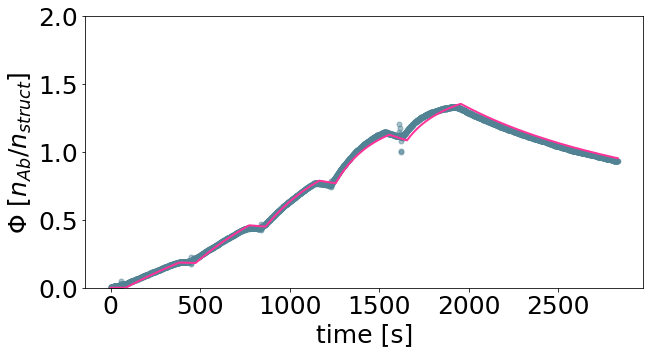

[ 0.15505033 28.38335092]


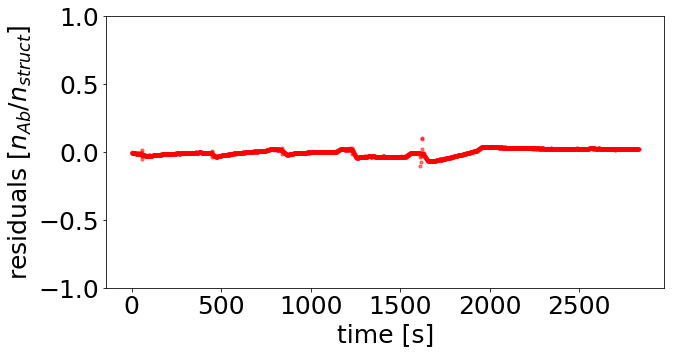

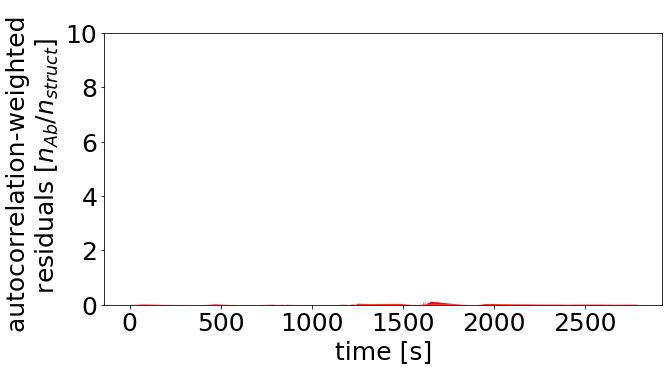

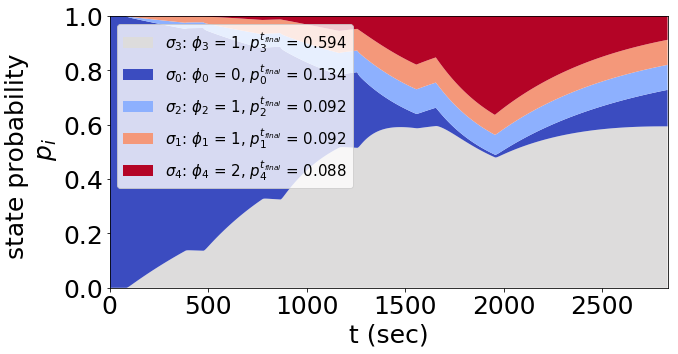

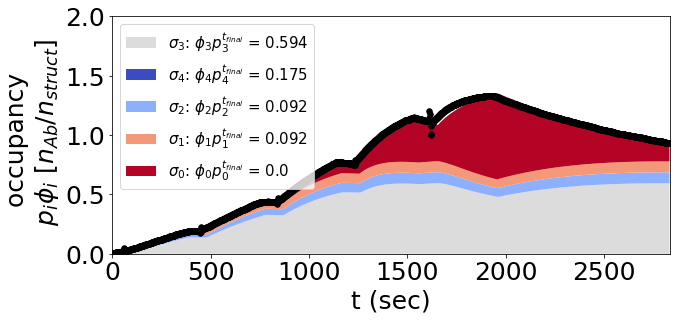

[array([-1.19836797,  1.22256167]), array([-1.25699469,  1.1360954 ]), array([-1.29219909,  1.30334096]), array([-2.03826899,  1.34240404]), array([-1.83936764,  1.33613353]), array([-2.40376089,  1.34849531]), array([-1.73434272,  1.22384691]), array([-1.08514201,  0.96952799]), array([-0.87230108,  1.29754505]), array([-0.83820566,  1.27239231]), array([-0.96528261,  1.32318181]), array([-0.9346008 ,  1.27675794]), array([-0.5477971 ,  1.27813772]), array([-0.44866192,  1.36305807]), array([-0.57193134,  1.38718723]), array([-0.4540311 ,  1.42164221]), array([-0.80952731,  1.45306367])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-1.19836797,  1.22256167]), array([-1.25699469,  1.1360954 ]), array([-1.29219909,  1.30334096]), array([-2.03826899,  1.34240404]), array([-1.83936764,  1.33613353]), array([-2.40376089,  1.34849531]), array([-1.73434272,  1.22384691]), array([-1.08514201,  0.96952799]), array([-0.87230108,  1.29754505]), array([-0.83820566,  1.27239231]),

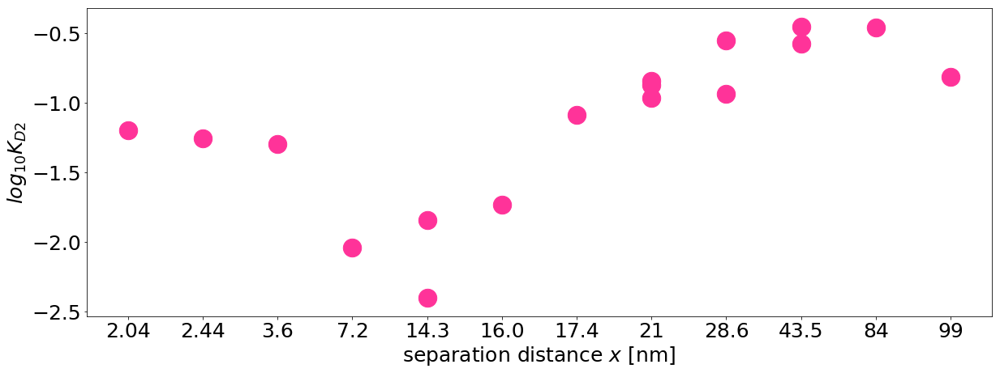

In [68]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_lower68"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_glower68, k_off_glower68]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/august_2018_iggdig_data/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/august_2018_iggdig_data/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_lower68 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_lower68)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_lower68).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_lower68,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

## apparent binding constants - using analytical conversion from the markov KD2 - upper 95 KD1 input

9.49
[23.47712225  0.24100982  1.28575639  0.21431651  0.3585134 ]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.2 (x - 23.5 nm)}} + 0.3e^{-0.2 (x- 1.3 nm)}  \huge}$$

0.23639511950798137


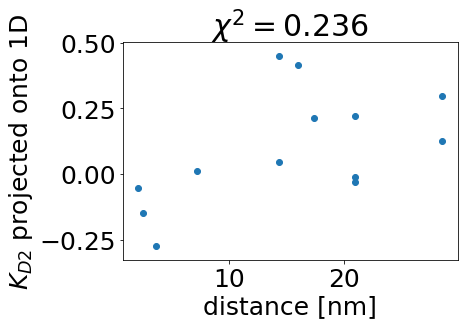

In [69]:


import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_upper95).T[0][0:]
data_upper95 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")
output_directory = master_name+"/output_SPATOL_model_figures"        
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_upper95 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1 = k_off/(k_on*10**9)
KD2 = combine_fine_upper95
KD2_data = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1*0.1,KD1, KD2)
K_Dapp_data = apparent_KD(KD1*0.1,KD1, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_upper95)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.savefig(output_directory+"/chisquared.svg")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - upper 68 KD1 input

10.03
[22.52379597  0.29652184  1.14111766  0.23868333  0.33244491]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.3 (x - 22.5 nm)}} + 0.3e^{-0.2 (x- 1.1 nm)}  \huge}$$

0.23966871924321115


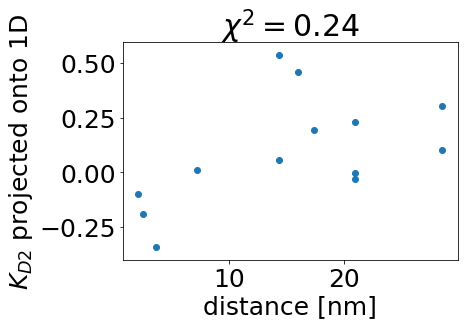

In [70]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_upper68).T[0][0:]
data_upper68 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_upper68 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1 = k_off/(k_on*10**9)
KD2 = combine_fine_upper68
KD2_data = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1*0.1,KD1, KD2)
K_Dapp_data = apparent_KD(KD1*0.1,KD1, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_upper68)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - lower 95 KD1 input

10.15
[21.70906068  0.426       0.61815764  0.426       0.2843578 ]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 21.7 nm)}} + 0.3e^{-0.4 (x- 0.6 nm)}  \huge}$$

0.4326307589822649


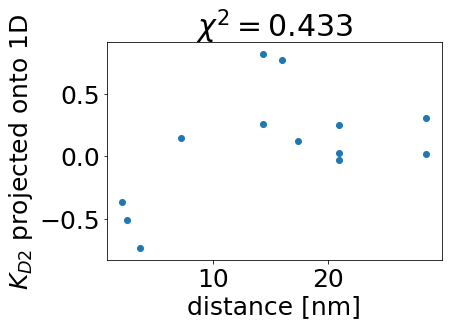

In [71]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_lower95).T[0][0:]
data_lower95 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_lower95 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1 = k_off/(k_on*10**9)
KD2 = combine_fine_lower95
KD2_data_lower95 = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1*0.1,KD1, KD2)
K_Dapp_data = apparent_KD(KD1*0.1,KD1, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_lower95)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - lower 68 KD1 input

10.56
[21.44098324  0.426       0.85197695  0.3385897   0.29587024]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 21.4 nm)}} + 0.3e^{-0.3 (x- 0.9 nm)}  \huge}$$

0.368807846980258


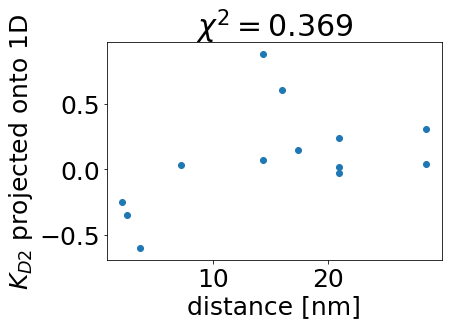

In [72]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_lower68).T[0][0:]
data_lower68 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_lower68 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1 = k_off/(k_on*10**9)
KD2 = combine_fine_lower68
KD2_data_lower68 = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1*0.1,KD1, KD2)
K_Dapp_data = apparent_KD(KD1*0.1,KD1, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_lower68)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - MEAN KD1 input

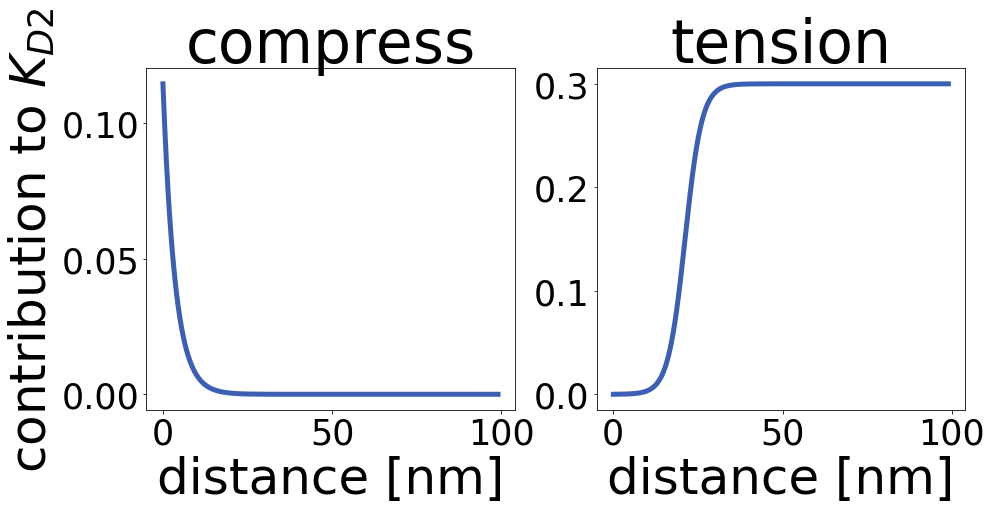

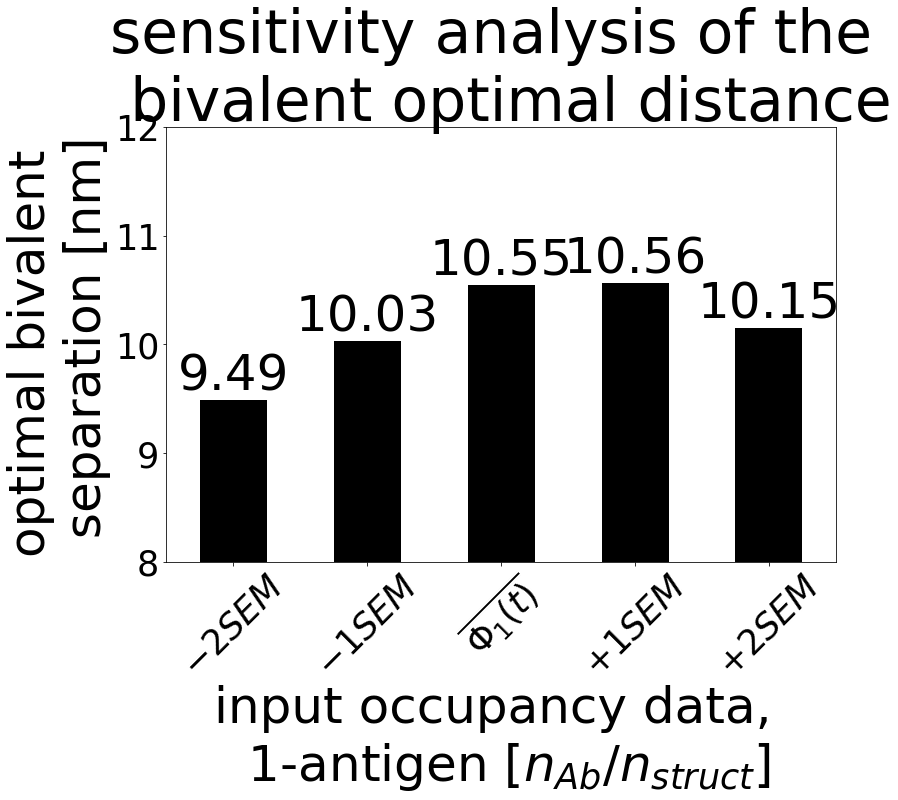

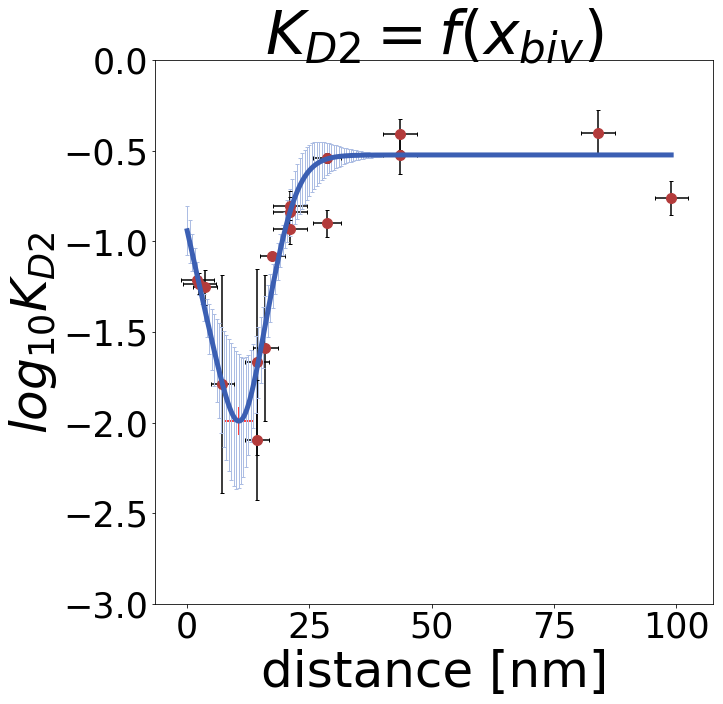

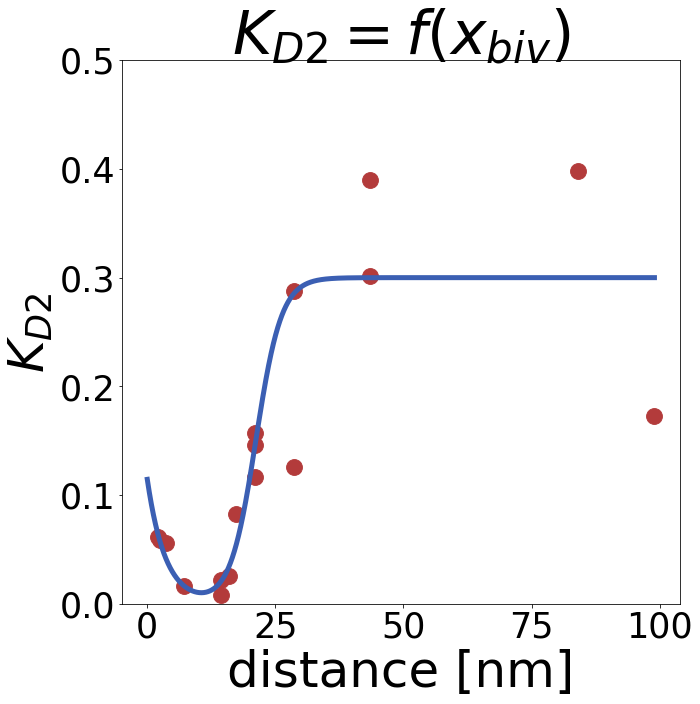

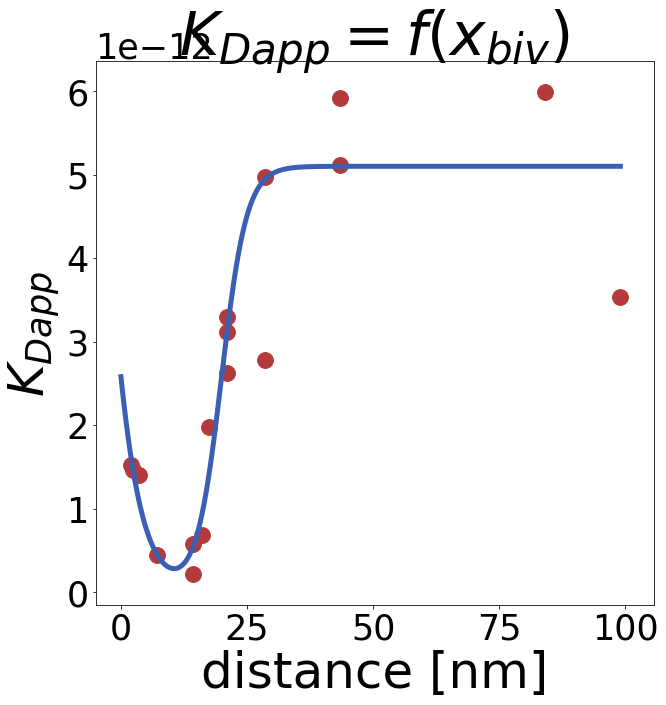

10.55
[21.18467314  0.39937231  0.96408494  0.27996357  0.30229863]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 21.2 nm)}} + 0.3e^{-0.3 (x- 1.0 nm)}  \huge}$$

0.9876854442742211


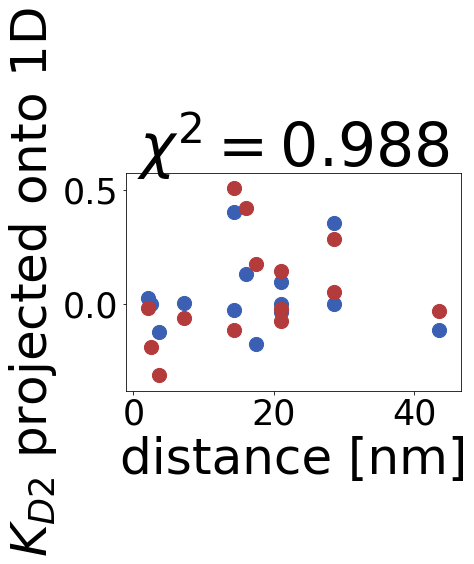

In [100]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_mean).T[0][0:]


if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1 = k_off/(k_on*10**9)
KD2 = combine_fine
KD2_data = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1*0.1,KD1, KD2)
K_Dapp_data = apparent_KD(KD1*0.1,KD1, KD2_data)

mindists = [distances_fine[np.argmin(combine_fine_upper95)],
            distances_fine[np.argmin(combine_fine_upper68)],
            distances_fine[np.argmin(combine_fine)],
            distances_fine[np.argmin(combine_fine_lower68)],
            distances_fine[np.argmin(combine_fine_lower95)],]
input_intervals = ["$-2SEM$","$-1SEM$","$\\overline{\\Phi_1 (t)}}$","$+1SEM$","$+2SEM$"]


plt.rc('xtick', labelsize=35) 
plt.rc('ytick', labelsize=35) 
plt.rcParams.update({'font.size': 50})

plt.figure(figsize=(20,7))
plt.subplot(131)
plt.tight_layout()

plt.plot(distances_fine,compression_fine,c="#3b5fb3", linewidth=5)
plt.title("compress")
plt.ylabel("contribution to $K_{D2}$")
plt.xlabel("distance [nm]")
plt.subplot(132)
plt.title("tension")
plt.plot(distances_fine,tension_fine,c="#3b5fb3", linewidth=5)
plt.xlabel("distance [nm]")

plt.savefig(output_directory+"/ compression_stretch_curves.svg")
plt.show()
plt.close()

# plt.bar(input_intervals,mindists)
# plt.bar_label(np.round(mindists,1), rotation = 45)
# plt.ylim(8,12)
# plt.ylabel("optimal bivalent \n separation [nm]")
# plt.title("input occupancy data, \n 1-antigen [$n_{Ab}/n_{struct}$]")
# plt.savefig(output_directory+"/ sensitivity_of_minima.svg")
# plt.show()
# plt.close()


import pandas as pd
freq_series = pd.Series(mindists)
plt.figure(figsize=(12, 8))
ax = freq_series.plot(kind="bar", colormap="Greys_r", ylim = (8,12))
ax.set_title("sensitivity analysis of the \n bivalent optimal distance")
ax.set_xlabel("input occupancy data, \n 1-antigen [$n_{Ab}/n_{struct}$]")
ax.set_ylabel("optimal bivalent \n separation [nm]")
ax.set_xticklabels(input_intervals, rotation=45)

rects = ax.patches

labels = mindists

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height, label, ha="center", va="bottom"
    )

plt.savefig(output_directory+"/ sensitivity_of_minima.svg")
plt.show()
plt.close()












plt.figure(figsize=(10,10))
# plt.plot(distances,combine,c="red")
plt.title("$K_{D2} = f(x_{biv})$")
plt.ylabel("$log_{10} K_{D2}$")
plt.xlabel("distance [nm]")
plt.errorbar(distances,data, 
             yerr=(np.max([data-data_upper95,data-data_lower95],0)),
             xerr=(dist_errors*2),
             alpha = 1,marker="o", ms = 10, c = "#b33b3b",ls="none",ecolor="k",capsize=2.0)
plt.errorbar(distances_fine,np.log10(combine_fine),
             yerr = (np.max([np.log10(combine_fine)-np.log10(combine_fine_upper95),np.log10(combine_fine)-np.log10(combine_fine_lower95)],0) ),
             c="#3b5fb3",
             linewidth=5,
             ecolor="#acbde3",
            errorevery=50,
            elinewidth=1,capsize=2.0)
plt.scatter([distances_fine[np.argmin(combine_fine)]],[np.min(np.log10(combine_fine))],s=800, c="red", marker="+")

plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
plt.ylim(-3,0)
plt.show()
plt.close()

plt.figure(figsize=(10,10))
# plt.plot(distances,combine,c="red")
plt.title("$K_{D2} = f(x_{biv})$")
plt.ylabel("$K_{D2}$")
plt.xlabel("distance [nm]")
plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#b33b3b")

plt.plot(distances_fine,combine_fine,c="#3b5fb3", linewidth=5)
plt.ylim(0,0.5)
plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
plt.show()
plt.close()

plt.figure(figsize=(10,10))
# plt.plot(distances,combine,c="red")
plt.title("$K_{Dapp} = f(x_{biv})$")
plt.ylabel("$K_{Dapp}$")
plt.xlabel("distance [nm]")
plt.plot(distances_fine,K_Dapp,c="#3b5fb3", linewidth=5)
plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#b33b3b")
plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
plt.show()
plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 3
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)
    moving_std_y[i] = np.sqrt(moving_std_y[i]/(sliding_window - 1))/sliding_window**.5
projection_1D = moving_average_y-data[0:-sliding_window]

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx




model_project_1D = [np.log10(combine_fine)[j] for j in [find_nearest(distances_fine, i) for i in distances]][0:-sliding_window] - data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], model_project_1D, s=200, c="#3b5fb3" )
plt.scatter(distances[0:-sliding_window], projection_1D, s=200, c="#b33b3b" )
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.savefig(output_directory+"/chisquared.svg")
plt.show()

   